In [1]:
import numpy as np
import pandas as pd
import pickle
import os 

from data_load import load_data
import matplotlib.pyplot as plt
%matplotlib inline

# path_data = "/nmnt/x01-hdd/HCP/data/"


path_data  = '/cobrain/groups/ml_group/data/HCP/HCP/'
connec , thinkness, log_jac, unique_labels, labels, mean_area_eq, idx_subj_connec = load_data(path_data)
# path_tria = '/cobrain/groups/ml_group/data/HCP/HCP/'
# name = "_200_mean_IC5.m"
# coord, tria = load_meshes_coor_tria(path_tria, name)
    


Connectomes:  (789, 2, 68, 68)
Thinkness:  (789, 2, 163842)
Log Jacob:  (789, 2, 163842)
Unique Labels:  (789, 2, 163842)
Mean Labels:  (2, 163842)
Mean Area eq:  (2, 163842)


In [5]:
thinkness = thinkness.reshape(789,-1)
log_jac = log_jac.reshape(789,-1)
labels = labels.reshape(-1).astype(int)
mean_area_eq = mean_area_eq.reshape(-1)

print(thinkness.shape, labels.shape, mean_area_eq.shape, log_jac.shape )

(789, 327684) (327684,) (327684,) (789, 327684)


In [6]:
idx_nodes = list(range(1,4)) + list(range(5,39)) + list(range(40,71))
idx_nodes = np.array(idx_nodes)
print(idx_nodes)
print(np.unique(labels))

[ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26
 27 28 29 30 31 32 33 34 35 36 37 38 40 41 42 43 44 45 46 47 48 49 50 51 52
 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70]
[ 0  1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25
 26 27 28 29 30 31 32 33 34 35 36 37 38 40 41 42 43 44 45 46 47 48 49 50 51
 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70]


In [15]:
Y = connec[:,0,:,:]

In [90]:
roi_thick = np.array([np.mean(thinkness[:,np.where(labels==node)[0]], axis = -1) for node in idx_nodes]).T


roi_area = np.array([np.sum(mean_area_eq[np.where(labels==node)[0]]*np.exp(log_jac[:,np.where(labels==node)[0]]),
                             axis = -1) 
                             for node in idx_nodes]).T
roi_vol = np.array([np.sum(mean_area_eq[np.where(labels==node)[0]]*np.exp(log_jac[:,np.where(labels==node)[0]]) * thinkness[:,np.where(labels == node)[0]],
                             axis = -1) 
                             for node in idx_nodes]).T

print(roi_area.shape, roi_thick.shape,roi_vol.shape)


(789, 68) (789, 68) (789, 68)


In [91]:

with open('meta_HCP_for_Ayagoz.csv', 'rb') as f:
    meta = pd.read_csv(f)

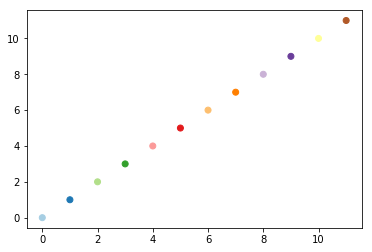

In [92]:
meta['Gender'] = meta['Gender'].astype('category')
meta['Age'] = meta['Age'].astype('category')
meta['Age'] = meta['Age'].cat.codes
meta["Gender"] = meta['Gender'].cat.codes

meta[15:20]

legend_gender = {'F':0, 'M':1}
legend_age = {'22-25':0, '26-30':1,'31-35':2, '36+':3}

color_gender = np.array(meta.Gender)
color_age = np.array(meta.Age)



from matplotlib import cm
cmap = plt.get_cmap('Paired')
plt.scatter(range(12), range(12), c = cmap.colors)

cmap_gender = dict(zip(color_gender, [cmap.colors[1], cmap.colors[5]]))
cmap_gender

cmap_age = {0: cmap.colors[1],
            1: cmap.colors[5],
            2: cmap.colors[3], 
            3: cmap.colors[9]}

c_age = [cmap_age[i] for i in color_age]
c_gender = [cmap_gender[i] for i in color_gender]

In [100]:
idx_women = np.where(np.array(meta.Gender) == 0)[0]
idx_men = np.where(np.array(meta.Gender) == 1)[0]

In [94]:
wdeg = Y.sum(axis = -1)

In [95]:
roi_thick.shape, wdeg.shape, roi_area.shape

((789, 68), (789, 68), (789, 68))

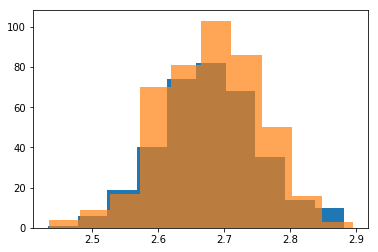

In [96]:
plt.hist(roi_thick[idx_men].mean(axis = -1))
plt.hist(roi_thick[idx_women].mean(axis = -1), alpha = 0.7);

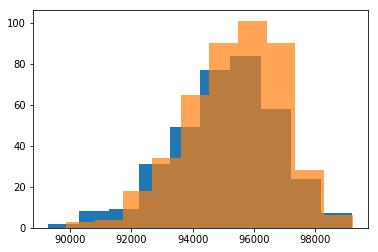

In [97]:
plt.hist(roi_area[idx_men].sum(axis = -1))
plt.hist(roi_area[idx_women].sum(axis = -1), alpha = 0.7);

In [102]:
np.mean(np.sum(roi_area[idx_men], axis = -1), axis = 0), np.mean(np.sum(roi_area[idx_women], axis = -1), axis = 0)

95089.141

In [104]:
np.mean(np.sum(roi_vol[idx_men], axis = -1), axis = 0), np.mean(np.sum(roi_vol[idx_women], axis = -1), axis = 0)

(249018.5, 249978.5)

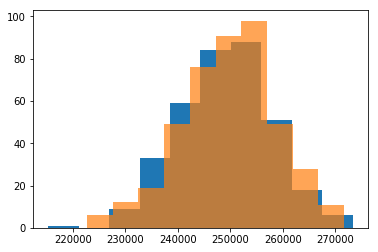

In [98]:
plt.hist(roi_vol[idx_men].sum(axis = -1))
plt.hist(roi_vol[idx_women].sum(axis = -1), alpha = 0.7);

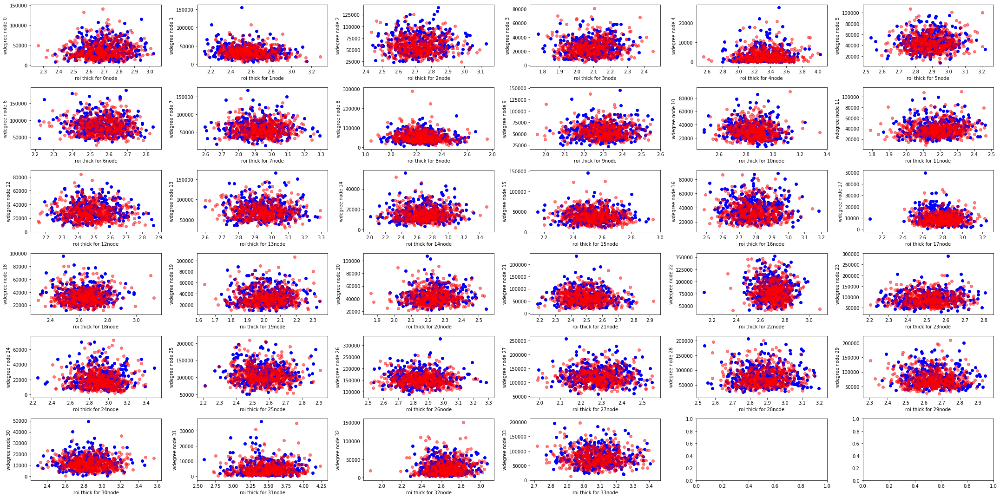

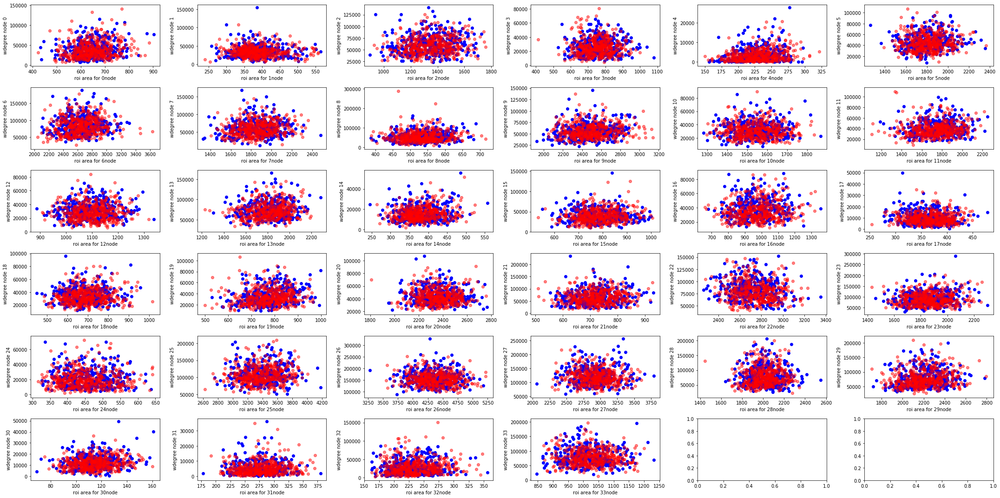

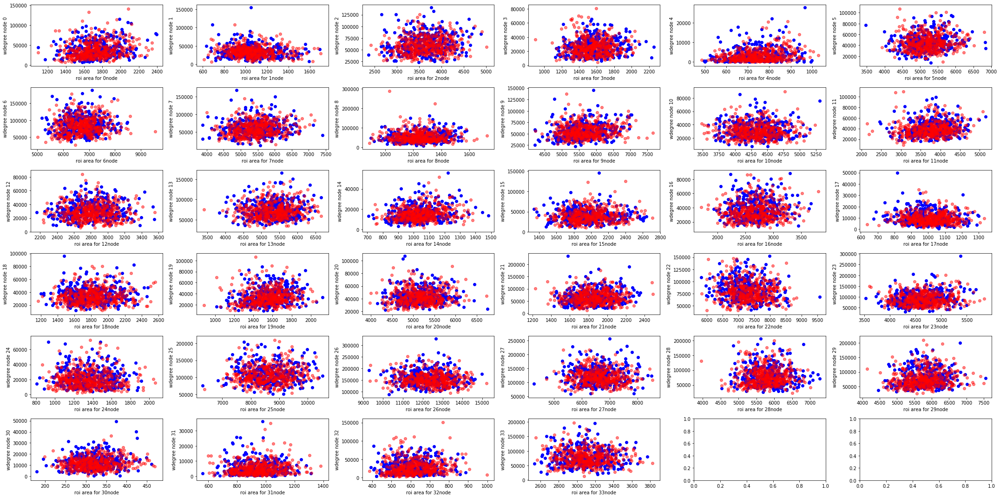

In [31]:
idx = np.arange(36).reshape(6,6)

fig, ax = plt.subplots(6,6, figsize = (30,15))
for i in range(6):
    for j in range(6):
        if i == 5:
            if j == 4:
                break
        ax[i, j].scatter(roi_thick[idx_men, idx[i,j]], wdeg[idx_men, idx[i,j]], c='b')
        
        ax[i, j].scatter(roi_thick[idx_women, idx[i,j]], wdeg[idx_women,idx[i,j]], c='r', alpha = 0.5)
        
        ax[i, j].set_xlabel('roi thick for ' + str(idx[i,j]) + 'node')
        ax[i, j].set_ylabel('wdegree node ' + str(idx[i,j]))
        
plt.tight_layout()
plt.savefig('thick_to_wdeg')
plt.show()

fig, ax = plt.subplots(6,6, figsize = (30,15))
for i in range(6):
    for j in range(6):
        if i == 5:
            if j == 4:
                break
        ax[i, j].scatter(roi_area[idx_men, idx[i,j]], wdeg[idx_men, idx[i,j]], c='b')
        
        ax[i, j].scatter(roi_area[idx_women, idx[i,j]], wdeg[idx_women,idx[i,j]], c='r', alpha = 0.5)
        
        ax[i, j].set_xlabel('roi area for ' + str(idx[i,j]) + 'node')
        ax[i, j].set_ylabel('wdegree node ' + str(idx[i,j]))
        
plt.tight_layout()
plt.savefig('area_to_wdeg')

plt.show()
fig, ax = plt.subplots(6,6, figsize = (30,15))
for i in range(6):
    for j in range(6):
        if i == 5:
            if j == 4:
                break
        ax[i, j].scatter(roi_vol[idx_men, idx[i,j]], wdeg[idx_men, idx[i,j]], c='b')
        
        ax[i, j].scatter(roi_vol[idx_women, idx[i,j]], wdeg[idx_women,idx[i,j]], c='r', alpha = 0.5)
        
        ax[i, j].set_xlabel('roi area for ' + str(idx[i,j]) + 'node')
        ax[i, j].set_ylabel('wdegree node ' + str(idx[i,j]))
        
plt.tight_layout()
plt.savefig('vol_to_wdeg')
plt.show()

In [64]:
norm_thick = (roi_thick.T/np.sum(roi_thick, axis = -1)).T
norm_thick.shape
a,b = min(norm_thick.reshape(-1)), max(norm_thick.reshape(-1))

In [65]:
a,b

(0.0089777671, 0.023957571)

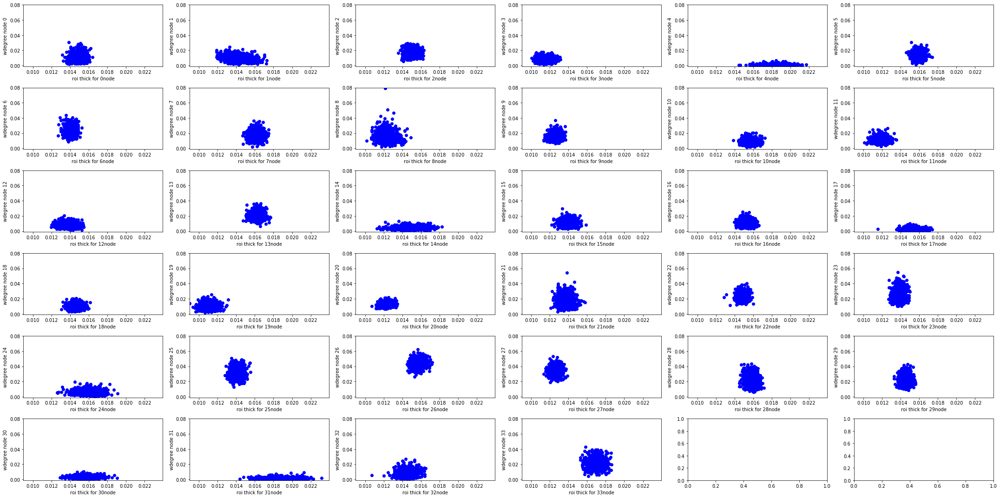

In [69]:
idx = np.arange(36).reshape(6,6)

fig, ax = plt.subplots(6,6, figsize = (30,15))
for i in range(6):
    for j in range(6):
        if i == 5:
            if j == 4:
                break
        ax[i, j].scatter(roi_thick[:, idx[i,j]]/np.sum(roi_thick,axis=-1), 
                         wdeg[:, idx[i,j]]/np.sum(wdeg, axis = -1), c='b')
        
        ax[i, j].set_xlabel('roi thick for ' + str(idx[i,j]) + 'node')
        ax[i, j].set_ylabel('wdegree node ' + str(idx[i,j]))
        ax[i, j].set_xlim([a,b])
        ax[i, j].set_ylim([-0.001, 0.08])
plt.tight_layout()
plt.savefig('norm_thick_to_wdeg')
plt.show()


In [50]:
norm_area = (roi_area.T/np.sum(roi_area, axis = -1)).T
norm_area.shape
a,b = min(norm_area.reshape(-1)), max(norm_area.reshape(-1))

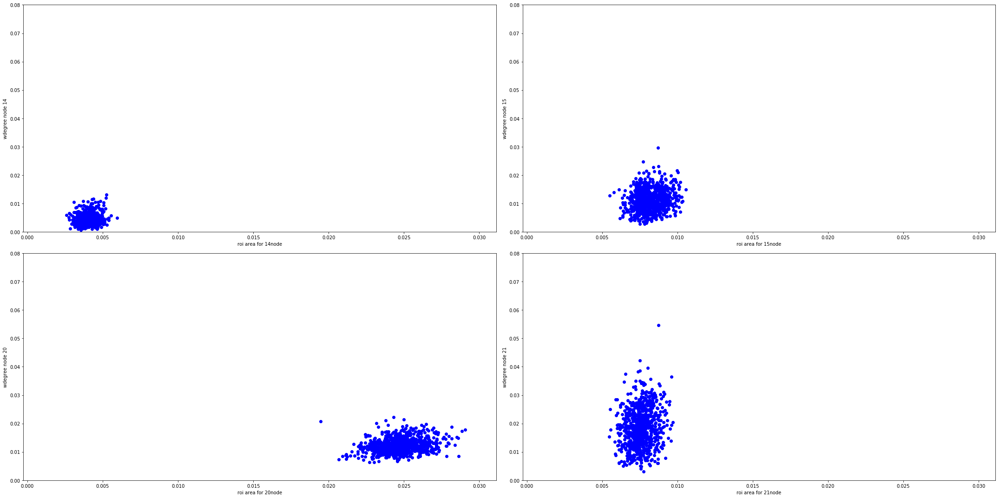

In [63]:
n = 2
fig, ax = plt.subplots(2, 2, figsize = (30,15))
for i in range(2):
    for j in range(2):
        if i == 5:
            if j == 4:
                break
        ax[i, j].scatter(roi_area[:, idx[i+n,j+n]]/np.sum(roi_area, axis = -1), 
                         wdeg[:, idx[i+n,j+n]]/np.sum(wdeg, axis = -1), c='b')
        
        ax[i, j].set_xlabel('roi area for ' + str(idx[i+n,j+n]) + 'node')
        ax[i, j].set_ylabel('wdegree node ' + str(idx[i+n,j+n]))
        ax[i, j].set_xlim([a-1e-3, b-0.03])
        ax[i, j].set_ylim([0, 0.08])
plt.tight_layout()
plt.savefig('norm_area_to_wdeg')


In [53]:
norm_vol = (roi_vol.T/np.sum(roi_vol, axis = -1)).T
norm_vol.shape
a,b = min(norm_vol.reshape(-1)), max(norm_vol.reshape(-1))

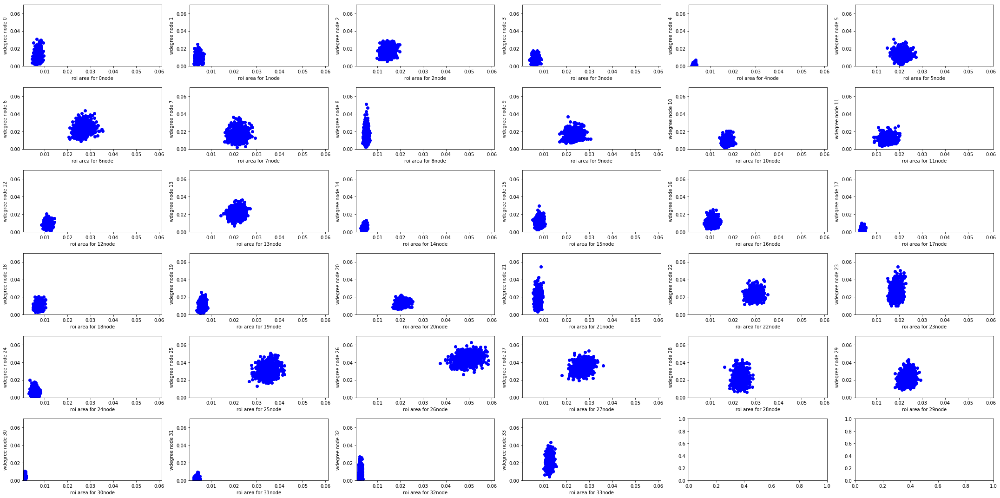

In [54]:

plt.show()
fig, ax = plt.subplots(6,6, figsize = (30,15))
for i in range(6):
    for j in range(6):
        if i == 5:
            if j == 4:
                break
        ax[i, j].scatter(roi_vol[:, idx[i,j]]/np.sum(roi_vol, axis = -1), wdeg[:, idx[i,j]]/np.sum(wdeg, axis = -1), c='b')
        
        ax[i, j].set_xlabel('roi area for ' + str(idx[i,j]) + 'node')
        ax[i, j].set_ylabel('wdegree node ' + str(idx[i,j]))
        ax[i, j].set_xlim([a-1e-5,b])
        ax[i, j].set_ylim([0, 0.07])
plt.tight_layout()
plt.savefig('norm_vol_to_wdeg')
plt.show()

In [49]:
def iterate_rows(matrices, ):
    for subject_id in range(matrices.shape[0]):
        u, v = np.triu_indices(matrices.shape[1], k=1)
        for i,j in zip(u,v):
            yield int(subject_id), int(i), int(j)
            
def generate_initial_dataset(matrices, volume, thickness, area):
    
    n_subjects, n_regions, _ = matrices.shape
    length = int(n_subjects * n_regions * (n_regions-1) / 2)
    data = np.zeros((length, 9)) # <--- 9 initial columns of the dataframe
    target = np.zeros(length)
    for subject_id, i, j in iterate_rows(matrices):
        
        idx = int(subject_id * n_regions * (n_regions-1) / 2 + i + j - 1)
        vol_1, thick_1, area_1 = volume[subject_id][i], thickness[subject_id][i], area[subject_id][i]
        vol_2, thick_2, area_2 = volume[subject_id][j], thickness[subject_id][j], area[subject_id][j]
        
        data[idx] = [subject_id, i, j,
                     vol_1, thick_1, area_1,
                     vol_2, thick_2, area_2]
        target[idx] = matrices[subject_id][i][j]
        
    return data, target
        
def generate_features(df, ):
    
    df['ar1_th1'] = df['area1'] * df['thick1']
    df['vol1_th1'] = df['vol1'] / df['thick1']
    df['vol1_area1'] = df['vol1'] / df['area1']
    df['vol1_bias'] = df['ar1_th1'] - df['vol1']
    df['area1_bias'] = df['vol1_th1'] - df['area1']   
    df['thick1_bias'] = df['vol1_area1'] - df['thick1']
    
    df['ar2_th2'] = df['area2'] * df['thick2']
    df['vol2_th2'] = df['vol2'] / df['thick2']
    df['vol2_area2'] = df['vol2'] / df['area2']
    df['vol2_bias'] = df['ar2_th2'] - df['vol2']
    df['area2_bias'] = df['vol2_th2'] - df['area2']   
    df['thick2_bias'] = df['vol2_area2'] - df['thick2']
    


In [73]:
for subject_id, i, j in iterate_rows(Y):
    idx = int(subject_id * 68 * 67 / 2 + i*68 + j - 1)
    print(idx, subject_id, i, j)

0 0 0 1
1 0 0 2
2 0 0 3
3 0 0 4
4 0 0 5
5 0 0 6
6 0 0 7
7 0 0 8
8 0 0 9
9 0 0 10
10 0 0 11
11 0 0 12
12 0 0 13
13 0 0 14
14 0 0 15
15 0 0 16
16 0 0 17
17 0 0 18
18 0 0 19
19 0 0 20
20 0 0 21
21 0 0 22
22 0 0 23
23 0 0 24
24 0 0 25
25 0 0 26
26 0 0 27
27 0 0 28
28 0 0 29
29 0 0 30
30 0 0 31
31 0 0 32
32 0 0 33
33 0 0 34
34 0 0 35
35 0 0 36
36 0 0 37
37 0 0 38
38 0 0 39
39 0 0 40
40 0 0 41
41 0 0 42
42 0 0 43
43 0 0 44
44 0 0 45
45 0 0 46
46 0 0 47
47 0 0 48
48 0 0 49
49 0 0 50
50 0 0 51
51 0 0 52
52 0 0 53
53 0 0 54
54 0 0 55
55 0 0 56
56 0 0 57
57 0 0 58
58 0 0 59
59 0 0 60
60 0 0 61
61 0 0 62
62 0 0 63
63 0 0 64
64 0 0 65
65 0 0 66
66 0 0 67
69 0 1 2
70 0 1 3
71 0 1 4
72 0 1 5
73 0 1 6
74 0 1 7
75 0 1 8
76 0 1 9
77 0 1 10
78 0 1 11
79 0 1 12
80 0 1 13
81 0 1 14
82 0 1 15
83 0 1 16
84 0 1 17
85 0 1 18
86 0 1 19
87 0 1 20
88 0 1 21
89 0 1 22
90 0 1 23
91 0 1 24
92 0 1 25
93 0 1 26
94 0 1 27
95 0 1 28
96 0 1 29
97 0 1 30
98 0 1 31
99 0 1 32
100 0 1 33
101 0 1 34
102 0 1 35
103 0 1 36
104

901 0 13 18
902 0 13 19
903 0 13 20
904 0 13 21
905 0 13 22
906 0 13 23
907 0 13 24
908 0 13 25
909 0 13 26
910 0 13 27
911 0 13 28
912 0 13 29
913 0 13 30
914 0 13 31
915 0 13 32
916 0 13 33
917 0 13 34
918 0 13 35
919 0 13 36
920 0 13 37
921 0 13 38
922 0 13 39
923 0 13 40
924 0 13 41
925 0 13 42
926 0 13 43
927 0 13 44
928 0 13 45
929 0 13 46
930 0 13 47
931 0 13 48
932 0 13 49
933 0 13 50
934 0 13 51
935 0 13 52
936 0 13 53
937 0 13 54
938 0 13 55
939 0 13 56
940 0 13 57
941 0 13 58
942 0 13 59
943 0 13 60
944 0 13 61
945 0 13 62
946 0 13 63
947 0 13 64
948 0 13 65
949 0 13 66
950 0 13 67
966 0 14 15
967 0 14 16
968 0 14 17
969 0 14 18
970 0 14 19
971 0 14 20
972 0 14 21
973 0 14 22
974 0 14 23
975 0 14 24
976 0 14 25
977 0 14 26
978 0 14 27
979 0 14 28
980 0 14 29
981 0 14 30
982 0 14 31
983 0 14 32
984 0 14 33
985 0 14 34
986 0 14 35
987 0 14 36
988 0 14 37
989 0 14 38
990 0 14 39
991 0 14 40
992 0 14 41
993 0 14 42
994 0 14 43
995 0 14 44
996 0 14 45
997 0 14 46
998 0 14 47
999 

2831 0 41 44
2832 0 41 45
2833 0 41 46
2834 0 41 47
2835 0 41 48
2836 0 41 49
2837 0 41 50
2838 0 41 51
2839 0 41 52
2840 0 41 53
2841 0 41 54
2842 0 41 55
2843 0 41 56
2844 0 41 57
2845 0 41 58
2846 0 41 59
2847 0 41 60
2848 0 41 61
2849 0 41 62
2850 0 41 63
2851 0 41 64
2852 0 41 65
2853 0 41 66
2854 0 41 67
2898 0 42 43
2899 0 42 44
2900 0 42 45
2901 0 42 46
2902 0 42 47
2903 0 42 48
2904 0 42 49
2905 0 42 50
2906 0 42 51
2907 0 42 52
2908 0 42 53
2909 0 42 54
2910 0 42 55
2911 0 42 56
2912 0 42 57
2913 0 42 58
2914 0 42 59
2915 0 42 60
2916 0 42 61
2917 0 42 62
2918 0 42 63
2919 0 42 64
2920 0 42 65
2921 0 42 66
2922 0 42 67
2967 0 43 44
2968 0 43 45
2969 0 43 46
2970 0 43 47
2971 0 43 48
2972 0 43 49
2973 0 43 50
2974 0 43 51
2975 0 43 52
2976 0 43 53
2977 0 43 54
2978 0 43 55
2979 0 43 56
2980 0 43 57
2981 0 43 58
2982 0 43 59
2983 0 43 60
2984 0 43 61
2985 0 43 62
2986 0 43 63
2987 0 43 64
2988 0 43 65
2989 0 43 66
2990 0 43 67
3036 0 44 45
3037 0 44 46
3038 0 44 47
3039 0 44 48

3259 1 14 30
3260 1 14 31
3261 1 14 32
3262 1 14 33
3263 1 14 34
3264 1 14 35
3265 1 14 36
3266 1 14 37
3267 1 14 38
3268 1 14 39
3269 1 14 40
3270 1 14 41
3271 1 14 42
3272 1 14 43
3273 1 14 44
3274 1 14 45
3275 1 14 46
3276 1 14 47
3277 1 14 48
3278 1 14 49
3279 1 14 50
3280 1 14 51
3281 1 14 52
3282 1 14 53
3283 1 14 54
3284 1 14 55
3285 1 14 56
3286 1 14 57
3287 1 14 58
3288 1 14 59
3289 1 14 60
3290 1 14 61
3291 1 14 62
3292 1 14 63
3293 1 14 64
3294 1 14 65
3295 1 14 66
3296 1 14 67
3313 1 15 16
3314 1 15 17
3315 1 15 18
3316 1 15 19
3317 1 15 20
3318 1 15 21
3319 1 15 22
3320 1 15 23
3321 1 15 24
3322 1 15 25
3323 1 15 26
3324 1 15 27
3325 1 15 28
3326 1 15 29
3327 1 15 30
3328 1 15 31
3329 1 15 32
3330 1 15 33
3331 1 15 34
3332 1 15 35
3333 1 15 36
3334 1 15 37
3335 1 15 38
3336 1 15 39
3337 1 15 40
3338 1 15 41
3339 1 15 42
3340 1 15 43
3341 1 15 44
3342 1 15 45
3343 1 15 46
3344 1 15 47
3345 1 15 48
3346 1 15 49
3347 1 15 50
3348 1 15 51
3349 1 15 52
3350 1 15 53
3351 1 15 54

5327 1 44 58
5328 1 44 59
5329 1 44 60
5330 1 44 61
5331 1 44 62
5332 1 44 63
5333 1 44 64
5334 1 44 65
5335 1 44 66
5336 1 44 67
5383 1 45 46
5384 1 45 47
5385 1 45 48
5386 1 45 49
5387 1 45 50
5388 1 45 51
5389 1 45 52
5390 1 45 53
5391 1 45 54
5392 1 45 55
5393 1 45 56
5394 1 45 57
5395 1 45 58
5396 1 45 59
5397 1 45 60
5398 1 45 61
5399 1 45 62
5400 1 45 63
5401 1 45 64
5402 1 45 65
5403 1 45 66
5404 1 45 67
5452 1 46 47
5453 1 46 48
5454 1 46 49
5455 1 46 50
5456 1 46 51
5457 1 46 52
5458 1 46 53
5459 1 46 54
5460 1 46 55
5461 1 46 56
5462 1 46 57
5463 1 46 58
5464 1 46 59
5465 1 46 60
5466 1 46 61
5467 1 46 62
5468 1 46 63
5469 1 46 64
5470 1 46 65
5471 1 46 66
5472 1 46 67
5521 1 47 48
5522 1 47 49
5523 1 47 50
5524 1 47 51
5525 1 47 52
5526 1 47 53
5527 1 47 54
5528 1 47 55
5529 1 47 56
5530 1 47 57
5531 1 47 58
5532 1 47 59
5533 1 47 60
5534 1 47 61
5535 1 47 62
5536 1 47 63
5537 1 47 64
5538 1 47 65
5539 1 47 66
5540 1 47 67
5590 1 48 49
5591 1 48 50
5592 1 48 51
5593 1 48 52

5692 2 16 49
5693 2 16 50
5694 2 16 51
5695 2 16 52
5696 2 16 53
5697 2 16 54
5698 2 16 55
5699 2 16 56
5700 2 16 57
5701 2 16 58
5702 2 16 59
5703 2 16 60
5704 2 16 61
5705 2 16 62
5706 2 16 63
5707 2 16 64
5708 2 16 65
5709 2 16 66
5710 2 16 67
5729 2 17 18
5730 2 17 19
5731 2 17 20
5732 2 17 21
5733 2 17 22
5734 2 17 23
5735 2 17 24
5736 2 17 25
5737 2 17 26
5738 2 17 27
5739 2 17 28
5740 2 17 29
5741 2 17 30
5742 2 17 31
5743 2 17 32
5744 2 17 33
5745 2 17 34
5746 2 17 35
5747 2 17 36
5748 2 17 37
5749 2 17 38
5750 2 17 39
5751 2 17 40
5752 2 17 41
5753 2 17 42
5754 2 17 43
5755 2 17 44
5756 2 17 45
5757 2 17 46
5758 2 17 47
5759 2 17 48
5760 2 17 49
5761 2 17 50
5762 2 17 51
5763 2 17 52
5764 2 17 53
5765 2 17 54
5766 2 17 55
5767 2 17 56
5768 2 17 57
5769 2 17 58
5770 2 17 59
5771 2 17 60
5772 2 17 61
5773 2 17 62
5774 2 17 63
5775 2 17 64
5776 2 17 65
5777 2 17 66
5778 2 17 67
5798 2 18 19
5799 2 18 20
5800 2 18 21
5801 2 18 22
5802 2 18 23
5803 2 18 24
5804 2 18 25
5805 2 18 26

6774 2 32 43
6775 2 32 44
6776 2 32 45
6777 2 32 46
6778 2 32 47
6779 2 32 48
6780 2 32 49
6781 2 32 50
6782 2 32 51
6783 2 32 52
6784 2 32 53
6785 2 32 54
6786 2 32 55
6787 2 32 56
6788 2 32 57
6789 2 32 58
6790 2 32 59
6791 2 32 60
6792 2 32 61
6793 2 32 62
6794 2 32 63
6795 2 32 64
6796 2 32 65
6797 2 32 66
6798 2 32 67
6833 2 33 34
6834 2 33 35
6835 2 33 36
6836 2 33 37
6837 2 33 38
6838 2 33 39
6839 2 33 40
6840 2 33 41
6841 2 33 42
6842 2 33 43
6843 2 33 44
6844 2 33 45
6845 2 33 46
6846 2 33 47
6847 2 33 48
6848 2 33 49
6849 2 33 50
6850 2 33 51
6851 2 33 52
6852 2 33 53
6853 2 33 54
6854 2 33 55
6855 2 33 56
6856 2 33 57
6857 2 33 58
6858 2 33 59
6859 2 33 60
6860 2 33 61
6861 2 33 62
6862 2 33 63
6863 2 33 64
6864 2 33 65
6865 2 33 66
6866 2 33 67
6902 2 34 35
6903 2 34 36
6904 2 34 37
6905 2 34 38
6906 2 34 39
6907 2 34 40
6908 2 34 41
6909 2 34 42
6910 2 34 43
6911 2 34 44
6912 2 34 45
6913 2 34 46
6914 2 34 47
6915 2 34 48
6916 2 34 49
6917 2 34 50
6918 2 34 51
6919 2 34 52

6858 3 0 25
6859 3 0 26
6860 3 0 27
6861 3 0 28
6862 3 0 29
6863 3 0 30
6864 3 0 31
6865 3 0 32
6866 3 0 33
6867 3 0 34
6868 3 0 35
6869 3 0 36
6870 3 0 37
6871 3 0 38
6872 3 0 39
6873 3 0 40
6874 3 0 41
6875 3 0 42
6876 3 0 43
6877 3 0 44
6878 3 0 45
6879 3 0 46
6880 3 0 47
6881 3 0 48
6882 3 0 49
6883 3 0 50
6884 3 0 51
6885 3 0 52
6886 3 0 53
6887 3 0 54
6888 3 0 55
6889 3 0 56
6890 3 0 57
6891 3 0 58
6892 3 0 59
6893 3 0 60
6894 3 0 61
6895 3 0 62
6896 3 0 63
6897 3 0 64
6898 3 0 65
6899 3 0 66
6900 3 0 67
6903 3 1 2
6904 3 1 3
6905 3 1 4
6906 3 1 5
6907 3 1 6
6908 3 1 7
6909 3 1 8
6910 3 1 9
6911 3 1 10
6912 3 1 11
6913 3 1 12
6914 3 1 13
6915 3 1 14
6916 3 1 15
6917 3 1 16
6918 3 1 17
6919 3 1 18
6920 3 1 19
6921 3 1 20
6922 3 1 21
6923 3 1 22
6924 3 1 23
6925 3 1 24
6926 3 1 25
6927 3 1 26
6928 3 1 27
6929 3 1 28
6930 3 1 29
6931 3 1 30
6932 3 1 31
6933 3 1 32
6934 3 1 33
6935 3 1 34
6936 3 1 35
6937 3 1 36
6938 3 1 37
6939 3 1 38
6940 3 1 39
6941 3 1 40
6942 3 1 41
6943 3 1 42


7673 3 12 24
7674 3 12 25
7675 3 12 26
7676 3 12 27
7677 3 12 28
7678 3 12 29
7679 3 12 30
7680 3 12 31
7681 3 12 32
7682 3 12 33
7683 3 12 34
7684 3 12 35
7685 3 12 36
7686 3 12 37
7687 3 12 38
7688 3 12 39
7689 3 12 40
7690 3 12 41
7691 3 12 42
7692 3 12 43
7693 3 12 44
7694 3 12 45
7695 3 12 46
7696 3 12 47
7697 3 12 48
7698 3 12 49
7699 3 12 50
7700 3 12 51
7701 3 12 52
7702 3 12 53
7703 3 12 54
7704 3 12 55
7705 3 12 56
7706 3 12 57
7707 3 12 58
7708 3 12 59
7709 3 12 60
7710 3 12 61
7711 3 12 62
7712 3 12 63
7713 3 12 64
7714 3 12 65
7715 3 12 66
7716 3 12 67
7731 3 13 14
7732 3 13 15
7733 3 13 16
7734 3 13 17
7735 3 13 18
7736 3 13 19
7737 3 13 20
7738 3 13 21
7739 3 13 22
7740 3 13 23
7741 3 13 24
7742 3 13 25
7743 3 13 26
7744 3 13 27
7745 3 13 28
7746 3 13 29
7747 3 13 30
7748 3 13 31
7749 3 13 32
7750 3 13 33
7751 3 13 34
7752 3 13 35
7753 3 13 36
7754 3 13 37
7755 3 13 38
7756 3 13 39
7757 3 13 40
7758 3 13 41
7759 3 13 42
7760 3 13 43
7761 3 13 44
7762 3 13 45
7763 3 13 46

8644 3 26 43
8645 3 26 44
8646 3 26 45
8647 3 26 46
8648 3 26 47
8649 3 26 48
8650 3 26 49
8651 3 26 50
8652 3 26 51
8653 3 26 52
8654 3 26 53
8655 3 26 54
8656 3 26 55
8657 3 26 56
8658 3 26 57
8659 3 26 58
8660 3 26 59
8661 3 26 60
8662 3 26 61
8663 3 26 62
8664 3 26 63
8665 3 26 64
8666 3 26 65
8667 3 26 66
8668 3 26 67
8697 3 27 28
8698 3 27 29
8699 3 27 30
8700 3 27 31
8701 3 27 32
8702 3 27 33
8703 3 27 34
8704 3 27 35
8705 3 27 36
8706 3 27 37
8707 3 27 38
8708 3 27 39
8709 3 27 40
8710 3 27 41
8711 3 27 42
8712 3 27 43
8713 3 27 44
8714 3 27 45
8715 3 27 46
8716 3 27 47
8717 3 27 48
8718 3 27 49
8719 3 27 50
8720 3 27 51
8721 3 27 52
8722 3 27 53
8723 3 27 54
8724 3 27 55
8725 3 27 56
8726 3 27 57
8727 3 27 58
8728 3 27 59
8729 3 27 60
8730 3 27 61
8731 3 27 62
8732 3 27 63
8733 3 27 64
8734 3 27 65
8735 3 27 66
8736 3 27 67
8766 3 28 29
8767 3 28 30
8768 3 28 31
8769 3 28 32
8770 3 28 33
8771 3 28 34
8772 3 28 35
8773 3 28 36
8774 3 28 37
8775 3 28 38
8776 3 28 39
8777 3 28 40

10704 3 56 63
10705 3 56 64
10706 3 56 65
10707 3 56 66
10708 3 56 67
10767 3 57 58
10768 3 57 59
10769 3 57 60
10770 3 57 61
10771 3 57 62
10772 3 57 63
10773 3 57 64
10774 3 57 65
10775 3 57 66
10776 3 57 67
10836 3 58 59
10837 3 58 60
10838 3 58 61
10839 3 58 62
10840 3 58 63
10841 3 58 64
10842 3 58 65
10843 3 58 66
10844 3 58 67
10905 3 59 60
10906 3 59 61
10907 3 59 62
10908 3 59 63
10909 3 59 64
10910 3 59 65
10911 3 59 66
10912 3 59 67
10974 3 60 61
10975 3 60 62
10976 3 60 63
10977 3 60 64
10978 3 60 65
10979 3 60 66
10980 3 60 67
11043 3 61 62
11044 3 61 63
11045 3 61 64
11046 3 61 65
11047 3 61 66
11048 3 61 67
11112 3 62 63
11113 3 62 64
11114 3 62 65
11115 3 62 66
11116 3 62 67
11181 3 63 64
11182 3 63 65
11183 3 63 66
11184 3 63 67
11250 3 64 65
11251 3 64 66
11252 3 64 67
11319 3 65 66
11320 3 65 67
11388 3 66 67
9112 4 0 1
9113 4 0 2
9114 4 0 3
9115 4 0 4
9116 4 0 5
9117 4 0 6
9118 4 0 7
9119 4 0 8
9120 4 0 9
9121 4 0 10
9122 4 0 11
9123 4 0 12
9124 4 0 13
9125 4 0 14
9

11046 4 28 31
11047 4 28 32
11048 4 28 33
11049 4 28 34
11050 4 28 35
11051 4 28 36
11052 4 28 37
11053 4 28 38
11054 4 28 39
11055 4 28 40
11056 4 28 41
11057 4 28 42
11058 4 28 43
11059 4 28 44
11060 4 28 45
11061 4 28 46
11062 4 28 47
11063 4 28 48
11064 4 28 49
11065 4 28 50
11066 4 28 51
11067 4 28 52
11068 4 28 53
11069 4 28 54
11070 4 28 55
11071 4 28 56
11072 4 28 57
11073 4 28 58
11074 4 28 59
11075 4 28 60
11076 4 28 61
11077 4 28 62
11078 4 28 63
11079 4 28 64
11080 4 28 65
11081 4 28 66
11082 4 28 67
11113 4 29 30
11114 4 29 31
11115 4 29 32
11116 4 29 33
11117 4 29 34
11118 4 29 35
11119 4 29 36
11120 4 29 37
11121 4 29 38
11122 4 29 39
11123 4 29 40
11124 4 29 41
11125 4 29 42
11126 4 29 43
11127 4 29 44
11128 4 29 45
11129 4 29 46
11130 4 29 47
11131 4 29 48
11132 4 29 49
11133 4 29 50
11134 4 29 51
11135 4 29 52
11136 4 29 53
11137 4 29 54
11138 4 29 55
11139 4 29 56
11140 4 29 57
11141 4 29 58
11142 4 29 59
11143 4 29 60
11144 4 29 61
11145 4 29 62
11146 4 29 63
11147 

11836 5 6 39
11837 5 6 40
11838 5 6 41
11839 5 6 42
11840 5 6 43
11841 5 6 44
11842 5 6 45
11843 5 6 46
11844 5 6 47
11845 5 6 48
11846 5 6 49
11847 5 6 50
11848 5 6 51
11849 5 6 52
11850 5 6 53
11851 5 6 54
11852 5 6 55
11853 5 6 56
11854 5 6 57
11855 5 6 58
11856 5 6 59
11857 5 6 60
11858 5 6 61
11859 5 6 62
11860 5 6 63
11861 5 6 64
11862 5 6 65
11863 5 6 66
11864 5 6 67
11873 5 7 8
11874 5 7 9
11875 5 7 10
11876 5 7 11
11877 5 7 12
11878 5 7 13
11879 5 7 14
11880 5 7 15
11881 5 7 16
11882 5 7 17
11883 5 7 18
11884 5 7 19
11885 5 7 20
11886 5 7 21
11887 5 7 22
11888 5 7 23
11889 5 7 24
11890 5 7 25
11891 5 7 26
11892 5 7 27
11893 5 7 28
11894 5 7 29
11895 5 7 30
11896 5 7 31
11897 5 7 32
11898 5 7 33
11899 5 7 34
11900 5 7 35
11901 5 7 36
11902 5 7 37
11903 5 7 38
11904 5 7 39
11905 5 7 40
11906 5 7 41
11907 5 7 42
11908 5 7 43
11909 5 7 44
11910 5 7 45
11911 5 7 46
11912 5 7 47
11913 5 7 48
11914 5 7 49
11915 5 7 50
11916 5 7 51
11917 5 7 52
11918 5 7 53
11919 5 7 54
11920 5 7 55
1

12846 5 21 29
12847 5 21 30
12848 5 21 31
12849 5 21 32
12850 5 21 33
12851 5 21 34
12852 5 21 35
12853 5 21 36
12854 5 21 37
12855 5 21 38
12856 5 21 39
12857 5 21 40
12858 5 21 41
12859 5 21 42
12860 5 21 43
12861 5 21 44
12862 5 21 45
12863 5 21 46
12864 5 21 47
12865 5 21 48
12866 5 21 49
12867 5 21 50
12868 5 21 51
12869 5 21 52
12870 5 21 53
12871 5 21 54
12872 5 21 55
12873 5 21 56
12874 5 21 57
12875 5 21 58
12876 5 21 59
12877 5 21 60
12878 5 21 61
12879 5 21 62
12880 5 21 63
12881 5 21 64
12882 5 21 65
12883 5 21 66
12884 5 21 67
12908 5 22 23
12909 5 22 24
12910 5 22 25
12911 5 22 26
12912 5 22 27
12913 5 22 28
12914 5 22 29
12915 5 22 30
12916 5 22 31
12917 5 22 32
12918 5 22 33
12919 5 22 34
12920 5 22 35
12921 5 22 36
12922 5 22 37
12923 5 22 38
12924 5 22 39
12925 5 22 40
12926 5 22 41
12927 5 22 42
12928 5 22 43
12929 5 22 44
12930 5 22 45
12931 5 22 46
12932 5 22 47
12933 5 22 48
12934 5 22 49
12935 5 22 50
12936 5 22 51
12937 5 22 52
12938 5 22 53
12939 5 22 54
12940 

14501 5 45 52
14502 5 45 53
14503 5 45 54
14504 5 45 55
14505 5 45 56
14506 5 45 57
14507 5 45 58
14508 5 45 59
14509 5 45 60
14510 5 45 61
14511 5 45 62
14512 5 45 63
14513 5 45 64
14514 5 45 65
14515 5 45 66
14516 5 45 67
14564 5 46 47
14565 5 46 48
14566 5 46 49
14567 5 46 50
14568 5 46 51
14569 5 46 52
14570 5 46 53
14571 5 46 54
14572 5 46 55
14573 5 46 56
14574 5 46 57
14575 5 46 58
14576 5 46 59
14577 5 46 60
14578 5 46 61
14579 5 46 62
14580 5 46 63
14581 5 46 64
14582 5 46 65
14583 5 46 66
14584 5 46 67
14633 5 47 48
14634 5 47 49
14635 5 47 50
14636 5 47 51
14637 5 47 52
14638 5 47 53
14639 5 47 54
14640 5 47 55
14641 5 47 56
14642 5 47 57
14643 5 47 58
14644 5 47 59
14645 5 47 60
14646 5 47 61
14647 5 47 62
14648 5 47 63
14649 5 47 64
14650 5 47 65
14651 5 47 66
14652 5 47 67
14702 5 48 49
14703 5 48 50
14704 5 48 51
14705 5 48 52
14706 5 48 53
14707 5 48 54
14708 5 48 55
14709 5 48 56
14710 5 48 57
14711 5 48 58
14712 5 48 59
14713 5 48 60
14714 5 48 61
14715 5 48 62
14716 

14323 6 9 44
14324 6 9 45
14325 6 9 46
14326 6 9 47
14327 6 9 48
14328 6 9 49
14329 6 9 50
14330 6 9 51
14331 6 9 52
14332 6 9 53
14333 6 9 54
14334 6 9 55
14335 6 9 56
14336 6 9 57
14337 6 9 58
14338 6 9 59
14339 6 9 60
14340 6 9 61
14341 6 9 62
14342 6 9 63
14343 6 9 64
14344 6 9 65
14345 6 9 66
14346 6 9 67
14358 6 10 11
14359 6 10 12
14360 6 10 13
14361 6 10 14
14362 6 10 15
14363 6 10 16
14364 6 10 17
14365 6 10 18
14366 6 10 19
14367 6 10 20
14368 6 10 21
14369 6 10 22
14370 6 10 23
14371 6 10 24
14372 6 10 25
14373 6 10 26
14374 6 10 27
14375 6 10 28
14376 6 10 29
14377 6 10 30
14378 6 10 31
14379 6 10 32
14380 6 10 33
14381 6 10 34
14382 6 10 35
14383 6 10 36
14384 6 10 37
14385 6 10 38
14386 6 10 39
14387 6 10 40
14388 6 10 41
14389 6 10 42
14390 6 10 43
14391 6 10 44
14392 6 10 45
14393 6 10 46
14394 6 10 47
14395 6 10 48
14396 6 10 49
14397 6 10 50
14398 6 10 51
14399 6 10 52
14400 6 10 53
14401 6 10 54
14402 6 10 55
14403 6 10 56
14404 6 10 57
14405 6 10 58
14406 6 10 59
14

15476 6 26 41
15477 6 26 42
15478 6 26 43
15479 6 26 44
15480 6 26 45
15481 6 26 46
15482 6 26 47
15483 6 26 48
15484 6 26 49
15485 6 26 50
15486 6 26 51
15487 6 26 52
15488 6 26 53
15489 6 26 54
15490 6 26 55
15491 6 26 56
15492 6 26 57
15493 6 26 58
15494 6 26 59
15495 6 26 60
15496 6 26 61
15497 6 26 62
15498 6 26 63
15499 6 26 64
15500 6 26 65
15501 6 26 66
15502 6 26 67
15531 6 27 28
15532 6 27 29
15533 6 27 30
15534 6 27 31
15535 6 27 32
15536 6 27 33
15537 6 27 34
15538 6 27 35
15539 6 27 36
15540 6 27 37
15541 6 27 38
15542 6 27 39
15543 6 27 40
15544 6 27 41
15545 6 27 42
15546 6 27 43
15547 6 27 44
15548 6 27 45
15549 6 27 46
15550 6 27 47
15551 6 27 48
15552 6 27 49
15553 6 27 50
15554 6 27 51
15555 6 27 52
15556 6 27 53
15557 6 27 54
15558 6 27 55
15559 6 27 56
15560 6 27 57
15561 6 27 58
15562 6 27 59
15563 6 27 60
15564 6 27 61
15565 6 27 62
15566 6 27 63
15567 6 27 64
15568 6 27 65
15569 6 27 66
15570 6 27 67
15600 6 28 29
15601 6 28 30
15602 6 28 31
15603 6 28 32
15604 

17673 6 58 62
17674 6 58 63
17675 6 58 64
17676 6 58 65
17677 6 58 66
17678 6 58 67
17739 6 59 60
17740 6 59 61
17741 6 59 62
17742 6 59 63
17743 6 59 64
17744 6 59 65
17745 6 59 66
17746 6 59 67
17808 6 60 61
17809 6 60 62
17810 6 60 63
17811 6 60 64
17812 6 60 65
17813 6 60 66
17814 6 60 67
17877 6 61 62
17878 6 61 63
17879 6 61 64
17880 6 61 65
17881 6 61 66
17882 6 61 67
17946 6 62 63
17947 6 62 64
17948 6 62 65
17949 6 62 66
17950 6 62 67
18015 6 63 64
18016 6 63 65
18017 6 63 66
18018 6 63 67
18084 6 64 65
18085 6 64 66
18086 6 64 67
18153 6 65 66
18154 6 65 67
18222 6 66 67
15946 7 0 1
15947 7 0 2
15948 7 0 3
15949 7 0 4
15950 7 0 5
15951 7 0 6
15952 7 0 7
15953 7 0 8
15954 7 0 9
15955 7 0 10
15956 7 0 11
15957 7 0 12
15958 7 0 13
15959 7 0 14
15960 7 0 15
15961 7 0 16
15962 7 0 17
15963 7 0 18
15964 7 0 19
15965 7 0 20
15966 7 0 21
15967 7 0 22
15968 7 0 23
15969 7 0 24
15970 7 0 25
15971 7 0 26
15972 7 0 27
15973 7 0 28
15974 7 0 29
15975 7 0 30
15976 7 0 31
15977 7 0 32
15978

17016 7 15 51
17017 7 15 52
17018 7 15 53
17019 7 15 54
17020 7 15 55
17021 7 15 56
17022 7 15 57
17023 7 15 58
17024 7 15 59
17025 7 15 60
17026 7 15 61
17027 7 15 62
17028 7 15 63
17029 7 15 64
17030 7 15 65
17031 7 15 66
17032 7 15 67
17050 7 16 17
17051 7 16 18
17052 7 16 19
17053 7 16 20
17054 7 16 21
17055 7 16 22
17056 7 16 23
17057 7 16 24
17058 7 16 25
17059 7 16 26
17060 7 16 27
17061 7 16 28
17062 7 16 29
17063 7 16 30
17064 7 16 31
17065 7 16 32
17066 7 16 33
17067 7 16 34
17068 7 16 35
17069 7 16 36
17070 7 16 37
17071 7 16 38
17072 7 16 39
17073 7 16 40
17074 7 16 41
17075 7 16 42
17076 7 16 43
17077 7 16 44
17078 7 16 45
17079 7 16 46
17080 7 16 47
17081 7 16 48
17082 7 16 49
17083 7 16 50
17084 7 16 51
17085 7 16 52
17086 7 16 53
17087 7 16 54
17088 7 16 55
17089 7 16 56
17090 7 16 57
17091 7 16 58
17092 7 16 59
17093 7 16 60
17094 7 16 61
17095 7 16 62
17096 7 16 63
17097 7 16 64
17098 7 16 65
17099 7 16 66
17100 7 16 67
17119 7 17 18
17120 7 17 19
17121 7 17 20
17122 

18853 7 42 52
18854 7 42 53
18855 7 42 54
18856 7 42 55
18857 7 42 56
18858 7 42 57
18859 7 42 58
18860 7 42 59
18861 7 42 60
18862 7 42 61
18863 7 42 62
18864 7 42 63
18865 7 42 64
18866 7 42 65
18867 7 42 66
18868 7 42 67
18913 7 43 44
18914 7 43 45
18915 7 43 46
18916 7 43 47
18917 7 43 48
18918 7 43 49
18919 7 43 50
18920 7 43 51
18921 7 43 52
18922 7 43 53
18923 7 43 54
18924 7 43 55
18925 7 43 56
18926 7 43 57
18927 7 43 58
18928 7 43 59
18929 7 43 60
18930 7 43 61
18931 7 43 62
18932 7 43 63
18933 7 43 64
18934 7 43 65
18935 7 43 66
18936 7 43 67
18982 7 44 45
18983 7 44 46
18984 7 44 47
18985 7 44 48
18986 7 44 49
18987 7 44 50
18988 7 44 51
18989 7 44 52
18990 7 44 53
18991 7 44 54
18992 7 44 55
18993 7 44 56
18994 7 44 57
18995 7 44 58
18996 7 44 59
18997 7 44 60
18998 7 44 61
18999 7 44 62
19000 7 44 63
19001 7 44 64
19002 7 44 65
19003 7 44 66
19004 7 44 67
19051 7 45 46
19052 7 45 47
19053 7 45 48
19054 7 45 49
19055 7 45 50
19056 7 45 51
19057 7 45 52
19058 7 45 53
19059 

19129 8 13 22
19130 8 13 23
19131 8 13 24
19132 8 13 25
19133 8 13 26
19134 8 13 27
19135 8 13 28
19136 8 13 29
19137 8 13 30
19138 8 13 31
19139 8 13 32
19140 8 13 33
19141 8 13 34
19142 8 13 35
19143 8 13 36
19144 8 13 37
19145 8 13 38
19146 8 13 39
19147 8 13 40
19148 8 13 41
19149 8 13 42
19150 8 13 43
19151 8 13 44
19152 8 13 45
19153 8 13 46
19154 8 13 47
19155 8 13 48
19156 8 13 49
19157 8 13 50
19158 8 13 51
19159 8 13 52
19160 8 13 53
19161 8 13 54
19162 8 13 55
19163 8 13 56
19164 8 13 57
19165 8 13 58
19166 8 13 59
19167 8 13 60
19168 8 13 61
19169 8 13 62
19170 8 13 63
19171 8 13 64
19172 8 13 65
19173 8 13 66
19174 8 13 67
19190 8 14 15
19191 8 14 16
19192 8 14 17
19193 8 14 18
19194 8 14 19
19195 8 14 20
19196 8 14 21
19197 8 14 22
19198 8 14 23
19199 8 14 24
19200 8 14 25
19201 8 14 26
19202 8 14 27
19203 8 14 28
19204 8 14 29
19205 8 14 30
19206 8 14 31
19207 8 14 32
19208 8 14 33
19209 8 14 34
19210 8 14 35
19211 8 14 36
19212 8 14 37
19213 8 14 38
19214 8 14 39
19215 

20107 8 27 48
20108 8 27 49
20109 8 27 50
20110 8 27 51
20111 8 27 52
20112 8 27 53
20113 8 27 54
20114 8 27 55
20115 8 27 56
20116 8 27 57
20117 8 27 58
20118 8 27 59
20119 8 27 60
20120 8 27 61
20121 8 27 62
20122 8 27 63
20123 8 27 64
20124 8 27 65
20125 8 27 66
20126 8 27 67
20156 8 28 29
20157 8 28 30
20158 8 28 31
20159 8 28 32
20160 8 28 33
20161 8 28 34
20162 8 28 35
20163 8 28 36
20164 8 28 37
20165 8 28 38
20166 8 28 39
20167 8 28 40
20168 8 28 41
20169 8 28 42
20170 8 28 43
20171 8 28 44
20172 8 28 45
20173 8 28 46
20174 8 28 47
20175 8 28 48
20176 8 28 49
20177 8 28 50
20178 8 28 51
20179 8 28 52
20180 8 28 53
20181 8 28 54
20182 8 28 55
20183 8 28 56
20184 8 28 57
20185 8 28 58
20186 8 28 59
20187 8 28 60
20188 8 28 61
20189 8 28 62
20190 8 28 63
20191 8 28 64
20192 8 28 65
20193 8 28 66
20194 8 28 67
20225 8 29 30
20226 8 29 31
20227 8 29 32
20228 8 29 33
20229 8 29 34
20230 8 29 35
20231 8 29 36
20232 8 29 37
20233 8 29 38
20234 8 29 39
20235 8 29 40
20236 8 29 41
20237 

21552 8 48 65
21553 8 48 66
21554 8 48 67
21605 8 49 50
21606 8 49 51
21607 8 49 52
21608 8 49 53
21609 8 49 54
21610 8 49 55
21611 8 49 56
21612 8 49 57
21613 8 49 58
21614 8 49 59
21615 8 49 60
21616 8 49 61
21617 8 49 62
21618 8 49 63
21619 8 49 64
21620 8 49 65
21621 8 49 66
21622 8 49 67
21674 8 50 51
21675 8 50 52
21676 8 50 53
21677 8 50 54
21678 8 50 55
21679 8 50 56
21680 8 50 57
21681 8 50 58
21682 8 50 59
21683 8 50 60
21684 8 50 61
21685 8 50 62
21686 8 50 63
21687 8 50 64
21688 8 50 65
21689 8 50 66
21690 8 50 67
21743 8 51 52
21744 8 51 53
21745 8 51 54
21746 8 51 55
21747 8 51 56
21748 8 51 57
21749 8 51 58
21750 8 51 59
21751 8 51 60
21752 8 51 61
21753 8 51 62
21754 8 51 63
21755 8 51 64
21756 8 51 65
21757 8 51 66
21758 8 51 67
21812 8 52 53
21813 8 52 54
21814 8 52 55
21815 8 52 56
21816 8 52 57
21817 8 52 58
21818 8 52 59
21819 8 52 60
21820 8 52 61
21821 8 52 62
21822 8 52 63
21823 8 52 64
21824 8 52 65
21825 8 52 66
21826 8 52 67
21881 8 53 54
21882 8 53 55
21883 

21180 9 9 67
21192 9 10 11
21193 9 10 12
21194 9 10 13
21195 9 10 14
21196 9 10 15
21197 9 10 16
21198 9 10 17
21199 9 10 18
21200 9 10 19
21201 9 10 20
21202 9 10 21
21203 9 10 22
21204 9 10 23
21205 9 10 24
21206 9 10 25
21207 9 10 26
21208 9 10 27
21209 9 10 28
21210 9 10 29
21211 9 10 30
21212 9 10 31
21213 9 10 32
21214 9 10 33
21215 9 10 34
21216 9 10 35
21217 9 10 36
21218 9 10 37
21219 9 10 38
21220 9 10 39
21221 9 10 40
21222 9 10 41
21223 9 10 42
21224 9 10 43
21225 9 10 44
21226 9 10 45
21227 9 10 46
21228 9 10 47
21229 9 10 48
21230 9 10 49
21231 9 10 50
21232 9 10 51
21233 9 10 52
21234 9 10 53
21235 9 10 54
21236 9 10 55
21237 9 10 56
21238 9 10 57
21239 9 10 58
21240 9 10 59
21241 9 10 60
21242 9 10 61
21243 9 10 62
21244 9 10 63
21245 9 10 64
21246 9 10 65
21247 9 10 66
21248 9 10 67
21261 9 11 12
21262 9 11 13
21263 9 11 14
21264 9 11 15
21265 9 11 16
21266 9 11 17
21267 9 11 18
21268 9 11 19
21269 9 11 20
21270 9 11 21
21271 9 11 22
21272 9 11 23
21273 9 11 24
21274 9

22132 9 23 67
22158 9 24 25
22159 9 24 26
22160 9 24 27
22161 9 24 28
22162 9 24 29
22163 9 24 30
22164 9 24 31
22165 9 24 32
22166 9 24 33
22167 9 24 34
22168 9 24 35
22169 9 24 36
22170 9 24 37
22171 9 24 38
22172 9 24 39
22173 9 24 40
22174 9 24 41
22175 9 24 42
22176 9 24 43
22177 9 24 44
22178 9 24 45
22179 9 24 46
22180 9 24 47
22181 9 24 48
22182 9 24 49
22183 9 24 50
22184 9 24 51
22185 9 24 52
22186 9 24 53
22187 9 24 54
22188 9 24 55
22189 9 24 56
22190 9 24 57
22191 9 24 58
22192 9 24 59
22193 9 24 60
22194 9 24 61
22195 9 24 62
22196 9 24 63
22197 9 24 64
22198 9 24 65
22199 9 24 66
22200 9 24 67
22227 9 25 26
22228 9 25 27
22229 9 25 28
22230 9 25 29
22231 9 25 30
22232 9 25 31
22233 9 25 32
22234 9 25 33
22235 9 25 34
22236 9 25 35
22237 9 25 36
22238 9 25 37
22239 9 25 38
22240 9 25 39
22241 9 25 40
22242 9 25 41
22243 9 25 42
22244 9 25 43
22245 9 25 44
22246 9 25 45
22247 9 25 46
22248 9 25 47
22249 9 25 48
22250 9 25 49
22251 9 25 50
22252 9 25 51
22253 9 25 52
22254 

23356 9 41 67
23400 9 42 43
23401 9 42 44
23402 9 42 45
23403 9 42 46
23404 9 42 47
23405 9 42 48
23406 9 42 49
23407 9 42 50
23408 9 42 51
23409 9 42 52
23410 9 42 53
23411 9 42 54
23412 9 42 55
23413 9 42 56
23414 9 42 57
23415 9 42 58
23416 9 42 59
23417 9 42 60
23418 9 42 61
23419 9 42 62
23420 9 42 63
23421 9 42 64
23422 9 42 65
23423 9 42 66
23424 9 42 67
23469 9 43 44
23470 9 43 45
23471 9 43 46
23472 9 43 47
23473 9 43 48
23474 9 43 49
23475 9 43 50
23476 9 43 51
23477 9 43 52
23478 9 43 53
23479 9 43 54
23480 9 43 55
23481 9 43 56
23482 9 43 57
23483 9 43 58
23484 9 43 59
23485 9 43 60
23486 9 43 61
23487 9 43 62
23488 9 43 63
23489 9 43 64
23490 9 43 65
23491 9 43 66
23492 9 43 67
23538 9 44 45
23539 9 44 46
23540 9 44 47
23541 9 44 48
23542 9 44 49
23543 9 44 50
23544 9 44 51
23545 9 44 52
23546 9 44 53
23547 9 44 54
23548 9 44 55
23549 9 44 56
23550 9 44 57
23551 9 44 58
23552 9 44 59
23553 9 44 60
23554 9 44 61
23555 9 44 62
23556 9 44 63
23557 9 44 64
23558 9 44 65
23559 

23173 10 5 54
23174 10 5 55
23175 10 5 56
23176 10 5 57
23177 10 5 58
23178 10 5 59
23179 10 5 60
23180 10 5 61
23181 10 5 62
23182 10 5 63
23183 10 5 64
23184 10 5 65
23185 10 5 66
23186 10 5 67
23194 10 6 7
23195 10 6 8
23196 10 6 9
23197 10 6 10
23198 10 6 11
23199 10 6 12
23200 10 6 13
23201 10 6 14
23202 10 6 15
23203 10 6 16
23204 10 6 17
23205 10 6 18
23206 10 6 19
23207 10 6 20
23208 10 6 21
23209 10 6 22
23210 10 6 23
23211 10 6 24
23212 10 6 25
23213 10 6 26
23214 10 6 27
23215 10 6 28
23216 10 6 29
23217 10 6 30
23218 10 6 31
23219 10 6 32
23220 10 6 33
23221 10 6 34
23222 10 6 35
23223 10 6 36
23224 10 6 37
23225 10 6 38
23226 10 6 39
23227 10 6 40
23228 10 6 41
23229 10 6 42
23230 10 6 43
23231 10 6 44
23232 10 6 45
23233 10 6 46
23234 10 6 47
23235 10 6 48
23236 10 6 49
23237 10 6 50
23238 10 6 51
23239 10 6 52
23240 10 6 53
23241 10 6 54
23242 10 6 55
23243 10 6 56
23244 10 6 57
23245 10 6 58
23246 10 6 59
23247 10 6 60
23248 10 6 61
23249 10 6 62
23250 10 6 63
23251 10 

23865 10 15 66
23866 10 15 67
23884 10 16 17
23885 10 16 18
23886 10 16 19
23887 10 16 20
23888 10 16 21
23889 10 16 22
23890 10 16 23
23891 10 16 24
23892 10 16 25
23893 10 16 26
23894 10 16 27
23895 10 16 28
23896 10 16 29
23897 10 16 30
23898 10 16 31
23899 10 16 32
23900 10 16 33
23901 10 16 34
23902 10 16 35
23903 10 16 36
23904 10 16 37
23905 10 16 38
23906 10 16 39
23907 10 16 40
23908 10 16 41
23909 10 16 42
23910 10 16 43
23911 10 16 44
23912 10 16 45
23913 10 16 46
23914 10 16 47
23915 10 16 48
23916 10 16 49
23917 10 16 50
23918 10 16 51
23919 10 16 52
23920 10 16 53
23921 10 16 54
23922 10 16 55
23923 10 16 56
23924 10 16 57
23925 10 16 58
23926 10 16 59
23927 10 16 60
23928 10 16 61
23929 10 16 62
23930 10 16 63
23931 10 16 64
23932 10 16 65
23933 10 16 66
23934 10 16 67
23953 10 17 18
23954 10 17 19
23955 10 17 20
23956 10 17 21
23957 10 17 22
23958 10 17 23
23959 10 17 24
23960 10 17 25
23961 10 17 26
23962 10 17 27
23963 10 17 28
23964 10 17 29
23965 10 17 30
23966 10 1

24734 10 28 51
24735 10 28 52
24736 10 28 53
24737 10 28 54
24738 10 28 55
24739 10 28 56
24740 10 28 57
24741 10 28 58
24742 10 28 59
24743 10 28 60
24744 10 28 61
24745 10 28 62
24746 10 28 63
24747 10 28 64
24748 10 28 65
24749 10 28 66
24750 10 28 67
24781 10 29 30
24782 10 29 31
24783 10 29 32
24784 10 29 33
24785 10 29 34
24786 10 29 35
24787 10 29 36
24788 10 29 37
24789 10 29 38
24790 10 29 39
24791 10 29 40
24792 10 29 41
24793 10 29 42
24794 10 29 43
24795 10 29 44
24796 10 29 45
24797 10 29 46
24798 10 29 47
24799 10 29 48
24800 10 29 49
24801 10 29 50
24802 10 29 51
24803 10 29 52
24804 10 29 53
24805 10 29 54
24806 10 29 55
24807 10 29 56
24808 10 29 57
24809 10 29 58
24810 10 29 59
24811 10 29 60
24812 10 29 61
24813 10 29 62
24814 10 29 63
24815 10 29 64
24816 10 29 65
24817 10 29 66
24818 10 29 67
24850 10 30 31
24851 10 30 32
24852 10 30 33
24853 10 30 34
24854 10 30 35
24855 10 30 36
24856 10 30 37
24857 10 30 38
24858 10 30 39
24859 10 30 40
24860 10 30 41
24861 10 3

26232 10 50 53
26233 10 50 54
26234 10 50 55
26235 10 50 56
26236 10 50 57
26237 10 50 58
26238 10 50 59
26239 10 50 60
26240 10 50 61
26241 10 50 62
26242 10 50 63
26243 10 50 64
26244 10 50 65
26245 10 50 66
26246 10 50 67
26299 10 51 52
26300 10 51 53
26301 10 51 54
26302 10 51 55
26303 10 51 56
26304 10 51 57
26305 10 51 58
26306 10 51 59
26307 10 51 60
26308 10 51 61
26309 10 51 62
26310 10 51 63
26311 10 51 64
26312 10 51 65
26313 10 51 66
26314 10 51 67
26368 10 52 53
26369 10 52 54
26370 10 52 55
26371 10 52 56
26372 10 52 57
26373 10 52 58
26374 10 52 59
26375 10 52 60
26376 10 52 61
26377 10 52 62
26378 10 52 63
26379 10 52 64
26380 10 52 65
26381 10 52 66
26382 10 52 67
26437 10 53 54
26438 10 53 55
26439 10 53 56
26440 10 53 57
26441 10 53 58
26442 10 53 59
26443 10 53 60
26444 10 53 61
26445 10 53 62
26446 10 53 63
26447 10 53 64
26448 10 53 65
26449 10 53 66
26450 10 53 67
26506 10 54 55
26507 10 54 56
26508 10 54 57
26509 10 54 58
26510 10 54 59
26511 10 54 60
26512 10 5

25640 11 8 39
25641 11 8 40
25642 11 8 41
25643 11 8 42
25644 11 8 43
25645 11 8 44
25646 11 8 45
25647 11 8 46
25648 11 8 47
25649 11 8 48
25650 11 8 49
25651 11 8 50
25652 11 8 51
25653 11 8 52
25654 11 8 53
25655 11 8 54
25656 11 8 55
25657 11 8 56
25658 11 8 57
25659 11 8 58
25660 11 8 59
25661 11 8 60
25662 11 8 61
25663 11 8 62
25664 11 8 63
25665 11 8 64
25666 11 8 65
25667 11 8 66
25668 11 8 67
25679 11 9 10
25680 11 9 11
25681 11 9 12
25682 11 9 13
25683 11 9 14
25684 11 9 15
25685 11 9 16
25686 11 9 17
25687 11 9 18
25688 11 9 19
25689 11 9 20
25690 11 9 21
25691 11 9 22
25692 11 9 23
25693 11 9 24
25694 11 9 25
25695 11 9 26
25696 11 9 27
25697 11 9 28
25698 11 9 29
25699 11 9 30
25700 11 9 31
25701 11 9 32
25702 11 9 33
25703 11 9 34
25704 11 9 35
25705 11 9 36
25706 11 9 37
25707 11 9 38
25708 11 9 39
25709 11 9 40
25710 11 9 41
25711 11 9 42
25712 11 9 43
25713 11 9 44
25714 11 9 45
25715 11 9 46
25716 11 9 47
25717 11 9 48
25718 11 9 49
25719 11 9 50
25720 11 9 51
25721 

26661 11 23 40
26662 11 23 41
26663 11 23 42
26664 11 23 43
26665 11 23 44
26666 11 23 45
26667 11 23 46
26668 11 23 47
26669 11 23 48
26670 11 23 49
26671 11 23 50
26672 11 23 51
26673 11 23 52
26674 11 23 53
26675 11 23 54
26676 11 23 55
26677 11 23 56
26678 11 23 57
26679 11 23 58
26680 11 23 59
26681 11 23 60
26682 11 23 61
26683 11 23 62
26684 11 23 63
26685 11 23 64
26686 11 23 65
26687 11 23 66
26688 11 23 67
26714 11 24 25
26715 11 24 26
26716 11 24 27
26717 11 24 28
26718 11 24 29
26719 11 24 30
26720 11 24 31
26721 11 24 32
26722 11 24 33
26723 11 24 34
26724 11 24 35
26725 11 24 36
26726 11 24 37
26727 11 24 38
26728 11 24 39
26729 11 24 40
26730 11 24 41
26731 11 24 42
26732 11 24 43
26733 11 24 44
26734 11 24 45
26735 11 24 46
26736 11 24 47
26737 11 24 48
26738 11 24 49
26739 11 24 50
26740 11 24 51
26741 11 24 52
26742 11 24 53
26743 11 24 54
26744 11 24 55
26745 11 24 56
26746 11 24 57
26747 11 24 58
26748 11 24 59
26749 11 24 60
26750 11 24 61
26751 11 24 62
26752 11 2

28036 11 43 55
28037 11 43 56
28038 11 43 57
28039 11 43 58
28040 11 43 59
28041 11 43 60
28042 11 43 61
28043 11 43 62
28044 11 43 63
28045 11 43 64
28046 11 43 65
28047 11 43 66
28048 11 43 67
28094 11 44 45
28095 11 44 46
28096 11 44 47
28097 11 44 48
28098 11 44 49
28099 11 44 50
28100 11 44 51
28101 11 44 52
28102 11 44 53
28103 11 44 54
28104 11 44 55
28105 11 44 56
28106 11 44 57
28107 11 44 58
28108 11 44 59
28109 11 44 60
28110 11 44 61
28111 11 44 62
28112 11 44 63
28113 11 44 64
28114 11 44 65
28115 11 44 66
28116 11 44 67
28163 11 45 46
28164 11 45 47
28165 11 45 48
28166 11 45 49
28167 11 45 50
28168 11 45 51
28169 11 45 52
28170 11 45 53
28171 11 45 54
28172 11 45 55
28173 11 45 56
28174 11 45 57
28175 11 45 58
28176 11 45 59
28177 11 45 60
28178 11 45 61
28179 11 45 62
28180 11 45 63
28181 11 45 64
28182 11 45 65
28183 11 45 66
28184 11 45 67
28232 11 46 47
28233 11 46 48
28234 11 46 49
28235 11 46 50
28236 11 46 51
28237 11 46 52
28238 11 46 53
28239 11 46 54
28240 11 4

27769 12 6 26
27770 12 6 27
27771 12 6 28
27772 12 6 29
27773 12 6 30
27774 12 6 31
27775 12 6 32
27776 12 6 33
27777 12 6 34
27778 12 6 35
27779 12 6 36
27780 12 6 37
27781 12 6 38
27782 12 6 39
27783 12 6 40
27784 12 6 41
27785 12 6 42
27786 12 6 43
27787 12 6 44
27788 12 6 45
27789 12 6 46
27790 12 6 47
27791 12 6 48
27792 12 6 49
27793 12 6 50
27794 12 6 51
27795 12 6 52
27796 12 6 53
27797 12 6 54
27798 12 6 55
27799 12 6 56
27800 12 6 57
27801 12 6 58
27802 12 6 59
27803 12 6 60
27804 12 6 61
27805 12 6 62
27806 12 6 63
27807 12 6 64
27808 12 6 65
27809 12 6 66
27810 12 6 67
27819 12 7 8
27820 12 7 9
27821 12 7 10
27822 12 7 11
27823 12 7 12
27824 12 7 13
27825 12 7 14
27826 12 7 15
27827 12 7 16
27828 12 7 17
27829 12 7 18
27830 12 7 19
27831 12 7 20
27832 12 7 21
27833 12 7 22
27834 12 7 23
27835 12 7 24
27836 12 7 25
27837 12 7 26
27838 12 7 27
27839 12 7 28
27840 12 7 29
27841 12 7 30
27842 12 7 31
27843 12 7 32
27844 12 7 33
27845 12 7 34
27846 12 7 35
27847 12 7 36
27848 12

29553 12 32 42
29554 12 32 43
29555 12 32 44
29556 12 32 45
29557 12 32 46
29558 12 32 47
29559 12 32 48
29560 12 32 49
29561 12 32 50
29562 12 32 51
29563 12 32 52
29564 12 32 53
29565 12 32 54
29566 12 32 55
29567 12 32 56
29568 12 32 57
29569 12 32 58
29570 12 32 59
29571 12 32 60
29572 12 32 61
29573 12 32 62
29574 12 32 63
29575 12 32 64
29576 12 32 65
29577 12 32 66
29578 12 32 67
29613 12 33 34
29614 12 33 35
29615 12 33 36
29616 12 33 37
29617 12 33 38
29618 12 33 39
29619 12 33 40
29620 12 33 41
29621 12 33 42
29622 12 33 43
29623 12 33 44
29624 12 33 45
29625 12 33 46
29626 12 33 47
29627 12 33 48
29628 12 33 49
29629 12 33 50
29630 12 33 51
29631 12 33 52
29632 12 33 53
29633 12 33 54
29634 12 33 55
29635 12 33 56
29636 12 33 57
29637 12 33 58
29638 12 33 59
29639 12 33 60
29640 12 33 61
29641 12 33 62
29642 12 33 63
29643 12 33 64
29644 12 33 65
29645 12 33 66
29646 12 33 67
29682 12 34 35
29683 12 34 36
29684 12 34 37
29685 12 34 38
29686 12 34 39
29687 12 34 40
29688 12 3

29729 13 1 48
29730 13 1 49
29731 13 1 50
29732 13 1 51
29733 13 1 52
29734 13 1 53
29735 13 1 54
29736 13 1 55
29737 13 1 56
29738 13 1 57
29739 13 1 58
29740 13 1 59
29741 13 1 60
29742 13 1 61
29743 13 1 62
29744 13 1 63
29745 13 1 64
29746 13 1 65
29747 13 1 66
29748 13 1 67
29752 13 2 3
29753 13 2 4
29754 13 2 5
29755 13 2 6
29756 13 2 7
29757 13 2 8
29758 13 2 9
29759 13 2 10
29760 13 2 11
29761 13 2 12
29762 13 2 13
29763 13 2 14
29764 13 2 15
29765 13 2 16
29766 13 2 17
29767 13 2 18
29768 13 2 19
29769 13 2 20
29770 13 2 21
29771 13 2 22
29772 13 2 23
29773 13 2 24
29774 13 2 25
29775 13 2 26
29776 13 2 27
29777 13 2 28
29778 13 2 29
29779 13 2 30
29780 13 2 31
29781 13 2 32
29782 13 2 33
29783 13 2 34
29784 13 2 35
29785 13 2 36
29786 13 2 37
29787 13 2 38
29788 13 2 39
29789 13 2 40
29790 13 2 41
29791 13 2 42
29792 13 2 43
29793 13 2 44
29794 13 2 45
29795 13 2 46
29796 13 2 47
29797 13 2 48
29798 13 2 49
29799 13 2 50
29800 13 2 51
29801 13 2 52
29802 13 2 53
29803 13 2 54

30561 13 13 64
30562 13 13 65
30563 13 13 66
30564 13 13 67
30580 13 14 15
30581 13 14 16
30582 13 14 17
30583 13 14 18
30584 13 14 19
30585 13 14 20
30586 13 14 21
30587 13 14 22
30588 13 14 23
30589 13 14 24
30590 13 14 25
30591 13 14 26
30592 13 14 27
30593 13 14 28
30594 13 14 29
30595 13 14 30
30596 13 14 31
30597 13 14 32
30598 13 14 33
30599 13 14 34
30600 13 14 35
30601 13 14 36
30602 13 14 37
30603 13 14 38
30604 13 14 39
30605 13 14 40
30606 13 14 41
30607 13 14 42
30608 13 14 43
30609 13 14 44
30610 13 14 45
30611 13 14 46
30612 13 14 47
30613 13 14 48
30614 13 14 49
30615 13 14 50
30616 13 14 51
30617 13 14 52
30618 13 14 53
30619 13 14 54
30620 13 14 55
30621 13 14 56
30622 13 14 57
30623 13 14 58
30624 13 14 59
30625 13 14 60
30626 13 14 61
30627 13 14 62
30628 13 14 63
30629 13 14 64
30630 13 14 65
30631 13 14 66
30632 13 14 67
30649 13 15 16
30650 13 15 17
30651 13 15 18
30652 13 15 19
30653 13 15 20
30654 13 15 21
30655 13 15 22
30656 13 15 23
30657 13 15 24
30658 13 1

31914 13 33 57
31915 13 33 58
31916 13 33 59
31917 13 33 60
31918 13 33 61
31919 13 33 62
31920 13 33 63
31921 13 33 64
31922 13 33 65
31923 13 33 66
31924 13 33 67
31960 13 34 35
31961 13 34 36
31962 13 34 37
31963 13 34 38
31964 13 34 39
31965 13 34 40
31966 13 34 41
31967 13 34 42
31968 13 34 43
31969 13 34 44
31970 13 34 45
31971 13 34 46
31972 13 34 47
31973 13 34 48
31974 13 34 49
31975 13 34 50
31976 13 34 51
31977 13 34 52
31978 13 34 53
31979 13 34 54
31980 13 34 55
31981 13 34 56
31982 13 34 57
31983 13 34 58
31984 13 34 59
31985 13 34 60
31986 13 34 61
31987 13 34 62
31988 13 34 63
31989 13 34 64
31990 13 34 65
31991 13 34 66
31992 13 34 67
32029 13 35 36
32030 13 35 37
32031 13 35 38
32032 13 35 39
32033 13 35 40
32034 13 35 41
32035 13 35 42
32036 13 35 43
32037 13 35 44
32038 13 35 45
32039 13 35 46
32040 13 35 47
32041 13 35 48
32042 13 35 49
32043 13 35 50
32044 13 35 51
32045 13 35 52
32046 13 35 53
32047 13 35 54
32048 13 35 55
32049 13 35 56
32050 13 35 57
32051 13 3

32033 14 2 6
32034 14 2 7
32035 14 2 8
32036 14 2 9
32037 14 2 10
32038 14 2 11
32039 14 2 12
32040 14 2 13
32041 14 2 14
32042 14 2 15
32043 14 2 16
32044 14 2 17
32045 14 2 18
32046 14 2 19
32047 14 2 20
32048 14 2 21
32049 14 2 22
32050 14 2 23
32051 14 2 24
32052 14 2 25
32053 14 2 26
32054 14 2 27
32055 14 2 28
32056 14 2 29
32057 14 2 30
32058 14 2 31
32059 14 2 32
32060 14 2 33
32061 14 2 34
32062 14 2 35
32063 14 2 36
32064 14 2 37
32065 14 2 38
32066 14 2 39
32067 14 2 40
32068 14 2 41
32069 14 2 42
32070 14 2 43
32071 14 2 44
32072 14 2 45
32073 14 2 46
32074 14 2 47
32075 14 2 48
32076 14 2 49
32077 14 2 50
32078 14 2 51
32079 14 2 52
32080 14 2 53
32081 14 2 54
32082 14 2 55
32083 14 2 56
32084 14 2 57
32085 14 2 58
32086 14 2 59
32087 14 2 60
32088 14 2 61
32089 14 2 62
32090 14 2 63
32091 14 2 64
32092 14 2 65
32093 14 2 66
32094 14 2 67
32099 14 3 4
32100 14 3 5
32101 14 3 6
32102 14 3 7
32103 14 3 8
32104 14 3 9
32105 14 3 10
32106 14 3 11
32107 14 3 12
32108 14 3 13
32

32886 14 14 43
32887 14 14 44
32888 14 14 45
32889 14 14 46
32890 14 14 47
32891 14 14 48
32892 14 14 49
32893 14 14 50
32894 14 14 51
32895 14 14 52
32896 14 14 53
32897 14 14 54
32898 14 14 55
32899 14 14 56
32900 14 14 57
32901 14 14 58
32902 14 14 59
32903 14 14 60
32904 14 14 61
32905 14 14 62
32906 14 14 63
32907 14 14 64
32908 14 14 65
32909 14 14 66
32910 14 14 67
32927 14 15 16
32928 14 15 17
32929 14 15 18
32930 14 15 19
32931 14 15 20
32932 14 15 21
32933 14 15 22
32934 14 15 23
32935 14 15 24
32936 14 15 25
32937 14 15 26
32938 14 15 27
32939 14 15 28
32940 14 15 29
32941 14 15 30
32942 14 15 31
32943 14 15 32
32944 14 15 33
32945 14 15 34
32946 14 15 35
32947 14 15 36
32948 14 15 37
32949 14 15 38
32950 14 15 39
32951 14 15 40
32952 14 15 41
32953 14 15 42
32954 14 15 43
32955 14 15 44
32956 14 15 45
32957 14 15 46
32958 14 15 47
32959 14 15 48
32960 14 15 49
32961 14 15 50
32962 14 15 51
32963 14 15 52
32964 14 15 53
32965 14 15 54
32966 14 15 55
32967 14 15 56
32968 14 1

34449 14 37 42
34450 14 37 43
34451 14 37 44
34452 14 37 45
34453 14 37 46
34454 14 37 47
34455 14 37 48
34456 14 37 49
34457 14 37 50
34458 14 37 51
34459 14 37 52
34460 14 37 53
34461 14 37 54
34462 14 37 55
34463 14 37 56
34464 14 37 57
34465 14 37 58
34466 14 37 59
34467 14 37 60
34468 14 37 61
34469 14 37 62
34470 14 37 63
34471 14 37 64
34472 14 37 65
34473 14 37 66
34474 14 37 67
34514 14 38 39
34515 14 38 40
34516 14 38 41
34517 14 38 42
34518 14 38 43
34519 14 38 44
34520 14 38 45
34521 14 38 46
34522 14 38 47
34523 14 38 48
34524 14 38 49
34525 14 38 50
34526 14 38 51
34527 14 38 52
34528 14 38 53
34529 14 38 54
34530 14 38 55
34531 14 38 56
34532 14 38 57
34533 14 38 58
34534 14 38 59
34535 14 38 60
34536 14 38 61
34537 14 38 62
34538 14 38 63
34539 14 38 64
34540 14 38 65
34541 14 38 66
34542 14 38 67
34583 14 39 40
34584 14 39 41
34585 14 39 42
34586 14 39 43
34587 14 39 44
34588 14 39 45
34589 14 39 46
34590 14 39 47
34591 14 39 48
34592 14 39 49
34593 14 39 50
34594 14 3

34753 15 8 40
34754 15 8 41
34755 15 8 42
34756 15 8 43
34757 15 8 44
34758 15 8 45
34759 15 8 46
34760 15 8 47
34761 15 8 48
34762 15 8 49
34763 15 8 50
34764 15 8 51
34765 15 8 52
34766 15 8 53
34767 15 8 54
34768 15 8 55
34769 15 8 56
34770 15 8 57
34771 15 8 58
34772 15 8 59
34773 15 8 60
34774 15 8 61
34775 15 8 62
34776 15 8 63
34777 15 8 64
34778 15 8 65
34779 15 8 66
34780 15 8 67
34791 15 9 10
34792 15 9 11
34793 15 9 12
34794 15 9 13
34795 15 9 14
34796 15 9 15
34797 15 9 16
34798 15 9 17
34799 15 9 18
34800 15 9 19
34801 15 9 20
34802 15 9 21
34803 15 9 22
34804 15 9 23
34805 15 9 24
34806 15 9 25
34807 15 9 26
34808 15 9 27
34809 15 9 28
34810 15 9 29
34811 15 9 30
34812 15 9 31
34813 15 9 32
34814 15 9 33
34815 15 9 34
34816 15 9 35
34817 15 9 36
34818 15 9 37
34819 15 9 38
34820 15 9 39
34821 15 9 40
34822 15 9 41
34823 15 9 42
34824 15 9 43
34825 15 9 44
34826 15 9 45
34827 15 9 46
34828 15 9 47
34829 15 9 48
34830 15 9 49
34831 15 9 50
34832 15 9 51
34833 15 9 52
34834 

35452 15 18 59
35453 15 18 60
35454 15 18 61
35455 15 18 62
35456 15 18 63
35457 15 18 64
35458 15 18 65
35459 15 18 66
35460 15 18 67
35481 15 19 20
35482 15 19 21
35483 15 19 22
35484 15 19 23
35485 15 19 24
35486 15 19 25
35487 15 19 26
35488 15 19 27
35489 15 19 28
35490 15 19 29
35491 15 19 30
35492 15 19 31
35493 15 19 32
35494 15 19 33
35495 15 19 34
35496 15 19 35
35497 15 19 36
35498 15 19 37
35499 15 19 38
35500 15 19 39
35501 15 19 40
35502 15 19 41
35503 15 19 42
35504 15 19 43
35505 15 19 44
35506 15 19 45
35507 15 19 46
35508 15 19 47
35509 15 19 48
35510 15 19 49
35511 15 19 50
35512 15 19 51
35513 15 19 52
35514 15 19 53
35515 15 19 54
35516 15 19 55
35517 15 19 56
35518 15 19 57
35519 15 19 58
35520 15 19 59
35521 15 19 60
35522 15 19 61
35523 15 19 62
35524 15 19 63
35525 15 19 64
35526 15 19 65
35527 15 19 66
35528 15 19 67
35550 15 20 21
35551 15 20 22
35552 15 20 23
35553 15 20 24
35554 15 20 25
35555 15 20 26
35556 15 20 27
35557 15 20 28
35558 15 20 29
35559 15 2

36677 15 36 60
36678 15 36 61
36679 15 36 62
36680 15 36 63
36681 15 36 64
36682 15 36 65
36683 15 36 66
36684 15 36 67
36723 15 37 38
36724 15 37 39
36725 15 37 40
36726 15 37 41
36727 15 37 42
36728 15 37 43
36729 15 37 44
36730 15 37 45
36731 15 37 46
36732 15 37 47
36733 15 37 48
36734 15 37 49
36735 15 37 50
36736 15 37 51
36737 15 37 52
36738 15 37 53
36739 15 37 54
36740 15 37 55
36741 15 37 56
36742 15 37 57
36743 15 37 58
36744 15 37 59
36745 15 37 60
36746 15 37 61
36747 15 37 62
36748 15 37 63
36749 15 37 64
36750 15 37 65
36751 15 37 66
36752 15 37 67
36792 15 38 39
36793 15 38 40
36794 15 38 41
36795 15 38 42
36796 15 38 43
36797 15 38 44
36798 15 38 45
36799 15 38 46
36800 15 38 47
36801 15 38 48
36802 15 38 49
36803 15 38 50
36804 15 38 51
36805 15 38 52
36806 15 38 53
36807 15 38 54
36808 15 38 55
36809 15 38 56
36810 15 38 57
36811 15 38 58
36812 15 38 59
36813 15 38 60
36814 15 38 61
36815 15 38 62
36816 15 38 63
36817 15 38 64
36818 15 38 65
36819 15 38 66
36820 15 3

36784 16 4 65
36785 16 4 66
36786 16 4 67
36793 16 5 6
36794 16 5 7
36795 16 5 8
36796 16 5 9
36797 16 5 10
36798 16 5 11
36799 16 5 12
36800 16 5 13
36801 16 5 14
36802 16 5 15
36803 16 5 16
36804 16 5 17
36805 16 5 18
36806 16 5 19
36807 16 5 20
36808 16 5 21
36809 16 5 22
36810 16 5 23
36811 16 5 24
36812 16 5 25
36813 16 5 26
36814 16 5 27
36815 16 5 28
36816 16 5 29
36817 16 5 30
36818 16 5 31
36819 16 5 32
36820 16 5 33
36821 16 5 34
36822 16 5 35
36823 16 5 36
36824 16 5 37
36825 16 5 38
36826 16 5 39
36827 16 5 40
36828 16 5 41
36829 16 5 42
36830 16 5 43
36831 16 5 44
36832 16 5 45
36833 16 5 46
36834 16 5 47
36835 16 5 48
36836 16 5 49
36837 16 5 50
36838 16 5 51
36839 16 5 52
36840 16 5 53
36841 16 5 54
36842 16 5 55
36843 16 5 56
36844 16 5 57
36845 16 5 58
36846 16 5 59
36847 16 5 60
36848 16 5 61
36849 16 5 62
36850 16 5 63
36851 16 5 64
36852 16 5 65
36853 16 5 66
36854 16 5 67
36862 16 6 7
36863 16 6 8
36864 16 6 9
36865 16 6 10
36866 16 6 11
36867 16 6 12
36868 16 6 13

37693 16 18 22
37694 16 18 23
37695 16 18 24
37696 16 18 25
37697 16 18 26
37698 16 18 27
37699 16 18 28
37700 16 18 29
37701 16 18 30
37702 16 18 31
37703 16 18 32
37704 16 18 33
37705 16 18 34
37706 16 18 35
37707 16 18 36
37708 16 18 37
37709 16 18 38
37710 16 18 39
37711 16 18 40
37712 16 18 41
37713 16 18 42
37714 16 18 43
37715 16 18 44
37716 16 18 45
37717 16 18 46
37718 16 18 47
37719 16 18 48
37720 16 18 49
37721 16 18 50
37722 16 18 51
37723 16 18 52
37724 16 18 53
37725 16 18 54
37726 16 18 55
37727 16 18 56
37728 16 18 57
37729 16 18 58
37730 16 18 59
37731 16 18 60
37732 16 18 61
37733 16 18 62
37734 16 18 63
37735 16 18 64
37736 16 18 65
37737 16 18 66
37738 16 18 67
37759 16 19 20
37760 16 19 21
37761 16 19 22
37762 16 19 23
37763 16 19 24
37764 16 19 25
37765 16 19 26
37766 16 19 27
37767 16 19 28
37768 16 19 29
37769 16 19 30
37770 16 19 31
37771 16 19 32
37772 16 19 33
37773 16 19 34
37774 16 19 35
37775 16 19 36
37776 16 19 37
37777 16 19 38
37778 16 19 39
37779 16 1

39212 16 40 45
39213 16 40 46
39214 16 40 47
39215 16 40 48
39216 16 40 49
39217 16 40 50
39218 16 40 51
39219 16 40 52
39220 16 40 53
39221 16 40 54
39222 16 40 55
39223 16 40 56
39224 16 40 57
39225 16 40 58
39226 16 40 59
39227 16 40 60
39228 16 40 61
39229 16 40 62
39230 16 40 63
39231 16 40 64
39232 16 40 65
39233 16 40 66
39234 16 40 67
39277 16 41 42
39278 16 41 43
39279 16 41 44
39280 16 41 45
39281 16 41 46
39282 16 41 47
39283 16 41 48
39284 16 41 49
39285 16 41 50
39286 16 41 51
39287 16 41 52
39288 16 41 53
39289 16 41 54
39290 16 41 55
39291 16 41 56
39292 16 41 57
39293 16 41 58
39294 16 41 59
39295 16 41 60
39296 16 41 61
39297 16 41 62
39298 16 41 63
39299 16 41 64
39300 16 41 65
39301 16 41 66
39302 16 41 67
39346 16 42 43
39347 16 42 44
39348 16 42 45
39349 16 42 46
39350 16 42 47
39351 16 42 48
39352 16 42 49
39353 16 42 50
39354 16 42 51
39355 16 42 52
39356 16 42 53
39357 16 42 54
39358 16 42 55
39359 16 42 56
39360 16 42 57
39361 16 42 58
39362 16 42 59
39363 16 4

39186 17 6 53
39187 17 6 54
39188 17 6 55
39189 17 6 56
39190 17 6 57
39191 17 6 58
39192 17 6 59
39193 17 6 60
39194 17 6 61
39195 17 6 62
39196 17 6 63
39197 17 6 64
39198 17 6 65
39199 17 6 66
39200 17 6 67
39209 17 7 8
39210 17 7 9
39211 17 7 10
39212 17 7 11
39213 17 7 12
39214 17 7 13
39215 17 7 14
39216 17 7 15
39217 17 7 16
39218 17 7 17
39219 17 7 18
39220 17 7 19
39221 17 7 20
39222 17 7 21
39223 17 7 22
39224 17 7 23
39225 17 7 24
39226 17 7 25
39227 17 7 26
39228 17 7 27
39229 17 7 28
39230 17 7 29
39231 17 7 30
39232 17 7 31
39233 17 7 32
39234 17 7 33
39235 17 7 34
39236 17 7 35
39237 17 7 36
39238 17 7 37
39239 17 7 38
39240 17 7 39
39241 17 7 40
39242 17 7 41
39243 17 7 42
39244 17 7 43
39245 17 7 44
39246 17 7 45
39247 17 7 46
39248 17 7 47
39249 17 7 48
39250 17 7 49
39251 17 7 50
39252 17 7 51
39253 17 7 52
39254 17 7 53
39255 17 7 54
39256 17 7 55
39257 17 7 56
39258 17 7 57
39259 17 7 58
39260 17 7 59
39261 17 7 60
39262 17 7 61
39263 17 7 62
39264 17 7 63
39265 17

40195 17 21 42
40196 17 21 43
40197 17 21 44
40198 17 21 45
40199 17 21 46
40200 17 21 47
40201 17 21 48
40202 17 21 49
40203 17 21 50
40204 17 21 51
40205 17 21 52
40206 17 21 53
40207 17 21 54
40208 17 21 55
40209 17 21 56
40210 17 21 57
40211 17 21 58
40212 17 21 59
40213 17 21 60
40214 17 21 61
40215 17 21 62
40216 17 21 63
40217 17 21 64
40218 17 21 65
40219 17 21 66
40220 17 21 67
40244 17 22 23
40245 17 22 24
40246 17 22 25
40247 17 22 26
40248 17 22 27
40249 17 22 28
40250 17 22 29
40251 17 22 30
40252 17 22 31
40253 17 22 32
40254 17 22 33
40255 17 22 34
40256 17 22 35
40257 17 22 36
40258 17 22 37
40259 17 22 38
40260 17 22 39
40261 17 22 40
40262 17 22 41
40263 17 22 42
40264 17 22 43
40265 17 22 44
40266 17 22 45
40267 17 22 46
40268 17 22 47
40269 17 22 48
40270 17 22 49
40271 17 22 50
40272 17 22 51
40273 17 22 52
40274 17 22 53
40275 17 22 54
40276 17 22 55
40277 17 22 56
40278 17 22 57
40279 17 22 58
40280 17 22 59
40281 17 22 60
40282 17 22 61
40283 17 22 62
40284 17 2

41783 17 44 66
41784 17 44 67
41831 17 45 46
41832 17 45 47
41833 17 45 48
41834 17 45 49
41835 17 45 50
41836 17 45 51
41837 17 45 52
41838 17 45 53
41839 17 45 54
41840 17 45 55
41841 17 45 56
41842 17 45 57
41843 17 45 58
41844 17 45 59
41845 17 45 60
41846 17 45 61
41847 17 45 62
41848 17 45 63
41849 17 45 64
41850 17 45 65
41851 17 45 66
41852 17 45 67
41900 17 46 47
41901 17 46 48
41902 17 46 49
41903 17 46 50
41904 17 46 51
41905 17 46 52
41906 17 46 53
41907 17 46 54
41908 17 46 55
41909 17 46 56
41910 17 46 57
41911 17 46 58
41912 17 46 59
41913 17 46 60
41914 17 46 61
41915 17 46 62
41916 17 46 63
41917 17 46 64
41918 17 46 65
41919 17 46 66
41920 17 46 67
41969 17 47 48
41970 17 47 49
41971 17 47 50
41972 17 47 51
41973 17 47 52
41974 17 47 53
41975 17 47 54
41976 17 47 55
41977 17 47 56
41978 17 47 57
41979 17 47 58
41980 17 47 59
41981 17 47 60
41982 17 47 61
41983 17 47 62
41984 17 47 63
41985 17 47 64
41986 17 47 65
41987 17 47 66
41988 17 47 67
42038 17 48 49
42039 17 4

41509 18 7 30
41510 18 7 31
41511 18 7 32
41512 18 7 33
41513 18 7 34
41514 18 7 35
41515 18 7 36
41516 18 7 37
41517 18 7 38
41518 18 7 39
41519 18 7 40
41520 18 7 41
41521 18 7 42
41522 18 7 43
41523 18 7 44
41524 18 7 45
41525 18 7 46
41526 18 7 47
41527 18 7 48
41528 18 7 49
41529 18 7 50
41530 18 7 51
41531 18 7 52
41532 18 7 53
41533 18 7 54
41534 18 7 55
41535 18 7 56
41536 18 7 57
41537 18 7 58
41538 18 7 59
41539 18 7 60
41540 18 7 61
41541 18 7 62
41542 18 7 63
41543 18 7 64
41544 18 7 65
41545 18 7 66
41546 18 7 67
41556 18 8 9
41557 18 8 10
41558 18 8 11
41559 18 8 12
41560 18 8 13
41561 18 8 14
41562 18 8 15
41563 18 8 16
41564 18 8 17
41565 18 8 18
41566 18 8 19
41567 18 8 20
41568 18 8 21
41569 18 8 22
41570 18 8 23
41571 18 8 24
41572 18 8 25
41573 18 8 26
41574 18 8 27
41575 18 8 28
41576 18 8 29
41577 18 8 30
41578 18 8 31
41579 18 8 32
41580 18 8 33
41581 18 8 34
41582 18 8 35
41583 18 8 36
41584 18 8 37
41585 18 8 38
41586 18 8 39
41587 18 8 40
41588 18 8 41
41589 1

42537 18 22 38
42538 18 22 39
42539 18 22 40
42540 18 22 41
42541 18 22 42
42542 18 22 43
42543 18 22 44
42544 18 22 45
42545 18 22 46
42546 18 22 47
42547 18 22 48
42548 18 22 49
42549 18 22 50
42550 18 22 51
42551 18 22 52
42552 18 22 53
42553 18 22 54
42554 18 22 55
42555 18 22 56
42556 18 22 57
42557 18 22 58
42558 18 22 59
42559 18 22 60
42560 18 22 61
42561 18 22 62
42562 18 22 63
42563 18 22 64
42564 18 22 65
42565 18 22 66
42566 18 22 67
42591 18 23 24
42592 18 23 25
42593 18 23 26
42594 18 23 27
42595 18 23 28
42596 18 23 29
42597 18 23 30
42598 18 23 31
42599 18 23 32
42600 18 23 33
42601 18 23 34
42602 18 23 35
42603 18 23 36
42604 18 23 37
42605 18 23 38
42606 18 23 39
42607 18 23 40
42608 18 23 41
42609 18 23 42
42610 18 23 43
42611 18 23 44
42612 18 23 45
42613 18 23 46
42614 18 23 47
42615 18 23 48
42616 18 23 49
42617 18 23 50
42618 18 23 51
42619 18 23 52
42620 18 23 53
42621 18 23 54
42622 18 23 55
42623 18 23 56
42624 18 23 57
42625 18 23 58
42626 18 23 59
42627 18 2

43913 18 42 54
43914 18 42 55
43915 18 42 56
43916 18 42 57
43917 18 42 58
43918 18 42 59
43919 18 42 60
43920 18 42 61
43921 18 42 62
43922 18 42 63
43923 18 42 64
43924 18 42 65
43925 18 42 66
43926 18 42 67
43971 18 43 44
43972 18 43 45
43973 18 43 46
43974 18 43 47
43975 18 43 48
43976 18 43 49
43977 18 43 50
43978 18 43 51
43979 18 43 52
43980 18 43 53
43981 18 43 54
43982 18 43 55
43983 18 43 56
43984 18 43 57
43985 18 43 58
43986 18 43 59
43987 18 43 60
43988 18 43 61
43989 18 43 62
43990 18 43 63
43991 18 43 64
43992 18 43 65
43993 18 43 66
43994 18 43 67
44040 18 44 45
44041 18 44 46
44042 18 44 47
44043 18 44 48
44044 18 44 49
44045 18 44 50
44046 18 44 51
44047 18 44 52
44048 18 44 53
44049 18 44 54
44050 18 44 55
44051 18 44 56
44052 18 44 57
44053 18 44 58
44054 18 44 59
44055 18 44 60
44056 18 44 61
44057 18 44 62
44058 18 44 63
44059 18 44 64
44060 18 44 65
44061 18 44 66
44062 18 44 67
44109 18 45 46
44110 18 45 47
44111 18 45 48
44112 18 45 49
44113 18 45 50
44114 18 4

43781 19 7 24
43782 19 7 25
43783 19 7 26
43784 19 7 27
43785 19 7 28
43786 19 7 29
43787 19 7 30
43788 19 7 31
43789 19 7 32
43790 19 7 33
43791 19 7 34
43792 19 7 35
43793 19 7 36
43794 19 7 37
43795 19 7 38
43796 19 7 39
43797 19 7 40
43798 19 7 41
43799 19 7 42
43800 19 7 43
43801 19 7 44
43802 19 7 45
43803 19 7 46
43804 19 7 47
43805 19 7 48
43806 19 7 49
43807 19 7 50
43808 19 7 51
43809 19 7 52
43810 19 7 53
43811 19 7 54
43812 19 7 55
43813 19 7 56
43814 19 7 57
43815 19 7 58
43816 19 7 59
43817 19 7 60
43818 19 7 61
43819 19 7 62
43820 19 7 63
43821 19 7 64
43822 19 7 65
43823 19 7 66
43824 19 7 67
43834 19 8 9
43835 19 8 10
43836 19 8 11
43837 19 8 12
43838 19 8 13
43839 19 8 14
43840 19 8 15
43841 19 8 16
43842 19 8 17
43843 19 8 18
43844 19 8 19
43845 19 8 20
43846 19 8 21
43847 19 8 22
43848 19 8 23
43849 19 8 24
43850 19 8 25
43851 19 8 26
43852 19 8 27
43853 19 8 28
43854 19 8 29
43855 19 8 30
43856 19 8 31
43857 19 8 32
43858 19 8 33
43859 19 8 34
43860 19 8 35
43861 1

44754 19 21 45
44755 19 21 46
44756 19 21 47
44757 19 21 48
44758 19 21 49
44759 19 21 50
44760 19 21 51
44761 19 21 52
44762 19 21 53
44763 19 21 54
44764 19 21 55
44765 19 21 56
44766 19 21 57
44767 19 21 58
44768 19 21 59
44769 19 21 60
44770 19 21 61
44771 19 21 62
44772 19 21 63
44773 19 21 64
44774 19 21 65
44775 19 21 66
44776 19 21 67
44800 19 22 23
44801 19 22 24
44802 19 22 25
44803 19 22 26
44804 19 22 27
44805 19 22 28
44806 19 22 29
44807 19 22 30
44808 19 22 31
44809 19 22 32
44810 19 22 33
44811 19 22 34
44812 19 22 35
44813 19 22 36
44814 19 22 37
44815 19 22 38
44816 19 22 39
44817 19 22 40
44818 19 22 41
44819 19 22 42
44820 19 22 43
44821 19 22 44
44822 19 22 45
44823 19 22 46
44824 19 22 47
44825 19 22 48
44826 19 22 49
44827 19 22 50
44828 19 22 51
44829 19 22 52
44830 19 22 53
44831 19 22 54
44832 19 22 55
44833 19 22 56
44834 19 22 57
44835 19 22 58
44836 19 22 59
44837 19 22 60
44838 19 22 61
44839 19 22 62
44840 19 22 63
44841 19 22 64
44842 19 22 65
44843 19 2

47286 19 58 61
47287 19 58 62
47288 19 58 63
47289 19 58 64
47290 19 58 65
47291 19 58 66
47292 19 58 67
47353 19 59 60
47354 19 59 61
47355 19 59 62
47356 19 59 63
47357 19 59 64
47358 19 59 65
47359 19 59 66
47360 19 59 67
47422 19 60 61
47423 19 60 62
47424 19 60 63
47425 19 60 64
47426 19 60 65
47427 19 60 66
47428 19 60 67
47491 19 61 62
47492 19 61 63
47493 19 61 64
47494 19 61 65
47495 19 61 66
47496 19 61 67
47560 19 62 63
47561 19 62 64
47562 19 62 65
47563 19 62 66
47564 19 62 67
47629 19 63 64
47630 19 63 65
47631 19 63 66
47632 19 63 67
47698 19 64 65
47699 19 64 66
47700 19 64 67
47767 19 65 66
47768 19 65 67
47836 19 66 67
45560 20 0 1
45561 20 0 2
45562 20 0 3
45563 20 0 4
45564 20 0 5
45565 20 0 6
45566 20 0 7
45567 20 0 8
45568 20 0 9
45569 20 0 10
45570 20 0 11
45571 20 0 12
45572 20 0 13
45573 20 0 14
45574 20 0 15
45575 20 0 16
45576 20 0 17
45577 20 0 18
45578 20 0 19
45579 20 0 20
45580 20 0 21
45581 20 0 22
45582 20 0 23
45583 20 0 24
45584 20 0 25
45585 20 0 26


46228 20 9 57
46229 20 9 58
46230 20 9 59
46231 20 9 60
46232 20 9 61
46233 20 9 62
46234 20 9 63
46235 20 9 64
46236 20 9 65
46237 20 9 66
46238 20 9 67
46250 20 10 11
46251 20 10 12
46252 20 10 13
46253 20 10 14
46254 20 10 15
46255 20 10 16
46256 20 10 17
46257 20 10 18
46258 20 10 19
46259 20 10 20
46260 20 10 21
46261 20 10 22
46262 20 10 23
46263 20 10 24
46264 20 10 25
46265 20 10 26
46266 20 10 27
46267 20 10 28
46268 20 10 29
46269 20 10 30
46270 20 10 31
46271 20 10 32
46272 20 10 33
46273 20 10 34
46274 20 10 35
46275 20 10 36
46276 20 10 37
46277 20 10 38
46278 20 10 39
46279 20 10 40
46280 20 10 41
46281 20 10 42
46282 20 10 43
46283 20 10 44
46284 20 10 45
46285 20 10 46
46286 20 10 47
46287 20 10 48
46288 20 10 49
46289 20 10 50
46290 20 10 51
46291 20 10 52
46292 20 10 53
46293 20 10 54
46294 20 10 55
46295 20 10 56
46296 20 10 57
46297 20 10 58
46298 20 10 59
46299 20 10 60
46300 20 10 61
46301 20 10 62
46302 20 10 63
46303 20 10 64
46304 20 10 65
46305 20 10 66
46306 

47087 20 22 32
47088 20 22 33
47089 20 22 34
47090 20 22 35
47091 20 22 36
47092 20 22 37
47093 20 22 38
47094 20 22 39
47095 20 22 40
47096 20 22 41
47097 20 22 42
47098 20 22 43
47099 20 22 44
47100 20 22 45
47101 20 22 46
47102 20 22 47
47103 20 22 48
47104 20 22 49
47105 20 22 50
47106 20 22 51
47107 20 22 52
47108 20 22 53
47109 20 22 54
47110 20 22 55
47111 20 22 56
47112 20 22 57
47113 20 22 58
47114 20 22 59
47115 20 22 60
47116 20 22 61
47117 20 22 62
47118 20 22 63
47119 20 22 64
47120 20 22 65
47121 20 22 66
47122 20 22 67
47147 20 23 24
47148 20 23 25
47149 20 23 26
47150 20 23 27
47151 20 23 28
47152 20 23 29
47153 20 23 30
47154 20 23 31
47155 20 23 32
47156 20 23 33
47157 20 23 34
47158 20 23 35
47159 20 23 36
47160 20 23 37
47161 20 23 38
47162 20 23 39
47163 20 23 40
47164 20 23 41
47165 20 23 42
47166 20 23 43
47167 20 23 44
47168 20 23 45
47169 20 23 46
47170 20 23 47
47171 20 23 48
47172 20 23 49
47173 20 23 50
47174 20 23 51
47175 20 23 52
47176 20 23 53
47177 20 2

48069 20 36 62
48070 20 36 63
48071 20 36 64
48072 20 36 65
48073 20 36 66
48074 20 36 67
48113 20 37 38
48114 20 37 39
48115 20 37 40
48116 20 37 41
48117 20 37 42
48118 20 37 43
48119 20 37 44
48120 20 37 45
48121 20 37 46
48122 20 37 47
48123 20 37 48
48124 20 37 49
48125 20 37 50
48126 20 37 51
48127 20 37 52
48128 20 37 53
48129 20 37 54
48130 20 37 55
48131 20 37 56
48132 20 37 57
48133 20 37 58
48134 20 37 59
48135 20 37 60
48136 20 37 61
48137 20 37 62
48138 20 37 63
48139 20 37 64
48140 20 37 65
48141 20 37 66
48142 20 37 67
48182 20 38 39
48183 20 38 40
48184 20 38 41
48185 20 38 42
48186 20 38 43
48187 20 38 44
48188 20 38 45
48189 20 38 46
48190 20 38 47
48191 20 38 48
48192 20 38 49
48193 20 38 50
48194 20 38 51
48195 20 38 52
48196 20 38 53
48197 20 38 54
48198 20 38 55
48199 20 38 56
48200 20 38 57
48201 20 38 58
48202 20 38 59
48203 20 38 60
48204 20 38 61
48205 20 38 62
48206 20 38 63
48207 20 38 64
48208 20 38 65
48209 20 38 66
48210 20 38 67
48251 20 39 40
48252 20 3

47945 21 1 40
47946 21 1 41
47947 21 1 42
47948 21 1 43
47949 21 1 44
47950 21 1 45
47951 21 1 46
47952 21 1 47
47953 21 1 48
47954 21 1 49
47955 21 1 50
47956 21 1 51
47957 21 1 52
47958 21 1 53
47959 21 1 54
47960 21 1 55
47961 21 1 56
47962 21 1 57
47963 21 1 58
47964 21 1 59
47965 21 1 60
47966 21 1 61
47967 21 1 62
47968 21 1 63
47969 21 1 64
47970 21 1 65
47971 21 1 66
47972 21 1 67
47976 21 2 3
47977 21 2 4
47978 21 2 5
47979 21 2 6
47980 21 2 7
47981 21 2 8
47982 21 2 9
47983 21 2 10
47984 21 2 11
47985 21 2 12
47986 21 2 13
47987 21 2 14
47988 21 2 15
47989 21 2 16
47990 21 2 17
47991 21 2 18
47992 21 2 19
47993 21 2 20
47994 21 2 21
47995 21 2 22
47996 21 2 23
47997 21 2 24
47998 21 2 25
47999 21 2 26
48000 21 2 27
48001 21 2 28
48002 21 2 29
48003 21 2 30
48004 21 2 31
48005 21 2 32
48006 21 2 33
48007 21 2 34
48008 21 2 35
48009 21 2 36
48010 21 2 37
48011 21 2 38
48012 21 2 39
48013 21 2 40
48014 21 2 41
48015 21 2 42
48016 21 2 43
48017 21 2 44
48018 21 2 45
48019 21 2 46

48648 21 11 63
48649 21 11 64
48650 21 11 65
48651 21 11 66
48652 21 11 67
48666 21 12 13
48667 21 12 14
48668 21 12 15
48669 21 12 16
48670 21 12 17
48671 21 12 18
48672 21 12 19
48673 21 12 20
48674 21 12 21
48675 21 12 22
48676 21 12 23
48677 21 12 24
48678 21 12 25
48679 21 12 26
48680 21 12 27
48681 21 12 28
48682 21 12 29
48683 21 12 30
48684 21 12 31
48685 21 12 32
48686 21 12 33
48687 21 12 34
48688 21 12 35
48689 21 12 36
48690 21 12 37
48691 21 12 38
48692 21 12 39
48693 21 12 40
48694 21 12 41
48695 21 12 42
48696 21 12 43
48697 21 12 44
48698 21 12 45
48699 21 12 46
48700 21 12 47
48701 21 12 48
48702 21 12 49
48703 21 12 50
48704 21 12 51
48705 21 12 52
48706 21 12 53
48707 21 12 54
48708 21 12 55
48709 21 12 56
48710 21 12 57
48711 21 12 58
48712 21 12 59
48713 21 12 60
48714 21 12 61
48715 21 12 62
48716 21 12 63
48717 21 12 64
48718 21 12 65
48719 21 12 66
48720 21 12 67
48735 21 13 14
48736 21 13 15
48737 21 13 16
48738 21 13 17
48739 21 13 18
48740 21 13 19
48741 21 1

49455 21 23 54
49456 21 23 55
49457 21 23 56
49458 21 23 57
49459 21 23 58
49460 21 23 59
49461 21 23 60
49462 21 23 61
49463 21 23 62
49464 21 23 63
49465 21 23 64
49466 21 23 65
49467 21 23 66
49468 21 23 67
49494 21 24 25
49495 21 24 26
49496 21 24 27
49497 21 24 28
49498 21 24 29
49499 21 24 30
49500 21 24 31
49501 21 24 32
49502 21 24 33
49503 21 24 34
49504 21 24 35
49505 21 24 36
49506 21 24 37
49507 21 24 38
49508 21 24 39
49509 21 24 40
49510 21 24 41
49511 21 24 42
49512 21 24 43
49513 21 24 44
49514 21 24 45
49515 21 24 46
49516 21 24 47
49517 21 24 48
49518 21 24 49
49519 21 24 50
49520 21 24 51
49521 21 24 52
49522 21 24 53
49523 21 24 54
49524 21 24 55
49525 21 24 56
49526 21 24 57
49527 21 24 58
49528 21 24 59
49529 21 24 60
49530 21 24 61
49531 21 24 62
49532 21 24 63
49533 21 24 64
49534 21 24 65
49535 21 24 66
49536 21 24 67
49563 21 25 26
49564 21 25 27
49565 21 25 28
49566 21 25 29
49567 21 25 30
49568 21 25 31
49569 21 25 32
49570 21 25 33
49571 21 25 34
49572 21 2

50946 21 45 49
50947 21 45 50
50948 21 45 51
50949 21 45 52
50950 21 45 53
50951 21 45 54
50952 21 45 55
50953 21 45 56
50954 21 45 57
50955 21 45 58
50956 21 45 59
50957 21 45 60
50958 21 45 61
50959 21 45 62
50960 21 45 63
50961 21 45 64
50962 21 45 65
50963 21 45 66
50964 21 45 67
51012 21 46 47
51013 21 46 48
51014 21 46 49
51015 21 46 50
51016 21 46 51
51017 21 46 52
51018 21 46 53
51019 21 46 54
51020 21 46 55
51021 21 46 56
51022 21 46 57
51023 21 46 58
51024 21 46 59
51025 21 46 60
51026 21 46 61
51027 21 46 62
51028 21 46 63
51029 21 46 64
51030 21 46 65
51031 21 46 66
51032 21 46 67
51081 21 47 48
51082 21 47 49
51083 21 47 50
51084 21 47 51
51085 21 47 52
51086 21 47 53
51087 21 47 54
51088 21 47 55
51089 21 47 56
51090 21 47 57
51091 21 47 58
51092 21 47 59
51093 21 47 60
51094 21 47 61
51095 21 47 62
51096 21 47 63
51097 21 47 64
51098 21 47 65
51099 21 47 66
51100 21 47 67
51150 21 48 49
51151 21 48 50
51152 21 48 51
51153 21 48 52
51154 21 48 53
51155 21 48 54
51156 21 4

50705 22 8 46
50706 22 8 47
50707 22 8 48
50708 22 8 49
50709 22 8 50
50710 22 8 51
50711 22 8 52
50712 22 8 53
50713 22 8 54
50714 22 8 55
50715 22 8 56
50716 22 8 57
50717 22 8 58
50718 22 8 59
50719 22 8 60
50720 22 8 61
50721 22 8 62
50722 22 8 63
50723 22 8 64
50724 22 8 65
50725 22 8 66
50726 22 8 67
50737 22 9 10
50738 22 9 11
50739 22 9 12
50740 22 9 13
50741 22 9 14
50742 22 9 15
50743 22 9 16
50744 22 9 17
50745 22 9 18
50746 22 9 19
50747 22 9 20
50748 22 9 21
50749 22 9 22
50750 22 9 23
50751 22 9 24
50752 22 9 25
50753 22 9 26
50754 22 9 27
50755 22 9 28
50756 22 9 29
50757 22 9 30
50758 22 9 31
50759 22 9 32
50760 22 9 33
50761 22 9 34
50762 22 9 35
50763 22 9 36
50764 22 9 37
50765 22 9 38
50766 22 9 39
50767 22 9 40
50768 22 9 41
50769 22 9 42
50770 22 9 43
50771 22 9 44
50772 22 9 45
50773 22 9 46
50774 22 9 47
50775 22 9 48
50776 22 9 49
50777 22 9 50
50778 22 9 51
50779 22 9 52
50780 22 9 53
50781 22 9 54
50782 22 9 55
50783 22 9 56
50784 22 9 57
50785 22 9 58
50786 

51532 22 20 57
51533 22 20 58
51534 22 20 59
51535 22 20 60
51536 22 20 61
51537 22 20 62
51538 22 20 63
51539 22 20 64
51540 22 20 65
51541 22 20 66
51542 22 20 67
51565 22 21 22
51566 22 21 23
51567 22 21 24
51568 22 21 25
51569 22 21 26
51570 22 21 27
51571 22 21 28
51572 22 21 29
51573 22 21 30
51574 22 21 31
51575 22 21 32
51576 22 21 33
51577 22 21 34
51578 22 21 35
51579 22 21 36
51580 22 21 37
51581 22 21 38
51582 22 21 39
51583 22 21 40
51584 22 21 41
51585 22 21 42
51586 22 21 43
51587 22 21 44
51588 22 21 45
51589 22 21 46
51590 22 21 47
51591 22 21 48
51592 22 21 49
51593 22 21 50
51594 22 21 51
51595 22 21 52
51596 22 21 53
51597 22 21 54
51598 22 21 55
51599 22 21 56
51600 22 21 57
51601 22 21 58
51602 22 21 59
51603 22 21 60
51604 22 21 61
51605 22 21 62
51606 22 21 63
51607 22 21 64
51608 22 21 65
51609 22 21 66
51610 22 21 67
51634 22 22 23
51635 22 22 24
51636 22 22 25
51637 22 22 26
51638 22 22 27
51639 22 22 28
51640 22 22 29
51641 22 22 30
51642 22 22 31
51643 22 2

52950 22 41 47
52951 22 41 48
52952 22 41 49
52953 22 41 50
52954 22 41 51
52955 22 41 52
52956 22 41 53
52957 22 41 54
52958 22 41 55
52959 22 41 56
52960 22 41 57
52961 22 41 58
52962 22 41 59
52963 22 41 60
52964 22 41 61
52965 22 41 62
52966 22 41 63
52967 22 41 64
52968 22 41 65
52969 22 41 66
52970 22 41 67
53014 22 42 43
53015 22 42 44
53016 22 42 45
53017 22 42 46
53018 22 42 47
53019 22 42 48
53020 22 42 49
53021 22 42 50
53022 22 42 51
53023 22 42 52
53024 22 42 53
53025 22 42 54
53026 22 42 55
53027 22 42 56
53028 22 42 57
53029 22 42 58
53030 22 42 59
53031 22 42 60
53032 22 42 61
53033 22 42 62
53034 22 42 63
53035 22 42 64
53036 22 42 65
53037 22 42 66
53038 22 42 67
53083 22 43 44
53084 22 43 45
53085 22 43 46
53086 22 43 47
53087 22 43 48
53088 22 43 49
53089 22 43 50
53090 22 43 51
53091 22 43 52
53092 22 43 53
53093 22 43 54
53094 22 43 55
53095 22 43 56
53096 22 43 57
53097 22 43 58
53098 22 43 59
53099 22 43 60
53100 22 43 61
53101 22 43 62
53102 22 43 63
53103 22 4

53071 23 9 66
53072 23 9 67
53084 23 10 11
53085 23 10 12
53086 23 10 13
53087 23 10 14
53088 23 10 15
53089 23 10 16
53090 23 10 17
53091 23 10 18
53092 23 10 19
53093 23 10 20
53094 23 10 21
53095 23 10 22
53096 23 10 23
53097 23 10 24
53098 23 10 25
53099 23 10 26
53100 23 10 27
53101 23 10 28
53102 23 10 29
53103 23 10 30
53104 23 10 31
53105 23 10 32
53106 23 10 33
53107 23 10 34
53108 23 10 35
53109 23 10 36
53110 23 10 37
53111 23 10 38
53112 23 10 39
53113 23 10 40
53114 23 10 41
53115 23 10 42
53116 23 10 43
53117 23 10 44
53118 23 10 45
53119 23 10 46
53120 23 10 47
53121 23 10 48
53122 23 10 49
53123 23 10 50
53124 23 10 51
53125 23 10 52
53126 23 10 53
53127 23 10 54
53128 23 10 55
53129 23 10 56
53130 23 10 57
53131 23 10 58
53132 23 10 59
53133 23 10 60
53134 23 10 61
53135 23 10 62
53136 23 10 63
53137 23 10 64
53138 23 10 65
53139 23 10 66
53140 23 10 67
53153 23 11 12
53154 23 11 13
53155 23 11 14
53156 23 11 15
53157 23 11 16
53158 23 11 17
53159 23 11 18
53160 23 11 

54001 23 23 44
54002 23 23 45
54003 23 23 46
54004 23 23 47
54005 23 23 48
54006 23 23 49
54007 23 23 50
54008 23 23 51
54009 23 23 52
54010 23 23 53
54011 23 23 54
54012 23 23 55
54013 23 23 56
54014 23 23 57
54015 23 23 58
54016 23 23 59
54017 23 23 60
54018 23 23 61
54019 23 23 62
54020 23 23 63
54021 23 23 64
54022 23 23 65
54023 23 23 66
54024 23 23 67
54050 23 24 25
54051 23 24 26
54052 23 24 27
54053 23 24 28
54054 23 24 29
54055 23 24 30
54056 23 24 31
54057 23 24 32
54058 23 24 33
54059 23 24 34
54060 23 24 35
54061 23 24 36
54062 23 24 37
54063 23 24 38
54064 23 24 39
54065 23 24 40
54066 23 24 41
54067 23 24 42
54068 23 24 43
54069 23 24 44
54070 23 24 45
54071 23 24 46
54072 23 24 47
54073 23 24 48
54074 23 24 49
54075 23 24 50
54076 23 24 51
54077 23 24 52
54078 23 24 53
54079 23 24 54
54080 23 24 55
54081 23 24 56
54082 23 24 57
54083 23 24 58
54084 23 24 59
54085 23 24 60
54086 23 24 61
54087 23 24 62
54088 23 24 63
54089 23 24 64
54090 23 24 65
54091 23 24 66
54092 23 2

55852 23 50 59
55853 23 50 60
55854 23 50 61
55855 23 50 62
55856 23 50 63
55857 23 50 64
55858 23 50 65
55859 23 50 66
55860 23 50 67
55913 23 51 52
55914 23 51 53
55915 23 51 54
55916 23 51 55
55917 23 51 56
55918 23 51 57
55919 23 51 58
55920 23 51 59
55921 23 51 60
55922 23 51 61
55923 23 51 62
55924 23 51 63
55925 23 51 64
55926 23 51 65
55927 23 51 66
55928 23 51 67
55982 23 52 53
55983 23 52 54
55984 23 52 55
55985 23 52 56
55986 23 52 57
55987 23 52 58
55988 23 52 59
55989 23 52 60
55990 23 52 61
55991 23 52 62
55992 23 52 63
55993 23 52 64
55994 23 52 65
55995 23 52 66
55996 23 52 67
56051 23 53 54
56052 23 53 55
56053 23 53 56
56054 23 53 57
56055 23 53 58
56056 23 53 59
56057 23 53 60
56058 23 53 61
56059 23 53 62
56060 23 53 63
56061 23 53 64
56062 23 53 65
56063 23 53 66
56064 23 53 67
56120 23 54 55
56121 23 54 56
56122 23 54 57
56123 23 54 58
56124 23 54 59
56125 23 54 60
56126 23 54 61
56127 23 54 62
56128 23 54 63
56129 23 54 64
56130 23 54 65
56131 23 54 66
56132 23 5

55250 24 8 35
55251 24 8 36
55252 24 8 37
55253 24 8 38
55254 24 8 39
55255 24 8 40
55256 24 8 41
55257 24 8 42
55258 24 8 43
55259 24 8 44
55260 24 8 45
55261 24 8 46
55262 24 8 47
55263 24 8 48
55264 24 8 49
55265 24 8 50
55266 24 8 51
55267 24 8 52
55268 24 8 53
55269 24 8 54
55270 24 8 55
55271 24 8 56
55272 24 8 57
55273 24 8 58
55274 24 8 59
55275 24 8 60
55276 24 8 61
55277 24 8 62
55278 24 8 63
55279 24 8 64
55280 24 8 65
55281 24 8 66
55282 24 8 67
55293 24 9 10
55294 24 9 11
55295 24 9 12
55296 24 9 13
55297 24 9 14
55298 24 9 15
55299 24 9 16
55300 24 9 17
55301 24 9 18
55302 24 9 19
55303 24 9 20
55304 24 9 21
55305 24 9 22
55306 24 9 23
55307 24 9 24
55308 24 9 25
55309 24 9 26
55310 24 9 27
55311 24 9 28
55312 24 9 29
55313 24 9 30
55314 24 9 31
55315 24 9 32
55316 24 9 33
55317 24 9 34
55318 24 9 35
55319 24 9 36
55320 24 9 37
55321 24 9 38
55322 24 9 39
55323 24 9 40
55324 24 9 41
55325 24 9 42
55326 24 9 43
55327 24 9 44
55328 24 9 45
55329 24 9 46
55330 24 9 47
55331 

56618 24 28 43
56619 24 28 44
56620 24 28 45
56621 24 28 46
56622 24 28 47
56623 24 28 48
56624 24 28 49
56625 24 28 50
56626 24 28 51
56627 24 28 52
56628 24 28 53
56629 24 28 54
56630 24 28 55
56631 24 28 56
56632 24 28 57
56633 24 28 58
56634 24 28 59
56635 24 28 60
56636 24 28 61
56637 24 28 62
56638 24 28 63
56639 24 28 64
56640 24 28 65
56641 24 28 66
56642 24 28 67
56673 24 29 30
56674 24 29 31
56675 24 29 32
56676 24 29 33
56677 24 29 34
56678 24 29 35
56679 24 29 36
56680 24 29 37
56681 24 29 38
56682 24 29 39
56683 24 29 40
56684 24 29 41
56685 24 29 42
56686 24 29 43
56687 24 29 44
56688 24 29 45
56689 24 29 46
56690 24 29 47
56691 24 29 48
56692 24 29 49
56693 24 29 50
56694 24 29 51
56695 24 29 52
56696 24 29 53
56697 24 29 54
56698 24 29 55
56699 24 29 56
56700 24 29 57
56701 24 29 58
56702 24 29 59
56703 24 29 60
56704 24 29 61
56705 24 29 62
56706 24 29 63
56707 24 29 64
56708 24 29 65
56709 24 29 66
56710 24 29 67
56742 24 30 31
56743 24 30 32
56744 24 30 33
56745 24 3

57423 25 6 66
57424 25 6 67
57433 25 7 8
57434 25 7 9
57435 25 7 10
57436 25 7 11
57437 25 7 12
57438 25 7 13
57439 25 7 14
57440 25 7 15
57441 25 7 16
57442 25 7 17
57443 25 7 18
57444 25 7 19
57445 25 7 20
57446 25 7 21
57447 25 7 22
57448 25 7 23
57449 25 7 24
57450 25 7 25
57451 25 7 26
57452 25 7 27
57453 25 7 28
57454 25 7 29
57455 25 7 30
57456 25 7 31
57457 25 7 32
57458 25 7 33
57459 25 7 34
57460 25 7 35
57461 25 7 36
57462 25 7 37
57463 25 7 38
57464 25 7 39
57465 25 7 40
57466 25 7 41
57467 25 7 42
57468 25 7 43
57469 25 7 44
57470 25 7 45
57471 25 7 46
57472 25 7 47
57473 25 7 48
57474 25 7 49
57475 25 7 50
57476 25 7 51
57477 25 7 52
57478 25 7 53
57479 25 7 54
57480 25 7 55
57481 25 7 56
57482 25 7 57
57483 25 7 58
57484 25 7 59
57485 25 7 60
57486 25 7 61
57487 25 7 62
57488 25 7 63
57489 25 7 64
57490 25 7 65
57491 25 7 66
57492 25 7 67
57502 25 8 9
57503 25 8 10
57504 25 8 11
57505 25 8 12
57506 25 8 13
57507 25 8 14
57508 25 8 15
57509 25 8 16
57510 25 8 17
57511 25 

58417 25 21 40
58418 25 21 41
58419 25 21 42
58420 25 21 43
58421 25 21 44
58422 25 21 45
58423 25 21 46
58424 25 21 47
58425 25 21 48
58426 25 21 49
58427 25 21 50
58428 25 21 51
58429 25 21 52
58430 25 21 53
58431 25 21 54
58432 25 21 55
58433 25 21 56
58434 25 21 57
58435 25 21 58
58436 25 21 59
58437 25 21 60
58438 25 21 61
58439 25 21 62
58440 25 21 63
58441 25 21 64
58442 25 21 65
58443 25 21 66
58444 25 21 67
58468 25 22 23
58469 25 22 24
58470 25 22 25
58471 25 22 26
58472 25 22 27
58473 25 22 28
58474 25 22 29
58475 25 22 30
58476 25 22 31
58477 25 22 32
58478 25 22 33
58479 25 22 34
58480 25 22 35
58481 25 22 36
58482 25 22 37
58483 25 22 38
58484 25 22 39
58485 25 22 40
58486 25 22 41
58487 25 22 42
58488 25 22 43
58489 25 22 44
58490 25 22 45
58491 25 22 46
58492 25 22 47
58493 25 22 48
58494 25 22 49
58495 25 22 50
58496 25 22 51
58497 25 22 52
58498 25 22 53
58499 25 22 54
58500 25 22 55
58501 25 22 56
58502 25 22 57
58503 25 22 58
58504 25 22 59
58505 25 22 60
58506 25 2

59446 25 36 49
59447 25 36 50
59448 25 36 51
59449 25 36 52
59450 25 36 53
59451 25 36 54
59452 25 36 55
59453 25 36 56
59454 25 36 57
59455 25 36 58
59456 25 36 59
59457 25 36 60
59458 25 36 61
59459 25 36 62
59460 25 36 63
59461 25 36 64
59462 25 36 65
59463 25 36 66
59464 25 36 67
59503 25 37 38
59504 25 37 39
59505 25 37 40
59506 25 37 41
59507 25 37 42
59508 25 37 43
59509 25 37 44
59510 25 37 45
59511 25 37 46
59512 25 37 47
59513 25 37 48
59514 25 37 49
59515 25 37 50
59516 25 37 51
59517 25 37 52
59518 25 37 53
59519 25 37 54
59520 25 37 55
59521 25 37 56
59522 25 37 57
59523 25 37 58
59524 25 37 59
59525 25 37 60
59526 25 37 61
59527 25 37 62
59528 25 37 63
59529 25 37 64
59530 25 37 65
59531 25 37 66
59532 25 37 67
59572 25 38 39
59573 25 38 40
59574 25 38 41
59575 25 38 42
59576 25 38 43
59577 25 38 44
59578 25 38 45
59579 25 38 46
59580 25 38 47
59581 25 38 48
59582 25 38 49
59583 25 38 50
59584 25 38 51
59585 25 38 52
59586 25 38 53
59587 25 38 54
59588 25 38 55
59589 25 3

59537 26 4 38
59538 26 4 39
59539 26 4 40
59540 26 4 41
59541 26 4 42
59542 26 4 43
59543 26 4 44
59544 26 4 45
59545 26 4 46
59546 26 4 47
59547 26 4 48
59548 26 4 49
59549 26 4 50
59550 26 4 51
59551 26 4 52
59552 26 4 53
59553 26 4 54
59554 26 4 55
59555 26 4 56
59556 26 4 57
59557 26 4 58
59558 26 4 59
59559 26 4 60
59560 26 4 61
59561 26 4 62
59562 26 4 63
59563 26 4 64
59564 26 4 65
59565 26 4 66
59566 26 4 67
59573 26 5 6
59574 26 5 7
59575 26 5 8
59576 26 5 9
59577 26 5 10
59578 26 5 11
59579 26 5 12
59580 26 5 13
59581 26 5 14
59582 26 5 15
59583 26 5 16
59584 26 5 17
59585 26 5 18
59586 26 5 19
59587 26 5 20
59588 26 5 21
59589 26 5 22
59590 26 5 23
59591 26 5 24
59592 26 5 25
59593 26 5 26
59594 26 5 27
59595 26 5 28
59596 26 5 29
59597 26 5 30
59598 26 5 31
59599 26 5 32
59600 26 5 33
59601 26 5 34
59602 26 5 35
59603 26 5 36
59604 26 5 37
59605 26 5 38
59606 26 5 39
59607 26 5 40
59608 26 5 41
59609 26 5 42
59610 26 5 43
59611 26 5 44
59612 26 5 45
59613 26 5 46
59614 26 5

60683 26 21 28
60684 26 21 29
60685 26 21 30
60686 26 21 31
60687 26 21 32
60688 26 21 33
60689 26 21 34
60690 26 21 35
60691 26 21 36
60692 26 21 37
60693 26 21 38
60694 26 21 39
60695 26 21 40
60696 26 21 41
60697 26 21 42
60698 26 21 43
60699 26 21 44
60700 26 21 45
60701 26 21 46
60702 26 21 47
60703 26 21 48
60704 26 21 49
60705 26 21 50
60706 26 21 51
60707 26 21 52
60708 26 21 53
60709 26 21 54
60710 26 21 55
60711 26 21 56
60712 26 21 57
60713 26 21 58
60714 26 21 59
60715 26 21 60
60716 26 21 61
60717 26 21 62
60718 26 21 63
60719 26 21 64
60720 26 21 65
60721 26 21 66
60722 26 21 67
60746 26 22 23
60747 26 22 24
60748 26 22 25
60749 26 22 26
60750 26 22 27
60751 26 22 28
60752 26 22 29
60753 26 22 30
60754 26 22 31
60755 26 22 32
60756 26 22 33
60757 26 22 34
60758 26 22 35
60759 26 22 36
60760 26 22 37
60761 26 22 38
60762 26 22 39
60763 26 22 40
60764 26 22 41
60765 26 22 42
60766 26 22 43
60767 26 22 44
60768 26 22 45
60769 26 22 46
60770 26 22 47
60771 26 22 48
60772 26 2

61990 26 40 43
61991 26 40 44
61992 26 40 45
61993 26 40 46
61994 26 40 47
61995 26 40 48
61996 26 40 49
61997 26 40 50
61998 26 40 51
61999 26 40 52
62000 26 40 53
62001 26 40 54
62002 26 40 55
62003 26 40 56
62004 26 40 57
62005 26 40 58
62006 26 40 59
62007 26 40 60
62008 26 40 61
62009 26 40 62
62010 26 40 63
62011 26 40 64
62012 26 40 65
62013 26 40 66
62014 26 40 67
62057 26 41 42
62058 26 41 43
62059 26 41 44
62060 26 41 45
62061 26 41 46
62062 26 41 47
62063 26 41 48
62064 26 41 49
62065 26 41 50
62066 26 41 51
62067 26 41 52
62068 26 41 53
62069 26 41 54
62070 26 41 55
62071 26 41 56
62072 26 41 57
62073 26 41 58
62074 26 41 59
62075 26 41 60
62076 26 41 61
62077 26 41 62
62078 26 41 63
62079 26 41 64
62080 26 41 65
62081 26 41 66
62082 26 41 67
62126 26 42 43
62127 26 42 44
62128 26 42 45
62129 26 42 46
62130 26 42 47
62131 26 42 48
62132 26 42 49
62133 26 42 50
62134 26 42 51
62135 26 42 52
62136 26 42 53
62137 26 42 54
62138 26 42 55
62139 26 42 56
62140 26 42 57
62141 26 4

61933 27 6 20
61934 27 6 21
61935 27 6 22
61936 27 6 23
61937 27 6 24
61938 27 6 25
61939 27 6 26
61940 27 6 27
61941 27 6 28
61942 27 6 29
61943 27 6 30
61944 27 6 31
61945 27 6 32
61946 27 6 33
61947 27 6 34
61948 27 6 35
61949 27 6 36
61950 27 6 37
61951 27 6 38
61952 27 6 39
61953 27 6 40
61954 27 6 41
61955 27 6 42
61956 27 6 43
61957 27 6 44
61958 27 6 45
61959 27 6 46
61960 27 6 47
61961 27 6 48
61962 27 6 49
61963 27 6 50
61964 27 6 51
61965 27 6 52
61966 27 6 53
61967 27 6 54
61968 27 6 55
61969 27 6 56
61970 27 6 57
61971 27 6 58
61972 27 6 59
61973 27 6 60
61974 27 6 61
61975 27 6 62
61976 27 6 63
61977 27 6 64
61978 27 6 65
61979 27 6 66
61980 27 6 67
61989 27 7 8
61990 27 7 9
61991 27 7 10
61992 27 7 11
61993 27 7 12
61994 27 7 13
61995 27 7 14
61996 27 7 15
61997 27 7 16
61998 27 7 17
61999 27 7 18
62000 27 7 19
62001 27 7 20
62002 27 7 21
62003 27 7 22
62004 27 7 23
62005 27 7 24
62006 27 7 25
62007 27 7 26
62008 27 7 27
62009 27 7 28
62010 27 7 29
62011 27 7 30
62012 27

62999 27 21 66
63000 27 21 67
63024 27 22 23
63025 27 22 24
63026 27 22 25
63027 27 22 26
63028 27 22 27
63029 27 22 28
63030 27 22 29
63031 27 22 30
63032 27 22 31
63033 27 22 32
63034 27 22 33
63035 27 22 34
63036 27 22 35
63037 27 22 36
63038 27 22 37
63039 27 22 38
63040 27 22 39
63041 27 22 40
63042 27 22 41
63043 27 22 42
63044 27 22 43
63045 27 22 44
63046 27 22 45
63047 27 22 46
63048 27 22 47
63049 27 22 48
63050 27 22 49
63051 27 22 50
63052 27 22 51
63053 27 22 52
63054 27 22 53
63055 27 22 54
63056 27 22 55
63057 27 22 56
63058 27 22 57
63059 27 22 58
63060 27 22 59
63061 27 22 60
63062 27 22 61
63063 27 22 62
63064 27 22 63
63065 27 22 64
63066 27 22 65
63067 27 22 66
63068 27 22 67
63093 27 23 24
63094 27 23 25
63095 27 23 26
63096 27 23 27
63097 27 23 28
63098 27 23 29
63099 27 23 30
63100 27 23 31
63101 27 23 32
63102 27 23 33
63103 27 23 34
63104 27 23 35
63105 27 23 36
63106 27 23 37
63107 27 23 38
63108 27 23 39
63109 27 23 40
63110 27 23 41
63111 27 23 42
63112 27 2

64349 27 41 56
64350 27 41 57
64351 27 41 58
64352 27 41 59
64353 27 41 60
64354 27 41 61
64355 27 41 62
64356 27 41 63
64357 27 41 64
64358 27 41 65
64359 27 41 66
64360 27 41 67
64404 27 42 43
64405 27 42 44
64406 27 42 45
64407 27 42 46
64408 27 42 47
64409 27 42 48
64410 27 42 49
64411 27 42 50
64412 27 42 51
64413 27 42 52
64414 27 42 53
64415 27 42 54
64416 27 42 55
64417 27 42 56
64418 27 42 57
64419 27 42 58
64420 27 42 59
64421 27 42 60
64422 27 42 61
64423 27 42 62
64424 27 42 63
64425 27 42 64
64426 27 42 65
64427 27 42 66
64428 27 42 67
64473 27 43 44
64474 27 43 45
64475 27 43 46
64476 27 43 47
64477 27 43 48
64478 27 43 49
64479 27 43 50
64480 27 43 51
64481 27 43 52
64482 27 43 53
64483 27 43 54
64484 27 43 55
64485 27 43 56
64486 27 43 57
64487 27 43 58
64488 27 43 59
64489 27 43 60
64490 27 43 61
64491 27 43 62
64492 27 43 63
64493 27 43 64
64494 27 43 65
64495 27 43 66
64496 27 43 67
64542 27 44 45
64543 27 44 46
64544 27 44 47
64545 27 44 48
64546 27 44 49
64547 27 4

64344 28 8 17
64345 28 8 18
64346 28 8 19
64347 28 8 20
64348 28 8 21
64349 28 8 22
64350 28 8 23
64351 28 8 24
64352 28 8 25
64353 28 8 26
64354 28 8 27
64355 28 8 28
64356 28 8 29
64357 28 8 30
64358 28 8 31
64359 28 8 32
64360 28 8 33
64361 28 8 34
64362 28 8 35
64363 28 8 36
64364 28 8 37
64365 28 8 38
64366 28 8 39
64367 28 8 40
64368 28 8 41
64369 28 8 42
64370 28 8 43
64371 28 8 44
64372 28 8 45
64373 28 8 46
64374 28 8 47
64375 28 8 48
64376 28 8 49
64377 28 8 50
64378 28 8 51
64379 28 8 52
64380 28 8 53
64381 28 8 54
64382 28 8 55
64383 28 8 56
64384 28 8 57
64385 28 8 58
64386 28 8 59
64387 28 8 60
64388 28 8 61
64389 28 8 62
64390 28 8 63
64391 28 8 64
64392 28 8 65
64393 28 8 66
64394 28 8 67
64405 28 9 10
64406 28 9 11
64407 28 9 12
64408 28 9 13
64409 28 9 14
64410 28 9 15
64411 28 9 16
64412 28 9 17
64413 28 9 18
64414 28 9 19
64415 28 9 20
64416 28 9 21
64417 28 9 22
64418 28 9 23
64419 28 9 24
64420 28 9 25
64421 28 9 26
64422 28 9 27
64423 28 9 28
64424 28 9 29
64425 

65074 28 18 67
65095 28 19 20
65096 28 19 21
65097 28 19 22
65098 28 19 23
65099 28 19 24
65100 28 19 25
65101 28 19 26
65102 28 19 27
65103 28 19 28
65104 28 19 29
65105 28 19 30
65106 28 19 31
65107 28 19 32
65108 28 19 33
65109 28 19 34
65110 28 19 35
65111 28 19 36
65112 28 19 37
65113 28 19 38
65114 28 19 39
65115 28 19 40
65116 28 19 41
65117 28 19 42
65118 28 19 43
65119 28 19 44
65120 28 19 45
65121 28 19 46
65122 28 19 47
65123 28 19 48
65124 28 19 49
65125 28 19 50
65126 28 19 51
65127 28 19 52
65128 28 19 53
65129 28 19 54
65130 28 19 55
65131 28 19 56
65132 28 19 57
65133 28 19 58
65134 28 19 59
65135 28 19 60
65136 28 19 61
65137 28 19 62
65138 28 19 63
65139 28 19 64
65140 28 19 65
65141 28 19 66
65142 28 19 67
65164 28 20 21
65165 28 20 22
65166 28 20 23
65167 28 20 24
65168 28 20 25
65169 28 20 26
65170 28 20 27
65171 28 20 28
65172 28 20 29
65173 28 20 30
65174 28 20 31
65175 28 20 32
65176 28 20 33
65177 28 20 34
65178 28 20 35
65179 28 20 36
65180 28 20 37
65181 28 2

66007 28 32 48
66008 28 32 49
66009 28 32 50
66010 28 32 51
66011 28 32 52
66012 28 32 53
66013 28 32 54
66014 28 32 55
66015 28 32 56
66016 28 32 57
66017 28 32 58
66018 28 32 59
66019 28 32 60
66020 28 32 61
66021 28 32 62
66022 28 32 63
66023 28 32 64
66024 28 32 65
66025 28 32 66
66026 28 32 67
66061 28 33 34
66062 28 33 35
66063 28 33 36
66064 28 33 37
66065 28 33 38
66066 28 33 39
66067 28 33 40
66068 28 33 41
66069 28 33 42
66070 28 33 43
66071 28 33 44
66072 28 33 45
66073 28 33 46
66074 28 33 47
66075 28 33 48
66076 28 33 49
66077 28 33 50
66078 28 33 51
66079 28 33 52
66080 28 33 53
66081 28 33 54
66082 28 33 55
66083 28 33 56
66084 28 33 57
66085 28 33 58
66086 28 33 59
66087 28 33 60
66088 28 33 61
66089 28 33 62
66090 28 33 63
66091 28 33 64
66092 28 33 65
66093 28 33 66
66094 28 33 67
66130 28 34 35
66131 28 34 36
66132 28 34 37
66133 28 34 38
66134 28 34 39
66135 28 34 40
66136 28 34 41
66137 28 34 42
66138 28 34 43
66139 28 34 44
66140 28 34 45
66141 28 34 46
66142 28 3

66121 29 0 60
66122 29 0 61
66123 29 0 62
66124 29 0 63
66125 29 0 64
66126 29 0 65
66127 29 0 66
66128 29 0 67
66131 29 1 2
66132 29 1 3
66133 29 1 4
66134 29 1 5
66135 29 1 6
66136 29 1 7
66137 29 1 8
66138 29 1 9
66139 29 1 10
66140 29 1 11
66141 29 1 12
66142 29 1 13
66143 29 1 14
66144 29 1 15
66145 29 1 16
66146 29 1 17
66147 29 1 18
66148 29 1 19
66149 29 1 20
66150 29 1 21
66151 29 1 22
66152 29 1 23
66153 29 1 24
66154 29 1 25
66155 29 1 26
66156 29 1 27
66157 29 1 28
66158 29 1 29
66159 29 1 30
66160 29 1 31
66161 29 1 32
66162 29 1 33
66163 29 1 34
66164 29 1 35
66165 29 1 36
66166 29 1 37
66167 29 1 38
66168 29 1 39
66169 29 1 40
66170 29 1 41
66171 29 1 42
66172 29 1 43
66173 29 1 44
66174 29 1 45
66175 29 1 46
66176 29 1 47
66177 29 1 48
66178 29 1 49
66179 29 1 50
66180 29 1 51
66181 29 1 52
66182 29 1 53
66183 29 1 54
66184 29 1 55
66185 29 1 56
66186 29 1 57
66187 29 1 58
66188 29 1 59
66189 29 1 60
66190 29 1 61
66191 29 1 62
66192 29 1 63
66193 29 1 64
66194 29 1 65


66913 29 12 36
66914 29 12 37
66915 29 12 38
66916 29 12 39
66917 29 12 40
66918 29 12 41
66919 29 12 42
66920 29 12 43
66921 29 12 44
66922 29 12 45
66923 29 12 46
66924 29 12 47
66925 29 12 48
66926 29 12 49
66927 29 12 50
66928 29 12 51
66929 29 12 52
66930 29 12 53
66931 29 12 54
66932 29 12 55
66933 29 12 56
66934 29 12 57
66935 29 12 58
66936 29 12 59
66937 29 12 60
66938 29 12 61
66939 29 12 62
66940 29 12 63
66941 29 12 64
66942 29 12 65
66943 29 12 66
66944 29 12 67
66959 29 13 14
66960 29 13 15
66961 29 13 16
66962 29 13 17
66963 29 13 18
66964 29 13 19
66965 29 13 20
66966 29 13 21
66967 29 13 22
66968 29 13 23
66969 29 13 24
66970 29 13 25
66971 29 13 26
66972 29 13 27
66973 29 13 28
66974 29 13 29
66975 29 13 30
66976 29 13 31
66977 29 13 32
66978 29 13 33
66979 29 13 34
66980 29 13 35
66981 29 13 36
66982 29 13 37
66983 29 13 38
66984 29 13 39
66985 29 13 40
66986 29 13 41
66987 29 13 42
66988 29 13 43
66989 29 13 44
66990 29 13 45
66991 29 13 46
66992 29 13 47
66993 29 1

67826 29 25 65
67827 29 25 66
67828 29 25 67
67856 29 26 27
67857 29 26 28
67858 29 26 29
67859 29 26 30
67860 29 26 31
67861 29 26 32
67862 29 26 33
67863 29 26 34
67864 29 26 35
67865 29 26 36
67866 29 26 37
67867 29 26 38
67868 29 26 39
67869 29 26 40
67870 29 26 41
67871 29 26 42
67872 29 26 43
67873 29 26 44
67874 29 26 45
67875 29 26 46
67876 29 26 47
67877 29 26 48
67878 29 26 49
67879 29 26 50
67880 29 26 51
67881 29 26 52
67882 29 26 53
67883 29 26 54
67884 29 26 55
67885 29 26 56
67886 29 26 57
67887 29 26 58
67888 29 26 59
67889 29 26 60
67890 29 26 61
67891 29 26 62
67892 29 26 63
67893 29 26 64
67894 29 26 65
67895 29 26 66
67896 29 26 67
67925 29 27 28
67926 29 27 29
67927 29 27 30
67928 29 27 31
67929 29 27 32
67930 29 27 33
67931 29 27 34
67932 29 27 35
67933 29 27 36
67934 29 27 37
67935 29 27 38
67936 29 27 39
67937 29 27 40
67938 29 27 41
67939 29 27 42
67940 29 27 43
67941 29 27 44
67942 29 27 45
67943 29 27 46
67944 29 27 47
67945 29 27 48
67946 29 27 49
67947 29 2

69169 29 45 48
69170 29 45 49
69171 29 45 50
69172 29 45 51
69173 29 45 52
69174 29 45 53
69175 29 45 54
69176 29 45 55
69177 29 45 56
69178 29 45 57
69179 29 45 58
69180 29 45 59
69181 29 45 60
69182 29 45 61
69183 29 45 62
69184 29 45 63
69185 29 45 64
69186 29 45 65
69187 29 45 66
69188 29 45 67
69236 29 46 47
69237 29 46 48
69238 29 46 49
69239 29 46 50
69240 29 46 51
69241 29 46 52
69242 29 46 53
69243 29 46 54
69244 29 46 55
69245 29 46 56
69246 29 46 57
69247 29 46 58
69248 29 46 59
69249 29 46 60
69250 29 46 61
69251 29 46 62
69252 29 46 63
69253 29 46 64
69254 29 46 65
69255 29 46 66
69256 29 46 67
69305 29 47 48
69306 29 47 49
69307 29 47 50
69308 29 47 51
69309 29 47 52
69310 29 47 53
69311 29 47 54
69312 29 47 55
69313 29 47 56
69314 29 47 57
69315 29 47 58
69316 29 47 59
69317 29 47 60
69318 29 47 61
69319 29 47 62
69320 29 47 63
69321 29 47 64
69322 29 47 65
69323 29 47 66
69324 29 47 67
69374 29 48 49
69375 29 48 50
69376 29 48 51
69377 29 48 52
69378 29 48 53
69379 29 4

68774 30 6 27
68775 30 6 28
68776 30 6 29
68777 30 6 30
68778 30 6 31
68779 30 6 32
68780 30 6 33
68781 30 6 34
68782 30 6 35
68783 30 6 36
68784 30 6 37
68785 30 6 38
68786 30 6 39
68787 30 6 40
68788 30 6 41
68789 30 6 42
68790 30 6 43
68791 30 6 44
68792 30 6 45
68793 30 6 46
68794 30 6 47
68795 30 6 48
68796 30 6 49
68797 30 6 50
68798 30 6 51
68799 30 6 52
68800 30 6 53
68801 30 6 54
68802 30 6 55
68803 30 6 56
68804 30 6 57
68805 30 6 58
68806 30 6 59
68807 30 6 60
68808 30 6 61
68809 30 6 62
68810 30 6 63
68811 30 6 64
68812 30 6 65
68813 30 6 66
68814 30 6 67
68823 30 7 8
68824 30 7 9
68825 30 7 10
68826 30 7 11
68827 30 7 12
68828 30 7 13
68829 30 7 14
68830 30 7 15
68831 30 7 16
68832 30 7 17
68833 30 7 18
68834 30 7 19
68835 30 7 20
68836 30 7 21
68837 30 7 22
68838 30 7 23
68839 30 7 24
68840 30 7 25
68841 30 7 26
68842 30 7 27
68843 30 7 28
68844 30 7 29
68845 30 7 30
68846 30 7 31
68847 30 7 32
68848 30 7 33
68849 30 7 34
68850 30 7 35
68851 30 7 36
68852 30 7 37
68853 30

69829 30 21 62
69830 30 21 63
69831 30 21 64
69832 30 21 65
69833 30 21 66
69834 30 21 67
69858 30 22 23
69859 30 22 24
69860 30 22 25
69861 30 22 26
69862 30 22 27
69863 30 22 28
69864 30 22 29
69865 30 22 30
69866 30 22 31
69867 30 22 32
69868 30 22 33
69869 30 22 34
69870 30 22 35
69871 30 22 36
69872 30 22 37
69873 30 22 38
69874 30 22 39
69875 30 22 40
69876 30 22 41
69877 30 22 42
69878 30 22 43
69879 30 22 44
69880 30 22 45
69881 30 22 46
69882 30 22 47
69883 30 22 48
69884 30 22 49
69885 30 22 50
69886 30 22 51
69887 30 22 52
69888 30 22 53
69889 30 22 54
69890 30 22 55
69891 30 22 56
69892 30 22 57
69893 30 22 58
69894 30 22 59
69895 30 22 60
69896 30 22 61
69897 30 22 62
69898 30 22 63
69899 30 22 64
69900 30 22 65
69901 30 22 66
69902 30 22 67
69927 30 23 24
69928 30 23 25
69929 30 23 26
69930 30 23 27
69931 30 23 28
69932 30 23 29
69933 30 23 30
69934 30 23 31
69935 30 23 32
69936 30 23 33
69937 30 23 34
69938 30 23 35
69939 30 23 36
69940 30 23 37
69941 30 23 38
69942 30 2

71457 30 45 58
71458 30 45 59
71459 30 45 60
71460 30 45 61
71461 30 45 62
71462 30 45 63
71463 30 45 64
71464 30 45 65
71465 30 45 66
71466 30 45 67
71514 30 46 47
71515 30 46 48
71516 30 46 49
71517 30 46 50
71518 30 46 51
71519 30 46 52
71520 30 46 53
71521 30 46 54
71522 30 46 55
71523 30 46 56
71524 30 46 57
71525 30 46 58
71526 30 46 59
71527 30 46 60
71528 30 46 61
71529 30 46 62
71530 30 46 63
71531 30 46 64
71532 30 46 65
71533 30 46 66
71534 30 46 67
71583 30 47 48
71584 30 47 49
71585 30 47 50
71586 30 47 51
71587 30 47 52
71588 30 47 53
71589 30 47 54
71590 30 47 55
71591 30 47 56
71592 30 47 57
71593 30 47 58
71594 30 47 59
71595 30 47 60
71596 30 47 61
71597 30 47 62
71598 30 47 63
71599 30 47 64
71600 30 47 65
71601 30 47 66
71602 30 47 67
71652 30 48 49
71653 30 48 50
71654 30 48 51
71655 30 48 52
71656 30 48 53
71657 30 48 54
71658 30 48 55
71659 30 48 56
71660 30 48 57
71661 30 48 58
71662 30 48 59
71663 30 48 60
71664 30 48 61
71665 30 48 62
71666 30 48 63
71667 30 4

71276 31 9 47
71277 31 9 48
71278 31 9 49
71279 31 9 50
71280 31 9 51
71281 31 9 52
71282 31 9 53
71283 31 9 54
71284 31 9 55
71285 31 9 56
71286 31 9 57
71287 31 9 58
71288 31 9 59
71289 31 9 60
71290 31 9 61
71291 31 9 62
71292 31 9 63
71293 31 9 64
71294 31 9 65
71295 31 9 66
71296 31 9 67
71308 31 10 11
71309 31 10 12
71310 31 10 13
71311 31 10 14
71312 31 10 15
71313 31 10 16
71314 31 10 17
71315 31 10 18
71316 31 10 19
71317 31 10 20
71318 31 10 21
71319 31 10 22
71320 31 10 23
71321 31 10 24
71322 31 10 25
71323 31 10 26
71324 31 10 27
71325 31 10 28
71326 31 10 29
71327 31 10 30
71328 31 10 31
71329 31 10 32
71330 31 10 33
71331 31 10 34
71332 31 10 35
71333 31 10 36
71334 31 10 37
71335 31 10 38
71336 31 10 39
71337 31 10 40
71338 31 10 41
71339 31 10 42
71340 31 10 43
71341 31 10 44
71342 31 10 45
71343 31 10 46
71344 31 10 47
71345 31 10 48
71346 31 10 49
71347 31 10 50
71348 31 10 51
71349 31 10 52
71350 31 10 53
71351 31 10 54
71352 31 10 55
71353 31 10 56
71354 31 10 57
7

72414 31 26 29
72415 31 26 30
72416 31 26 31
72417 31 26 32
72418 31 26 33
72419 31 26 34
72420 31 26 35
72421 31 26 36
72422 31 26 37
72423 31 26 38
72424 31 26 39
72425 31 26 40
72426 31 26 41
72427 31 26 42
72428 31 26 43
72429 31 26 44
72430 31 26 45
72431 31 26 46
72432 31 26 47
72433 31 26 48
72434 31 26 49
72435 31 26 50
72436 31 26 51
72437 31 26 52
72438 31 26 53
72439 31 26 54
72440 31 26 55
72441 31 26 56
72442 31 26 57
72443 31 26 58
72444 31 26 59
72445 31 26 60
72446 31 26 61
72447 31 26 62
72448 31 26 63
72449 31 26 64
72450 31 26 65
72451 31 26 66
72452 31 26 67
72481 31 27 28
72482 31 27 29
72483 31 27 30
72484 31 27 31
72485 31 27 32
72486 31 27 33
72487 31 27 34
72488 31 27 35
72489 31 27 36
72490 31 27 37
72491 31 27 38
72492 31 27 39
72493 31 27 40
72494 31 27 41
72495 31 27 42
72496 31 27 43
72497 31 27 44
72498 31 27 45
72499 31 27 46
72500 31 27 47
72501 31 27 48
72502 31 27 49
72503 31 27 50
72504 31 27 51
72505 31 27 52
72506 31 27 53
72507 31 27 54
72508 31 2

73937 31 48 56
73938 31 48 57
73939 31 48 58
73940 31 48 59
73941 31 48 60
73942 31 48 61
73943 31 48 62
73944 31 48 63
73945 31 48 64
73946 31 48 65
73947 31 48 66
73948 31 48 67
73999 31 49 50
74000 31 49 51
74001 31 49 52
74002 31 49 53
74003 31 49 54
74004 31 49 55
74005 31 49 56
74006 31 49 57
74007 31 49 58
74008 31 49 59
74009 31 49 60
74010 31 49 61
74011 31 49 62
74012 31 49 63
74013 31 49 64
74014 31 49 65
74015 31 49 66
74016 31 49 67
74068 31 50 51
74069 31 50 52
74070 31 50 53
74071 31 50 54
74072 31 50 55
74073 31 50 56
74074 31 50 57
74075 31 50 58
74076 31 50 59
74077 31 50 60
74078 31 50 61
74079 31 50 62
74080 31 50 63
74081 31 50 64
74082 31 50 65
74083 31 50 66
74084 31 50 67
74137 31 51 52
74138 31 51 53
74139 31 51 54
74140 31 51 55
74141 31 51 56
74142 31 51 57
74143 31 51 58
74144 31 51 59
74145 31 51 60
74146 31 51 61
74147 31 51 62
74148 31 51 63
74149 31 51 64
74150 31 51 65
74151 31 51 66
74152 31 51 67
74206 31 52 53
74207 31 52 54
74208 31 52 55
74209 31 5

73549 32 9 42
73550 32 9 43
73551 32 9 44
73552 32 9 45
73553 32 9 46
73554 32 9 47
73555 32 9 48
73556 32 9 49
73557 32 9 50
73558 32 9 51
73559 32 9 52
73560 32 9 53
73561 32 9 54
73562 32 9 55
73563 32 9 56
73564 32 9 57
73565 32 9 58
73566 32 9 59
73567 32 9 60
73568 32 9 61
73569 32 9 62
73570 32 9 63
73571 32 9 64
73572 32 9 65
73573 32 9 66
73574 32 9 67
73586 32 10 11
73587 32 10 12
73588 32 10 13
73589 32 10 14
73590 32 10 15
73591 32 10 16
73592 32 10 17
73593 32 10 18
73594 32 10 19
73595 32 10 20
73596 32 10 21
73597 32 10 22
73598 32 10 23
73599 32 10 24
73600 32 10 25
73601 32 10 26
73602 32 10 27
73603 32 10 28
73604 32 10 29
73605 32 10 30
73606 32 10 31
73607 32 10 32
73608 32 10 33
73609 32 10 34
73610 32 10 35
73611 32 10 36
73612 32 10 37
73613 32 10 38
73614 32 10 39
73615 32 10 40
73616 32 10 41
73617 32 10 42
73618 32 10 43
73619 32 10 44
73620 32 10 45
73621 32 10 46
73622 32 10 47
73623 32 10 48
73624 32 10 49
73625 32 10 50
73626 32 10 51
73627 32 10 52
73628 

74699 32 26 36
74700 32 26 37
74701 32 26 38
74702 32 26 39
74703 32 26 40
74704 32 26 41
74705 32 26 42
74706 32 26 43
74707 32 26 44
74708 32 26 45
74709 32 26 46
74710 32 26 47
74711 32 26 48
74712 32 26 49
74713 32 26 50
74714 32 26 51
74715 32 26 52
74716 32 26 53
74717 32 26 54
74718 32 26 55
74719 32 26 56
74720 32 26 57
74721 32 26 58
74722 32 26 59
74723 32 26 60
74724 32 26 61
74725 32 26 62
74726 32 26 63
74727 32 26 64
74728 32 26 65
74729 32 26 66
74730 32 26 67
74759 32 27 28
74760 32 27 29
74761 32 27 30
74762 32 27 31
74763 32 27 32
74764 32 27 33
74765 32 27 34
74766 32 27 35
74767 32 27 36
74768 32 27 37
74769 32 27 38
74770 32 27 39
74771 32 27 40
74772 32 27 41
74773 32 27 42
74774 32 27 43
74775 32 27 44
74776 32 27 45
74777 32 27 46
74778 32 27 47
74779 32 27 48
74780 32 27 49
74781 32 27 50
74782 32 27 51
74783 32 27 52
74784 32 27 53
74785 32 27 54
74786 32 27 55
74787 32 27 56
74788 32 27 57
74789 32 27 58
74790 32 27 59
74791 32 27 60
74792 32 27 61
74793 32 2

76070 32 46 47
76071 32 46 48
76072 32 46 49
76073 32 46 50
76074 32 46 51
76075 32 46 52
76076 32 46 53
76077 32 46 54
76078 32 46 55
76079 32 46 56
76080 32 46 57
76081 32 46 58
76082 32 46 59
76083 32 46 60
76084 32 46 61
76085 32 46 62
76086 32 46 63
76087 32 46 64
76088 32 46 65
76089 32 46 66
76090 32 46 67
76139 32 47 48
76140 32 47 49
76141 32 47 50
76142 32 47 51
76143 32 47 52
76144 32 47 53
76145 32 47 54
76146 32 47 55
76147 32 47 56
76148 32 47 57
76149 32 47 58
76150 32 47 59
76151 32 47 60
76152 32 47 61
76153 32 47 62
76154 32 47 63
76155 32 47 64
76156 32 47 65
76157 32 47 66
76158 32 47 67
76208 32 48 49
76209 32 48 50
76210 32 48 51
76211 32 48 52
76212 32 48 53
76213 32 48 54
76214 32 48 55
76215 32 48 56
76216 32 48 57
76217 32 48 58
76218 32 48 59
76219 32 48 60
76220 32 48 61
76221 32 48 62
76222 32 48 63
76223 32 48 64
76224 32 48 65
76225 32 48 66
76226 32 48 67
76277 32 49 50
76278 32 49 51
76279 32 49 52
76280 32 49 53
76281 32 49 54
76282 32 49 55
76283 32 4

75707 33 7 58
75708 33 7 59
75709 33 7 60
75710 33 7 61
75711 33 7 62
75712 33 7 63
75713 33 7 64
75714 33 7 65
75715 33 7 66
75716 33 7 67
75726 33 8 9
75727 33 8 10
75728 33 8 11
75729 33 8 12
75730 33 8 13
75731 33 8 14
75732 33 8 15
75733 33 8 16
75734 33 8 17
75735 33 8 18
75736 33 8 19
75737 33 8 20
75738 33 8 21
75739 33 8 22
75740 33 8 23
75741 33 8 24
75742 33 8 25
75743 33 8 26
75744 33 8 27
75745 33 8 28
75746 33 8 29
75747 33 8 30
75748 33 8 31
75749 33 8 32
75750 33 8 33
75751 33 8 34
75752 33 8 35
75753 33 8 36
75754 33 8 37
75755 33 8 38
75756 33 8 39
75757 33 8 40
75758 33 8 41
75759 33 8 42
75760 33 8 43
75761 33 8 44
75762 33 8 45
75763 33 8 46
75764 33 8 47
75765 33 8 48
75766 33 8 49
75767 33 8 50
75768 33 8 51
75769 33 8 52
75770 33 8 53
75771 33 8 54
75772 33 8 55
75773 33 8 56
75774 33 8 57
75775 33 8 58
75776 33 8 59
75777 33 8 60
75778 33 8 61
75779 33 8 62
75780 33 8 63
75781 33 8 64
75782 33 8 65
75783 33 8 66
75784 33 8 67
75795 33 9 10
75796 33 9 11
75797 3

76631 33 21 30
76632 33 21 31
76633 33 21 32
76634 33 21 33
76635 33 21 34
76636 33 21 35
76637 33 21 36
76638 33 21 37
76639 33 21 38
76640 33 21 39
76641 33 21 40
76642 33 21 41
76643 33 21 42
76644 33 21 43
76645 33 21 44
76646 33 21 45
76647 33 21 46
76648 33 21 47
76649 33 21 48
76650 33 21 49
76651 33 21 50
76652 33 21 51
76653 33 21 52
76654 33 21 53
76655 33 21 54
76656 33 21 55
76657 33 21 56
76658 33 21 57
76659 33 21 58
76660 33 21 59
76661 33 21 60
76662 33 21 61
76663 33 21 62
76664 33 21 63
76665 33 21 64
76666 33 21 65
76667 33 21 66
76668 33 21 67
76692 33 22 23
76693 33 22 24
76694 33 22 25
76695 33 22 26
76696 33 22 27
76697 33 22 28
76698 33 22 29
76699 33 22 30
76700 33 22 31
76701 33 22 32
76702 33 22 33
76703 33 22 34
76704 33 22 35
76705 33 22 36
76706 33 22 37
76707 33 22 38
76708 33 22 39
76709 33 22 40
76710 33 22 41
76711 33 22 42
76712 33 22 43
76713 33 22 44
76714 33 22 45
76715 33 22 46
76716 33 22 47
76717 33 22 48
76718 33 22 49
76719 33 22 50
76720 33 2

78157 33 43 60
78158 33 43 61
78159 33 43 62
78160 33 43 63
78161 33 43 64
78162 33 43 65
78163 33 43 66
78164 33 43 67
78210 33 44 45
78211 33 44 46
78212 33 44 47
78213 33 44 48
78214 33 44 49
78215 33 44 50
78216 33 44 51
78217 33 44 52
78218 33 44 53
78219 33 44 54
78220 33 44 55
78221 33 44 56
78222 33 44 57
78223 33 44 58
78224 33 44 59
78225 33 44 60
78226 33 44 61
78227 33 44 62
78228 33 44 63
78229 33 44 64
78230 33 44 65
78231 33 44 66
78232 33 44 67
78279 33 45 46
78280 33 45 47
78281 33 45 48
78282 33 45 49
78283 33 45 50
78284 33 45 51
78285 33 45 52
78286 33 45 53
78287 33 45 54
78288 33 45 55
78289 33 45 56
78290 33 45 57
78291 33 45 58
78292 33 45 59
78293 33 45 60
78294 33 45 61
78295 33 45 62
78296 33 45 63
78297 33 45 64
78298 33 45 65
78299 33 45 66
78300 33 45 67
78348 33 46 47
78349 33 46 48
78350 33 46 49
78351 33 46 50
78352 33 46 51
78353 33 46 52
78354 33 46 53
78355 33 46 54
78356 33 46 55
78357 33 46 56
78358 33 46 57
78359 33 46 58
78360 33 46 59
78361 33 4

77951 34 7 24
77952 34 7 25
77953 34 7 26
77954 34 7 27
77955 34 7 28
77956 34 7 29
77957 34 7 30
77958 34 7 31
77959 34 7 32
77960 34 7 33
77961 34 7 34
77962 34 7 35
77963 34 7 36
77964 34 7 37
77965 34 7 38
77966 34 7 39
77967 34 7 40
77968 34 7 41
77969 34 7 42
77970 34 7 43
77971 34 7 44
77972 34 7 45
77973 34 7 46
77974 34 7 47
77975 34 7 48
77976 34 7 49
77977 34 7 50
77978 34 7 51
77979 34 7 52
77980 34 7 53
77981 34 7 54
77982 34 7 55
77983 34 7 56
77984 34 7 57
77985 34 7 58
77986 34 7 59
77987 34 7 60
77988 34 7 61
77989 34 7 62
77990 34 7 63
77991 34 7 64
77992 34 7 65
77993 34 7 66
77994 34 7 67
78004 34 8 9
78005 34 8 10
78006 34 8 11
78007 34 8 12
78008 34 8 13
78009 34 8 14
78010 34 8 15
78011 34 8 16
78012 34 8 17
78013 34 8 18
78014 34 8 19
78015 34 8 20
78016 34 8 21
78017 34 8 22
78018 34 8 23
78019 34 8 24
78020 34 8 25
78021 34 8 26
78022 34 8 27
78023 34 8 28
78024 34 8 29
78025 34 8 30
78026 34 8 31
78027 34 8 32
78028 34 8 33
78029 34 8 34
78030 34 8 35
78031 3

78712 34 18 37
78713 34 18 38
78714 34 18 39
78715 34 18 40
78716 34 18 41
78717 34 18 42
78718 34 18 43
78719 34 18 44
78720 34 18 45
78721 34 18 46
78722 34 18 47
78723 34 18 48
78724 34 18 49
78725 34 18 50
78726 34 18 51
78727 34 18 52
78728 34 18 53
78729 34 18 54
78730 34 18 55
78731 34 18 56
78732 34 18 57
78733 34 18 58
78734 34 18 59
78735 34 18 60
78736 34 18 61
78737 34 18 62
78738 34 18 63
78739 34 18 64
78740 34 18 65
78741 34 18 66
78742 34 18 67
78763 34 19 20
78764 34 19 21
78765 34 19 22
78766 34 19 23
78767 34 19 24
78768 34 19 25
78769 34 19 26
78770 34 19 27
78771 34 19 28
78772 34 19 29
78773 34 19 30
78774 34 19 31
78775 34 19 32
78776 34 19 33
78777 34 19 34
78778 34 19 35
78779 34 19 36
78780 34 19 37
78781 34 19 38
78782 34 19 39
78783 34 19 40
78784 34 19 41
78785 34 19 42
78786 34 19 43
78787 34 19 44
78788 34 19 45
78789 34 19 46
78790 34 19 47
78791 34 19 48
78792 34 19 49
78793 34 19 50
78794 34 19 51
78795 34 19 52
78796 34 19 53
78797 34 19 54
78798 34 1

80077 34 38 42
80078 34 38 43
80079 34 38 44
80080 34 38 45
80081 34 38 46
80082 34 38 47
80083 34 38 48
80084 34 38 49
80085 34 38 50
80086 34 38 51
80087 34 38 52
80088 34 38 53
80089 34 38 54
80090 34 38 55
80091 34 38 56
80092 34 38 57
80093 34 38 58
80094 34 38 59
80095 34 38 60
80096 34 38 61
80097 34 38 62
80098 34 38 63
80099 34 38 64
80100 34 38 65
80101 34 38 66
80102 34 38 67
80143 34 39 40
80144 34 39 41
80145 34 39 42
80146 34 39 43
80147 34 39 44
80148 34 39 45
80149 34 39 46
80150 34 39 47
80151 34 39 48
80152 34 39 49
80153 34 39 50
80154 34 39 51
80155 34 39 52
80156 34 39 53
80157 34 39 54
80158 34 39 55
80159 34 39 56
80160 34 39 57
80161 34 39 58
80162 34 39 59
80163 34 39 60
80164 34 39 61
80165 34 39 62
80166 34 39 63
80167 34 39 64
80168 34 39 65
80169 34 39 66
80170 34 39 67
80212 34 40 41
80213 34 40 42
80214 34 40 43
80215 34 40 44
80216 34 40 45
80217 34 40 46
80218 34 40 47
80219 34 40 48
80220 34 40 49
80221 34 40 50
80222 34 40 51
80223 34 40 52
80224 34 4

79929 35 2 64
79930 35 2 65
79931 35 2 66
79932 35 2 67
79937 35 3 4
79938 35 3 5
79939 35 3 6
79940 35 3 7
79941 35 3 8
79942 35 3 9
79943 35 3 10
79944 35 3 11
79945 35 3 12
79946 35 3 13
79947 35 3 14
79948 35 3 15
79949 35 3 16
79950 35 3 17
79951 35 3 18
79952 35 3 19
79953 35 3 20
79954 35 3 21
79955 35 3 22
79956 35 3 23
79957 35 3 24
79958 35 3 25
79959 35 3 26
79960 35 3 27
79961 35 3 28
79962 35 3 29
79963 35 3 30
79964 35 3 31
79965 35 3 32
79966 35 3 33
79967 35 3 34
79968 35 3 35
79969 35 3 36
79970 35 3 37
79971 35 3 38
79972 35 3 39
79973 35 3 40
79974 35 3 41
79975 35 3 42
79976 35 3 43
79977 35 3 44
79978 35 3 45
79979 35 3 46
79980 35 3 47
79981 35 3 48
79982 35 3 49
79983 35 3 50
79984 35 3 51
79985 35 3 52
79986 35 3 53
79987 35 3 54
79988 35 3 55
79989 35 3 56
79990 35 3 57
79991 35 3 58
79992 35 3 59
79993 35 3 60
79994 35 3 61
79995 35 3 62
79996 35 3 63
79997 35 3 64
79998 35 3 65
79999 35 3 66
80000 35 3 67
80006 35 4 5
80007 35 4 6
80008 35 4 7
80009 35 4 8
80

80865 35 16 48
80866 35 16 49
80867 35 16 50
80868 35 16 51
80869 35 16 52
80870 35 16 53
80871 35 16 54
80872 35 16 55
80873 35 16 56
80874 35 16 57
80875 35 16 58
80876 35 16 59
80877 35 16 60
80878 35 16 61
80879 35 16 62
80880 35 16 63
80881 35 16 64
80882 35 16 65
80883 35 16 66
80884 35 16 67
80903 35 17 18
80904 35 17 19
80905 35 17 20
80906 35 17 21
80907 35 17 22
80908 35 17 23
80909 35 17 24
80910 35 17 25
80911 35 17 26
80912 35 17 27
80913 35 17 28
80914 35 17 29
80915 35 17 30
80916 35 17 31
80917 35 17 32
80918 35 17 33
80919 35 17 34
80920 35 17 35
80921 35 17 36
80922 35 17 37
80923 35 17 38
80924 35 17 39
80925 35 17 40
80926 35 17 41
80927 35 17 42
80928 35 17 43
80929 35 17 44
80930 35 17 45
80931 35 17 46
80932 35 17 47
80933 35 17 48
80934 35 17 49
80935 35 17 50
80936 35 17 51
80937 35 17 52
80938 35 17 53
80939 35 17 54
80940 35 17 55
80941 35 17 56
80942 35 17 57
80943 35 17 58
80944 35 17 59
80945 35 17 60
80946 35 17 61
80947 35 17 62
80948 35 17 63
80949 35 1

82310 35 37 65
82311 35 37 66
82312 35 37 67
82352 35 38 39
82353 35 38 40
82354 35 38 41
82355 35 38 42
82356 35 38 43
82357 35 38 44
82358 35 38 45
82359 35 38 46
82360 35 38 47
82361 35 38 48
82362 35 38 49
82363 35 38 50
82364 35 38 51
82365 35 38 52
82366 35 38 53
82367 35 38 54
82368 35 38 55
82369 35 38 56
82370 35 38 57
82371 35 38 58
82372 35 38 59
82373 35 38 60
82374 35 38 61
82375 35 38 62
82376 35 38 63
82377 35 38 64
82378 35 38 65
82379 35 38 66
82380 35 38 67
82421 35 39 40
82422 35 39 41
82423 35 39 42
82424 35 39 43
82425 35 39 44
82426 35 39 45
82427 35 39 46
82428 35 39 47
82429 35 39 48
82430 35 39 49
82431 35 39 50
82432 35 39 51
82433 35 39 52
82434 35 39 53
82435 35 39 54
82436 35 39 55
82437 35 39 56
82438 35 39 57
82439 35 39 58
82440 35 39 59
82441 35 39 60
82442 35 39 61
82443 35 39 62
82444 35 39 63
82445 35 39 64
82446 35 39 65
82447 35 39 66
82448 35 39 67
82490 35 40 41
82491 35 40 42
82492 35 40 43
82493 35 40 44
82494 35 40 45
82495 35 40 46
82496 35 4

82383 36 5 36
82384 36 5 37
82385 36 5 38
82386 36 5 39
82387 36 5 40
82388 36 5 41
82389 36 5 42
82390 36 5 43
82391 36 5 44
82392 36 5 45
82393 36 5 46
82394 36 5 47
82395 36 5 48
82396 36 5 49
82397 36 5 50
82398 36 5 51
82399 36 5 52
82400 36 5 53
82401 36 5 54
82402 36 5 55
82403 36 5 56
82404 36 5 57
82405 36 5 58
82406 36 5 59
82407 36 5 60
82408 36 5 61
82409 36 5 62
82410 36 5 63
82411 36 5 64
82412 36 5 65
82413 36 5 66
82414 36 5 67
82422 36 6 7
82423 36 6 8
82424 36 6 9
82425 36 6 10
82426 36 6 11
82427 36 6 12
82428 36 6 13
82429 36 6 14
82430 36 6 15
82431 36 6 16
82432 36 6 17
82433 36 6 18
82434 36 6 19
82435 36 6 20
82436 36 6 21
82437 36 6 22
82438 36 6 23
82439 36 6 24
82440 36 6 25
82441 36 6 26
82442 36 6 27
82443 36 6 28
82444 36 6 29
82445 36 6 30
82446 36 6 31
82447 36 6 32
82448 36 6 33
82449 36 6 34
82450 36 6 35
82451 36 6 36
82452 36 6 37
82453 36 6 38
82454 36 6 39
82455 36 6 40
82456 36 6 41
82457 36 6 42
82458 36 6 43
82459 36 6 44
82460 36 6 45
82461 36 

83196 36 17 33
83197 36 17 34
83198 36 17 35
83199 36 17 36
83200 36 17 37
83201 36 17 38
83202 36 17 39
83203 36 17 40
83204 36 17 41
83205 36 17 42
83206 36 17 43
83207 36 17 44
83208 36 17 45
83209 36 17 46
83210 36 17 47
83211 36 17 48
83212 36 17 49
83213 36 17 50
83214 36 17 51
83215 36 17 52
83216 36 17 53
83217 36 17 54
83218 36 17 55
83219 36 17 56
83220 36 17 57
83221 36 17 58
83222 36 17 59
83223 36 17 60
83224 36 17 61
83225 36 17 62
83226 36 17 63
83227 36 17 64
83228 36 17 65
83229 36 17 66
83230 36 17 67
83250 36 18 19
83251 36 18 20
83252 36 18 21
83253 36 18 22
83254 36 18 23
83255 36 18 24
83256 36 18 25
83257 36 18 26
83258 36 18 27
83259 36 18 28
83260 36 18 29
83261 36 18 30
83262 36 18 31
83263 36 18 32
83264 36 18 33
83265 36 18 34
83266 36 18 35
83267 36 18 36
83268 36 18 37
83269 36 18 38
83270 36 18 39
83271 36 18 40
83272 36 18 41
83273 36 18 42
83274 36 18 43
83275 36 18 44
83276 36 18 45
83277 36 18 46
83278 36 18 47
83279 36 18 48
83280 36 18 49
83281 36 1

84570 36 37 47
84571 36 37 48
84572 36 37 49
84573 36 37 50
84574 36 37 51
84575 36 37 52
84576 36 37 53
84577 36 37 54
84578 36 37 55
84579 36 37 56
84580 36 37 57
84581 36 37 58
84582 36 37 59
84583 36 37 60
84584 36 37 61
84585 36 37 62
84586 36 37 63
84587 36 37 64
84588 36 37 65
84589 36 37 66
84590 36 37 67
84630 36 38 39
84631 36 38 40
84632 36 38 41
84633 36 38 42
84634 36 38 43
84635 36 38 44
84636 36 38 45
84637 36 38 46
84638 36 38 47
84639 36 38 48
84640 36 38 49
84641 36 38 50
84642 36 38 51
84643 36 38 52
84644 36 38 53
84645 36 38 54
84646 36 38 55
84647 36 38 56
84648 36 38 57
84649 36 38 58
84650 36 38 59
84651 36 38 60
84652 36 38 61
84653 36 38 62
84654 36 38 63
84655 36 38 64
84656 36 38 65
84657 36 38 66
84658 36 38 67
84699 36 39 40
84700 36 39 41
84701 36 39 42
84702 36 39 43
84703 36 39 44
84704 36 39 45
84705 36 39 46
84706 36 39 47
84707 36 39 48
84708 36 39 49
84709 36 39 50
84710 36 39 51
84711 36 39 52
84712 36 39 53
84713 36 39 54
84714 36 39 55
84715 36 3

84566 37 4 9
84567 37 4 10
84568 37 4 11
84569 37 4 12
84570 37 4 13
84571 37 4 14
84572 37 4 15
84573 37 4 16
84574 37 4 17
84575 37 4 18
84576 37 4 19
84577 37 4 20
84578 37 4 21
84579 37 4 22
84580 37 4 23
84581 37 4 24
84582 37 4 25
84583 37 4 26
84584 37 4 27
84585 37 4 28
84586 37 4 29
84587 37 4 30
84588 37 4 31
84589 37 4 32
84590 37 4 33
84591 37 4 34
84592 37 4 35
84593 37 4 36
84594 37 4 37
84595 37 4 38
84596 37 4 39
84597 37 4 40
84598 37 4 41
84599 37 4 42
84600 37 4 43
84601 37 4 44
84602 37 4 45
84603 37 4 46
84604 37 4 47
84605 37 4 48
84606 37 4 49
84607 37 4 50
84608 37 4 51
84609 37 4 52
84610 37 4 53
84611 37 4 54
84612 37 4 55
84613 37 4 56
84614 37 4 57
84615 37 4 58
84616 37 4 59
84617 37 4 60
84618 37 4 61
84619 37 4 62
84620 37 4 63
84621 37 4 64
84622 37 4 65
84623 37 4 66
84624 37 4 67
84631 37 5 6
84632 37 5 7
84633 37 5 8
84634 37 5 9
84635 37 5 10
84636 37 5 11
84637 37 5 12
84638 37 5 13
84639 37 5 14
84640 37 5 15
84641 37 5 16
84642 37 5 17
84643 37 5 

85253 37 14 16
85254 37 14 17
85255 37 14 18
85256 37 14 19
85257 37 14 20
85258 37 14 21
85259 37 14 22
85260 37 14 23
85261 37 14 24
85262 37 14 25
85263 37 14 26
85264 37 14 27
85265 37 14 28
85266 37 14 29
85267 37 14 30
85268 37 14 31
85269 37 14 32
85270 37 14 33
85271 37 14 34
85272 37 14 35
85273 37 14 36
85274 37 14 37
85275 37 14 38
85276 37 14 39
85277 37 14 40
85278 37 14 41
85279 37 14 42
85280 37 14 43
85281 37 14 44
85282 37 14 45
85283 37 14 46
85284 37 14 47
85285 37 14 48
85286 37 14 49
85287 37 14 50
85288 37 14 51
85289 37 14 52
85290 37 14 53
85291 37 14 54
85292 37 14 55
85293 37 14 56
85294 37 14 57
85295 37 14 58
85296 37 14 59
85297 37 14 60
85298 37 14 61
85299 37 14 62
85300 37 14 63
85301 37 14 64
85302 37 14 65
85303 37 14 66
85304 37 14 67
85321 37 15 16
85322 37 15 17
85323 37 15 18
85324 37 15 19
85325 37 15 20
85326 37 15 21
85327 37 15 22
85328 37 15 23
85329 37 15 24
85330 37 15 25
85331 37 15 26
85332 37 15 27
85333 37 15 28
85334 37 15 29
85335 37 1

86159 37 27 38
86160 37 27 39
86161 37 27 40
86162 37 27 41
86163 37 27 42
86164 37 27 43
86165 37 27 44
86166 37 27 45
86167 37 27 46
86168 37 27 47
86169 37 27 48
86170 37 27 49
86171 37 27 50
86172 37 27 51
86173 37 27 52
86174 37 27 53
86175 37 27 54
86176 37 27 55
86177 37 27 56
86178 37 27 57
86179 37 27 58
86180 37 27 59
86181 37 27 60
86182 37 27 61
86183 37 27 62
86184 37 27 63
86185 37 27 64
86186 37 27 65
86187 37 27 66
86188 37 27 67
86218 37 28 29
86219 37 28 30
86220 37 28 31
86221 37 28 32
86222 37 28 33
86223 37 28 34
86224 37 28 35
86225 37 28 36
86226 37 28 37
86227 37 28 38
86228 37 28 39
86229 37 28 40
86230 37 28 41
86231 37 28 42
86232 37 28 43
86233 37 28 44
86234 37 28 45
86235 37 28 46
86236 37 28 47
86237 37 28 48
86238 37 28 49
86239 37 28 50
86240 37 28 51
86241 37 28 52
86242 37 28 53
86243 37 28 54
86244 37 28 55
86245 37 28 56
86246 37 28 57
86247 37 28 58
86248 37 28 59
86249 37 28 60
86250 37 28 61
86251 37 28 62
86252 37 28 63
86253 37 28 64
86254 37 2

86985 38 6 14
86986 38 6 15
86987 38 6 16
86988 38 6 17
86989 38 6 18
86990 38 6 19
86991 38 6 20
86992 38 6 21
86993 38 6 22
86994 38 6 23
86995 38 6 24
86996 38 6 25
86997 38 6 26
86998 38 6 27
86999 38 6 28
87000 38 6 29
87001 38 6 30
87002 38 6 31
87003 38 6 32
87004 38 6 33
87005 38 6 34
87006 38 6 35
87007 38 6 36
87008 38 6 37
87009 38 6 38
87010 38 6 39
87011 38 6 40
87012 38 6 41
87013 38 6 42
87014 38 6 43
87015 38 6 44
87016 38 6 45
87017 38 6 46
87018 38 6 47
87019 38 6 48
87020 38 6 49
87021 38 6 50
87022 38 6 51
87023 38 6 52
87024 38 6 53
87025 38 6 54
87026 38 6 55
87027 38 6 56
87028 38 6 57
87029 38 6 58
87030 38 6 59
87031 38 6 60
87032 38 6 61
87033 38 6 62
87034 38 6 63
87035 38 6 64
87036 38 6 65
87037 38 6 66
87038 38 6 67
87047 38 7 8
87048 38 7 9
87049 38 7 10
87050 38 7 11
87051 38 7 12
87052 38 7 13
87053 38 7 14
87054 38 7 15
87055 38 7 16
87056 38 7 17
87057 38 7 18
87058 38 7 19
87059 38 7 20
87060 38 7 21
87061 38 7 22
87062 38 7 23
87063 38 7 24
87064 38

87969 38 20 46
87970 38 20 47
87971 38 20 48
87972 38 20 49
87973 38 20 50
87974 38 20 51
87975 38 20 52
87976 38 20 53
87977 38 20 54
87978 38 20 55
87979 38 20 56
87980 38 20 57
87981 38 20 58
87982 38 20 59
87983 38 20 60
87984 38 20 61
87985 38 20 62
87986 38 20 63
87987 38 20 64
87988 38 20 65
87989 38 20 66
87990 38 20 67
88013 38 21 22
88014 38 21 23
88015 38 21 24
88016 38 21 25
88017 38 21 26
88018 38 21 27
88019 38 21 28
88020 38 21 29
88021 38 21 30
88022 38 21 31
88023 38 21 32
88024 38 21 33
88025 38 21 34
88026 38 21 35
88027 38 21 36
88028 38 21 37
88029 38 21 38
88030 38 21 39
88031 38 21 40
88032 38 21 41
88033 38 21 42
88034 38 21 43
88035 38 21 44
88036 38 21 45
88037 38 21 46
88038 38 21 47
88039 38 21 48
88040 38 21 49
88041 38 21 50
88042 38 21 51
88043 38 21 52
88044 38 21 53
88045 38 21 54
88046 38 21 55
88047 38 21 56
88048 38 21 57
88049 38 21 58
88050 38 21 59
88051 38 21 60
88052 38 21 61
88053 38 21 62
88054 38 21 63
88055 38 21 64
88056 38 21 65
88057 38 2

89071 38 36 60
89072 38 36 61
89073 38 36 62
89074 38 36 63
89075 38 36 64
89076 38 36 65
89077 38 36 66
89078 38 36 67
89117 38 37 38
89118 38 37 39
89119 38 37 40
89120 38 37 41
89121 38 37 42
89122 38 37 43
89123 38 37 44
89124 38 37 45
89125 38 37 46
89126 38 37 47
89127 38 37 48
89128 38 37 49
89129 38 37 50
89130 38 37 51
89131 38 37 52
89132 38 37 53
89133 38 37 54
89134 38 37 55
89135 38 37 56
89136 38 37 57
89137 38 37 58
89138 38 37 59
89139 38 37 60
89140 38 37 61
89141 38 37 62
89142 38 37 63
89143 38 37 64
89144 38 37 65
89145 38 37 66
89146 38 37 67
89186 38 38 39
89187 38 38 40
89188 38 38 41
89189 38 38 42
89190 38 38 43
89191 38 38 44
89192 38 38 45
89193 38 38 46
89194 38 38 47
89195 38 38 48
89196 38 38 49
89197 38 38 50
89198 38 38 51
89199 38 38 52
89200 38 38 53
89201 38 38 54
89202 38 38 55
89203 38 38 56
89204 38 38 57
89205 38 38 58
89206 38 38 59
89207 38 38 60
89208 38 38 61
89209 38 38 62
89210 38 38 63
89211 38 38 64
89212 38 38 65
89213 38 38 66
89214 38 3

89493 39 9 40
89494 39 9 41
89495 39 9 42
89496 39 9 43
89497 39 9 44
89498 39 9 45
89499 39 9 46
89500 39 9 47
89501 39 9 48
89502 39 9 49
89503 39 9 50
89504 39 9 51
89505 39 9 52
89506 39 9 53
89507 39 9 54
89508 39 9 55
89509 39 9 56
89510 39 9 57
89511 39 9 58
89512 39 9 59
89513 39 9 60
89514 39 9 61
89515 39 9 62
89516 39 9 63
89517 39 9 64
89518 39 9 65
89519 39 9 66
89520 39 9 67
89532 39 10 11
89533 39 10 12
89534 39 10 13
89535 39 10 14
89536 39 10 15
89537 39 10 16
89538 39 10 17
89539 39 10 18
89540 39 10 19
89541 39 10 20
89542 39 10 21
89543 39 10 22
89544 39 10 23
89545 39 10 24
89546 39 10 25
89547 39 10 26
89548 39 10 27
89549 39 10 28
89550 39 10 29
89551 39 10 30
89552 39 10 31
89553 39 10 32
89554 39 10 33
89555 39 10 34
89556 39 10 35
89557 39 10 36
89558 39 10 37
89559 39 10 38
89560 39 10 39
89561 39 10 40
89562 39 10 41
89563 39 10 42
89564 39 10 43
89565 39 10 44
89566 39 10 45
89567 39 10 46
89568 39 10 47
89569 39 10 48
89570 39 10 49
89571 39 10 50
89572 39

90318 39 21 49
90319 39 21 50
90320 39 21 51
90321 39 21 52
90322 39 21 53
90323 39 21 54
90324 39 21 55
90325 39 21 56
90326 39 21 57
90327 39 21 58
90328 39 21 59
90329 39 21 60
90330 39 21 61
90331 39 21 62
90332 39 21 63
90333 39 21 64
90334 39 21 65
90335 39 21 66
90336 39 21 67
90360 39 22 23
90361 39 22 24
90362 39 22 25
90363 39 22 26
90364 39 22 27
90365 39 22 28
90366 39 22 29
90367 39 22 30
90368 39 22 31
90369 39 22 32
90370 39 22 33
90371 39 22 34
90372 39 22 35
90373 39 22 36
90374 39 22 37
90375 39 22 38
90376 39 22 39
90377 39 22 40
90378 39 22 41
90379 39 22 42
90380 39 22 43
90381 39 22 44
90382 39 22 45
90383 39 22 46
90384 39 22 47
90385 39 22 48
90386 39 22 49
90387 39 22 50
90388 39 22 51
90389 39 22 52
90390 39 22 53
90391 39 22 54
90392 39 22 55
90393 39 22 56
90394 39 22 57
90395 39 22 58
90396 39 22 59
90397 39 22 60
90398 39 22 61
90399 39 22 62
90400 39 22 63
90401 39 22 64
90402 39 22 65
90403 39 22 66
90404 39 22 67
90429 39 23 24
90430 39 23 25
90431 39 2

91745 39 42 48
91746 39 42 49
91747 39 42 50
91748 39 42 51
91749 39 42 52
91750 39 42 53
91751 39 42 54
91752 39 42 55
91753 39 42 56
91754 39 42 57
91755 39 42 58
91756 39 42 59
91757 39 42 60
91758 39 42 61
91759 39 42 62
91760 39 42 63
91761 39 42 64
91762 39 42 65
91763 39 42 66
91764 39 42 67
91809 39 43 44
91810 39 43 45
91811 39 43 46
91812 39 43 47
91813 39 43 48
91814 39 43 49
91815 39 43 50
91816 39 43 51
91817 39 43 52
91818 39 43 53
91819 39 43 54
91820 39 43 55
91821 39 43 56
91822 39 43 57
91823 39 43 58
91824 39 43 59
91825 39 43 60
91826 39 43 61
91827 39 43 62
91828 39 43 63
91829 39 43 64
91830 39 43 65
91831 39 43 66
91832 39 43 67
91878 39 44 45
91879 39 44 46
91880 39 44 47
91881 39 44 48
91882 39 44 49
91883 39 44 50
91884 39 44 51
91885 39 44 52
91886 39 44 53
91887 39 44 54
91888 39 44 55
91889 39 44 56
91890 39 44 57
91891 39 44 58
91892 39 44 59
91893 39 44 60
91894 39 44 61
91895 39 44 62
91896 39 44 63
91897 39 44 64
91898 39 44 65
91899 39 44 66
91900 39 4

91412 40 4 21
91413 40 4 22
91414 40 4 23
91415 40 4 24
91416 40 4 25
91417 40 4 26
91418 40 4 27
91419 40 4 28
91420 40 4 29
91421 40 4 30
91422 40 4 31
91423 40 4 32
91424 40 4 33
91425 40 4 34
91426 40 4 35
91427 40 4 36
91428 40 4 37
91429 40 4 38
91430 40 4 39
91431 40 4 40
91432 40 4 41
91433 40 4 42
91434 40 4 43
91435 40 4 44
91436 40 4 45
91437 40 4 46
91438 40 4 47
91439 40 4 48
91440 40 4 49
91441 40 4 50
91442 40 4 51
91443 40 4 52
91444 40 4 53
91445 40 4 54
91446 40 4 55
91447 40 4 56
91448 40 4 57
91449 40 4 58
91450 40 4 59
91451 40 4 60
91452 40 4 61
91453 40 4 62
91454 40 4 63
91455 40 4 64
91456 40 4 65
91457 40 4 66
91458 40 4 67
91465 40 5 6
91466 40 5 7
91467 40 5 8
91468 40 5 9
91469 40 5 10
91470 40 5 11
91471 40 5 12
91472 40 5 13
91473 40 5 14
91474 40 5 15
91475 40 5 16
91476 40 5 17
91477 40 5 18
91478 40 5 19
91479 40 5 20
91480 40 5 21
91481 40 5 22
91482 40 5 23
91483 40 5 24
91484 40 5 25
91485 40 5 26
91486 40 5 27
91487 40 5 28
91488 40 5 29
91489 40 5

92125 40 14 54
92126 40 14 55
92127 40 14 56
92128 40 14 57
92129 40 14 58
92130 40 14 59
92131 40 14 60
92132 40 14 61
92133 40 14 62
92134 40 14 63
92135 40 14 64
92136 40 14 65
92137 40 14 66
92138 40 14 67
92155 40 15 16
92156 40 15 17
92157 40 15 18
92158 40 15 19
92159 40 15 20
92160 40 15 21
92161 40 15 22
92162 40 15 23
92163 40 15 24
92164 40 15 25
92165 40 15 26
92166 40 15 27
92167 40 15 28
92168 40 15 29
92169 40 15 30
92170 40 15 31
92171 40 15 32
92172 40 15 33
92173 40 15 34
92174 40 15 35
92175 40 15 36
92176 40 15 37
92177 40 15 38
92178 40 15 39
92179 40 15 40
92180 40 15 41
92181 40 15 42
92182 40 15 43
92183 40 15 44
92184 40 15 45
92185 40 15 46
92186 40 15 47
92187 40 15 48
92188 40 15 49
92189 40 15 50
92190 40 15 51
92191 40 15 52
92192 40 15 53
92193 40 15 54
92194 40 15 55
92195 40 15 56
92196 40 15 57
92197 40 15 58
92198 40 15 59
92199 40 15 60
92200 40 15 61
92201 40 15 62
92202 40 15 63
92203 40 15 64
92204 40 15 65
92205 40 15 66
92206 40 15 67
92224 40 1

93012 40 27 57
93013 40 27 58
93014 40 27 59
93015 40 27 60
93016 40 27 61
93017 40 27 62
93018 40 27 63
93019 40 27 64
93020 40 27 65
93021 40 27 66
93022 40 27 67
93052 40 28 29
93053 40 28 30
93054 40 28 31
93055 40 28 32
93056 40 28 33
93057 40 28 34
93058 40 28 35
93059 40 28 36
93060 40 28 37
93061 40 28 38
93062 40 28 39
93063 40 28 40
93064 40 28 41
93065 40 28 42
93066 40 28 43
93067 40 28 44
93068 40 28 45
93069 40 28 46
93070 40 28 47
93071 40 28 48
93072 40 28 49
93073 40 28 50
93074 40 28 51
93075 40 28 52
93076 40 28 53
93077 40 28 54
93078 40 28 55
93079 40 28 56
93080 40 28 57
93081 40 28 58
93082 40 28 59
93083 40 28 60
93084 40 28 61
93085 40 28 62
93086 40 28 63
93087 40 28 64
93088 40 28 65
93089 40 28 66
93090 40 28 67
93121 40 29 30
93122 40 29 31
93123 40 29 32
93124 40 29 33
93125 40 29 34
93126 40 29 35
93127 40 29 36
93128 40 29 37
93129 40 29 38
93130 40 29 39
93131 40 29 40
93132 40 29 41
93133 40 29 42
93134 40 29 43
93135 40 29 44
93136 40 29 45
93137 40 2

94442 40 48 59
94443 40 48 60
94444 40 48 61
94445 40 48 62
94446 40 48 63
94447 40 48 64
94448 40 48 65
94449 40 48 66
94450 40 48 67
94501 40 49 50
94502 40 49 51
94503 40 49 52
94504 40 49 53
94505 40 49 54
94506 40 49 55
94507 40 49 56
94508 40 49 57
94509 40 49 58
94510 40 49 59
94511 40 49 60
94512 40 49 61
94513 40 49 62
94514 40 49 63
94515 40 49 64
94516 40 49 65
94517 40 49 66
94518 40 49 67
94570 40 50 51
94571 40 50 52
94572 40 50 53
94573 40 50 54
94574 40 50 55
94575 40 50 56
94576 40 50 57
94577 40 50 58
94578 40 50 59
94579 40 50 60
94580 40 50 61
94581 40 50 62
94582 40 50 63
94583 40 50 64
94584 40 50 65
94585 40 50 66
94586 40 50 67
94639 40 51 52
94640 40 51 53
94641 40 51 54
94642 40 51 55
94643 40 51 56
94644 40 51 57
94645 40 51 58
94646 40 51 59
94647 40 51 60
94648 40 51 61
94649 40 51 62
94650 40 51 63
94651 40 51 64
94652 40 51 65
94653 40 51 66
94654 40 51 67
94708 40 52 53
94709 40 52 54
94710 40 52 55
94711 40 52 56
94712 40 52 57
94713 40 52 58
94714 40 5

93882 41 7 9
93883 41 7 10
93884 41 7 11
93885 41 7 12
93886 41 7 13
93887 41 7 14
93888 41 7 15
93889 41 7 16
93890 41 7 17
93891 41 7 18
93892 41 7 19
93893 41 7 20
93894 41 7 21
93895 41 7 22
93896 41 7 23
93897 41 7 24
93898 41 7 25
93899 41 7 26
93900 41 7 27
93901 41 7 28
93902 41 7 29
93903 41 7 30
93904 41 7 31
93905 41 7 32
93906 41 7 33
93907 41 7 34
93908 41 7 35
93909 41 7 36
93910 41 7 37
93911 41 7 38
93912 41 7 39
93913 41 7 40
93914 41 7 41
93915 41 7 42
93916 41 7 43
93917 41 7 44
93918 41 7 45
93919 41 7 46
93920 41 7 47
93921 41 7 48
93922 41 7 49
93923 41 7 50
93924 41 7 51
93925 41 7 52
93926 41 7 53
93927 41 7 54
93928 41 7 55
93929 41 7 56
93930 41 7 57
93931 41 7 58
93932 41 7 59
93933 41 7 60
93934 41 7 61
93935 41 7 62
93936 41 7 63
93937 41 7 64
93938 41 7 65
93939 41 7 66
93940 41 7 67
93950 41 8 9
93951 41 8 10
93952 41 8 11
93953 41 8 12
93954 41 8 13
93955 41 8 14
93956 41 8 15
93957 41 8 16
93958 41 8 17
93959 41 8 18
93960 41 8 19
93961 41 8 20
93962 41

94615 41 17 62
94616 41 17 63
94617 41 17 64
94618 41 17 65
94619 41 17 66
94620 41 17 67
94640 41 18 19
94641 41 18 20
94642 41 18 21
94643 41 18 22
94644 41 18 23
94645 41 18 24
94646 41 18 25
94647 41 18 26
94648 41 18 27
94649 41 18 28
94650 41 18 29
94651 41 18 30
94652 41 18 31
94653 41 18 32
94654 41 18 33
94655 41 18 34
94656 41 18 35
94657 41 18 36
94658 41 18 37
94659 41 18 38
94660 41 18 39
94661 41 18 40
94662 41 18 41
94663 41 18 42
94664 41 18 43
94665 41 18 44
94666 41 18 45
94667 41 18 46
94668 41 18 47
94669 41 18 48
94670 41 18 49
94671 41 18 50
94672 41 18 51
94673 41 18 52
94674 41 18 53
94675 41 18 54
94676 41 18 55
94677 41 18 56
94678 41 18 57
94679 41 18 58
94680 41 18 59
94681 41 18 60
94682 41 18 61
94683 41 18 62
94684 41 18 63
94685 41 18 64
94686 41 18 65
94687 41 18 66
94688 41 18 67
94709 41 19 20
94710 41 19 21
94711 41 19 22
94712 41 19 23
94713 41 19 24
94714 41 19 25
94715 41 19 26
94716 41 19 27
94717 41 19 28
94718 41 19 29
94719 41 19 30
94720 41 1

95762 41 34 53
95763 41 34 54
95764 41 34 55
95765 41 34 56
95766 41 34 57
95767 41 34 58
95768 41 34 59
95769 41 34 60
95770 41 34 61
95771 41 34 62
95772 41 34 63
95773 41 34 64
95774 41 34 65
95775 41 34 66
95776 41 34 67
95813 41 35 36
95814 41 35 37
95815 41 35 38
95816 41 35 39
95817 41 35 40
95818 41 35 41
95819 41 35 42
95820 41 35 43
95821 41 35 44
95822 41 35 45
95823 41 35 46
95824 41 35 47
95825 41 35 48
95826 41 35 49
95827 41 35 50
95828 41 35 51
95829 41 35 52
95830 41 35 53
95831 41 35 54
95832 41 35 55
95833 41 35 56
95834 41 35 57
95835 41 35 58
95836 41 35 59
95837 41 35 60
95838 41 35 61
95839 41 35 62
95840 41 35 63
95841 41 35 64
95842 41 35 65
95843 41 35 66
95844 41 35 67
95882 41 36 37
95883 41 36 38
95884 41 36 39
95885 41 36 40
95886 41 36 41
95887 41 36 42
95888 41 36 43
95889 41 36 44
95890 41 36 45
95891 41 36 46
95892 41 36 47
95893 41 36 48
95894 41 36 49
95895 41 36 50
95896 41 36 51
95897 41 36 52
95898 41 36 53
95899 41 36 54
95900 41 36 55
95901 41 3

95695 42 0 20
95696 42 0 21
95697 42 0 22
95698 42 0 23
95699 42 0 24
95700 42 0 25
95701 42 0 26
95702 42 0 27
95703 42 0 28
95704 42 0 29
95705 42 0 30
95706 42 0 31
95707 42 0 32
95708 42 0 33
95709 42 0 34
95710 42 0 35
95711 42 0 36
95712 42 0 37
95713 42 0 38
95714 42 0 39
95715 42 0 40
95716 42 0 41
95717 42 0 42
95718 42 0 43
95719 42 0 44
95720 42 0 45
95721 42 0 46
95722 42 0 47
95723 42 0 48
95724 42 0 49
95725 42 0 50
95726 42 0 51
95727 42 0 52
95728 42 0 53
95729 42 0 54
95730 42 0 55
95731 42 0 56
95732 42 0 57
95733 42 0 58
95734 42 0 59
95735 42 0 60
95736 42 0 61
95737 42 0 62
95738 42 0 63
95739 42 0 64
95740 42 0 65
95741 42 0 66
95742 42 0 67
95745 42 1 2
95746 42 1 3
95747 42 1 4
95748 42 1 5
95749 42 1 6
95750 42 1 7
95751 42 1 8
95752 42 1 9
95753 42 1 10
95754 42 1 11
95755 42 1 12
95756 42 1 13
95757 42 1 14
95758 42 1 15
95759 42 1 16
95760 42 1 17
95761 42 1 18
95762 42 1 19
95763 42 1 20
95764 42 1 21
95765 42 1 22
95766 42 1 23
95767 42 1 24
95768 42 1 25


97196 42 22 25
97197 42 22 26
97198 42 22 27
97199 42 22 28
97200 42 22 29
97201 42 22 30
97202 42 22 31
97203 42 22 32
97204 42 22 33
97205 42 22 34
97206 42 22 35
97207 42 22 36
97208 42 22 37
97209 42 22 38
97210 42 22 39
97211 42 22 40
97212 42 22 41
97213 42 22 42
97214 42 22 43
97215 42 22 44
97216 42 22 45
97217 42 22 46
97218 42 22 47
97219 42 22 48
97220 42 22 49
97221 42 22 50
97222 42 22 51
97223 42 22 52
97224 42 22 53
97225 42 22 54
97226 42 22 55
97227 42 22 56
97228 42 22 57
97229 42 22 58
97230 42 22 59
97231 42 22 60
97232 42 22 61
97233 42 22 62
97234 42 22 63
97235 42 22 64
97236 42 22 65
97237 42 22 66
97238 42 22 67
97263 42 23 24
97264 42 23 25
97265 42 23 26
97266 42 23 27
97267 42 23 28
97268 42 23 29
97269 42 23 30
97270 42 23 31
97271 42 23 32
97272 42 23 33
97273 42 23 34
97274 42 23 35
97275 42 23 36
97276 42 23 37
97277 42 23 38
97278 42 23 39
97279 42 23 40
97280 42 23 41
97281 42 23 42
97282 42 23 43
97283 42 23 44
97284 42 23 45
97285 42 23 46
97286 42 2

98254 42 37 63
98255 42 37 64
98256 42 37 65
98257 42 37 66
98258 42 37 67
98298 42 38 39
98299 42 38 40
98300 42 38 41
98301 42 38 42
98302 42 38 43
98303 42 38 44
98304 42 38 45
98305 42 38 46
98306 42 38 47
98307 42 38 48
98308 42 38 49
98309 42 38 50
98310 42 38 51
98311 42 38 52
98312 42 38 53
98313 42 38 54
98314 42 38 55
98315 42 38 56
98316 42 38 57
98317 42 38 58
98318 42 38 59
98319 42 38 60
98320 42 38 61
98321 42 38 62
98322 42 38 63
98323 42 38 64
98324 42 38 65
98325 42 38 66
98326 42 38 67
98367 42 39 40
98368 42 39 41
98369 42 39 42
98370 42 39 43
98371 42 39 44
98372 42 39 45
98373 42 39 46
98374 42 39 47
98375 42 39 48
98376 42 39 49
98377 42 39 50
98378 42 39 51
98379 42 39 52
98380 42 39 53
98381 42 39 54
98382 42 39 55
98383 42 39 56
98384 42 39 57
98385 42 39 58
98386 42 39 59
98387 42 39 60
98388 42 39 61
98389 42 39 62
98390 42 39 63
98391 42 39 64
98392 42 39 65
98393 42 39 66
98394 42 39 67
98436 42 40 41
98437 42 40 42
98438 42 40 43
98439 42 40 44
98440 42 4

98356 43 5 63
98357 43 5 64
98358 43 5 65
98359 43 5 66
98360 43 5 67
98368 43 6 7
98369 43 6 8
98370 43 6 9
98371 43 6 10
98372 43 6 11
98373 43 6 12
98374 43 6 13
98375 43 6 14
98376 43 6 15
98377 43 6 16
98378 43 6 17
98379 43 6 18
98380 43 6 19
98381 43 6 20
98382 43 6 21
98383 43 6 22
98384 43 6 23
98385 43 6 24
98386 43 6 25
98387 43 6 26
98388 43 6 27
98389 43 6 28
98390 43 6 29
98391 43 6 30
98392 43 6 31
98393 43 6 32
98394 43 6 33
98395 43 6 34
98396 43 6 35
98397 43 6 36
98398 43 6 37
98399 43 6 38
98400 43 6 39
98401 43 6 40
98402 43 6 41
98403 43 6 42
98404 43 6 43
98405 43 6 44
98406 43 6 45
98407 43 6 46
98408 43 6 47
98409 43 6 48
98410 43 6 49
98411 43 6 50
98412 43 6 51
98413 43 6 52
98414 43 6 53
98415 43 6 54
98416 43 6 55
98417 43 6 56
98418 43 6 57
98419 43 6 58
98420 43 6 59
98421 43 6 60
98422 43 6 61
98423 43 6 62
98424 43 6 63
98425 43 6 64
98426 43 6 65
98427 43 6 66
98428 43 6 67
98437 43 7 8
98438 43 7 9
98439 43 7 10
98440 43 7 11
98441 43 7 12
98442 43 7 

99077 43 16 36
99078 43 16 37
99079 43 16 38
99080 43 16 39
99081 43 16 40
99082 43 16 41
99083 43 16 42
99084 43 16 43
99085 43 16 44
99086 43 16 45
99087 43 16 46
99088 43 16 47
99089 43 16 48
99090 43 16 49
99091 43 16 50
99092 43 16 51
99093 43 16 52
99094 43 16 53
99095 43 16 54
99096 43 16 55
99097 43 16 56
99098 43 16 57
99099 43 16 58
99100 43 16 59
99101 43 16 60
99102 43 16 61
99103 43 16 62
99104 43 16 63
99105 43 16 64
99106 43 16 65
99107 43 16 66
99108 43 16 67
99127 43 17 18
99128 43 17 19
99129 43 17 20
99130 43 17 21
99131 43 17 22
99132 43 17 23
99133 43 17 24
99134 43 17 25
99135 43 17 26
99136 43 17 27
99137 43 17 28
99138 43 17 29
99139 43 17 30
99140 43 17 31
99141 43 17 32
99142 43 17 33
99143 43 17 34
99144 43 17 35
99145 43 17 36
99146 43 17 37
99147 43 17 38
99148 43 17 39
99149 43 17 40
99150 43 17 41
99151 43 17 42
99152 43 17 43
99153 43 17 44
99154 43 17 45
99155 43 17 46
99156 43 17 47
99157 43 17 48
99158 43 17 49
99159 43 17 50
99160 43 17 51
99161 43 1

100164 43 32 35
100165 43 32 36
100166 43 32 37
100167 43 32 38
100168 43 32 39
100169 43 32 40
100170 43 32 41
100171 43 32 42
100172 43 32 43
100173 43 32 44
100174 43 32 45
100175 43 32 46
100176 43 32 47
100177 43 32 48
100178 43 32 49
100179 43 32 50
100180 43 32 51
100181 43 32 52
100182 43 32 53
100183 43 32 54
100184 43 32 55
100185 43 32 56
100186 43 32 57
100187 43 32 58
100188 43 32 59
100189 43 32 60
100190 43 32 61
100191 43 32 62
100192 43 32 63
100193 43 32 64
100194 43 32 65
100195 43 32 66
100196 43 32 67
100231 43 33 34
100232 43 33 35
100233 43 33 36
100234 43 33 37
100235 43 33 38
100236 43 33 39
100237 43 33 40
100238 43 33 41
100239 43 33 42
100240 43 33 43
100241 43 33 44
100242 43 33 45
100243 43 33 46
100244 43 33 47
100245 43 33 48
100246 43 33 49
100247 43 33 50
100248 43 33 51
100249 43 33 52
100250 43 33 53
100251 43 33 54
100252 43 33 55
100253 43 33 56
100254 43 33 57
100255 43 33 58
100256 43 33 59
100257 43 33 60
100258 43 33 61
100259 43 33 62
100260 4

100233 44 0 2
100234 44 0 3
100235 44 0 4
100236 44 0 5
100237 44 0 6
100238 44 0 7
100239 44 0 8
100240 44 0 9
100241 44 0 10
100242 44 0 11
100243 44 0 12
100244 44 0 13
100245 44 0 14
100246 44 0 15
100247 44 0 16
100248 44 0 17
100249 44 0 18
100250 44 0 19
100251 44 0 20
100252 44 0 21
100253 44 0 22
100254 44 0 23
100255 44 0 24
100256 44 0 25
100257 44 0 26
100258 44 0 27
100259 44 0 28
100260 44 0 29
100261 44 0 30
100262 44 0 31
100263 44 0 32
100264 44 0 33
100265 44 0 34
100266 44 0 35
100267 44 0 36
100268 44 0 37
100269 44 0 38
100270 44 0 39
100271 44 0 40
100272 44 0 41
100273 44 0 42
100274 44 0 43
100275 44 0 44
100276 44 0 45
100277 44 0 46
100278 44 0 47
100279 44 0 48
100280 44 0 49
100281 44 0 50
100282 44 0 51
100283 44 0 52
100284 44 0 53
100285 44 0 54
100286 44 0 55
100287 44 0 56
100288 44 0 57
100289 44 0 58
100290 44 0 59
100291 44 0 60
100292 44 0 61
100293 44 0 62
100294 44 0 63
100295 44 0 64
100296 44 0 65
100297 44 0 66
100298 44 0 67
100301 44 1 2
1003

100907 44 9 64
100908 44 9 65
100909 44 9 66
100910 44 9 67
100922 44 10 11
100923 44 10 12
100924 44 10 13
100925 44 10 14
100926 44 10 15
100927 44 10 16
100928 44 10 17
100929 44 10 18
100930 44 10 19
100931 44 10 20
100932 44 10 21
100933 44 10 22
100934 44 10 23
100935 44 10 24
100936 44 10 25
100937 44 10 26
100938 44 10 27
100939 44 10 28
100940 44 10 29
100941 44 10 30
100942 44 10 31
100943 44 10 32
100944 44 10 33
100945 44 10 34
100946 44 10 35
100947 44 10 36
100948 44 10 37
100949 44 10 38
100950 44 10 39
100951 44 10 40
100952 44 10 41
100953 44 10 42
100954 44 10 43
100955 44 10 44
100956 44 10 45
100957 44 10 46
100958 44 10 47
100959 44 10 48
100960 44 10 49
100961 44 10 50
100962 44 10 51
100963 44 10 52
100964 44 10 53
100965 44 10 54
100966 44 10 55
100967 44 10 56
100968 44 10 57
100969 44 10 58
100970 44 10 59
100971 44 10 60
100972 44 10 61
100973 44 10 62
100974 44 10 63
100975 44 10 64
100976 44 10 65
100977 44 10 66
100978 44 10 67
100991 44 11 12
100992 44 11

101888 44 24 25
101889 44 24 26
101890 44 24 27
101891 44 24 28
101892 44 24 29
101893 44 24 30
101894 44 24 31
101895 44 24 32
101896 44 24 33
101897 44 24 34
101898 44 24 35
101899 44 24 36
101900 44 24 37
101901 44 24 38
101902 44 24 39
101903 44 24 40
101904 44 24 41
101905 44 24 42
101906 44 24 43
101907 44 24 44
101908 44 24 45
101909 44 24 46
101910 44 24 47
101911 44 24 48
101912 44 24 49
101913 44 24 50
101914 44 24 51
101915 44 24 52
101916 44 24 53
101917 44 24 54
101918 44 24 55
101919 44 24 56
101920 44 24 57
101921 44 24 58
101922 44 24 59
101923 44 24 60
101924 44 24 61
101925 44 24 62
101926 44 24 63
101927 44 24 64
101928 44 24 65
101929 44 24 66
101930 44 24 67
101957 44 25 26
101958 44 25 27
101959 44 25 28
101960 44 25 29
101961 44 25 30
101962 44 25 31
101963 44 25 32
101964 44 25 33
101965 44 25 34
101966 44 25 35
101967 44 25 36
101968 44 25 37
101969 44 25 38
101970 44 25 39
101971 44 25 40
101972 44 25 41
101973 44 25 42
101974 44 25 43
101975 44 25 44
101976 4

103494 44 47 67
103544 44 48 49
103545 44 48 50
103546 44 48 51
103547 44 48 52
103548 44 48 53
103549 44 48 54
103550 44 48 55
103551 44 48 56
103552 44 48 57
103553 44 48 58
103554 44 48 59
103555 44 48 60
103556 44 48 61
103557 44 48 62
103558 44 48 63
103559 44 48 64
103560 44 48 65
103561 44 48 66
103562 44 48 67
103613 44 49 50
103614 44 49 51
103615 44 49 52
103616 44 49 53
103617 44 49 54
103618 44 49 55
103619 44 49 56
103620 44 49 57
103621 44 49 58
103622 44 49 59
103623 44 49 60
103624 44 49 61
103625 44 49 62
103626 44 49 63
103627 44 49 64
103628 44 49 65
103629 44 49 66
103630 44 49 67
103682 44 50 51
103683 44 50 52
103684 44 50 53
103685 44 50 54
103686 44 50 55
103687 44 50 56
103688 44 50 57
103689 44 50 58
103690 44 50 59
103691 44 50 60
103692 44 50 61
103693 44 50 62
103694 44 50 63
103695 44 50 64
103696 44 50 65
103697 44 50 66
103698 44 50 67
103751 44 51 52
103752 44 51 53
103753 44 51 54
103754 44 51 55
103755 44 51 56
103756 44 51 57
103757 44 51 58
103758 4

103037 45 7 52
103038 45 7 53
103039 45 7 54
103040 45 7 55
103041 45 7 56
103042 45 7 57
103043 45 7 58
103044 45 7 59
103045 45 7 60
103046 45 7 61
103047 45 7 62
103048 45 7 63
103049 45 7 64
103050 45 7 65
103051 45 7 66
103052 45 7 67
103062 45 8 9
103063 45 8 10
103064 45 8 11
103065 45 8 12
103066 45 8 13
103067 45 8 14
103068 45 8 15
103069 45 8 16
103070 45 8 17
103071 45 8 18
103072 45 8 19
103073 45 8 20
103074 45 8 21
103075 45 8 22
103076 45 8 23
103077 45 8 24
103078 45 8 25
103079 45 8 26
103080 45 8 27
103081 45 8 28
103082 45 8 29
103083 45 8 30
103084 45 8 31
103085 45 8 32
103086 45 8 33
103087 45 8 34
103088 45 8 35
103089 45 8 36
103090 45 8 37
103091 45 8 38
103092 45 8 39
103093 45 8 40
103094 45 8 41
103095 45 8 42
103096 45 8 43
103097 45 8 44
103098 45 8 45
103099 45 8 46
103100 45 8 47
103101 45 8 48
103102 45 8 49
103103 45 8 50
103104 45 8 51
103105 45 8 52
103106 45 8 53
103107 45 8 54
103108 45 8 55
103109 45 8 56
103110 45 8 57
103111 45 8 58
103112 45 8

103984 45 21 47
103985 45 21 48
103986 45 21 49
103987 45 21 50
103988 45 21 51
103989 45 21 52
103990 45 21 53
103991 45 21 54
103992 45 21 55
103993 45 21 56
103994 45 21 57
103995 45 21 58
103996 45 21 59
103997 45 21 60
103998 45 21 61
103999 45 21 62
104000 45 21 63
104001 45 21 64
104002 45 21 65
104003 45 21 66
104004 45 21 67
104028 45 22 23
104029 45 22 24
104030 45 22 25
104031 45 22 26
104032 45 22 27
104033 45 22 28
104034 45 22 29
104035 45 22 30
104036 45 22 31
104037 45 22 32
104038 45 22 33
104039 45 22 34
104040 45 22 35
104041 45 22 36
104042 45 22 37
104043 45 22 38
104044 45 22 39
104045 45 22 40
104046 45 22 41
104047 45 22 42
104048 45 22 43
104049 45 22 44
104050 45 22 45
104051 45 22 46
104052 45 22 47
104053 45 22 48
104054 45 22 49
104055 45 22 50
104056 45 22 51
104057 45 22 52
104058 45 22 53
104059 45 22 54
104060 45 22 55
104061 45 22 56
104062 45 22 57
104063 45 22 58
104064 45 22 59
104065 45 22 60
104066 45 22 61
104067 45 22 62
104068 45 22 63
104069 4

105018 45 36 61
105019 45 36 62
105020 45 36 63
105021 45 36 64
105022 45 36 65
105023 45 36 66
105024 45 36 67
105063 45 37 38
105064 45 37 39
105065 45 37 40
105066 45 37 41
105067 45 37 42
105068 45 37 43
105069 45 37 44
105070 45 37 45
105071 45 37 46
105072 45 37 47
105073 45 37 48
105074 45 37 49
105075 45 37 50
105076 45 37 51
105077 45 37 52
105078 45 37 53
105079 45 37 54
105080 45 37 55
105081 45 37 56
105082 45 37 57
105083 45 37 58
105084 45 37 59
105085 45 37 60
105086 45 37 61
105087 45 37 62
105088 45 37 63
105089 45 37 64
105090 45 37 65
105091 45 37 66
105092 45 37 67
105132 45 38 39
105133 45 38 40
105134 45 38 41
105135 45 38 42
105136 45 38 43
105137 45 38 44
105138 45 38 45
105139 45 38 46
105140 45 38 47
105141 45 38 48
105142 45 38 49
105143 45 38 50
105144 45 38 51
105145 45 38 52
105146 45 38 53
105147 45 38 54
105148 45 38 55
105149 45 38 56
105150 45 38 57
105151 45 38 58
105152 45 38 59
105153 45 38 60
105154 45 38 61
105155 45 38 62
105156 45 38 63
105157 4

104898 46 1 43
104899 46 1 44
104900 46 1 45
104901 46 1 46
104902 46 1 47
104903 46 1 48
104904 46 1 49
104905 46 1 50
104906 46 1 51
104907 46 1 52
104908 46 1 53
104909 46 1 54
104910 46 1 55
104911 46 1 56
104912 46 1 57
104913 46 1 58
104914 46 1 59
104915 46 1 60
104916 46 1 61
104917 46 1 62
104918 46 1 63
104919 46 1 64
104920 46 1 65
104921 46 1 66
104922 46 1 67
104926 46 2 3
104927 46 2 4
104928 46 2 5
104929 46 2 6
104930 46 2 7
104931 46 2 8
104932 46 2 9
104933 46 2 10
104934 46 2 11
104935 46 2 12
104936 46 2 13
104937 46 2 14
104938 46 2 15
104939 46 2 16
104940 46 2 17
104941 46 2 18
104942 46 2 19
104943 46 2 20
104944 46 2 21
104945 46 2 22
104946 46 2 23
104947 46 2 24
104948 46 2 25
104949 46 2 26
104950 46 2 27
104951 46 2 28
104952 46 2 29
104953 46 2 30
104954 46 2 31
104955 46 2 32
104956 46 2 33
104957 46 2 34
104958 46 2 35
104959 46 2 36
104960 46 2 37
104961 46 2 38
104962 46 2 39
104963 46 2 40
104964 46 2 41
104965 46 2 42
104966 46 2 43
104967 46 2 44
10

106318 46 22 35
106319 46 22 36
106320 46 22 37
106321 46 22 38
106322 46 22 39
106323 46 22 40
106324 46 22 41
106325 46 22 42
106326 46 22 43
106327 46 22 44
106328 46 22 45
106329 46 22 46
106330 46 22 47
106331 46 22 48
106332 46 22 49
106333 46 22 50
106334 46 22 51
106335 46 22 52
106336 46 22 53
106337 46 22 54
106338 46 22 55
106339 46 22 56
106340 46 22 57
106341 46 22 58
106342 46 22 59
106343 46 22 60
106344 46 22 61
106345 46 22 62
106346 46 22 63
106347 46 22 64
106348 46 22 65
106349 46 22 66
106350 46 22 67
106375 46 23 24
106376 46 23 25
106377 46 23 26
106378 46 23 27
106379 46 23 28
106380 46 23 29
106381 46 23 30
106382 46 23 31
106383 46 23 32
106384 46 23 33
106385 46 23 34
106386 46 23 35
106387 46 23 36
106388 46 23 37
106389 46 23 38
106390 46 23 39
106391 46 23 40
106392 46 23 41
106393 46 23 42
106394 46 23 43
106395 46 23 44
106396 46 23 45
106397 46 23 46
106398 46 23 47
106399 46 23 48
106400 46 23 49
106401 46 23 50
106402 46 23 51
106403 46 23 52
106404 4

107824 46 44 45
107825 46 44 46
107826 46 44 47
107827 46 44 48
107828 46 44 49
107829 46 44 50
107830 46 44 51
107831 46 44 52
107832 46 44 53
107833 46 44 54
107834 46 44 55
107835 46 44 56
107836 46 44 57
107837 46 44 58
107838 46 44 59
107839 46 44 60
107840 46 44 61
107841 46 44 62
107842 46 44 63
107843 46 44 64
107844 46 44 65
107845 46 44 66
107846 46 44 67
107893 46 45 46
107894 46 45 47
107895 46 45 48
107896 46 45 49
107897 46 45 50
107898 46 45 51
107899 46 45 52
107900 46 45 53
107901 46 45 54
107902 46 45 55
107903 46 45 56
107904 46 45 57
107905 46 45 58
107906 46 45 59
107907 46 45 60
107908 46 45 61
107909 46 45 62
107910 46 45 63
107911 46 45 64
107912 46 45 65
107913 46 45 66
107914 46 45 67
107962 46 46 47
107963 46 46 48
107964 46 46 49
107965 46 46 50
107966 46 46 51
107967 46 46 52
107968 46 46 53
107969 46 46 54
107970 46 46 55
107971 46 46 56
107972 46 46 57
107973 46 46 58
107974 46 46 59
107975 46 46 60
107976 46 46 61
107977 46 46 62
107978 46 46 63
107979 4

107459 47 5 54
107460 47 5 55
107461 47 5 56
107462 47 5 57
107463 47 5 58
107464 47 5 59
107465 47 5 60
107466 47 5 61
107467 47 5 62
107468 47 5 63
107469 47 5 64
107470 47 5 65
107471 47 5 66
107472 47 5 67
107480 47 6 7
107481 47 6 8
107482 47 6 9
107483 47 6 10
107484 47 6 11
107485 47 6 12
107486 47 6 13
107487 47 6 14
107488 47 6 15
107489 47 6 16
107490 47 6 17
107491 47 6 18
107492 47 6 19
107493 47 6 20
107494 47 6 21
107495 47 6 22
107496 47 6 23
107497 47 6 24
107498 47 6 25
107499 47 6 26
107500 47 6 27
107501 47 6 28
107502 47 6 29
107503 47 6 30
107504 47 6 31
107505 47 6 32
107506 47 6 33
107507 47 6 34
107508 47 6 35
107509 47 6 36
107510 47 6 37
107511 47 6 38
107512 47 6 39
107513 47 6 40
107514 47 6 41
107515 47 6 42
107516 47 6 43
107517 47 6 44
107518 47 6 45
107519 47 6 46
107520 47 6 47
107521 47 6 48
107522 47 6 49
107523 47 6 50
107524 47 6 51
107525 47 6 52
107526 47 6 53
107527 47 6 54
107528 47 6 55
107529 47 6 56
107530 47 6 57
107531 47 6 58
107532 47 6 5

108621 47 22 60
108622 47 22 61
108623 47 22 62
108624 47 22 63
108625 47 22 64
108626 47 22 65
108627 47 22 66
108628 47 22 67
108653 47 23 24
108654 47 23 25
108655 47 23 26
108656 47 23 27
108657 47 23 28
108658 47 23 29
108659 47 23 30
108660 47 23 31
108661 47 23 32
108662 47 23 33
108663 47 23 34
108664 47 23 35
108665 47 23 36
108666 47 23 37
108667 47 23 38
108668 47 23 39
108669 47 23 40
108670 47 23 41
108671 47 23 42
108672 47 23 43
108673 47 23 44
108674 47 23 45
108675 47 23 46
108676 47 23 47
108677 47 23 48
108678 47 23 49
108679 47 23 50
108680 47 23 51
108681 47 23 52
108682 47 23 53
108683 47 23 54
108684 47 23 55
108685 47 23 56
108686 47 23 57
108687 47 23 58
108688 47 23 59
108689 47 23 60
108690 47 23 61
108691 47 23 62
108692 47 23 63
108693 47 23 64
108694 47 23 65
108695 47 23 66
108696 47 23 67
108722 47 24 25
108723 47 24 26
108724 47 24 27
108725 47 24 28
108726 47 24 29
108727 47 24 30
108728 47 24 31
108729 47 24 32
108730 47 24 33
108731 47 24 34
108732 4

110050 47 43 61
110051 47 43 62
110052 47 43 63
110053 47 43 64
110054 47 43 65
110055 47 43 66
110056 47 43 67
110102 47 44 45
110103 47 44 46
110104 47 44 47
110105 47 44 48
110106 47 44 49
110107 47 44 50
110108 47 44 51
110109 47 44 52
110110 47 44 53
110111 47 44 54
110112 47 44 55
110113 47 44 56
110114 47 44 57
110115 47 44 58
110116 47 44 59
110117 47 44 60
110118 47 44 61
110119 47 44 62
110120 47 44 63
110121 47 44 64
110122 47 44 65
110123 47 44 66
110124 47 44 67
110171 47 45 46
110172 47 45 47
110173 47 45 48
110174 47 45 49
110175 47 45 50
110176 47 45 51
110177 47 45 52
110178 47 45 53
110179 47 45 54
110180 47 45 55
110181 47 45 56
110182 47 45 57
110183 47 45 58
110184 47 45 59
110185 47 45 60
110186 47 45 61
110187 47 45 62
110188 47 45 63
110189 47 45 64
110190 47 45 65
110191 47 45 66
110192 47 45 67
110240 47 46 47
110241 47 46 48
110242 47 46 49
110243 47 46 50
110244 47 46 51
110245 47 46 52
110246 47 46 53
110247 47 46 54
110248 47 46 55
110249 47 46 56
110250 4

109866 48 7 47
109867 48 7 48
109868 48 7 49
109869 48 7 50
109870 48 7 51
109871 48 7 52
109872 48 7 53
109873 48 7 54
109874 48 7 55
109875 48 7 56
109876 48 7 57
109877 48 7 58
109878 48 7 59
109879 48 7 60
109880 48 7 61
109881 48 7 62
109882 48 7 63
109883 48 7 64
109884 48 7 65
109885 48 7 66
109886 48 7 67
109896 48 8 9
109897 48 8 10
109898 48 8 11
109899 48 8 12
109900 48 8 13
109901 48 8 14
109902 48 8 15
109903 48 8 16
109904 48 8 17
109905 48 8 18
109906 48 8 19
109907 48 8 20
109908 48 8 21
109909 48 8 22
109910 48 8 23
109911 48 8 24
109912 48 8 25
109913 48 8 26
109914 48 8 27
109915 48 8 28
109916 48 8 29
109917 48 8 30
109918 48 8 31
109919 48 8 32
109920 48 8 33
109921 48 8 34
109922 48 8 35
109923 48 8 36
109924 48 8 37
109925 48 8 38
109926 48 8 39
109927 48 8 40
109928 48 8 41
109929 48 8 42
109930 48 8 43
109931 48 8 44
109932 48 8 45
109933 48 8 46
109934 48 8 47
109935 48 8 48
109936 48 8 49
109937 48 8 50
109938 48 8 51
109939 48 8 52
109940 48 8 53
109941 48 8

110891 48 22 52
110892 48 22 53
110893 48 22 54
110894 48 22 55
110895 48 22 56
110896 48 22 57
110897 48 22 58
110898 48 22 59
110899 48 22 60
110900 48 22 61
110901 48 22 62
110902 48 22 63
110903 48 22 64
110904 48 22 65
110905 48 22 66
110906 48 22 67
110931 48 23 24
110932 48 23 25
110933 48 23 26
110934 48 23 27
110935 48 23 28
110936 48 23 29
110937 48 23 30
110938 48 23 31
110939 48 23 32
110940 48 23 33
110941 48 23 34
110942 48 23 35
110943 48 23 36
110944 48 23 37
110945 48 23 38
110946 48 23 39
110947 48 23 40
110948 48 23 41
110949 48 23 42
110950 48 23 43
110951 48 23 44
110952 48 23 45
110953 48 23 46
110954 48 23 47
110955 48 23 48
110956 48 23 49
110957 48 23 50
110958 48 23 51
110959 48 23 52
110960 48 23 53
110961 48 23 54
110962 48 23 55
110963 48 23 56
110964 48 23 57
110965 48 23 58
110966 48 23 59
110967 48 23 60
110968 48 23 61
110969 48 23 62
110970 48 23 63
110971 48 23 64
110972 48 23 65
110973 48 23 66
110974 48 23 67
111000 48 24 25
111001 48 24 26
111002 4

112461 48 45 58
112462 48 45 59
112463 48 45 60
112464 48 45 61
112465 48 45 62
112466 48 45 63
112467 48 45 64
112468 48 45 65
112469 48 45 66
112470 48 45 67
112518 48 46 47
112519 48 46 48
112520 48 46 49
112521 48 46 50
112522 48 46 51
112523 48 46 52
112524 48 46 53
112525 48 46 54
112526 48 46 55
112527 48 46 56
112528 48 46 57
112529 48 46 58
112530 48 46 59
112531 48 46 60
112532 48 46 61
112533 48 46 62
112534 48 46 63
112535 48 46 64
112536 48 46 65
112537 48 46 66
112538 48 46 67
112587 48 47 48
112588 48 47 49
112589 48 47 50
112590 48 47 51
112591 48 47 52
112592 48 47 53
112593 48 47 54
112594 48 47 55
112595 48 47 56
112596 48 47 57
112597 48 47 58
112598 48 47 59
112599 48 47 60
112600 48 47 61
112601 48 47 62
112602 48 47 63
112603 48 47 64
112604 48 47 65
112605 48 47 66
112606 48 47 67
112656 48 48 49
112657 48 48 50
112658 48 48 51
112659 48 48 52
112660 48 48 53
112661 48 48 54
112662 48 48 55
112663 48 48 56
112664 48 48 57
112665 48 48 58
112666 48 48 59
112667 4

112002 49 5 41
112003 49 5 42
112004 49 5 43
112005 49 5 44
112006 49 5 45
112007 49 5 46
112008 49 5 47
112009 49 5 48
112010 49 5 49
112011 49 5 50
112012 49 5 51
112013 49 5 52
112014 49 5 53
112015 49 5 54
112016 49 5 55
112017 49 5 56
112018 49 5 57
112019 49 5 58
112020 49 5 59
112021 49 5 60
112022 49 5 61
112023 49 5 62
112024 49 5 63
112025 49 5 64
112026 49 5 65
112027 49 5 66
112028 49 5 67
112036 49 6 7
112037 49 6 8
112038 49 6 9
112039 49 6 10
112040 49 6 11
112041 49 6 12
112042 49 6 13
112043 49 6 14
112044 49 6 15
112045 49 6 16
112046 49 6 17
112047 49 6 18
112048 49 6 19
112049 49 6 20
112050 49 6 21
112051 49 6 22
112052 49 6 23
112053 49 6 24
112054 49 6 25
112055 49 6 26
112056 49 6 27
112057 49 6 28
112058 49 6 29
112059 49 6 30
112060 49 6 31
112061 49 6 32
112062 49 6 33
112063 49 6 34
112064 49 6 35
112065 49 6 36
112066 49 6 37
112067 49 6 38
112068 49 6 39
112069 49 6 40
112070 49 6 41
112071 49 6 42
112072 49 6 43
112073 49 6 44
112074 49 6 45
112075 49 6 4

112677 49 15 36
112678 49 15 37
112679 49 15 38
112680 49 15 39
112681 49 15 40
112682 49 15 41
112683 49 15 42
112684 49 15 43
112685 49 15 44
112686 49 15 45
112687 49 15 46
112688 49 15 47
112689 49 15 48
112690 49 15 49
112691 49 15 50
112692 49 15 51
112693 49 15 52
112694 49 15 53
112695 49 15 54
112696 49 15 55
112697 49 15 56
112698 49 15 57
112699 49 15 58
112700 49 15 59
112701 49 15 60
112702 49 15 61
112703 49 15 62
112704 49 15 63
112705 49 15 64
112706 49 15 65
112707 49 15 66
112708 49 15 67
112726 49 16 17
112727 49 16 18
112728 49 16 19
112729 49 16 20
112730 49 16 21
112731 49 16 22
112732 49 16 23
112733 49 16 24
112734 49 16 25
112735 49 16 26
112736 49 16 27
112737 49 16 28
112738 49 16 29
112739 49 16 30
112740 49 16 31
112741 49 16 32
112742 49 16 33
112743 49 16 34
112744 49 16 35
112745 49 16 36
112746 49 16 37
112747 49 16 38
112748 49 16 39
112749 49 16 40
112750 49 16 41
112751 49 16 42
112752 49 16 43
112753 49 16 44
112754 49 16 45
112755 49 16 46
112756 4

114677 49 44 64
114678 49 44 65
114679 49 44 66
114680 49 44 67
114727 49 45 46
114728 49 45 47
114729 49 45 48
114730 49 45 49
114731 49 45 50
114732 49 45 51
114733 49 45 52
114734 49 45 53
114735 49 45 54
114736 49 45 55
114737 49 45 56
114738 49 45 57
114739 49 45 58
114740 49 45 59
114741 49 45 60
114742 49 45 61
114743 49 45 62
114744 49 45 63
114745 49 45 64
114746 49 45 65
114747 49 45 66
114748 49 45 67
114796 49 46 47
114797 49 46 48
114798 49 46 49
114799 49 46 50
114800 49 46 51
114801 49 46 52
114802 49 46 53
114803 49 46 54
114804 49 46 55
114805 49 46 56
114806 49 46 57
114807 49 46 58
114808 49 46 59
114809 49 46 60
114810 49 46 61
114811 49 46 62
114812 49 46 63
114813 49 46 64
114814 49 46 65
114815 49 46 66
114816 49 46 67
114865 49 47 48
114866 49 47 49
114867 49 47 50
114868 49 47 51
114869 49 47 52
114870 49 47 53
114871 49 47 54
114872 49 47 55
114873 49 47 56
114874 49 47 57
114875 49 47 58
114876 49 47 59
114877 49 47 60
114878 49 47 61
114879 49 47 62
114880 4

114622 50 10 43
114623 50 10 44
114624 50 10 45
114625 50 10 46
114626 50 10 47
114627 50 10 48
114628 50 10 49
114629 50 10 50
114630 50 10 51
114631 50 10 52
114632 50 10 53
114633 50 10 54
114634 50 10 55
114635 50 10 56
114636 50 10 57
114637 50 10 58
114638 50 10 59
114639 50 10 60
114640 50 10 61
114641 50 10 62
114642 50 10 63
114643 50 10 64
114644 50 10 65
114645 50 10 66
114646 50 10 67
114659 50 11 12
114660 50 11 13
114661 50 11 14
114662 50 11 15
114663 50 11 16
114664 50 11 17
114665 50 11 18
114666 50 11 19
114667 50 11 20
114668 50 11 21
114669 50 11 22
114670 50 11 23
114671 50 11 24
114672 50 11 25
114673 50 11 26
114674 50 11 27
114675 50 11 28
114676 50 11 29
114677 50 11 30
114678 50 11 31
114679 50 11 32
114680 50 11 33
114681 50 11 34
114682 50 11 35
114683 50 11 36
114684 50 11 37
114685 50 11 38
114686 50 11 39
114687 50 11 40
114688 50 11 41
114689 50 11 42
114690 50 11 43
114691 50 11 44
114692 50 11 45
114693 50 11 46
114694 50 11 47
114695 50 11 48
114696 5

116393 50 36 46
116394 50 36 47
116395 50 36 48
116396 50 36 49
116397 50 36 50
116398 50 36 51
116399 50 36 52
116400 50 36 53
116401 50 36 54
116402 50 36 55
116403 50 36 56
116404 50 36 57
116405 50 36 58
116406 50 36 59
116407 50 36 60
116408 50 36 61
116409 50 36 62
116410 50 36 63
116411 50 36 64
116412 50 36 65
116413 50 36 66
116414 50 36 67
116453 50 37 38
116454 50 37 39
116455 50 37 40
116456 50 37 41
116457 50 37 42
116458 50 37 43
116459 50 37 44
116460 50 37 45
116461 50 37 46
116462 50 37 47
116463 50 37 48
116464 50 37 49
116465 50 37 50
116466 50 37 51
116467 50 37 52
116468 50 37 53
116469 50 37 54
116470 50 37 55
116471 50 37 56
116472 50 37 57
116473 50 37 58
116474 50 37 59
116475 50 37 60
116476 50 37 61
116477 50 37 62
116478 50 37 63
116479 50 37 64
116480 50 37 65
116481 50 37 66
116482 50 37 67
116522 50 38 39
116523 50 38 40
116524 50 38 41
116525 50 38 42
116526 50 38 43
116527 50 38 44
116528 50 38 45
116529 50 38 46
116530 50 38 47
116531 50 38 48
116532 5

116213 51 0 36
116214 51 0 37
116215 51 0 38
116216 51 0 39
116217 51 0 40
116218 51 0 41
116219 51 0 42
116220 51 0 43
116221 51 0 44
116222 51 0 45
116223 51 0 46
116224 51 0 47
116225 51 0 48
116226 51 0 49
116227 51 0 50
116228 51 0 51
116229 51 0 52
116230 51 0 53
116231 51 0 54
116232 51 0 55
116233 51 0 56
116234 51 0 57
116235 51 0 58
116236 51 0 59
116237 51 0 60
116238 51 0 61
116239 51 0 62
116240 51 0 63
116241 51 0 64
116242 51 0 65
116243 51 0 66
116244 51 0 67
116247 51 1 2
116248 51 1 3
116249 51 1 4
116250 51 1 5
116251 51 1 6
116252 51 1 7
116253 51 1 8
116254 51 1 9
116255 51 1 10
116256 51 1 11
116257 51 1 12
116258 51 1 13
116259 51 1 14
116260 51 1 15
116261 51 1 16
116262 51 1 17
116263 51 1 18
116264 51 1 19
116265 51 1 20
116266 51 1 21
116267 51 1 22
116268 51 1 23
116269 51 1 24
116270 51 1 25
116271 51 1 26
116272 51 1 27
116273 51 1 28
116274 51 1 29
116275 51 1 30
116276 51 1 31
116277 51 1 32
116278 51 1 33
116279 51 1 34
116280 51 1 35
116281 51 1 36
116

117563 51 20 26
117564 51 20 27
117565 51 20 28
117566 51 20 29
117567 51 20 30
117568 51 20 31
117569 51 20 32
117570 51 20 33
117571 51 20 34
117572 51 20 35
117573 51 20 36
117574 51 20 37
117575 51 20 38
117576 51 20 39
117577 51 20 40
117578 51 20 41
117579 51 20 42
117580 51 20 43
117581 51 20 44
117582 51 20 45
117583 51 20 46
117584 51 20 47
117585 51 20 48
117586 51 20 49
117587 51 20 50
117588 51 20 51
117589 51 20 52
117590 51 20 53
117591 51 20 54
117592 51 20 55
117593 51 20 56
117594 51 20 57
117595 51 20 58
117596 51 20 59
117597 51 20 60
117598 51 20 61
117599 51 20 62
117600 51 20 63
117601 51 20 64
117602 51 20 65
117603 51 20 66
117604 51 20 67
117627 51 21 22
117628 51 21 23
117629 51 21 24
117630 51 21 25
117631 51 21 26
117632 51 21 27
117633 51 21 28
117634 51 21 29
117635 51 21 30
117636 51 21 31
117637 51 21 32
117638 51 21 33
117639 51 21 34
117640 51 21 35
117641 51 21 36
117642 51 21 37
117643 51 21 38
117644 51 21 39
117645 51 21 40
117646 51 21 41
117647 5

118958 51 40 61
118959 51 40 62
118960 51 40 63
118961 51 40 64
118962 51 40 65
118963 51 40 66
118964 51 40 67
119007 51 41 42
119008 51 41 43
119009 51 41 44
119010 51 41 45
119011 51 41 46
119012 51 41 47
119013 51 41 48
119014 51 41 49
119015 51 41 50
119016 51 41 51
119017 51 41 52
119018 51 41 53
119019 51 41 54
119020 51 41 55
119021 51 41 56
119022 51 41 57
119023 51 41 58
119024 51 41 59
119025 51 41 60
119026 51 41 61
119027 51 41 62
119028 51 41 63
119029 51 41 64
119030 51 41 65
119031 51 41 66
119032 51 41 67
119076 51 42 43
119077 51 42 44
119078 51 42 45
119079 51 42 46
119080 51 42 47
119081 51 42 48
119082 51 42 49
119083 51 42 50
119084 51 42 51
119085 51 42 52
119086 51 42 53
119087 51 42 54
119088 51 42 55
119089 51 42 56
119090 51 42 57
119091 51 42 58
119092 51 42 59
119093 51 42 60
119094 51 42 61
119095 51 42 62
119096 51 42 63
119097 51 42 64
119098 51 42 65
119099 51 42 66
119100 51 42 67
119145 51 43 44
119146 51 43 45
119147 51 43 46
119148 51 43 47
119149 5

118741 52 4 14
118742 52 4 15
118743 52 4 16
118744 52 4 17
118745 52 4 18
118746 52 4 19
118747 52 4 20
118748 52 4 21
118749 52 4 22
118750 52 4 23
118751 52 4 24
118752 52 4 25
118753 52 4 26
118754 52 4 27
118755 52 4 28
118756 52 4 29
118757 52 4 30
118758 52 4 31
118759 52 4 32
118760 52 4 33
118761 52 4 34
118762 52 4 35
118763 52 4 36
118764 52 4 37
118765 52 4 38
118766 52 4 39
118767 52 4 40
118768 52 4 41
118769 52 4 42
118770 52 4 43
118771 52 4 44
118772 52 4 45
118773 52 4 46
118774 52 4 47
118775 52 4 48
118776 52 4 49
118777 52 4 50
118778 52 4 51
118779 52 4 52
118780 52 4 53
118781 52 4 54
118782 52 4 55
118783 52 4 56
118784 52 4 57
118785 52 4 58
118786 52 4 59
118787 52 4 60
118788 52 4 61
118789 52 4 62
118790 52 4 63
118791 52 4 64
118792 52 4 65
118793 52 4 66
118794 52 4 67
118801 52 5 6
118802 52 5 7
118803 52 5 8
118804 52 5 9
118805 52 5 10
118806 52 5 11
118807 52 5 12
118808 52 5 13
118809 52 5 14
118810 52 5 15
118811 52 5 16
118812 52 5 17
118813 52 5 18

119452 52 14 45
119453 52 14 46
119454 52 14 47
119455 52 14 48
119456 52 14 49
119457 52 14 50
119458 52 14 51
119459 52 14 52
119460 52 14 53
119461 52 14 54
119462 52 14 55
119463 52 14 56
119464 52 14 57
119465 52 14 58
119466 52 14 59
119467 52 14 60
119468 52 14 61
119469 52 14 62
119470 52 14 63
119471 52 14 64
119472 52 14 65
119473 52 14 66
119474 52 14 67
119491 52 15 16
119492 52 15 17
119493 52 15 18
119494 52 15 19
119495 52 15 20
119496 52 15 21
119497 52 15 22
119498 52 15 23
119499 52 15 24
119500 52 15 25
119501 52 15 26
119502 52 15 27
119503 52 15 28
119504 52 15 29
119505 52 15 30
119506 52 15 31
119507 52 15 32
119508 52 15 33
119509 52 15 34
119510 52 15 35
119511 52 15 36
119512 52 15 37
119513 52 15 38
119514 52 15 39
119515 52 15 40
119516 52 15 41
119517 52 15 42
119518 52 15 43
119519 52 15 44
119520 52 15 45
119521 52 15 46
119522 52 15 47
119523 52 15 48
119524 52 15 49
119525 52 15 50
119526 52 15 51
119527 52 15 52
119528 52 15 53
119529 52 15 54
119530 5

120355 52 27 64
120356 52 27 65
120357 52 27 66
120358 52 27 67
120388 52 28 29
120389 52 28 30
120390 52 28 31
120391 52 28 32
120392 52 28 33
120393 52 28 34
120394 52 28 35
120395 52 28 36
120396 52 28 37
120397 52 28 38
120398 52 28 39
120399 52 28 40
120400 52 28 41
120401 52 28 42
120402 52 28 43
120403 52 28 44
120404 52 28 45
120405 52 28 46
120406 52 28 47
120407 52 28 48
120408 52 28 49
120409 52 28 50
120410 52 28 51
120411 52 28 52
120412 52 28 53
120413 52 28 54
120414 52 28 55
120415 52 28 56
120416 52 28 57
120417 52 28 58
120418 52 28 59
120419 52 28 60
120420 52 28 61
120421 52 28 62
120422 52 28 63
120423 52 28 64
120424 52 28 65
120425 52 28 66
120426 52 28 67
120457 52 29 30
120458 52 29 31
120459 52 29 32
120460 52 29 33
120461 52 29 34
120462 52 29 35
120463 52 29 36
120464 52 29 37
120465 52 29 38
120466 52 29 39
120467 52 29 40
120468 52 29 41
120469 52 29 42
120470 52 29 43
120471 52 29 44
120472 52 29 45
120473 52 29 46
120474 52 29 47
120475 52 29 48
120476 5

122529 52 59 62
122530 52 59 63
122531 52 59 64
122532 52 59 65
122533 52 59 66
122534 52 59 67
122596 52 60 61
122597 52 60 62
122598 52 60 63
122599 52 60 64
122600 52 60 65
122601 52 60 66
122602 52 60 67
122665 52 61 62
122666 52 61 63
122667 52 61 64
122668 52 61 65
122669 52 61 66
122670 52 61 67
122734 52 62 63
122735 52 62 64
122736 52 62 65
122737 52 62 66
122738 52 62 67
122803 52 63 64
122804 52 63 65
122805 52 63 66
122806 52 63 67
122872 52 64 65
122873 52 64 66
122874 52 64 67
122941 52 65 66
122942 52 65 67
123010 52 66 67
120734 53 0 1
120735 53 0 2
120736 53 0 3
120737 53 0 4
120738 53 0 5
120739 53 0 6
120740 53 0 7
120741 53 0 8
120742 53 0 9
120743 53 0 10
120744 53 0 11
120745 53 0 12
120746 53 0 13
120747 53 0 14
120748 53 0 15
120749 53 0 16
120750 53 0 17
120751 53 0 18
120752 53 0 19
120753 53 0 20
120754 53 0 21
120755 53 0 22
120756 53 0 23
120757 53 0 24
120758 53 0 25
120759 53 0 26
120760 53 0 27
120761 53 0 28
120762 53 0 29
120763 53 0 30
120764 53 0 31


121394 53 9 49
121395 53 9 50
121396 53 9 51
121397 53 9 52
121398 53 9 53
121399 53 9 54
121400 53 9 55
121401 53 9 56
121402 53 9 57
121403 53 9 58
121404 53 9 59
121405 53 9 60
121406 53 9 61
121407 53 9 62
121408 53 9 63
121409 53 9 64
121410 53 9 65
121411 53 9 66
121412 53 9 67
121424 53 10 11
121425 53 10 12
121426 53 10 13
121427 53 10 14
121428 53 10 15
121429 53 10 16
121430 53 10 17
121431 53 10 18
121432 53 10 19
121433 53 10 20
121434 53 10 21
121435 53 10 22
121436 53 10 23
121437 53 10 24
121438 53 10 25
121439 53 10 26
121440 53 10 27
121441 53 10 28
121442 53 10 29
121443 53 10 30
121444 53 10 31
121445 53 10 32
121446 53 10 33
121447 53 10 34
121448 53 10 35
121449 53 10 36
121450 53 10 37
121451 53 10 38
121452 53 10 39
121453 53 10 40
121454 53 10 41
121455 53 10 42
121456 53 10 43
121457 53 10 44
121458 53 10 45
121459 53 10 46
121460 53 10 47
121461 53 10 48
121462 53 10 49
121463 53 10 50
121464 53 10 51
121465 53 10 52
121466 53 10 53
121467 53 10 54
121468 53 1

122621 53 27 52
122622 53 27 53
122623 53 27 54
122624 53 27 55
122625 53 27 56
122626 53 27 57
122627 53 27 58
122628 53 27 59
122629 53 27 60
122630 53 27 61
122631 53 27 62
122632 53 27 63
122633 53 27 64
122634 53 27 65
122635 53 27 66
122636 53 27 67
122666 53 28 29
122667 53 28 30
122668 53 28 31
122669 53 28 32
122670 53 28 33
122671 53 28 34
122672 53 28 35
122673 53 28 36
122674 53 28 37
122675 53 28 38
122676 53 28 39
122677 53 28 40
122678 53 28 41
122679 53 28 42
122680 53 28 43
122681 53 28 44
122682 53 28 45
122683 53 28 46
122684 53 28 47
122685 53 28 48
122686 53 28 49
122687 53 28 50
122688 53 28 51
122689 53 28 52
122690 53 28 53
122691 53 28 54
122692 53 28 55
122693 53 28 56
122694 53 28 57
122695 53 28 58
122696 53 28 59
122697 53 28 60
122698 53 28 61
122699 53 28 62
122700 53 28 63
122701 53 28 64
122702 53 28 65
122703 53 28 66
122704 53 28 67
122735 53 29 30
122736 53 29 31
122737 53 29 32
122738 53 29 33
122739 53 29 34
122740 53 29 35
122741 53 29 36
122742 5

125012 53 62 63
125013 53 62 64
125014 53 62 65
125015 53 62 66
125016 53 62 67
125081 53 63 64
125082 53 63 65
125083 53 63 66
125084 53 63 67
125150 53 64 65
125151 53 64 66
125152 53 64 67
125219 53 65 66
125220 53 65 67
125288 53 66 67
123012 54 0 1
123013 54 0 2
123014 54 0 3
123015 54 0 4
123016 54 0 5
123017 54 0 6
123018 54 0 7
123019 54 0 8
123020 54 0 9
123021 54 0 10
123022 54 0 11
123023 54 0 12
123024 54 0 13
123025 54 0 14
123026 54 0 15
123027 54 0 16
123028 54 0 17
123029 54 0 18
123030 54 0 19
123031 54 0 20
123032 54 0 21
123033 54 0 22
123034 54 0 23
123035 54 0 24
123036 54 0 25
123037 54 0 26
123038 54 0 27
123039 54 0 28
123040 54 0 29
123041 54 0 30
123042 54 0 31
123043 54 0 32
123044 54 0 33
123045 54 0 34
123046 54 0 35
123047 54 0 36
123048 54 0 37
123049 54 0 38
123050 54 0 39
123051 54 0 40
123052 54 0 41
123053 54 0 42
123054 54 0 43
123055 54 0 44
123056 54 0 45
123057 54 0 46
123058 54 0 47
123059 54 0 48
123060 54 0 49
123061 54 0 50
123062 54 0 51
1230

123855 54 12 28
123856 54 12 29
123857 54 12 30
123858 54 12 31
123859 54 12 32
123860 54 12 33
123861 54 12 34
123862 54 12 35
123863 54 12 36
123864 54 12 37
123865 54 12 38
123866 54 12 39
123867 54 12 40
123868 54 12 41
123869 54 12 42
123870 54 12 43
123871 54 12 44
123872 54 12 45
123873 54 12 46
123874 54 12 47
123875 54 12 48
123876 54 12 49
123877 54 12 50
123878 54 12 51
123879 54 12 52
123880 54 12 53
123881 54 12 54
123882 54 12 55
123883 54 12 56
123884 54 12 57
123885 54 12 58
123886 54 12 59
123887 54 12 60
123888 54 12 61
123889 54 12 62
123890 54 12 63
123891 54 12 64
123892 54 12 65
123893 54 12 66
123894 54 12 67
123909 54 13 14
123910 54 13 15
123911 54 13 16
123912 54 13 17
123913 54 13 18
123914 54 13 19
123915 54 13 20
123916 54 13 21
123917 54 13 22
123918 54 13 23
123919 54 13 24
123920 54 13 25
123921 54 13 26
123922 54 13 27
123923 54 13 28
123924 54 13 29
123925 54 13 30
123926 54 13 31
123927 54 13 32
123928 54 13 33
123929 54 13 34
123930 54 13 35
123931 5

124972 54 28 57
124973 54 28 58
124974 54 28 59
124975 54 28 60
124976 54 28 61
124977 54 28 62
124978 54 28 63
124979 54 28 64
124980 54 28 65
124981 54 28 66
124982 54 28 67
125013 54 29 30
125014 54 29 31
125015 54 29 32
125016 54 29 33
125017 54 29 34
125018 54 29 35
125019 54 29 36
125020 54 29 37
125021 54 29 38
125022 54 29 39
125023 54 29 40
125024 54 29 41
125025 54 29 42
125026 54 29 43
125027 54 29 44
125028 54 29 45
125029 54 29 46
125030 54 29 47
125031 54 29 48
125032 54 29 49
125033 54 29 50
125034 54 29 51
125035 54 29 52
125036 54 29 53
125037 54 29 54
125038 54 29 55
125039 54 29 56
125040 54 29 57
125041 54 29 58
125042 54 29 59
125043 54 29 60
125044 54 29 61
125045 54 29 62
125046 54 29 63
125047 54 29 64
125048 54 29 65
125049 54 29 66
125050 54 29 67
125082 54 30 31
125083 54 30 32
125084 54 30 33
125085 54 30 34
125086 54 30 35
125087 54 30 36
125088 54 30 37
125089 54 30 38
125090 54 30 39
125091 54 30 40
125092 54 30 41
125093 54 30 42
125094 54 30 43
125095 5

125360 55 1 3
125361 55 1 4
125362 55 1 5
125363 55 1 6
125364 55 1 7
125365 55 1 8
125366 55 1 9
125367 55 1 10
125368 55 1 11
125369 55 1 12
125370 55 1 13
125371 55 1 14
125372 55 1 15
125373 55 1 16
125374 55 1 17
125375 55 1 18
125376 55 1 19
125377 55 1 20
125378 55 1 21
125379 55 1 22
125380 55 1 23
125381 55 1 24
125382 55 1 25
125383 55 1 26
125384 55 1 27
125385 55 1 28
125386 55 1 29
125387 55 1 30
125388 55 1 31
125389 55 1 32
125390 55 1 33
125391 55 1 34
125392 55 1 35
125393 55 1 36
125394 55 1 37
125395 55 1 38
125396 55 1 39
125397 55 1 40
125398 55 1 41
125399 55 1 42
125400 55 1 43
125401 55 1 44
125402 55 1 45
125403 55 1 46
125404 55 1 47
125405 55 1 48
125406 55 1 49
125407 55 1 50
125408 55 1 51
125409 55 1 52
125410 55 1 53
125411 55 1 54
125412 55 1 55
125413 55 1 56
125414 55 1 57
125415 55 1 58
125416 55 1 59
125417 55 1 60
125418 55 1 61
125419 55 1 62
125420 55 1 63
125421 55 1 64
125422 55 1 65
125423 55 1 66
125424 55 1 67
125428 55 2 3
125429 55 2 4
1254

126264 55 14 23
126265 55 14 24
126266 55 14 25
126267 55 14 26
126268 55 14 27
126269 55 14 28
126270 55 14 29
126271 55 14 30
126272 55 14 31
126273 55 14 32
126274 55 14 33
126275 55 14 34
126276 55 14 35
126277 55 14 36
126278 55 14 37
126279 55 14 38
126280 55 14 39
126281 55 14 40
126282 55 14 41
126283 55 14 42
126284 55 14 43
126285 55 14 44
126286 55 14 45
126287 55 14 46
126288 55 14 47
126289 55 14 48
126290 55 14 49
126291 55 14 50
126292 55 14 51
126293 55 14 52
126294 55 14 53
126295 55 14 54
126296 55 14 55
126297 55 14 56
126298 55 14 57
126299 55 14 58
126300 55 14 59
126301 55 14 60
126302 55 14 61
126303 55 14 62
126304 55 14 63
126305 55 14 64
126306 55 14 65
126307 55 14 66
126308 55 14 67
126325 55 15 16
126326 55 15 17
126327 55 15 18
126328 55 15 19
126329 55 15 20
126330 55 15 21
126331 55 15 22
126332 55 15 23
126333 55 15 24
126334 55 15 25
126335 55 15 26
126336 55 15 27
126337 55 15 28
126338 55 15 29
126339 55 15 30
126340 55 15 31
126341 55 15 32
126342 5

127294 55 29 33
127295 55 29 34
127296 55 29 35
127297 55 29 36
127298 55 29 37
127299 55 29 38
127300 55 29 39
127301 55 29 40
127302 55 29 41
127303 55 29 42
127304 55 29 43
127305 55 29 44
127306 55 29 45
127307 55 29 46
127308 55 29 47
127309 55 29 48
127310 55 29 49
127311 55 29 50
127312 55 29 51
127313 55 29 52
127314 55 29 53
127315 55 29 54
127316 55 29 55
127317 55 29 56
127318 55 29 57
127319 55 29 58
127320 55 29 59
127321 55 29 60
127322 55 29 61
127323 55 29 62
127324 55 29 63
127325 55 29 64
127326 55 29 65
127327 55 29 66
127328 55 29 67
127360 55 30 31
127361 55 30 32
127362 55 30 33
127363 55 30 34
127364 55 30 35
127365 55 30 36
127366 55 30 37
127367 55 30 38
127368 55 30 39
127369 55 30 40
127370 55 30 41
127371 55 30 42
127372 55 30 43
127373 55 30 44
127374 55 30 45
127375 55 30 46
127376 55 30 47
127377 55 30 48
127378 55 30 49
127379 55 30 50
127380 55 30 51
127381 55 30 52
127382 55 30 53
127383 55 30 54
127384 55 30 55
127385 55 30 56
127386 55 30 57
127387 5

127662 56 1 27
127663 56 1 28
127664 56 1 29
127665 56 1 30
127666 56 1 31
127667 56 1 32
127668 56 1 33
127669 56 1 34
127670 56 1 35
127671 56 1 36
127672 56 1 37
127673 56 1 38
127674 56 1 39
127675 56 1 40
127676 56 1 41
127677 56 1 42
127678 56 1 43
127679 56 1 44
127680 56 1 45
127681 56 1 46
127682 56 1 47
127683 56 1 48
127684 56 1 49
127685 56 1 50
127686 56 1 51
127687 56 1 52
127688 56 1 53
127689 56 1 54
127690 56 1 55
127691 56 1 56
127692 56 1 57
127693 56 1 58
127694 56 1 59
127695 56 1 60
127696 56 1 61
127697 56 1 62
127698 56 1 63
127699 56 1 64
127700 56 1 65
127701 56 1 66
127702 56 1 67
127706 56 2 3
127707 56 2 4
127708 56 2 5
127709 56 2 6
127710 56 2 7
127711 56 2 8
127712 56 2 9
127713 56 2 10
127714 56 2 11
127715 56 2 12
127716 56 2 13
127717 56 2 14
127718 56 2 15
127719 56 2 16
127720 56 2 17
127721 56 2 18
127722 56 2 19
127723 56 2 20
127724 56 2 21
127725 56 2 22
127726 56 2 23
127727 56 2 24
127728 56 2 25
127729 56 2 26
127730 56 2 27
127731 56 2 28
12

128538 56 14 19
128539 56 14 20
128540 56 14 21
128541 56 14 22
128542 56 14 23
128543 56 14 24
128544 56 14 25
128545 56 14 26
128546 56 14 27
128547 56 14 28
128548 56 14 29
128549 56 14 30
128550 56 14 31
128551 56 14 32
128552 56 14 33
128553 56 14 34
128554 56 14 35
128555 56 14 36
128556 56 14 37
128557 56 14 38
128558 56 14 39
128559 56 14 40
128560 56 14 41
128561 56 14 42
128562 56 14 43
128563 56 14 44
128564 56 14 45
128565 56 14 46
128566 56 14 47
128567 56 14 48
128568 56 14 49
128569 56 14 50
128570 56 14 51
128571 56 14 52
128572 56 14 53
128573 56 14 54
128574 56 14 55
128575 56 14 56
128576 56 14 57
128577 56 14 58
128578 56 14 59
128579 56 14 60
128580 56 14 61
128581 56 14 62
128582 56 14 63
128583 56 14 64
128584 56 14 65
128585 56 14 66
128586 56 14 67
128603 56 15 16
128604 56 15 17
128605 56 15 18
128606 56 15 19
128607 56 15 20
128608 56 15 21
128609 56 15 22
128610 56 15 23
128611 56 15 24
128612 56 15 25
128613 56 15 26
128614 56 15 27
128615 56 15 28
128616 5

129504 56 28 33
129505 56 28 34
129506 56 28 35
129507 56 28 36
129508 56 28 37
129509 56 28 38
129510 56 28 39
129511 56 28 40
129512 56 28 41
129513 56 28 42
129514 56 28 43
129515 56 28 44
129516 56 28 45
129517 56 28 46
129518 56 28 47
129519 56 28 48
129520 56 28 49
129521 56 28 50
129522 56 28 51
129523 56 28 52
129524 56 28 53
129525 56 28 54
129526 56 28 55
129527 56 28 56
129528 56 28 57
129529 56 28 58
129530 56 28 59
129531 56 28 60
129532 56 28 61
129533 56 28 62
129534 56 28 63
129535 56 28 64
129536 56 28 65
129537 56 28 66
129538 56 28 67
129569 56 29 30
129570 56 29 31
129571 56 29 32
129572 56 29 33
129573 56 29 34
129574 56 29 35
129575 56 29 36
129576 56 29 37
129577 56 29 38
129578 56 29 39
129579 56 29 40
129580 56 29 41
129581 56 29 42
129582 56 29 43
129583 56 29 44
129584 56 29 45
129585 56 29 46
129586 56 29 47
129587 56 29 48
129588 56 29 49
129589 56 29 50
129590 56 29 51
129591 56 29 52
129592 56 29 53
129593 56 29 54
129594 56 29 55
129595 56 29 56
129596 5

131713 56 60 66
131714 56 60 67
131777 56 61 62
131778 56 61 63
131779 56 61 64
131780 56 61 65
131781 56 61 66
131782 56 61 67
131846 56 62 63
131847 56 62 64
131848 56 62 65
131849 56 62 66
131850 56 62 67
131915 56 63 64
131916 56 63 65
131917 56 63 66
131918 56 63 67
131984 56 64 65
131985 56 64 66
131986 56 64 67
132053 56 65 66
132054 56 65 67
132122 56 66 67
129846 57 0 1
129847 57 0 2
129848 57 0 3
129849 57 0 4
129850 57 0 5
129851 57 0 6
129852 57 0 7
129853 57 0 8
129854 57 0 9
129855 57 0 10
129856 57 0 11
129857 57 0 12
129858 57 0 13
129859 57 0 14
129860 57 0 15
129861 57 0 16
129862 57 0 17
129863 57 0 18
129864 57 0 19
129865 57 0 20
129866 57 0 21
129867 57 0 22
129868 57 0 23
129869 57 0 24
129870 57 0 25
129871 57 0 26
129872 57 0 27
129873 57 0 28
129874 57 0 29
129875 57 0 30
129876 57 0 31
129877 57 0 32
129878 57 0 33
129879 57 0 34
129880 57 0 35
129881 57 0 36
129882 57 0 37
129883 57 0 38
129884 57 0 39
129885 57 0 40
129886 57 0 41
129887 57 0 42
129888 57 0

130520 57 9 63
130521 57 9 64
130522 57 9 65
130523 57 9 66
130524 57 9 67
130536 57 10 11
130537 57 10 12
130538 57 10 13
130539 57 10 14
130540 57 10 15
130541 57 10 16
130542 57 10 17
130543 57 10 18
130544 57 10 19
130545 57 10 20
130546 57 10 21
130547 57 10 22
130548 57 10 23
130549 57 10 24
130550 57 10 25
130551 57 10 26
130552 57 10 27
130553 57 10 28
130554 57 10 29
130555 57 10 30
130556 57 10 31
130557 57 10 32
130558 57 10 33
130559 57 10 34
130560 57 10 35
130561 57 10 36
130562 57 10 37
130563 57 10 38
130564 57 10 39
130565 57 10 40
130566 57 10 41
130567 57 10 42
130568 57 10 43
130569 57 10 44
130570 57 10 45
130571 57 10 46
130572 57 10 47
130573 57 10 48
130574 57 10 49
130575 57 10 50
130576 57 10 51
130577 57 10 52
130578 57 10 53
130579 57 10 54
130580 57 10 55
130581 57 10 56
130582 57 10 57
130583 57 10 58
130584 57 10 59
130585 57 10 60
130586 57 10 61
130587 57 10 62
130588 57 10 63
130589 57 10 64
130590 57 10 65
130591 57 10 66
130592 57 10 67
130605 57 11 

132352 57 36 59
132353 57 36 60
132354 57 36 61
132355 57 36 62
132356 57 36 63
132357 57 36 64
132358 57 36 65
132359 57 36 66
132360 57 36 67
132399 57 37 38
132400 57 37 39
132401 57 37 40
132402 57 37 41
132403 57 37 42
132404 57 37 43
132405 57 37 44
132406 57 37 45
132407 57 37 46
132408 57 37 47
132409 57 37 48
132410 57 37 49
132411 57 37 50
132412 57 37 51
132413 57 37 52
132414 57 37 53
132415 57 37 54
132416 57 37 55
132417 57 37 56
132418 57 37 57
132419 57 37 58
132420 57 37 59
132421 57 37 60
132422 57 37 61
132423 57 37 62
132424 57 37 63
132425 57 37 64
132426 57 37 65
132427 57 37 66
132428 57 37 67
132468 57 38 39
132469 57 38 40
132470 57 38 41
132471 57 38 42
132472 57 38 43
132473 57 38 44
132474 57 38 45
132475 57 38 46
132476 57 38 47
132477 57 38 48
132478 57 38 49
132479 57 38 50
132480 57 38 51
132481 57 38 52
132482 57 38 53
132483 57 38 54
132484 57 38 55
132485 57 38 56
132486 57 38 57
132487 57 38 58
132488 57 38 59
132489 57 38 60
132490 57 38 61
132491 5

132432 58 4 37
132433 58 4 38
132434 58 4 39
132435 58 4 40
132436 58 4 41
132437 58 4 42
132438 58 4 43
132439 58 4 44
132440 58 4 45
132441 58 4 46
132442 58 4 47
132443 58 4 48
132444 58 4 49
132445 58 4 50
132446 58 4 51
132447 58 4 52
132448 58 4 53
132449 58 4 54
132450 58 4 55
132451 58 4 56
132452 58 4 57
132453 58 4 58
132454 58 4 59
132455 58 4 60
132456 58 4 61
132457 58 4 62
132458 58 4 63
132459 58 4 64
132460 58 4 65
132461 58 4 66
132462 58 4 67
132469 58 5 6
132470 58 5 7
132471 58 5 8
132472 58 5 9
132473 58 5 10
132474 58 5 11
132475 58 5 12
132476 58 5 13
132477 58 5 14
132478 58 5 15
132479 58 5 16
132480 58 5 17
132481 58 5 18
132482 58 5 19
132483 58 5 20
132484 58 5 21
132485 58 5 22
132486 58 5 23
132487 58 5 24
132488 58 5 25
132489 58 5 26
132490 58 5 27
132491 58 5 28
132492 58 5 29
132493 58 5 30
132494 58 5 31
132495 58 5 32
132496 58 5 33
132497 58 5 34
132498 58 5 35
132499 58 5 36
132500 58 5 37
132501 58 5 38
132502 58 5 39
132503 58 5 40
132504 58 5 41

133163 58 15 20
133164 58 15 21
133165 58 15 22
133166 58 15 23
133167 58 15 24
133168 58 15 25
133169 58 15 26
133170 58 15 27
133171 58 15 28
133172 58 15 29
133173 58 15 30
133174 58 15 31
133175 58 15 32
133176 58 15 33
133177 58 15 34
133178 58 15 35
133179 58 15 36
133180 58 15 37
133181 58 15 38
133182 58 15 39
133183 58 15 40
133184 58 15 41
133185 58 15 42
133186 58 15 43
133187 58 15 44
133188 58 15 45
133189 58 15 46
133190 58 15 47
133191 58 15 48
133192 58 15 49
133193 58 15 50
133194 58 15 51
133195 58 15 52
133196 58 15 53
133197 58 15 54
133198 58 15 55
133199 58 15 56
133200 58 15 57
133201 58 15 58
133202 58 15 59
133203 58 15 60
133204 58 15 61
133205 58 15 62
133206 58 15 63
133207 58 15 64
133208 58 15 65
133209 58 15 66
133210 58 15 67
133228 58 16 17
133229 58 16 18
133230 58 16 19
133231 58 16 20
133232 58 16 21
133233 58 16 22
133234 58 16 23
133235 58 16 24
133236 58 16 25
133237 58 16 26
133238 58 16 27
133239 58 16 28
133240 58 16 29
133241 58 16 30
133242 5

133991 58 27 32
133992 58 27 33
133993 58 27 34
133994 58 27 35
133995 58 27 36
133996 58 27 37
133997 58 27 38
133998 58 27 39
133999 58 27 40
134000 58 27 41
134001 58 27 42
134002 58 27 43
134003 58 27 44
134004 58 27 45
134005 58 27 46
134006 58 27 47
134007 58 27 48
134008 58 27 49
134009 58 27 50
134010 58 27 51
134011 58 27 52
134012 58 27 53
134013 58 27 54
134014 58 27 55
134015 58 27 56
134016 58 27 57
134017 58 27 58
134018 58 27 59
134019 58 27 60
134020 58 27 61
134021 58 27 62
134022 58 27 63
134023 58 27 64
134024 58 27 65
134025 58 27 66
134026 58 27 67
134056 58 28 29
134057 58 28 30
134058 58 28 31
134059 58 28 32
134060 58 28 33
134061 58 28 34
134062 58 28 35
134063 58 28 36
134064 58 28 37
134065 58 28 38
134066 58 28 39
134067 58 28 40
134068 58 28 41
134069 58 28 42
134070 58 28 43
134071 58 28 44
134072 58 28 45
134073 58 28 46
134074 58 28 47
134075 58 28 48
134076 58 28 49
134077 58 28 50
134078 58 28 51
134079 58 28 52
134080 58 28 53
134081 58 28 54
134082 5

135374 58 47 55
135375 58 47 56
135376 58 47 57
135377 58 47 58
135378 58 47 59
135379 58 47 60
135380 58 47 61
135381 58 47 62
135382 58 47 63
135383 58 47 64
135384 58 47 65
135385 58 47 66
135386 58 47 67
135436 58 48 49
135437 58 48 50
135438 58 48 51
135439 58 48 52
135440 58 48 53
135441 58 48 54
135442 58 48 55
135443 58 48 56
135444 58 48 57
135445 58 48 58
135446 58 48 59
135447 58 48 60
135448 58 48 61
135449 58 48 62
135450 58 48 63
135451 58 48 64
135452 58 48 65
135453 58 48 66
135454 58 48 67
135505 58 49 50
135506 58 49 51
135507 58 49 52
135508 58 49 53
135509 58 49 54
135510 58 49 55
135511 58 49 56
135512 58 49 57
135513 58 49 58
135514 58 49 59
135515 58 49 60
135516 58 49 61
135517 58 49 62
135518 58 49 63
135519 58 49 64
135520 58 49 65
135521 58 49 66
135522 58 49 67
135574 58 50 51
135575 58 50 52
135576 58 50 53
135577 58 50 54
135578 58 50 55
135579 58 50 56
135580 58 50 57
135581 58 50 58
135582 58 50 59
135583 58 50 60
135584 58 50 61
135585 58 50 62
135586 5

134776 59 5 35
134777 59 5 36
134778 59 5 37
134779 59 5 38
134780 59 5 39
134781 59 5 40
134782 59 5 41
134783 59 5 42
134784 59 5 43
134785 59 5 44
134786 59 5 45
134787 59 5 46
134788 59 5 47
134789 59 5 48
134790 59 5 49
134791 59 5 50
134792 59 5 51
134793 59 5 52
134794 59 5 53
134795 59 5 54
134796 59 5 55
134797 59 5 56
134798 59 5 57
134799 59 5 58
134800 59 5 59
134801 59 5 60
134802 59 5 61
134803 59 5 62
134804 59 5 63
134805 59 5 64
134806 59 5 65
134807 59 5 66
134808 59 5 67
134816 59 6 7
134817 59 6 8
134818 59 6 9
134819 59 6 10
134820 59 6 11
134821 59 6 12
134822 59 6 13
134823 59 6 14
134824 59 6 15
134825 59 6 16
134826 59 6 17
134827 59 6 18
134828 59 6 19
134829 59 6 20
134830 59 6 21
134831 59 6 22
134832 59 6 23
134833 59 6 24
134834 59 6 25
134835 59 6 26
134836 59 6 27
134837 59 6 28
134838 59 6 29
134839 59 6 30
134840 59 6 31
134841 59 6 32
134842 59 6 33
134843 59 6 34
134844 59 6 35
134845 59 6 36
134846 59 6 37
134847 59 6 38
134848 59 6 39
134849 59 6 4

135615 59 17 58
135616 59 17 59
135617 59 17 60
135618 59 17 61
135619 59 17 62
135620 59 17 63
135621 59 17 64
135622 59 17 65
135623 59 17 66
135624 59 17 67
135644 59 18 19
135645 59 18 20
135646 59 18 21
135647 59 18 22
135648 59 18 23
135649 59 18 24
135650 59 18 25
135651 59 18 26
135652 59 18 27
135653 59 18 28
135654 59 18 29
135655 59 18 30
135656 59 18 31
135657 59 18 32
135658 59 18 33
135659 59 18 34
135660 59 18 35
135661 59 18 36
135662 59 18 37
135663 59 18 38
135664 59 18 39
135665 59 18 40
135666 59 18 41
135667 59 18 42
135668 59 18 43
135669 59 18 44
135670 59 18 45
135671 59 18 46
135672 59 18 47
135673 59 18 48
135674 59 18 49
135675 59 18 50
135676 59 18 51
135677 59 18 52
135678 59 18 53
135679 59 18 54
135680 59 18 55
135681 59 18 56
135682 59 18 57
135683 59 18 58
135684 59 18 59
135685 59 18 60
135686 59 18 61
135687 59 18 62
135688 59 18 63
135689 59 18 64
135690 59 18 65
135691 59 18 66
135692 59 18 67
135713 59 19 20
135714 59 19 21
135715 59 19 22
135716 5

137116 59 39 63
137117 59 39 64
137118 59 39 65
137119 59 39 66
137120 59 39 67
137162 59 40 41
137163 59 40 42
137164 59 40 43
137165 59 40 44
137166 59 40 45
137167 59 40 46
137168 59 40 47
137169 59 40 48
137170 59 40 49
137171 59 40 50
137172 59 40 51
137173 59 40 52
137174 59 40 53
137175 59 40 54
137176 59 40 55
137177 59 40 56
137178 59 40 57
137179 59 40 58
137180 59 40 59
137181 59 40 60
137182 59 40 61
137183 59 40 62
137184 59 40 63
137185 59 40 64
137186 59 40 65
137187 59 40 66
137188 59 40 67
137231 59 41 42
137232 59 41 43
137233 59 41 44
137234 59 41 45
137235 59 41 46
137236 59 41 47
137237 59 41 48
137238 59 41 49
137239 59 41 50
137240 59 41 51
137241 59 41 52
137242 59 41 53
137243 59 41 54
137244 59 41 55
137245 59 41 56
137246 59 41 57
137247 59 41 58
137248 59 41 59
137249 59 41 60
137250 59 41 61
137251 59 41 62
137252 59 41 63
137253 59 41 64
137254 59 41 65
137255 59 41 66
137256 59 41 67
137300 59 42 43
137301 59 42 44
137302 59 42 45
137303 59 42 46
137304 5

137108 60 6 21
137109 60 6 22
137110 60 6 23
137111 60 6 24
137112 60 6 25
137113 60 6 26
137114 60 6 27
137115 60 6 28
137116 60 6 29
137117 60 6 30
137118 60 6 31
137119 60 6 32
137120 60 6 33
137121 60 6 34
137122 60 6 35
137123 60 6 36
137124 60 6 37
137125 60 6 38
137126 60 6 39
137127 60 6 40
137128 60 6 41
137129 60 6 42
137130 60 6 43
137131 60 6 44
137132 60 6 45
137133 60 6 46
137134 60 6 47
137135 60 6 48
137136 60 6 49
137137 60 6 50
137138 60 6 51
137139 60 6 52
137140 60 6 53
137141 60 6 54
137142 60 6 55
137143 60 6 56
137144 60 6 57
137145 60 6 58
137146 60 6 59
137147 60 6 60
137148 60 6 61
137149 60 6 62
137150 60 6 63
137151 60 6 64
137152 60 6 65
137153 60 6 66
137154 60 6 67
137163 60 7 8
137164 60 7 9
137165 60 7 10
137166 60 7 11
137167 60 7 12
137168 60 7 13
137169 60 7 14
137170 60 7 15
137171 60 7 16
137172 60 7 17
137173 60 7 18
137174 60 7 19
137175 60 7 20
137176 60 7 21
137177 60 7 22
137178 60 7 23
137179 60 7 24
137180 60 7 25
137181 60 7 26
137182 60 7 

137931 60 18 28
137932 60 18 29
137933 60 18 30
137934 60 18 31
137935 60 18 32
137936 60 18 33
137937 60 18 34
137938 60 18 35
137939 60 18 36
137940 60 18 37
137941 60 18 38
137942 60 18 39
137943 60 18 40
137944 60 18 41
137945 60 18 42
137946 60 18 43
137947 60 18 44
137948 60 18 45
137949 60 18 46
137950 60 18 47
137951 60 18 48
137952 60 18 49
137953 60 18 50
137954 60 18 51
137955 60 18 52
137956 60 18 53
137957 60 18 54
137958 60 18 55
137959 60 18 56
137960 60 18 57
137961 60 18 58
137962 60 18 59
137963 60 18 60
137964 60 18 61
137965 60 18 62
137966 60 18 63
137967 60 18 64
137968 60 18 65
137969 60 18 66
137970 60 18 67
137991 60 19 20
137992 60 19 21
137993 60 19 22
137994 60 19 23
137995 60 19 24
137996 60 19 25
137997 60 19 26
137998 60 19 27
137999 60 19 28
138000 60 19 29
138001 60 19 30
138002 60 19 31
138003 60 19 32
138004 60 19 33
138005 60 19 34
138006 60 19 35
138007 60 19 36
138008 60 19 37
138009 60 19 38
138010 60 19 39
138011 60 19 40
138012 60 19 41
138013 6

138755 60 30 36
138756 60 30 37
138757 60 30 38
138758 60 30 39
138759 60 30 40
138760 60 30 41
138761 60 30 42
138762 60 30 43
138763 60 30 44
138764 60 30 45
138765 60 30 46
138766 60 30 47
138767 60 30 48
138768 60 30 49
138769 60 30 50
138770 60 30 51
138771 60 30 52
138772 60 30 53
138773 60 30 54
138774 60 30 55
138775 60 30 56
138776 60 30 57
138777 60 30 58
138778 60 30 59
138779 60 30 60
138780 60 30 61
138781 60 30 62
138782 60 30 63
138783 60 30 64
138784 60 30 65
138785 60 30 66
138786 60 30 67
138819 60 31 32
138820 60 31 33
138821 60 31 34
138822 60 31 35
138823 60 31 36
138824 60 31 37
138825 60 31 38
138826 60 31 39
138827 60 31 40
138828 60 31 41
138829 60 31 42
138830 60 31 43
138831 60 31 44
138832 60 31 45
138833 60 31 46
138834 60 31 47
138835 60 31 48
138836 60 31 49
138837 60 31 50
138838 60 31 51
138839 60 31 52
138840 60 31 53
138841 60 31 54
138842 60 31 55
138843 60 31 56
138844 60 31 57
138845 60 31 58
138846 60 31 59
138847 60 31 60
138848 60 31 61
138849 6

140007 60 48 64
140008 60 48 65
140009 60 48 66
140010 60 48 67
140061 60 49 50
140062 60 49 51
140063 60 49 52
140064 60 49 53
140065 60 49 54
140066 60 49 55
140067 60 49 56
140068 60 49 57
140069 60 49 58
140070 60 49 59
140071 60 49 60
140072 60 49 61
140073 60 49 62
140074 60 49 63
140075 60 49 64
140076 60 49 65
140077 60 49 66
140078 60 49 67
140130 60 50 51
140131 60 50 52
140132 60 50 53
140133 60 50 54
140134 60 50 55
140135 60 50 56
140136 60 50 57
140137 60 50 58
140138 60 50 59
140139 60 50 60
140140 60 50 61
140141 60 50 62
140142 60 50 63
140143 60 50 64
140144 60 50 65
140145 60 50 66
140146 60 50 67
140199 60 51 52
140200 60 51 53
140201 60 51 54
140202 60 51 55
140203 60 51 56
140204 60 51 57
140205 60 51 58
140206 60 51 59
140207 60 51 60
140208 60 51 61
140209 60 51 62
140210 60 51 63
140211 60 51 64
140212 60 51 65
140213 60 51 66
140214 60 51 67
140268 60 52 53
140269 60 52 54
140270 60 52 55
140271 60 52 56
140272 60 52 57
140273 60 52 58
140274 60 52 59
140275 6

139856 61 13 15
139857 61 13 16
139858 61 13 17
139859 61 13 18
139860 61 13 19
139861 61 13 20
139862 61 13 21
139863 61 13 22
139864 61 13 23
139865 61 13 24
139866 61 13 25
139867 61 13 26
139868 61 13 27
139869 61 13 28
139870 61 13 29
139871 61 13 30
139872 61 13 31
139873 61 13 32
139874 61 13 33
139875 61 13 34
139876 61 13 35
139877 61 13 36
139878 61 13 37
139879 61 13 38
139880 61 13 39
139881 61 13 40
139882 61 13 41
139883 61 13 42
139884 61 13 43
139885 61 13 44
139886 61 13 45
139887 61 13 46
139888 61 13 47
139889 61 13 48
139890 61 13 49
139891 61 13 50
139892 61 13 51
139893 61 13 52
139894 61 13 53
139895 61 13 54
139896 61 13 55
139897 61 13 56
139898 61 13 57
139899 61 13 58
139900 61 13 59
139901 61 13 60
139902 61 13 61
139903 61 13 62
139904 61 13 63
139905 61 13 64
139906 61 13 65
139907 61 13 66
139908 61 13 67
139924 61 14 15
139925 61 14 16
139926 61 14 17
139927 61 14 18
139928 61 14 19
139929 61 14 20
139930 61 14 21
139931 61 14 22
139932 61 14 23
139933 6

140716 61 25 59
140717 61 25 60
140718 61 25 61
140719 61 25 62
140720 61 25 63
140721 61 25 64
140722 61 25 65
140723 61 25 66
140724 61 25 67
140752 61 26 27
140753 61 26 28
140754 61 26 29
140755 61 26 30
140756 61 26 31
140757 61 26 32
140758 61 26 33
140759 61 26 34
140760 61 26 35
140761 61 26 36
140762 61 26 37
140763 61 26 38
140764 61 26 39
140765 61 26 40
140766 61 26 41
140767 61 26 42
140768 61 26 43
140769 61 26 44
140770 61 26 45
140771 61 26 46
140772 61 26 47
140773 61 26 48
140774 61 26 49
140775 61 26 50
140776 61 26 51
140777 61 26 52
140778 61 26 53
140779 61 26 54
140780 61 26 55
140781 61 26 56
140782 61 26 57
140783 61 26 58
140784 61 26 59
140785 61 26 60
140786 61 26 61
140787 61 26 62
140788 61 26 63
140789 61 26 64
140790 61 26 65
140791 61 26 66
140792 61 26 67
140821 61 27 28
140822 61 27 29
140823 61 27 30
140824 61 27 31
140825 61 27 32
140826 61 27 33
140827 61 27 34
140828 61 27 35
140829 61 27 36
140830 61 27 37
140831 61 27 38
140832 61 27 39
140833 6

141812 61 41 67
141856 61 42 43
141857 61 42 44
141858 61 42 45
141859 61 42 46
141860 61 42 47
141861 61 42 48
141862 61 42 49
141863 61 42 50
141864 61 42 51
141865 61 42 52
141866 61 42 53
141867 61 42 54
141868 61 42 55
141869 61 42 56
141870 61 42 57
141871 61 42 58
141872 61 42 59
141873 61 42 60
141874 61 42 61
141875 61 42 62
141876 61 42 63
141877 61 42 64
141878 61 42 65
141879 61 42 66
141880 61 42 67
141925 61 43 44
141926 61 43 45
141927 61 43 46
141928 61 43 47
141929 61 43 48
141930 61 43 49
141931 61 43 50
141932 61 43 51
141933 61 43 52
141934 61 43 53
141935 61 43 54
141936 61 43 55
141937 61 43 56
141938 61 43 57
141939 61 43 58
141940 61 43 59
141941 61 43 60
141942 61 43 61
141943 61 43 62
141944 61 43 63
141945 61 43 64
141946 61 43 65
141947 61 43 66
141948 61 43 67
141994 61 44 45
141995 61 44 46
141996 61 44 47
141997 61 44 48
141998 61 44 49
141999 61 44 50
142000 61 44 51
142001 61 44 52
142002 61 44 53
142003 61 44 54
142004 61 44 55
142005 61 44 56
142006 6

141513 62 4 6
141514 62 4 7
141515 62 4 8
141516 62 4 9
141517 62 4 10
141518 62 4 11
141519 62 4 12
141520 62 4 13
141521 62 4 14
141522 62 4 15
141523 62 4 16
141524 62 4 17
141525 62 4 18
141526 62 4 19
141527 62 4 20
141528 62 4 21
141529 62 4 22
141530 62 4 23
141531 62 4 24
141532 62 4 25
141533 62 4 26
141534 62 4 27
141535 62 4 28
141536 62 4 29
141537 62 4 30
141538 62 4 31
141539 62 4 32
141540 62 4 33
141541 62 4 34
141542 62 4 35
141543 62 4 36
141544 62 4 37
141545 62 4 38
141546 62 4 39
141547 62 4 40
141548 62 4 41
141549 62 4 42
141550 62 4 43
141551 62 4 44
141552 62 4 45
141553 62 4 46
141554 62 4 47
141555 62 4 48
141556 62 4 49
141557 62 4 50
141558 62 4 51
141559 62 4 52
141560 62 4 53
141561 62 4 54
141562 62 4 55
141563 62 4 56
141564 62 4 57
141565 62 4 58
141566 62 4 59
141567 62 4 60
141568 62 4 61
141569 62 4 62
141570 62 4 63
141571 62 4 64
141572 62 4 65
141573 62 4 66
141574 62 4 67
141581 62 5 6
141582 62 5 7
141583 62 5 8
141584 62 5 9
141585 62 5 10
141

142227 62 14 40
142228 62 14 41
142229 62 14 42
142230 62 14 43
142231 62 14 44
142232 62 14 45
142233 62 14 46
142234 62 14 47
142235 62 14 48
142236 62 14 49
142237 62 14 50
142238 62 14 51
142239 62 14 52
142240 62 14 53
142241 62 14 54
142242 62 14 55
142243 62 14 56
142244 62 14 57
142245 62 14 58
142246 62 14 59
142247 62 14 60
142248 62 14 61
142249 62 14 62
142250 62 14 63
142251 62 14 64
142252 62 14 65
142253 62 14 66
142254 62 14 67
142271 62 15 16
142272 62 15 17
142273 62 15 18
142274 62 15 19
142275 62 15 20
142276 62 15 21
142277 62 15 22
142278 62 15 23
142279 62 15 24
142280 62 15 25
142281 62 15 26
142282 62 15 27
142283 62 15 28
142284 62 15 29
142285 62 15 30
142286 62 15 31
142287 62 15 32
142288 62 15 33
142289 62 15 34
142290 62 15 35
142291 62 15 36
142292 62 15 37
142293 62 15 38
142294 62 15 39
142295 62 15 40
142296 62 15 41
142297 62 15 42
142298 62 15 43
142299 62 15 44
142300 62 15 45
142301 62 15 46
142302 62 15 47
142303 62 15 48
142304 62 15 49
142305 6

143251 62 29 44
143252 62 29 45
143253 62 29 46
143254 62 29 47
143255 62 29 48
143256 62 29 49
143257 62 29 50
143258 62 29 51
143259 62 29 52
143260 62 29 53
143261 62 29 54
143262 62 29 55
143263 62 29 56
143264 62 29 57
143265 62 29 58
143266 62 29 59
143267 62 29 60
143268 62 29 61
143269 62 29 62
143270 62 29 63
143271 62 29 64
143272 62 29 65
143273 62 29 66
143274 62 29 67
143306 62 30 31
143307 62 30 32
143308 62 30 33
143309 62 30 34
143310 62 30 35
143311 62 30 36
143312 62 30 37
143313 62 30 38
143314 62 30 39
143315 62 30 40
143316 62 30 41
143317 62 30 42
143318 62 30 43
143319 62 30 44
143320 62 30 45
143321 62 30 46
143322 62 30 47
143323 62 30 48
143324 62 30 49
143325 62 30 50
143326 62 30 51
143327 62 30 52
143328 62 30 53
143329 62 30 54
143330 62 30 55
143331 62 30 56
143332 62 30 57
143333 62 30 58
143334 62 30 59
143335 62 30 60
143336 62 30 61
143337 62 30 62
143338 62 30 63
143339 62 30 64
143340 62 30 65
143341 62 30 66
143342 62 30 67
143375 62 31 32
143376 6

144621 62 49 54
144622 62 49 55
144623 62 49 56
144624 62 49 57
144625 62 49 58
144626 62 49 59
144627 62 49 60
144628 62 49 61
144629 62 49 62
144630 62 49 63
144631 62 49 64
144632 62 49 65
144633 62 49 66
144634 62 49 67
144686 62 50 51
144687 62 50 52
144688 62 50 53
144689 62 50 54
144690 62 50 55
144691 62 50 56
144692 62 50 57
144693 62 50 58
144694 62 50 59
144695 62 50 60
144696 62 50 61
144697 62 50 62
144698 62 50 63
144699 62 50 64
144700 62 50 65
144701 62 50 66
144702 62 50 67
144755 62 51 52
144756 62 51 53
144757 62 51 54
144758 62 51 55
144759 62 51 56
144760 62 51 57
144761 62 51 58
144762 62 51 59
144763 62 51 60
144764 62 51 61
144765 62 51 62
144766 62 51 63
144767 62 51 64
144768 62 51 65
144769 62 51 66
144770 62 51 67
144824 62 52 53
144825 62 52 54
144826 62 52 55
144827 62 52 56
144828 62 52 57
144829 62 52 58
144830 62 52 59
144831 62 52 60
144832 62 52 61
144833 62 52 62
144834 62 52 63
144835 62 52 64
144836 62 52 65
144837 62 52 66
144838 62 52 67
144893 6

143959 63 6 38
143960 63 6 39
143961 63 6 40
143962 63 6 41
143963 63 6 42
143964 63 6 43
143965 63 6 44
143966 63 6 45
143967 63 6 46
143968 63 6 47
143969 63 6 48
143970 63 6 49
143971 63 6 50
143972 63 6 51
143973 63 6 52
143974 63 6 53
143975 63 6 54
143976 63 6 55
143977 63 6 56
143978 63 6 57
143979 63 6 58
143980 63 6 59
143981 63 6 60
143982 63 6 61
143983 63 6 62
143984 63 6 63
143985 63 6 64
143986 63 6 65
143987 63 6 66
143988 63 6 67
143997 63 7 8
143998 63 7 9
143999 63 7 10
144000 63 7 11
144001 63 7 12
144002 63 7 13
144003 63 7 14
144004 63 7 15
144005 63 7 16
144006 63 7 17
144007 63 7 18
144008 63 7 19
144009 63 7 20
144010 63 7 21
144011 63 7 22
144012 63 7 23
144013 63 7 24
144014 63 7 25
144015 63 7 26
144016 63 7 27
144017 63 7 28
144018 63 7 29
144019 63 7 30
144020 63 7 31
144021 63 7 32
144022 63 7 33
144023 63 7 34
144024 63 7 35
144025 63 7 36
144026 63 7 37
144027 63 7 38
144028 63 7 39
144029 63 7 40
144030 63 7 41
144031 63 7 42
144032 63 7 43
144033 63 7 

144826 63 19 21
144827 63 19 22
144828 63 19 23
144829 63 19 24
144830 63 19 25
144831 63 19 26
144832 63 19 27
144833 63 19 28
144834 63 19 29
144835 63 19 30
144836 63 19 31
144837 63 19 32
144838 63 19 33
144839 63 19 34
144840 63 19 35
144841 63 19 36
144842 63 19 37
144843 63 19 38
144844 63 19 39
144845 63 19 40
144846 63 19 41
144847 63 19 42
144848 63 19 43
144849 63 19 44
144850 63 19 45
144851 63 19 46
144852 63 19 47
144853 63 19 48
144854 63 19 49
144855 63 19 50
144856 63 19 51
144857 63 19 52
144858 63 19 53
144859 63 19 54
144860 63 19 55
144861 63 19 56
144862 63 19 57
144863 63 19 58
144864 63 19 59
144865 63 19 60
144866 63 19 61
144867 63 19 62
144868 63 19 63
144869 63 19 64
144870 63 19 65
144871 63 19 66
144872 63 19 67
144894 63 20 21
144895 63 20 22
144896 63 20 23
144897 63 20 24
144898 63 20 25
144899 63 20 26
144900 63 20 27
144901 63 20 28
144902 63 20 29
144903 63 20 30
144904 63 20 31
144905 63 20 32
144906 63 20 33
144907 63 20 34
144908 63 20 35
144909 6

145891 63 34 66
145892 63 34 67
145929 63 35 36
145930 63 35 37
145931 63 35 38
145932 63 35 39
145933 63 35 40
145934 63 35 41
145935 63 35 42
145936 63 35 43
145937 63 35 44
145938 63 35 45
145939 63 35 46
145940 63 35 47
145941 63 35 48
145942 63 35 49
145943 63 35 50
145944 63 35 51
145945 63 35 52
145946 63 35 53
145947 63 35 54
145948 63 35 55
145949 63 35 56
145950 63 35 57
145951 63 35 58
145952 63 35 59
145953 63 35 60
145954 63 35 61
145955 63 35 62
145956 63 35 63
145957 63 35 64
145958 63 35 65
145959 63 35 66
145960 63 35 67
145998 63 36 37
145999 63 36 38
146000 63 36 39
146001 63 36 40
146002 63 36 41
146003 63 36 42
146004 63 36 43
146005 63 36 44
146006 63 36 45
146007 63 36 46
146008 63 36 47
146009 63 36 48
146010 63 36 49
146011 63 36 50
146012 63 36 51
146013 63 36 52
146014 63 36 53
146015 63 36 54
146016 63 36 55
146017 63 36 56
146018 63 36 57
146019 63 36 58
146020 63 36 59
146021 63 36 60
146022 63 36 61
146023 63 36 62
146024 63 36 63
146025 63 36 64
146026 6

146123 64 4 60
146124 64 4 61
146125 64 4 62
146126 64 4 63
146127 64 4 64
146128 64 4 65
146129 64 4 66
146130 64 4 67
146137 64 5 6
146138 64 5 7
146139 64 5 8
146140 64 5 9
146141 64 5 10
146142 64 5 11
146143 64 5 12
146144 64 5 13
146145 64 5 14
146146 64 5 15
146147 64 5 16
146148 64 5 17
146149 64 5 18
146150 64 5 19
146151 64 5 20
146152 64 5 21
146153 64 5 22
146154 64 5 23
146155 64 5 24
146156 64 5 25
146157 64 5 26
146158 64 5 27
146159 64 5 28
146160 64 5 29
146161 64 5 30
146162 64 5 31
146163 64 5 32
146164 64 5 33
146165 64 5 34
146166 64 5 35
146167 64 5 36
146168 64 5 37
146169 64 5 38
146170 64 5 39
146171 64 5 40
146172 64 5 41
146173 64 5 42
146174 64 5 43
146175 64 5 44
146176 64 5 45
146177 64 5 46
146178 64 5 47
146179 64 5 48
146180 64 5 49
146181 64 5 50
146182 64 5 51
146183 64 5 52
146184 64 5 53
146185 64 5 54
146186 64 5 55
146187 64 5 56
146188 64 5 57
146189 64 5 58
146190 64 5 59
146191 64 5 60
146192 64 5 61
146193 64 5 62
146194 64 5 63
146195 64 5 64

146896 64 16 17
146897 64 16 18
146898 64 16 19
146899 64 16 20
146900 64 16 21
146901 64 16 22
146902 64 16 23
146903 64 16 24
146904 64 16 25
146905 64 16 26
146906 64 16 27
146907 64 16 28
146908 64 16 29
146909 64 16 30
146910 64 16 31
146911 64 16 32
146912 64 16 33
146913 64 16 34
146914 64 16 35
146915 64 16 36
146916 64 16 37
146917 64 16 38
146918 64 16 39
146919 64 16 40
146920 64 16 41
146921 64 16 42
146922 64 16 43
146923 64 16 44
146924 64 16 45
146925 64 16 46
146926 64 16 47
146927 64 16 48
146928 64 16 49
146929 64 16 50
146930 64 16 51
146931 64 16 52
146932 64 16 53
146933 64 16 54
146934 64 16 55
146935 64 16 56
146936 64 16 57
146937 64 16 58
146938 64 16 59
146939 64 16 60
146940 64 16 61
146941 64 16 62
146942 64 16 63
146943 64 16 64
146944 64 16 65
146945 64 16 66
146946 64 16 67
146965 64 17 18
146966 64 17 19
146967 64 17 20
146968 64 17 21
146969 64 17 22
146970 64 17 23
146971 64 17 24
146972 64 17 25
146973 64 17 26
146974 64 17 27
146975 64 17 28
146976 6

147820 64 29 57
147821 64 29 58
147822 64 29 59
147823 64 29 60
147824 64 29 61
147825 64 29 62
147826 64 29 63
147827 64 29 64
147828 64 29 65
147829 64 29 66
147830 64 29 67
147862 64 30 31
147863 64 30 32
147864 64 30 33
147865 64 30 34
147866 64 30 35
147867 64 30 36
147868 64 30 37
147869 64 30 38
147870 64 30 39
147871 64 30 40
147872 64 30 41
147873 64 30 42
147874 64 30 43
147875 64 30 44
147876 64 30 45
147877 64 30 46
147878 64 30 47
147879 64 30 48
147880 64 30 49
147881 64 30 50
147882 64 30 51
147883 64 30 52
147884 64 30 53
147885 64 30 54
147886 64 30 55
147887 64 30 56
147888 64 30 57
147889 64 30 58
147890 64 30 59
147891 64 30 60
147892 64 30 61
147893 64 30 62
147894 64 30 63
147895 64 30 64
147896 64 30 65
147897 64 30 66
147898 64 30 67
147931 64 31 32
147932 64 31 33
147933 64 31 34
147934 64 31 35
147935 64 31 36
147936 64 31 37
147937 64 31 38
147938 64 31 39
147939 64 31 40
147940 64 31 41
147941 64 31 42
147942 64 31 43
147943 64 31 44
147944 64 31 45
147945 6

148081 65 0 12
148082 65 0 13
148083 65 0 14
148084 65 0 15
148085 65 0 16
148086 65 0 17
148087 65 0 18
148088 65 0 19
148089 65 0 20
148090 65 0 21
148091 65 0 22
148092 65 0 23
148093 65 0 24
148094 65 0 25
148095 65 0 26
148096 65 0 27
148097 65 0 28
148098 65 0 29
148099 65 0 30
148100 65 0 31
148101 65 0 32
148102 65 0 33
148103 65 0 34
148104 65 0 35
148105 65 0 36
148106 65 0 37
148107 65 0 38
148108 65 0 39
148109 65 0 40
148110 65 0 41
148111 65 0 42
148112 65 0 43
148113 65 0 44
148114 65 0 45
148115 65 0 46
148116 65 0 47
148117 65 0 48
148118 65 0 49
148119 65 0 50
148120 65 0 51
148121 65 0 52
148122 65 0 53
148123 65 0 54
148124 65 0 55
148125 65 0 56
148126 65 0 57
148127 65 0 58
148128 65 0 59
148129 65 0 60
148130 65 0 61
148131 65 0 62
148132 65 0 63
148133 65 0 64
148134 65 0 65
148135 65 0 66
148136 65 0 67
148139 65 1 2
148140 65 1 3
148141 65 1 4
148142 65 1 5
148143 65 1 6
148144 65 1 7
148145 65 1 8
148146 65 1 9
148147 65 1 10
148148 65 1 11
148149 65 1 12
148

148760 65 10 11
148761 65 10 12
148762 65 10 13
148763 65 10 14
148764 65 10 15
148765 65 10 16
148766 65 10 17
148767 65 10 18
148768 65 10 19
148769 65 10 20
148770 65 10 21
148771 65 10 22
148772 65 10 23
148773 65 10 24
148774 65 10 25
148775 65 10 26
148776 65 10 27
148777 65 10 28
148778 65 10 29
148779 65 10 30
148780 65 10 31
148781 65 10 32
148782 65 10 33
148783 65 10 34
148784 65 10 35
148785 65 10 36
148786 65 10 37
148787 65 10 38
148788 65 10 39
148789 65 10 40
148790 65 10 41
148791 65 10 42
148792 65 10 43
148793 65 10 44
148794 65 10 45
148795 65 10 46
148796 65 10 47
148797 65 10 48
148798 65 10 49
148799 65 10 50
148800 65 10 51
148801 65 10 52
148802 65 10 53
148803 65 10 54
148804 65 10 55
148805 65 10 56
148806 65 10 57
148807 65 10 58
148808 65 10 59
148809 65 10 60
148810 65 10 61
148811 65 10 62
148812 65 10 63
148813 65 10 64
148814 65 10 65
148815 65 10 66
148816 65 10 67
148829 65 11 12
148830 65 11 13
148831 65 11 14
148832 65 11 15
148833 65 11 16
148834 6

149615 65 22 50
149616 65 22 51
149617 65 22 52
149618 65 22 53
149619 65 22 54
149620 65 22 55
149621 65 22 56
149622 65 22 57
149623 65 22 58
149624 65 22 59
149625 65 22 60
149626 65 22 61
149627 65 22 62
149628 65 22 63
149629 65 22 64
149630 65 22 65
149631 65 22 66
149632 65 22 67
149657 65 23 24
149658 65 23 25
149659 65 23 26
149660 65 23 27
149661 65 23 28
149662 65 23 29
149663 65 23 30
149664 65 23 31
149665 65 23 32
149666 65 23 33
149667 65 23 34
149668 65 23 35
149669 65 23 36
149670 65 23 37
149671 65 23 38
149672 65 23 39
149673 65 23 40
149674 65 23 41
149675 65 23 42
149676 65 23 43
149677 65 23 44
149678 65 23 45
149679 65 23 46
149680 65 23 47
149681 65 23 48
149682 65 23 49
149683 65 23 50
149684 65 23 51
149685 65 23 52
149686 65 23 53
149687 65 23 54
149688 65 23 55
149689 65 23 56
149690 65 23 57
149691 65 23 58
149692 65 23 59
149693 65 23 60
149694 65 23 61
149695 65 23 62
149696 65 23 63
149697 65 23 64
149698 65 23 65
149699 65 23 66
149700 65 23 67
149726 6

151385 65 48 52
151386 65 48 53
151387 65 48 54
151388 65 48 55
151389 65 48 56
151390 65 48 57
151391 65 48 58
151392 65 48 59
151393 65 48 60
151394 65 48 61
151395 65 48 62
151396 65 48 63
151397 65 48 64
151398 65 48 65
151399 65 48 66
151400 65 48 67
151451 65 49 50
151452 65 49 51
151453 65 49 52
151454 65 49 53
151455 65 49 54
151456 65 49 55
151457 65 49 56
151458 65 49 57
151459 65 49 58
151460 65 49 59
151461 65 49 60
151462 65 49 61
151463 65 49 62
151464 65 49 63
151465 65 49 64
151466 65 49 65
151467 65 49 66
151468 65 49 67
151520 65 50 51
151521 65 50 52
151522 65 50 53
151523 65 50 54
151524 65 50 55
151525 65 50 56
151526 65 50 57
151527 65 50 58
151528 65 50 59
151529 65 50 60
151530 65 50 61
151531 65 50 62
151532 65 50 63
151533 65 50 64
151534 65 50 65
151535 65 50 66
151536 65 50 67
151589 65 51 52
151590 65 51 53
151591 65 51 54
151592 65 51 55
151593 65 51 56
151594 65 51 57
151595 65 51 58
151596 65 51 59
151597 65 51 60
151598 65 51 61
151599 65 51 62
151600 6

151009 66 9 50
151010 66 9 51
151011 66 9 52
151012 66 9 53
151013 66 9 54
151014 66 9 55
151015 66 9 56
151016 66 9 57
151017 66 9 58
151018 66 9 59
151019 66 9 60
151020 66 9 61
151021 66 9 62
151022 66 9 63
151023 66 9 64
151024 66 9 65
151025 66 9 66
151026 66 9 67
151038 66 10 11
151039 66 10 12
151040 66 10 13
151041 66 10 14
151042 66 10 15
151043 66 10 16
151044 66 10 17
151045 66 10 18
151046 66 10 19
151047 66 10 20
151048 66 10 21
151049 66 10 22
151050 66 10 23
151051 66 10 24
151052 66 10 25
151053 66 10 26
151054 66 10 27
151055 66 10 28
151056 66 10 29
151057 66 10 30
151058 66 10 31
151059 66 10 32
151060 66 10 33
151061 66 10 34
151062 66 10 35
151063 66 10 36
151064 66 10 37
151065 66 10 38
151066 66 10 39
151067 66 10 40
151068 66 10 41
151069 66 10 42
151070 66 10 43
151071 66 10 44
151072 66 10 45
151073 66 10 46
151074 66 10 47
151075 66 10 48
151076 66 10 49
151077 66 10 50
151078 66 10 51
151079 66 10 52
151080 66 10 53
151081 66 10 54
151082 66 10 55
151083 66 

152095 66 25 48
152096 66 25 49
152097 66 25 50
152098 66 25 51
152099 66 25 52
152100 66 25 53
152101 66 25 54
152102 66 25 55
152103 66 25 56
152104 66 25 57
152105 66 25 58
152106 66 25 59
152107 66 25 60
152108 66 25 61
152109 66 25 62
152110 66 25 63
152111 66 25 64
152112 66 25 65
152113 66 25 66
152114 66 25 67
152142 66 26 27
152143 66 26 28
152144 66 26 29
152145 66 26 30
152146 66 26 31
152147 66 26 32
152148 66 26 33
152149 66 26 34
152150 66 26 35
152151 66 26 36
152152 66 26 37
152153 66 26 38
152154 66 26 39
152155 66 26 40
152156 66 26 41
152157 66 26 42
152158 66 26 43
152159 66 26 44
152160 66 26 45
152161 66 26 46
152162 66 26 47
152163 66 26 48
152164 66 26 49
152165 66 26 50
152166 66 26 51
152167 66 26 52
152168 66 26 53
152169 66 26 54
152170 66 26 55
152171 66 26 56
152172 66 26 57
152173 66 26 58
152174 66 26 59
152175 66 26 60
152176 66 26 61
152177 66 26 62
152178 66 26 63
152179 66 26 64
152180 66 26 65
152181 66 26 66
152182 66 26 67
152211 66 27 28
152212 6

153457 66 45 50
153458 66 45 51
153459 66 45 52
153460 66 45 53
153461 66 45 54
153462 66 45 55
153463 66 45 56
153464 66 45 57
153465 66 45 58
153466 66 45 59
153467 66 45 60
153468 66 45 61
153469 66 45 62
153470 66 45 63
153471 66 45 64
153472 66 45 65
153473 66 45 66
153474 66 45 67
153522 66 46 47
153523 66 46 48
153524 66 46 49
153525 66 46 50
153526 66 46 51
153527 66 46 52
153528 66 46 53
153529 66 46 54
153530 66 46 55
153531 66 46 56
153532 66 46 57
153533 66 46 58
153534 66 46 59
153535 66 46 60
153536 66 46 61
153537 66 46 62
153538 66 46 63
153539 66 46 64
153540 66 46 65
153541 66 46 66
153542 66 46 67
153591 66 47 48
153592 66 47 49
153593 66 47 50
153594 66 47 51
153595 66 47 52
153596 66 47 53
153597 66 47 54
153598 66 47 55
153599 66 47 56
153600 66 47 57
153601 66 47 58
153602 66 47 59
153603 66 47 60
153604 66 47 61
153605 66 47 62
153606 66 47 63
153607 66 47 64
153608 66 47 65
153609 66 47 66
153610 66 47 67
153660 66 48 49
153661 66 48 50
153662 66 48 51
153663 6

153180 67 8 11
153181 67 8 12
153182 67 8 13
153183 67 8 14
153184 67 8 15
153185 67 8 16
153186 67 8 17
153187 67 8 18
153188 67 8 19
153189 67 8 20
153190 67 8 21
153191 67 8 22
153192 67 8 23
153193 67 8 24
153194 67 8 25
153195 67 8 26
153196 67 8 27
153197 67 8 28
153198 67 8 29
153199 67 8 30
153200 67 8 31
153201 67 8 32
153202 67 8 33
153203 67 8 34
153204 67 8 35
153205 67 8 36
153206 67 8 37
153207 67 8 38
153208 67 8 39
153209 67 8 40
153210 67 8 41
153211 67 8 42
153212 67 8 43
153213 67 8 44
153214 67 8 45
153215 67 8 46
153216 67 8 47
153217 67 8 48
153218 67 8 49
153219 67 8 50
153220 67 8 51
153221 67 8 52
153222 67 8 53
153223 67 8 54
153224 67 8 55
153225 67 8 56
153226 67 8 57
153227 67 8 58
153228 67 8 59
153229 67 8 60
153230 67 8 61
153231 67 8 62
153232 67 8 63
153233 67 8 64
153234 67 8 65
153235 67 8 66
153236 67 8 67
153247 67 9 10
153248 67 9 11
153249 67 9 12
153250 67 9 13
153251 67 9 14
153252 67 9 15
153253 67 9 16
153254 67 9 17
153255 67 9 18
153256 67 

153874 67 18 25
153875 67 18 26
153876 67 18 27
153877 67 18 28
153878 67 18 29
153879 67 18 30
153880 67 18 31
153881 67 18 32
153882 67 18 33
153883 67 18 34
153884 67 18 35
153885 67 18 36
153886 67 18 37
153887 67 18 38
153888 67 18 39
153889 67 18 40
153890 67 18 41
153891 67 18 42
153892 67 18 43
153893 67 18 44
153894 67 18 45
153895 67 18 46
153896 67 18 47
153897 67 18 48
153898 67 18 49
153899 67 18 50
153900 67 18 51
153901 67 18 52
153902 67 18 53
153903 67 18 54
153904 67 18 55
153905 67 18 56
153906 67 18 57
153907 67 18 58
153908 67 18 59
153909 67 18 60
153910 67 18 61
153911 67 18 62
153912 67 18 63
153913 67 18 64
153914 67 18 65
153915 67 18 66
153916 67 18 67
153937 67 19 20
153938 67 19 21
153939 67 19 22
153940 67 19 23
153941 67 19 24
153942 67 19 25
153943 67 19 26
153944 67 19 27
153945 67 19 28
153946 67 19 29
153947 67 19 30
153948 67 19 31
153949 67 19 32
153950 67 19 33
153951 67 19 34
153952 67 19 35
153953 67 19 36
153954 67 19 37
153955 67 19 38
153956 6

154843 67 32 42
154844 67 32 43
154845 67 32 44
154846 67 32 45
154847 67 32 46
154848 67 32 47
154849 67 32 48
154850 67 32 49
154851 67 32 50
154852 67 32 51
154853 67 32 52
154854 67 32 53
154855 67 32 54
154856 67 32 55
154857 67 32 56
154858 67 32 57
154859 67 32 58
154860 67 32 59
154861 67 32 60
154862 67 32 61
154863 67 32 62
154864 67 32 63
154865 67 32 64
154866 67 32 65
154867 67 32 66
154868 67 32 67
154903 67 33 34
154904 67 33 35
154905 67 33 36
154906 67 33 37
154907 67 33 38
154908 67 33 39
154909 67 33 40
154910 67 33 41
154911 67 33 42
154912 67 33 43
154913 67 33 44
154914 67 33 45
154915 67 33 46
154916 67 33 47
154917 67 33 48
154918 67 33 49
154919 67 33 50
154920 67 33 51
154921 67 33 52
154922 67 33 53
154923 67 33 54
154924 67 33 55
154925 67 33 56
154926 67 33 57
154927 67 33 58
154928 67 33 59
154929 67 33 60
154930 67 33 61
154931 67 33 62
154932 67 33 63
154933 67 33 64
154934 67 33 65
154935 67 33 66
154936 67 33 67
154972 67 34 35
154973 67 34 36
154974 6

156500 67 56 67
156559 67 57 58
156560 67 57 59
156561 67 57 60
156562 67 57 61
156563 67 57 62
156564 67 57 63
156565 67 57 64
156566 67 57 65
156567 67 57 66
156568 67 57 67
156628 67 58 59
156629 67 58 60
156630 67 58 61
156631 67 58 62
156632 67 58 63
156633 67 58 64
156634 67 58 65
156635 67 58 66
156636 67 58 67
156697 67 59 60
156698 67 59 61
156699 67 59 62
156700 67 59 63
156701 67 59 64
156702 67 59 65
156703 67 59 66
156704 67 59 67
156766 67 60 61
156767 67 60 62
156768 67 60 63
156769 67 60 64
156770 67 60 65
156771 67 60 66
156772 67 60 67
156835 67 61 62
156836 67 61 63
156837 67 61 64
156838 67 61 65
156839 67 61 66
156840 67 61 67
156904 67 62 63
156905 67 62 64
156906 67 62 65
156907 67 62 66
156908 67 62 67
156973 67 63 64
156974 67 63 65
156975 67 63 66
156976 67 63 67
157042 67 64 65
157043 67 64 66
157044 67 64 67
157111 67 65 66
157112 67 65 67
157180 67 66 67
154904 68 0 1
154905 68 0 2
154906 68 0 3
154907 68 0 4
154908 68 0 5
154909 68 0 6
154910 68 0 7
154911

155470 68 8 23
155471 68 8 24
155472 68 8 25
155473 68 8 26
155474 68 8 27
155475 68 8 28
155476 68 8 29
155477 68 8 30
155478 68 8 31
155479 68 8 32
155480 68 8 33
155481 68 8 34
155482 68 8 35
155483 68 8 36
155484 68 8 37
155485 68 8 38
155486 68 8 39
155487 68 8 40
155488 68 8 41
155489 68 8 42
155490 68 8 43
155491 68 8 44
155492 68 8 45
155493 68 8 46
155494 68 8 47
155495 68 8 48
155496 68 8 49
155497 68 8 50
155498 68 8 51
155499 68 8 52
155500 68 8 53
155501 68 8 54
155502 68 8 55
155503 68 8 56
155504 68 8 57
155505 68 8 58
155506 68 8 59
155507 68 8 60
155508 68 8 61
155509 68 8 62
155510 68 8 63
155511 68 8 64
155512 68 8 65
155513 68 8 66
155514 68 8 67
155525 68 9 10
155526 68 9 11
155527 68 9 12
155528 68 9 13
155529 68 9 14
155530 68 9 15
155531 68 9 16
155532 68 9 17
155533 68 9 18
155534 68 9 19
155535 68 9 20
155536 68 9 21
155537 68 9 22
155538 68 9 23
155539 68 9 24
155540 68 9 25
155541 68 9 26
155542 68 9 27
155543 68 9 28
155544 68 9 29
155545 68 9 30
155546 68 

156259 68 19 64
156260 68 19 65
156261 68 19 66
156262 68 19 67
156284 68 20 21
156285 68 20 22
156286 68 20 23
156287 68 20 24
156288 68 20 25
156289 68 20 26
156290 68 20 27
156291 68 20 28
156292 68 20 29
156293 68 20 30
156294 68 20 31
156295 68 20 32
156296 68 20 33
156297 68 20 34
156298 68 20 35
156299 68 20 36
156300 68 20 37
156301 68 20 38
156302 68 20 39
156303 68 20 40
156304 68 20 41
156305 68 20 42
156306 68 20 43
156307 68 20 44
156308 68 20 45
156309 68 20 46
156310 68 20 47
156311 68 20 48
156312 68 20 49
156313 68 20 50
156314 68 20 51
156315 68 20 52
156316 68 20 53
156317 68 20 54
156318 68 20 55
156319 68 20 56
156320 68 20 57
156321 68 20 58
156322 68 20 59
156323 68 20 60
156324 68 20 61
156325 68 20 62
156326 68 20 63
156327 68 20 64
156328 68 20 65
156329 68 20 66
156330 68 20 67
156353 68 21 22
156354 68 21 23
156355 68 21 24
156356 68 21 25
156357 68 21 26
156358 68 21 27
156359 68 21 28
156360 68 21 29
156361 68 21 30
156362 68 21 31
156363 68 21 32
156364 6

157190 68 33 43
157191 68 33 44
157192 68 33 45
157193 68 33 46
157194 68 33 47
157195 68 33 48
157196 68 33 49
157197 68 33 50
157198 68 33 51
157199 68 33 52
157200 68 33 53
157201 68 33 54
157202 68 33 55
157203 68 33 56
157204 68 33 57
157205 68 33 58
157206 68 33 59
157207 68 33 60
157208 68 33 61
157209 68 33 62
157210 68 33 63
157211 68 33 64
157212 68 33 65
157213 68 33 66
157214 68 33 67
157250 68 34 35
157251 68 34 36
157252 68 34 37
157253 68 34 38
157254 68 34 39
157255 68 34 40
157256 68 34 41
157257 68 34 42
157258 68 34 43
157259 68 34 44
157260 68 34 45
157261 68 34 46
157262 68 34 47
157263 68 34 48
157264 68 34 49
157265 68 34 50
157266 68 34 51
157267 68 34 52
157268 68 34 53
157269 68 34 54
157270 68 34 55
157271 68 34 56
157272 68 34 57
157273 68 34 58
157274 68 34 59
157275 68 34 60
157276 68 34 61
157277 68 34 62
157278 68 34 63
157279 68 34 64
157280 68 34 65
157281 68 34 66
157282 68 34 67
157319 68 35 36
157320 68 35 37
157321 68 35 38
157322 68 35 39
157323 6

158981 68 59 66
158982 68 59 67
159044 68 60 61
159045 68 60 62
159046 68 60 63
159047 68 60 64
159048 68 60 65
159049 68 60 66
159050 68 60 67
159113 68 61 62
159114 68 61 63
159115 68 61 64
159116 68 61 65
159117 68 61 66
159118 68 61 67
159182 68 62 63
159183 68 62 64
159184 68 62 65
159185 68 62 66
159186 68 62 67
159251 68 63 64
159252 68 63 65
159253 68 63 66
159254 68 63 67
159320 68 64 65
159321 68 64 66
159322 68 64 67
159389 68 65 66
159390 68 65 67
159458 68 66 67
157182 69 0 1
157183 69 0 2
157184 69 0 3
157185 69 0 4
157186 69 0 5
157187 69 0 6
157188 69 0 7
157189 69 0 8
157190 69 0 9
157191 69 0 10
157192 69 0 11
157193 69 0 12
157194 69 0 13
157195 69 0 14
157196 69 0 15
157197 69 0 16
157198 69 0 17
157199 69 0 18
157200 69 0 19
157201 69 0 20
157202 69 0 21
157203 69 0 22
157204 69 0 23
157205 69 0 24
157206 69 0 25
157207 69 0 26
157208 69 0 27
157209 69 0 28
157210 69 0 29
157211 69 0 30
157212 69 0 31
157213 69 0 32
157214 69 0 33
157215 69 0 34
157216 69 0 35
1572

157808 69 9 15
157809 69 9 16
157810 69 9 17
157811 69 9 18
157812 69 9 19
157813 69 9 20
157814 69 9 21
157815 69 9 22
157816 69 9 23
157817 69 9 24
157818 69 9 25
157819 69 9 26
157820 69 9 27
157821 69 9 28
157822 69 9 29
157823 69 9 30
157824 69 9 31
157825 69 9 32
157826 69 9 33
157827 69 9 34
157828 69 9 35
157829 69 9 36
157830 69 9 37
157831 69 9 38
157832 69 9 39
157833 69 9 40
157834 69 9 41
157835 69 9 42
157836 69 9 43
157837 69 9 44
157838 69 9 45
157839 69 9 46
157840 69 9 47
157841 69 9 48
157842 69 9 49
157843 69 9 50
157844 69 9 51
157845 69 9 52
157846 69 9 53
157847 69 9 54
157848 69 9 55
157849 69 9 56
157850 69 9 57
157851 69 9 58
157852 69 9 59
157853 69 9 60
157854 69 9 61
157855 69 9 62
157856 69 9 63
157857 69 9 64
157858 69 9 65
157859 69 9 66
157860 69 9 67
157872 69 10 11
157873 69 10 12
157874 69 10 13
157875 69 10 14
157876 69 10 15
157877 69 10 16
157878 69 10 17
157879 69 10 18
157880 69 10 19
157881 69 10 20
157882 69 10 21
157883 69 10 22
157884 69 10 

158877 69 24 64
158878 69 24 65
158879 69 24 66
158880 69 24 67
158907 69 25 26
158908 69 25 27
158909 69 25 28
158910 69 25 29
158911 69 25 30
158912 69 25 31
158913 69 25 32
158914 69 25 33
158915 69 25 34
158916 69 25 35
158917 69 25 36
158918 69 25 37
158919 69 25 38
158920 69 25 39
158921 69 25 40
158922 69 25 41
158923 69 25 42
158924 69 25 43
158925 69 25 44
158926 69 25 45
158927 69 25 46
158928 69 25 47
158929 69 25 48
158930 69 25 49
158931 69 25 50
158932 69 25 51
158933 69 25 52
158934 69 25 53
158935 69 25 54
158936 69 25 55
158937 69 25 56
158938 69 25 57
158939 69 25 58
158940 69 25 59
158941 69 25 60
158942 69 25 61
158943 69 25 62
158944 69 25 63
158945 69 25 64
158946 69 25 65
158947 69 25 66
158948 69 25 67
158976 69 26 27
158977 69 26 28
158978 69 26 29
158979 69 26 30
158980 69 26 31
158981 69 26 32
158982 69 26 33
158983 69 26 34
158984 69 26 35
158985 69 26 36
158986 69 26 37
158987 69 26 38
158988 69 26 39
158989 69 26 40
158990 69 26 41
158991 69 26 42
158992 6

160839 69 53 54
160840 69 53 55
160841 69 53 56
160842 69 53 57
160843 69 53 58
160844 69 53 59
160845 69 53 60
160846 69 53 61
160847 69 53 62
160848 69 53 63
160849 69 53 64
160850 69 53 65
160851 69 53 66
160852 69 53 67
160908 69 54 55
160909 69 54 56
160910 69 54 57
160911 69 54 58
160912 69 54 59
160913 69 54 60
160914 69 54 61
160915 69 54 62
160916 69 54 63
160917 69 54 64
160918 69 54 65
160919 69 54 66
160920 69 54 67
160977 69 55 56
160978 69 55 57
160979 69 55 58
160980 69 55 59
160981 69 55 60
160982 69 55 61
160983 69 55 62
160984 69 55 63
160985 69 55 64
160986 69 55 65
160987 69 55 66
160988 69 55 67
161046 69 56 57
161047 69 56 58
161048 69 56 59
161049 69 56 60
161050 69 56 61
161051 69 56 62
161052 69 56 63
161053 69 56 64
161054 69 56 65
161055 69 56 66
161056 69 56 67
161115 69 57 58
161116 69 57 59
161117 69 57 60
161118 69 57 61
161119 69 57 62
161120 69 57 63
161121 69 57 64
161122 69 57 65
161123 69 57 66
161124 69 57 67
161184 69 58 59
161185 69 58 60
161186 6

160065 70 8 62
160066 70 8 63
160067 70 8 64
160068 70 8 65
160069 70 8 66
160070 70 8 67
160081 70 9 10
160082 70 9 11
160083 70 9 12
160084 70 9 13
160085 70 9 14
160086 70 9 15
160087 70 9 16
160088 70 9 17
160089 70 9 18
160090 70 9 19
160091 70 9 20
160092 70 9 21
160093 70 9 22
160094 70 9 23
160095 70 9 24
160096 70 9 25
160097 70 9 26
160098 70 9 27
160099 70 9 28
160100 70 9 29
160101 70 9 30
160102 70 9 31
160103 70 9 32
160104 70 9 33
160105 70 9 34
160106 70 9 35
160107 70 9 36
160108 70 9 37
160109 70 9 38
160110 70 9 39
160111 70 9 40
160112 70 9 41
160113 70 9 42
160114 70 9 43
160115 70 9 44
160116 70 9 45
160117 70 9 46
160118 70 9 47
160119 70 9 48
160120 70 9 49
160121 70 9 50
160122 70 9 51
160123 70 9 52
160124 70 9 53
160125 70 9 54
160126 70 9 55
160127 70 9 56
160128 70 9 57
160129 70 9 58
160130 70 9 59
160131 70 9 60
160132 70 9 61
160133 70 9 62
160134 70 9 63
160135 70 9 64
160136 70 9 65
160137 70 9 66
160138 70 9 67
160150 70 10 11
160151 70 10 12
160152 7

160866 70 20 47
160867 70 20 48
160868 70 20 49
160869 70 20 50
160870 70 20 51
160871 70 20 52
160872 70 20 53
160873 70 20 54
160874 70 20 55
160875 70 20 56
160876 70 20 57
160877 70 20 58
160878 70 20 59
160879 70 20 60
160880 70 20 61
160881 70 20 62
160882 70 20 63
160883 70 20 64
160884 70 20 65
160885 70 20 66
160886 70 20 67
160909 70 21 22
160910 70 21 23
160911 70 21 24
160912 70 21 25
160913 70 21 26
160914 70 21 27
160915 70 21 28
160916 70 21 29
160917 70 21 30
160918 70 21 31
160919 70 21 32
160920 70 21 33
160921 70 21 34
160922 70 21 35
160923 70 21 36
160924 70 21 37
160925 70 21 38
160926 70 21 39
160927 70 21 40
160928 70 21 41
160929 70 21 42
160930 70 21 43
160931 70 21 44
160932 70 21 45
160933 70 21 46
160934 70 21 47
160935 70 21 48
160936 70 21 49
160937 70 21 50
160938 70 21 51
160939 70 21 52
160940 70 21 53
160941 70 21 54
160942 70 21 55
160943 70 21 56
160944 70 21 57
160945 70 21 58
160946 70 21 59
160947 70 21 60
160948 70 21 61
160949 70 21 62
160950 7

161897 70 35 58
161898 70 35 59
161899 70 35 60
161900 70 35 61
161901 70 35 62
161902 70 35 63
161903 70 35 64
161904 70 35 65
161905 70 35 66
161906 70 35 67
161944 70 36 37
161945 70 36 38
161946 70 36 39
161947 70 36 40
161948 70 36 41
161949 70 36 42
161950 70 36 43
161951 70 36 44
161952 70 36 45
161953 70 36 46
161954 70 36 47
161955 70 36 48
161956 70 36 49
161957 70 36 50
161958 70 36 51
161959 70 36 52
161960 70 36 53
161961 70 36 54
161962 70 36 55
161963 70 36 56
161964 70 36 57
161965 70 36 58
161966 70 36 59
161967 70 36 60
161968 70 36 61
161969 70 36 62
161970 70 36 63
161971 70 36 64
161972 70 36 65
161973 70 36 66
161974 70 36 67
162013 70 37 38
162014 70 37 39
162015 70 37 40
162016 70 37 41
162017 70 37 42
162018 70 37 43
162019 70 37 44
162020 70 37 45
162021 70 37 46
162022 70 37 47
162023 70 37 48
162024 70 37 49
162025 70 37 50
162026 70 37 51
162027 70 37 52
162028 70 37 53
162029 70 37 54
162030 70 37 55
162031 70 37 56
162032 70 37 57
162033 70 37 58
162034 7

161843 71 1 38
161844 71 1 39
161845 71 1 40
161846 71 1 41
161847 71 1 42
161848 71 1 43
161849 71 1 44
161850 71 1 45
161851 71 1 46
161852 71 1 47
161853 71 1 48
161854 71 1 49
161855 71 1 50
161856 71 1 51
161857 71 1 52
161858 71 1 53
161859 71 1 54
161860 71 1 55
161861 71 1 56
161862 71 1 57
161863 71 1 58
161864 71 1 59
161865 71 1 60
161866 71 1 61
161867 71 1 62
161868 71 1 63
161869 71 1 64
161870 71 1 65
161871 71 1 66
161872 71 1 67
161876 71 2 3
161877 71 2 4
161878 71 2 5
161879 71 2 6
161880 71 2 7
161881 71 2 8
161882 71 2 9
161883 71 2 10
161884 71 2 11
161885 71 2 12
161886 71 2 13
161887 71 2 14
161888 71 2 15
161889 71 2 16
161890 71 2 17
161891 71 2 18
161892 71 2 19
161893 71 2 20
161894 71 2 21
161895 71 2 22
161896 71 2 23
161897 71 2 24
161898 71 2 25
161899 71 2 26
161900 71 2 27
161901 71 2 28
161902 71 2 29
161903 71 2 30
161904 71 2 31
161905 71 2 32
161906 71 2 33
161907 71 2 34
161908 71 2 35
161909 71 2 36
161910 71 2 37
161911 71 2 38
161912 71 2 39
16

162542 71 11 57
162543 71 11 58
162544 71 11 59
162545 71 11 60
162546 71 11 61
162547 71 11 62
162548 71 11 63
162549 71 11 64
162550 71 11 65
162551 71 11 66
162552 71 11 67
162566 71 12 13
162567 71 12 14
162568 71 12 15
162569 71 12 16
162570 71 12 17
162571 71 12 18
162572 71 12 19
162573 71 12 20
162574 71 12 21
162575 71 12 22
162576 71 12 23
162577 71 12 24
162578 71 12 25
162579 71 12 26
162580 71 12 27
162581 71 12 28
162582 71 12 29
162583 71 12 30
162584 71 12 31
162585 71 12 32
162586 71 12 33
162587 71 12 34
162588 71 12 35
162589 71 12 36
162590 71 12 37
162591 71 12 38
162592 71 12 39
162593 71 12 40
162594 71 12 41
162595 71 12 42
162596 71 12 43
162597 71 12 44
162598 71 12 45
162599 71 12 46
162600 71 12 47
162601 71 12 48
162602 71 12 49
162603 71 12 50
162604 71 12 51
162605 71 12 52
162606 71 12 53
162607 71 12 54
162608 71 12 55
162609 71 12 56
162610 71 12 57
162611 71 12 58
162612 71 12 59
162613 71 12 60
162614 71 12 61
162615 71 12 62
162616 71 12 63
162617 7

163470 71 25 33
163471 71 25 34
163472 71 25 35
163473 71 25 36
163474 71 25 37
163475 71 25 38
163476 71 25 39
163477 71 25 40
163478 71 25 41
163479 71 25 42
163480 71 25 43
163481 71 25 44
163482 71 25 45
163483 71 25 46
163484 71 25 47
163485 71 25 48
163486 71 25 49
163487 71 25 50
163488 71 25 51
163489 71 25 52
163490 71 25 53
163491 71 25 54
163492 71 25 55
163493 71 25 56
163494 71 25 57
163495 71 25 58
163496 71 25 59
163497 71 25 60
163498 71 25 61
163499 71 25 62
163500 71 25 63
163501 71 25 64
163502 71 25 65
163503 71 25 66
163504 71 25 67
163532 71 26 27
163533 71 26 28
163534 71 26 29
163535 71 26 30
163536 71 26 31
163537 71 26 32
163538 71 26 33
163539 71 26 34
163540 71 26 35
163541 71 26 36
163542 71 26 37
163543 71 26 38
163544 71 26 39
163545 71 26 40
163546 71 26 41
163547 71 26 42
163548 71 26 43
163549 71 26 44
163550 71 26 45
163551 71 26 46
163552 71 26 47
163553 71 26 48
163554 71 26 49
163555 71 26 50
163556 71 26 51
163557 71 26 52
163558 71 26 53
163559 7

164987 71 47 54
164988 71 47 55
164989 71 47 56
164990 71 47 57
164991 71 47 58
164992 71 47 59
164993 71 47 60
164994 71 47 61
164995 71 47 62
164996 71 47 63
164997 71 47 64
164998 71 47 65
164999 71 47 66
165000 71 47 67
165050 71 48 49
165051 71 48 50
165052 71 48 51
165053 71 48 52
165054 71 48 53
165055 71 48 54
165056 71 48 55
165057 71 48 56
165058 71 48 57
165059 71 48 58
165060 71 48 59
165061 71 48 60
165062 71 48 61
165063 71 48 62
165064 71 48 63
165065 71 48 64
165066 71 48 65
165067 71 48 66
165068 71 48 67
165119 71 49 50
165120 71 49 51
165121 71 49 52
165122 71 49 53
165123 71 49 54
165124 71 49 55
165125 71 49 56
165126 71 49 57
165127 71 49 58
165128 71 49 59
165129 71 49 60
165130 71 49 61
165131 71 49 62
165132 71 49 63
165133 71 49 64
165134 71 49 65
165135 71 49 66
165136 71 49 67
165188 71 50 51
165189 71 50 52
165190 71 50 53
165191 71 50 54
165192 71 50 55
165193 71 50 56
165194 71 50 57
165195 71 50 58
165196 71 50 59
165197 71 50 60
165198 71 50 61
165199 7

164589 72 8 30
164590 72 8 31
164591 72 8 32
164592 72 8 33
164593 72 8 34
164594 72 8 35
164595 72 8 36
164596 72 8 37
164597 72 8 38
164598 72 8 39
164599 72 8 40
164600 72 8 41
164601 72 8 42
164602 72 8 43
164603 72 8 44
164604 72 8 45
164605 72 8 46
164606 72 8 47
164607 72 8 48
164608 72 8 49
164609 72 8 50
164610 72 8 51
164611 72 8 52
164612 72 8 53
164613 72 8 54
164614 72 8 55
164615 72 8 56
164616 72 8 57
164617 72 8 58
164618 72 8 59
164619 72 8 60
164620 72 8 61
164621 72 8 62
164622 72 8 63
164623 72 8 64
164624 72 8 65
164625 72 8 66
164626 72 8 67
164637 72 9 10
164638 72 9 11
164639 72 9 12
164640 72 9 13
164641 72 9 14
164642 72 9 15
164643 72 9 16
164644 72 9 17
164645 72 9 18
164646 72 9 19
164647 72 9 20
164648 72 9 21
164649 72 9 22
164650 72 9 23
164651 72 9 24
164652 72 9 25
164653 72 9 26
164654 72 9 27
164655 72 9 28
164656 72 9 29
164657 72 9 30
164658 72 9 31
164659 72 9 32
164660 72 9 33
164661 72 9 34
164662 72 9 35
164663 72 9 36
164664 72 9 37
164665 72 

165421 72 20 46
165422 72 20 47
165423 72 20 48
165424 72 20 49
165425 72 20 50
165426 72 20 51
165427 72 20 52
165428 72 20 53
165429 72 20 54
165430 72 20 55
165431 72 20 56
165432 72 20 57
165433 72 20 58
165434 72 20 59
165435 72 20 60
165436 72 20 61
165437 72 20 62
165438 72 20 63
165439 72 20 64
165440 72 20 65
165441 72 20 66
165442 72 20 67
165465 72 21 22
165466 72 21 23
165467 72 21 24
165468 72 21 25
165469 72 21 26
165470 72 21 27
165471 72 21 28
165472 72 21 29
165473 72 21 30
165474 72 21 31
165475 72 21 32
165476 72 21 33
165477 72 21 34
165478 72 21 35
165479 72 21 36
165480 72 21 37
165481 72 21 38
165482 72 21 39
165483 72 21 40
165484 72 21 41
165485 72 21 42
165486 72 21 43
165487 72 21 44
165488 72 21 45
165489 72 21 46
165490 72 21 47
165491 72 21 48
165492 72 21 49
165493 72 21 50
165494 72 21 51
165495 72 21 52
165496 72 21 53
165497 72 21 54
165498 72 21 55
165499 72 21 56
165500 72 21 57
165501 72 21 58
165502 72 21 59
165503 72 21 60
165504 72 21 61
165505 7

166434 72 35 39
166435 72 35 40
166436 72 35 41
166437 72 35 42
166438 72 35 43
166439 72 35 44
166440 72 35 45
166441 72 35 46
166442 72 35 47
166443 72 35 48
166444 72 35 49
166445 72 35 50
166446 72 35 51
166447 72 35 52
166448 72 35 53
166449 72 35 54
166450 72 35 55
166451 72 35 56
166452 72 35 57
166453 72 35 58
166454 72 35 59
166455 72 35 60
166456 72 35 61
166457 72 35 62
166458 72 35 63
166459 72 35 64
166460 72 35 65
166461 72 35 66
166462 72 35 67
166500 72 36 37
166501 72 36 38
166502 72 36 39
166503 72 36 40
166504 72 36 41
166505 72 36 42
166506 72 36 43
166507 72 36 44
166508 72 36 45
166509 72 36 46
166510 72 36 47
166511 72 36 48
166512 72 36 49
166513 72 36 50
166514 72 36 51
166515 72 36 52
166516 72 36 53
166517 72 36 54
166518 72 36 55
166519 72 36 56
166520 72 36 57
166521 72 36 58
166522 72 36 59
166523 72 36 60
166524 72 36 61
166525 72 36 62
166526 72 36 63
166527 72 36 64
166528 72 36 65
166529 72 36 66
166530 72 36 67
166569 72 37 38
166570 72 37 39
166571 7

166381 73 1 20
166382 73 1 21
166383 73 1 22
166384 73 1 23
166385 73 1 24
166386 73 1 25
166387 73 1 26
166388 73 1 27
166389 73 1 28
166390 73 1 29
166391 73 1 30
166392 73 1 31
166393 73 1 32
166394 73 1 33
166395 73 1 34
166396 73 1 35
166397 73 1 36
166398 73 1 37
166399 73 1 38
166400 73 1 39
166401 73 1 40
166402 73 1 41
166403 73 1 42
166404 73 1 43
166405 73 1 44
166406 73 1 45
166407 73 1 46
166408 73 1 47
166409 73 1 48
166410 73 1 49
166411 73 1 50
166412 73 1 51
166413 73 1 52
166414 73 1 53
166415 73 1 54
166416 73 1 55
166417 73 1 56
166418 73 1 57
166419 73 1 58
166420 73 1 59
166421 73 1 60
166422 73 1 61
166423 73 1 62
166424 73 1 63
166425 73 1 64
166426 73 1 65
166427 73 1 66
166428 73 1 67
166432 73 2 3
166433 73 2 4
166434 73 2 5
166435 73 2 6
166436 73 2 7
166437 73 2 8
166438 73 2 9
166439 73 2 10
166440 73 2 11
166441 73 2 12
166442 73 2 13
166443 73 2 14
166444 73 2 15
166445 73 2 16
166446 73 2 17
166447 73 2 18
166448 73 2 19
166449 73 2 20
166450 73 2 21
16

167272 73 14 27
167273 73 14 28
167274 73 14 29
167275 73 14 30
167276 73 14 31
167277 73 14 32
167278 73 14 33
167279 73 14 34
167280 73 14 35
167281 73 14 36
167282 73 14 37
167283 73 14 38
167284 73 14 39
167285 73 14 40
167286 73 14 41
167287 73 14 42
167288 73 14 43
167289 73 14 44
167290 73 14 45
167291 73 14 46
167292 73 14 47
167293 73 14 48
167294 73 14 49
167295 73 14 50
167296 73 14 51
167297 73 14 52
167298 73 14 53
167299 73 14 54
167300 73 14 55
167301 73 14 56
167302 73 14 57
167303 73 14 58
167304 73 14 59
167305 73 14 60
167306 73 14 61
167307 73 14 62
167308 73 14 63
167309 73 14 64
167310 73 14 65
167311 73 14 66
167312 73 14 67
167329 73 15 16
167330 73 15 17
167331 73 15 18
167332 73 15 19
167333 73 15 20
167334 73 15 21
167335 73 15 22
167336 73 15 23
167337 73 15 24
167338 73 15 25
167339 73 15 26
167340 73 15 27
167341 73 15 28
167342 73 15 29
167343 73 15 30
167344 73 15 31
167345 73 15 32
167346 73 15 33
167347 73 15 34
167348 73 15 35
167349 73 15 36
167350 7

168317 73 29 52
168318 73 29 53
168319 73 29 54
168320 73 29 55
168321 73 29 56
168322 73 29 57
168323 73 29 58
168324 73 29 59
168325 73 29 60
168326 73 29 61
168327 73 29 62
168328 73 29 63
168329 73 29 64
168330 73 29 65
168331 73 29 66
168332 73 29 67
168364 73 30 31
168365 73 30 32
168366 73 30 33
168367 73 30 34
168368 73 30 35
168369 73 30 36
168370 73 30 37
168371 73 30 38
168372 73 30 39
168373 73 30 40
168374 73 30 41
168375 73 30 42
168376 73 30 43
168377 73 30 44
168378 73 30 45
168379 73 30 46
168380 73 30 47
168381 73 30 48
168382 73 30 49
168383 73 30 50
168384 73 30 51
168385 73 30 52
168386 73 30 53
168387 73 30 54
168388 73 30 55
168389 73 30 56
168390 73 30 57
168391 73 30 58
168392 73 30 59
168393 73 30 60
168394 73 30 61
168395 73 30 62
168396 73 30 63
168397 73 30 64
168398 73 30 65
168399 73 30 66
168400 73 30 67
168433 73 31 32
168434 73 31 33
168435 73 31 34
168436 73 31 35
168437 73 31 36
168438 73 31 37
168439 73 31 38
168440 73 31 39
168441 73 31 40
168442 7

170097 73 55 64
170098 73 55 65
170099 73 55 66
170100 73 55 67
170158 73 56 57
170159 73 56 58
170160 73 56 59
170161 73 56 60
170162 73 56 61
170163 73 56 62
170164 73 56 63
170165 73 56 64
170166 73 56 65
170167 73 56 66
170168 73 56 67
170227 73 57 58
170228 73 57 59
170229 73 57 60
170230 73 57 61
170231 73 57 62
170232 73 57 63
170233 73 57 64
170234 73 57 65
170235 73 57 66
170236 73 57 67
170296 73 58 59
170297 73 58 60
170298 73 58 61
170299 73 58 62
170300 73 58 63
170301 73 58 64
170302 73 58 65
170303 73 58 66
170304 73 58 67
170365 73 59 60
170366 73 59 61
170367 73 59 62
170368 73 59 63
170369 73 59 64
170370 73 59 65
170371 73 59 66
170372 73 59 67
170434 73 60 61
170435 73 60 62
170436 73 60 63
170437 73 60 64
170438 73 60 65
170439 73 60 66
170440 73 60 67
170503 73 61 62
170504 73 61 63
170505 73 61 64
170506 73 61 65
170507 73 61 66
170508 73 61 67
170572 73 62 63
170573 73 62 64
170574 73 62 65
170575 73 62 66
170576 73 62 67
170641 73 63 64
170642 73 63 65
170643 7

169181 74 8 66
169182 74 8 67
169193 74 9 10
169194 74 9 11
169195 74 9 12
169196 74 9 13
169197 74 9 14
169198 74 9 15
169199 74 9 16
169200 74 9 17
169201 74 9 18
169202 74 9 19
169203 74 9 20
169204 74 9 21
169205 74 9 22
169206 74 9 23
169207 74 9 24
169208 74 9 25
169209 74 9 26
169210 74 9 27
169211 74 9 28
169212 74 9 29
169213 74 9 30
169214 74 9 31
169215 74 9 32
169216 74 9 33
169217 74 9 34
169218 74 9 35
169219 74 9 36
169220 74 9 37
169221 74 9 38
169222 74 9 39
169223 74 9 40
169224 74 9 41
169225 74 9 42
169226 74 9 43
169227 74 9 44
169228 74 9 45
169229 74 9 46
169230 74 9 47
169231 74 9 48
169232 74 9 49
169233 74 9 50
169234 74 9 51
169235 74 9 52
169236 74 9 53
169237 74 9 54
169238 74 9 55
169239 74 9 56
169240 74 9 57
169241 74 9 58
169242 74 9 59
169243 74 9 60
169244 74 9 61
169245 74 9 62
169246 74 9 63
169247 74 9 64
169248 74 9 65
169249 74 9 66
169250 74 9 67
169262 74 10 11
169263 74 10 12
169264 74 10 13
169265 74 10 14
169266 74 10 15
169267 74 10 16
1692

170036 74 21 37
170037 74 21 38
170038 74 21 39
170039 74 21 40
170040 74 21 41
170041 74 21 42
170042 74 21 43
170043 74 21 44
170044 74 21 45
170045 74 21 46
170046 74 21 47
170047 74 21 48
170048 74 21 49
170049 74 21 50
170050 74 21 51
170051 74 21 52
170052 74 21 53
170053 74 21 54
170054 74 21 55
170055 74 21 56
170056 74 21 57
170057 74 21 58
170058 74 21 59
170059 74 21 60
170060 74 21 61
170061 74 21 62
170062 74 21 63
170063 74 21 64
170064 74 21 65
170065 74 21 66
170066 74 21 67
170090 74 22 23
170091 74 22 24
170092 74 22 25
170093 74 22 26
170094 74 22 27
170095 74 22 28
170096 74 22 29
170097 74 22 30
170098 74 22 31
170099 74 22 32
170100 74 22 33
170101 74 22 34
170102 74 22 35
170103 74 22 36
170104 74 22 37
170105 74 22 38
170106 74 22 39
170107 74 22 40
170108 74 22 41
170109 74 22 42
170110 74 22 43
170111 74 22 44
170112 74 22 45
170113 74 22 46
170114 74 22 47
170115 74 22 48
170116 74 22 49
170117 74 22 50
170118 74 22 51
170119 74 22 52
170120 74 22 53
170121 7

171007 74 35 56
171008 74 35 57
171009 74 35 58
171010 74 35 59
171011 74 35 60
171012 74 35 61
171013 74 35 62
171014 74 35 63
171015 74 35 64
171016 74 35 65
171017 74 35 66
171018 74 35 67
171056 74 36 37
171057 74 36 38
171058 74 36 39
171059 74 36 40
171060 74 36 41
171061 74 36 42
171062 74 36 43
171063 74 36 44
171064 74 36 45
171065 74 36 46
171066 74 36 47
171067 74 36 48
171068 74 36 49
171069 74 36 50
171070 74 36 51
171071 74 36 52
171072 74 36 53
171073 74 36 54
171074 74 36 55
171075 74 36 56
171076 74 36 57
171077 74 36 58
171078 74 36 59
171079 74 36 60
171080 74 36 61
171081 74 36 62
171082 74 36 63
171083 74 36 64
171084 74 36 65
171085 74 36 66
171086 74 36 67
171125 74 37 38
171126 74 37 39
171127 74 37 40
171128 74 37 41
171129 74 37 42
171130 74 37 43
171131 74 37 44
171132 74 37 45
171133 74 37 46
171134 74 37 47
171135 74 37 48
171136 74 37 49
171137 74 37 50
171138 74 37 51
171139 74 37 52
171140 74 37 53
171141 74 37 54
171142 74 37 55
171143 74 37 56
171144 7

170929 75 1 12
170930 75 1 13
170931 75 1 14
170932 75 1 15
170933 75 1 16
170934 75 1 17
170935 75 1 18
170936 75 1 19
170937 75 1 20
170938 75 1 21
170939 75 1 22
170940 75 1 23
170941 75 1 24
170942 75 1 25
170943 75 1 26
170944 75 1 27
170945 75 1 28
170946 75 1 29
170947 75 1 30
170948 75 1 31
170949 75 1 32
170950 75 1 33
170951 75 1 34
170952 75 1 35
170953 75 1 36
170954 75 1 37
170955 75 1 38
170956 75 1 39
170957 75 1 40
170958 75 1 41
170959 75 1 42
170960 75 1 43
170961 75 1 44
170962 75 1 45
170963 75 1 46
170964 75 1 47
170965 75 1 48
170966 75 1 49
170967 75 1 50
170968 75 1 51
170969 75 1 52
170970 75 1 53
170971 75 1 54
170972 75 1 55
170973 75 1 56
170974 75 1 57
170975 75 1 58
170976 75 1 59
170977 75 1 60
170978 75 1 61
170979 75 1 62
170980 75 1 63
170981 75 1 64
170982 75 1 65
170983 75 1 66
170984 75 1 67
170988 75 2 3
170989 75 2 4
170990 75 2 5
170991 75 2 6
170992 75 2 7
170993 75 2 8
170994 75 2 9
170995 75 2 10
170996 75 2 11
170997 75 2 12
170998 75 2 13
17

171551 75 10 22
171552 75 10 23
171553 75 10 24
171554 75 10 25
171555 75 10 26
171556 75 10 27
171557 75 10 28
171558 75 10 29
171559 75 10 30
171560 75 10 31
171561 75 10 32
171562 75 10 33
171563 75 10 34
171564 75 10 35
171565 75 10 36
171566 75 10 37
171567 75 10 38
171568 75 10 39
171569 75 10 40
171570 75 10 41
171571 75 10 42
171572 75 10 43
171573 75 10 44
171574 75 10 45
171575 75 10 46
171576 75 10 47
171577 75 10 48
171578 75 10 49
171579 75 10 50
171580 75 10 51
171581 75 10 52
171582 75 10 53
171583 75 10 54
171584 75 10 55
171585 75 10 56
171586 75 10 57
171587 75 10 58
171588 75 10 59
171589 75 10 60
171590 75 10 61
171591 75 10 62
171592 75 10 63
171593 75 10 64
171594 75 10 65
171595 75 10 66
171596 75 10 67
171609 75 11 12
171610 75 11 13
171611 75 11 14
171612 75 11 15
171613 75 11 16
171614 75 11 17
171615 75 11 18
171616 75 11 19
171617 75 11 20
171618 75 11 21
171619 75 11 22
171620 75 11 23
171621 75 11 24
171622 75 11 25
171623 75 11 26
171624 75 11 27
171625 7

172329 75 21 52
172330 75 21 53
172331 75 21 54
172332 75 21 55
172333 75 21 56
172334 75 21 57
172335 75 21 58
172336 75 21 59
172337 75 21 60
172338 75 21 61
172339 75 21 62
172340 75 21 63
172341 75 21 64
172342 75 21 65
172343 75 21 66
172344 75 21 67
172368 75 22 23
172369 75 22 24
172370 75 22 25
172371 75 22 26
172372 75 22 27
172373 75 22 28
172374 75 22 29
172375 75 22 30
172376 75 22 31
172377 75 22 32
172378 75 22 33
172379 75 22 34
172380 75 22 35
172381 75 22 36
172382 75 22 37
172383 75 22 38
172384 75 22 39
172385 75 22 40
172386 75 22 41
172387 75 22 42
172388 75 22 43
172389 75 22 44
172390 75 22 45
172391 75 22 46
172392 75 22 47
172393 75 22 48
172394 75 22 49
172395 75 22 50
172396 75 22 51
172397 75 22 52
172398 75 22 53
172399 75 22 54
172400 75 22 55
172401 75 22 56
172402 75 22 57
172403 75 22 58
172404 75 22 59
172405 75 22 60
172406 75 22 61
172407 75 22 62
172408 75 22 63
172409 75 22 64
172410 75 22 65
172411 75 22 66
172412 75 22 67
172437 75 23 24
172438 7

173473 75 38 40
173474 75 38 41
173475 75 38 42
173476 75 38 43
173477 75 38 44
173478 75 38 45
173479 75 38 46
173480 75 38 47
173481 75 38 48
173482 75 38 49
173483 75 38 50
173484 75 38 51
173485 75 38 52
173486 75 38 53
173487 75 38 54
173488 75 38 55
173489 75 38 56
173490 75 38 57
173491 75 38 58
173492 75 38 59
173493 75 38 60
173494 75 38 61
173495 75 38 62
173496 75 38 63
173497 75 38 64
173498 75 38 65
173499 75 38 66
173500 75 38 67
173541 75 39 40
173542 75 39 41
173543 75 39 42
173544 75 39 43
173545 75 39 44
173546 75 39 45
173547 75 39 46
173548 75 39 47
173549 75 39 48
173550 75 39 49
173551 75 39 50
173552 75 39 51
173553 75 39 52
173554 75 39 53
173555 75 39 54
173556 75 39 55
173557 75 39 56
173558 75 39 57
173559 75 39 58
173560 75 39 59
173561 75 39 60
173562 75 39 61
173563 75 39 62
173564 75 39 63
173565 75 39 64
173566 75 39 65
173567 75 39 66
173568 75 39 67
173610 75 40 41
173611 75 40 42
173612 75 40 43
173613 75 40 44
173614 75 40 45
173615 75 40 46
173616 7

173593 76 6 58
173594 76 6 59
173595 76 6 60
173596 76 6 61
173597 76 6 62
173598 76 6 63
173599 76 6 64
173600 76 6 65
173601 76 6 66
173602 76 6 67
173611 76 7 8
173612 76 7 9
173613 76 7 10
173614 76 7 11
173615 76 7 12
173616 76 7 13
173617 76 7 14
173618 76 7 15
173619 76 7 16
173620 76 7 17
173621 76 7 18
173622 76 7 19
173623 76 7 20
173624 76 7 21
173625 76 7 22
173626 76 7 23
173627 76 7 24
173628 76 7 25
173629 76 7 26
173630 76 7 27
173631 76 7 28
173632 76 7 29
173633 76 7 30
173634 76 7 31
173635 76 7 32
173636 76 7 33
173637 76 7 34
173638 76 7 35
173639 76 7 36
173640 76 7 37
173641 76 7 38
173642 76 7 39
173643 76 7 40
173644 76 7 41
173645 76 7 42
173646 76 7 43
173647 76 7 44
173648 76 7 45
173649 76 7 46
173650 76 7 47
173651 76 7 48
173652 76 7 49
173653 76 7 50
173654 76 7 51
173655 76 7 52
173656 76 7 53
173657 76 7 54
173658 76 7 55
173659 76 7 56
173660 76 7 57
173661 76 7 58
173662 76 7 59
173663 76 7 60
173664 76 7 61
173665 76 7 62
173666 76 7 63
173667 76 7 

174512 76 20 25
174513 76 20 26
174514 76 20 27
174515 76 20 28
174516 76 20 29
174517 76 20 30
174518 76 20 31
174519 76 20 32
174520 76 20 33
174521 76 20 34
174522 76 20 35
174523 76 20 36
174524 76 20 37
174525 76 20 38
174526 76 20 39
174527 76 20 40
174528 76 20 41
174529 76 20 42
174530 76 20 43
174531 76 20 44
174532 76 20 45
174533 76 20 46
174534 76 20 47
174535 76 20 48
174536 76 20 49
174537 76 20 50
174538 76 20 51
174539 76 20 52
174540 76 20 53
174541 76 20 54
174542 76 20 55
174543 76 20 56
174544 76 20 57
174545 76 20 58
174546 76 20 59
174547 76 20 60
174548 76 20 61
174549 76 20 62
174550 76 20 63
174551 76 20 64
174552 76 20 65
174553 76 20 66
174554 76 20 67
174577 76 21 22
174578 76 21 23
174579 76 21 24
174580 76 21 25
174581 76 21 26
174582 76 21 27
174583 76 21 28
174584 76 21 29
174585 76 21 30
174586 76 21 31
174587 76 21 32
174588 76 21 33
174589 76 21 34
174590 76 21 35
174591 76 21 36
174592 76 21 37
174593 76 21 38
174594 76 21 39
174595 76 21 40
174596 7

175369 76 32 66
175370 76 32 67
175405 76 33 34
175406 76 33 35
175407 76 33 36
175408 76 33 37
175409 76 33 38
175410 76 33 39
175411 76 33 40
175412 76 33 41
175413 76 33 42
175414 76 33 43
175415 76 33 44
175416 76 33 45
175417 76 33 46
175418 76 33 47
175419 76 33 48
175420 76 33 49
175421 76 33 50
175422 76 33 51
175423 76 33 52
175424 76 33 53
175425 76 33 54
175426 76 33 55
175427 76 33 56
175428 76 33 57
175429 76 33 58
175430 76 33 59
175431 76 33 60
175432 76 33 61
175433 76 33 62
175434 76 33 63
175435 76 33 64
175436 76 33 65
175437 76 33 66
175438 76 33 67
175474 76 34 35
175475 76 34 36
175476 76 34 37
175477 76 34 38
175478 76 34 39
175479 76 34 40
175480 76 34 41
175481 76 34 42
175482 76 34 43
175483 76 34 44
175484 76 34 45
175485 76 34 46
175486 76 34 47
175487 76 34 48
175488 76 34 49
175489 76 34 50
175490 76 34 51
175491 76 34 52
175492 76 34 53
175493 76 34 54
175494 76 34 55
175495 76 34 56
175496 76 34 57
175497 76 34 58
175498 76 34 59
175499 76 34 60
175500 7

177201 76 59 62
177202 76 59 63
177203 76 59 64
177204 76 59 65
177205 76 59 66
177206 76 59 67
177268 76 60 61
177269 76 60 62
177270 76 60 63
177271 76 60 64
177272 76 60 65
177273 76 60 66
177274 76 60 67
177337 76 61 62
177338 76 61 63
177339 76 61 64
177340 76 61 65
177341 76 61 66
177342 76 61 67
177406 76 62 63
177407 76 62 64
177408 76 62 65
177409 76 62 66
177410 76 62 67
177475 76 63 64
177476 76 63 65
177477 76 63 66
177478 76 63 67
177544 76 64 65
177545 76 64 66
177546 76 64 67
177613 76 65 66
177614 76 65 67
177682 76 66 67
175406 77 0 1
175407 77 0 2
175408 77 0 3
175409 77 0 4
175410 77 0 5
175411 77 0 6
175412 77 0 7
175413 77 0 8
175414 77 0 9
175415 77 0 10
175416 77 0 11
175417 77 0 12
175418 77 0 13
175419 77 0 14
175420 77 0 15
175421 77 0 16
175422 77 0 17
175423 77 0 18
175424 77 0 19
175425 77 0 20
175426 77 0 21
175427 77 0 22
175428 77 0 23
175429 77 0 24
175430 77 0 25
175431 77 0 26
175432 77 0 27
175433 77 0 28
175434 77 0 29
175435 77 0 30
175436 77 0 31


176128 77 10 43
176129 77 10 44
176130 77 10 45
176131 77 10 46
176132 77 10 47
176133 77 10 48
176134 77 10 49
176135 77 10 50
176136 77 10 51
176137 77 10 52
176138 77 10 53
176139 77 10 54
176140 77 10 55
176141 77 10 56
176142 77 10 57
176143 77 10 58
176144 77 10 59
176145 77 10 60
176146 77 10 61
176147 77 10 62
176148 77 10 63
176149 77 10 64
176150 77 10 65
176151 77 10 66
176152 77 10 67
176165 77 11 12
176166 77 11 13
176167 77 11 14
176168 77 11 15
176169 77 11 16
176170 77 11 17
176171 77 11 18
176172 77 11 19
176173 77 11 20
176174 77 11 21
176175 77 11 22
176176 77 11 23
176177 77 11 24
176178 77 11 25
176179 77 11 26
176180 77 11 27
176181 77 11 28
176182 77 11 29
176183 77 11 30
176184 77 11 31
176185 77 11 32
176186 77 11 33
176187 77 11 34
176188 77 11 35
176189 77 11 36
176190 77 11 37
176191 77 11 38
176192 77 11 39
176193 77 11 40
176194 77 11 41
176195 77 11 42
176196 77 11 43
176197 77 11 44
176198 77 11 45
176199 77 11 46
176200 77 11 47
176201 77 11 48
176202 7

177230 77 26 57
177231 77 26 58
177232 77 26 59
177233 77 26 60
177234 77 26 61
177235 77 26 62
177236 77 26 63
177237 77 26 64
177238 77 26 65
177239 77 26 66
177240 77 26 67
177269 77 27 28
177270 77 27 29
177271 77 27 30
177272 77 27 31
177273 77 27 32
177274 77 27 33
177275 77 27 34
177276 77 27 35
177277 77 27 36
177278 77 27 37
177279 77 27 38
177280 77 27 39
177281 77 27 40
177282 77 27 41
177283 77 27 42
177284 77 27 43
177285 77 27 44
177286 77 27 45
177287 77 27 46
177288 77 27 47
177289 77 27 48
177290 77 27 49
177291 77 27 50
177292 77 27 51
177293 77 27 52
177294 77 27 53
177295 77 27 54
177296 77 27 55
177297 77 27 56
177298 77 27 57
177299 77 27 58
177300 77 27 59
177301 77 27 60
177302 77 27 61
177303 77 27 62
177304 77 27 63
177305 77 27 64
177306 77 27 65
177307 77 27 66
177308 77 27 67
177338 77 28 29
177339 77 28 30
177340 77 28 31
177341 77 28 32
177342 77 28 33
177343 77 28 34
177344 77 28 35
177345 77 28 36
177346 77 28 37
177347 77 28 38
177348 77 28 39
177349 7

179140 77 54 63
179141 77 54 64
179142 77 54 65
179143 77 54 66
179144 77 54 67
179201 77 55 56
179202 77 55 57
179203 77 55 58
179204 77 55 59
179205 77 55 60
179206 77 55 61
179207 77 55 62
179208 77 55 63
179209 77 55 64
179210 77 55 65
179211 77 55 66
179212 77 55 67
179270 77 56 57
179271 77 56 58
179272 77 56 59
179273 77 56 60
179274 77 56 61
179275 77 56 62
179276 77 56 63
179277 77 56 64
179278 77 56 65
179279 77 56 66
179280 77 56 67
179339 77 57 58
179340 77 57 59
179341 77 57 60
179342 77 57 61
179343 77 57 62
179344 77 57 63
179345 77 57 64
179346 77 57 65
179347 77 57 66
179348 77 57 67
179408 77 58 59
179409 77 58 60
179410 77 58 61
179411 77 58 62
179412 77 58 63
179413 77 58 64
179414 77 58 65
179415 77 58 66
179416 77 58 67
179477 77 59 60
179478 77 59 61
179479 77 59 62
179480 77 59 63
179481 77 59 64
179482 77 59 65
179483 77 59 66
179484 77 59 67
179546 77 60 61
179547 77 60 62
179548 77 60 63
179549 77 60 64
179550 77 60 65
179551 77 60 66
179552 77 60 67
179615 7

178189 78 7 30
178190 78 7 31
178191 78 7 32
178192 78 7 33
178193 78 7 34
178194 78 7 35
178195 78 7 36
178196 78 7 37
178197 78 7 38
178198 78 7 39
178199 78 7 40
178200 78 7 41
178201 78 7 42
178202 78 7 43
178203 78 7 44
178204 78 7 45
178205 78 7 46
178206 78 7 47
178207 78 7 48
178208 78 7 49
178209 78 7 50
178210 78 7 51
178211 78 7 52
178212 78 7 53
178213 78 7 54
178214 78 7 55
178215 78 7 56
178216 78 7 57
178217 78 7 58
178218 78 7 59
178219 78 7 60
178220 78 7 61
178221 78 7 62
178222 78 7 63
178223 78 7 64
178224 78 7 65
178225 78 7 66
178226 78 7 67
178236 78 8 9
178237 78 8 10
178238 78 8 11
178239 78 8 12
178240 78 8 13
178241 78 8 14
178242 78 8 15
178243 78 8 16
178244 78 8 17
178245 78 8 18
178246 78 8 19
178247 78 8 20
178248 78 8 21
178249 78 8 22
178250 78 8 23
178251 78 8 24
178252 78 8 25
178253 78 8 26
178254 78 8 27
178255 78 8 28
178256 78 8 29
178257 78 8 30
178258 78 8 31
178259 78 8 32
178260 78 8 33
178261 78 8 34
178262 78 8 35
178263 78 8 36
178264 78 8

178927 78 18 20
178928 78 18 21
178929 78 18 22
178930 78 18 23
178931 78 18 24
178932 78 18 25
178933 78 18 26
178934 78 18 27
178935 78 18 28
178936 78 18 29
178937 78 18 30
178938 78 18 31
178939 78 18 32
178940 78 18 33
178941 78 18 34
178942 78 18 35
178943 78 18 36
178944 78 18 37
178945 78 18 38
178946 78 18 39
178947 78 18 40
178948 78 18 41
178949 78 18 42
178950 78 18 43
178951 78 18 44
178952 78 18 45
178953 78 18 46
178954 78 18 47
178955 78 18 48
178956 78 18 49
178957 78 18 50
178958 78 18 51
178959 78 18 52
178960 78 18 53
178961 78 18 54
178962 78 18 55
178963 78 18 56
178964 78 18 57
178965 78 18 58
178966 78 18 59
178967 78 18 60
178968 78 18 61
178969 78 18 62
178970 78 18 63
178971 78 18 64
178972 78 18 65
178973 78 18 66
178974 78 18 67
178995 78 19 20
178996 78 19 21
178997 78 19 22
178998 78 19 23
178999 78 19 24
179000 78 19 25
179001 78 19 26
179002 78 19 27
179003 78 19 28
179004 78 19 29
179005 78 19 30
179006 78 19 31
179007 78 19 32
179008 78 19 33
179009 7

179790 78 30 67
179823 78 31 32
179824 78 31 33
179825 78 31 34
179826 78 31 35
179827 78 31 36
179828 78 31 37
179829 78 31 38
179830 78 31 39
179831 78 31 40
179832 78 31 41
179833 78 31 42
179834 78 31 43
179835 78 31 44
179836 78 31 45
179837 78 31 46
179838 78 31 47
179839 78 31 48
179840 78 31 49
179841 78 31 50
179842 78 31 51
179843 78 31 52
179844 78 31 53
179845 78 31 54
179846 78 31 55
179847 78 31 56
179848 78 31 57
179849 78 31 58
179850 78 31 59
179851 78 31 60
179852 78 31 61
179853 78 31 62
179854 78 31 63
179855 78 31 64
179856 78 31 65
179857 78 31 66
179858 78 31 67
179892 78 32 33
179893 78 32 34
179894 78 32 35
179895 78 32 36
179896 78 32 37
179897 78 32 38
179898 78 32 39
179899 78 32 40
179900 78 32 41
179901 78 32 42
179902 78 32 43
179903 78 32 44
179904 78 32 45
179905 78 32 46
179906 78 32 47
179907 78 32 48
179908 78 32 49
179909 78 32 50
179910 78 32 51
179911 78 32 52
179912 78 32 53
179913 78 32 54
179914 78 32 55
179915 78 32 56
179916 78 32 57
179917 7

181354 78 53 67
181410 78 54 55
181411 78 54 56
181412 78 54 57
181413 78 54 58
181414 78 54 59
181415 78 54 60
181416 78 54 61
181417 78 54 62
181418 78 54 63
181419 78 54 64
181420 78 54 65
181421 78 54 66
181422 78 54 67
181479 78 55 56
181480 78 55 57
181481 78 55 58
181482 78 55 59
181483 78 55 60
181484 78 55 61
181485 78 55 62
181486 78 55 63
181487 78 55 64
181488 78 55 65
181489 78 55 66
181490 78 55 67
181548 78 56 57
181549 78 56 58
181550 78 56 59
181551 78 56 60
181552 78 56 61
181553 78 56 62
181554 78 56 63
181555 78 56 64
181556 78 56 65
181557 78 56 66
181558 78 56 67
181617 78 57 58
181618 78 57 59
181619 78 57 60
181620 78 57 61
181621 78 57 62
181622 78 57 63
181623 78 57 64
181624 78 57 65
181625 78 57 66
181626 78 57 67
181686 78 58 59
181687 78 58 60
181688 78 58 61
181689 78 58 62
181690 78 58 63
181691 78 58 64
181692 78 58 65
181693 78 58 66
181694 78 58 67
181755 78 59 60
181756 78 59 61
181757 78 59 62
181758 78 59 63
181759 78 59 64
181760 78 59 65
181761 7

180559 79 8 54
180560 79 8 55
180561 79 8 56
180562 79 8 57
180563 79 8 58
180564 79 8 59
180565 79 8 60
180566 79 8 61
180567 79 8 62
180568 79 8 63
180569 79 8 64
180570 79 8 65
180571 79 8 66
180572 79 8 67
180583 79 9 10
180584 79 9 11
180585 79 9 12
180586 79 9 13
180587 79 9 14
180588 79 9 15
180589 79 9 16
180590 79 9 17
180591 79 9 18
180592 79 9 19
180593 79 9 20
180594 79 9 21
180595 79 9 22
180596 79 9 23
180597 79 9 24
180598 79 9 25
180599 79 9 26
180600 79 9 27
180601 79 9 28
180602 79 9 29
180603 79 9 30
180604 79 9 31
180605 79 9 32
180606 79 9 33
180607 79 9 34
180608 79 9 35
180609 79 9 36
180610 79 9 37
180611 79 9 38
180612 79 9 39
180613 79 9 40
180614 79 9 41
180615 79 9 42
180616 79 9 43
180617 79 9 44
180618 79 9 45
180619 79 9 46
180620 79 9 47
180621 79 9 48
180622 79 9 49
180623 79 9 50
180624 79 9 51
180625 79 9 52
180626 79 9 53
180627 79 9 54
180628 79 9 55
180629 79 9 56
180630 79 9 57
180631 79 9 58
180632 79 9 59
180633 79 9 60
180634 79 9 61
180635 79 

181573 79 23 48
181574 79 23 49
181575 79 23 50
181576 79 23 51
181577 79 23 52
181578 79 23 53
181579 79 23 54
181580 79 23 55
181581 79 23 56
181582 79 23 57
181583 79 23 58
181584 79 23 59
181585 79 23 60
181586 79 23 61
181587 79 23 62
181588 79 23 63
181589 79 23 64
181590 79 23 65
181591 79 23 66
181592 79 23 67
181618 79 24 25
181619 79 24 26
181620 79 24 27
181621 79 24 28
181622 79 24 29
181623 79 24 30
181624 79 24 31
181625 79 24 32
181626 79 24 33
181627 79 24 34
181628 79 24 35
181629 79 24 36
181630 79 24 37
181631 79 24 38
181632 79 24 39
181633 79 24 40
181634 79 24 41
181635 79 24 42
181636 79 24 43
181637 79 24 44
181638 79 24 45
181639 79 24 46
181640 79 24 47
181641 79 24 48
181642 79 24 49
181643 79 24 50
181644 79 24 51
181645 79 24 52
181646 79 24 53
181647 79 24 54
181648 79 24 55
181649 79 24 56
181650 79 24 57
181651 79 24 58
181652 79 24 59
181653 79 24 60
181654 79 24 61
181655 79 24 62
181656 79 24 63
181657 79 24 64
181658 79 24 65
181659 79 24 66
181660 7

182605 79 38 60
182606 79 38 61
182607 79 38 62
182608 79 38 63
182609 79 38 64
182610 79 38 65
182611 79 38 66
182612 79 38 67
182653 79 39 40
182654 79 39 41
182655 79 39 42
182656 79 39 43
182657 79 39 44
182658 79 39 45
182659 79 39 46
182660 79 39 47
182661 79 39 48
182662 79 39 49
182663 79 39 50
182664 79 39 51
182665 79 39 52
182666 79 39 53
182667 79 39 54
182668 79 39 55
182669 79 39 56
182670 79 39 57
182671 79 39 58
182672 79 39 59
182673 79 39 60
182674 79 39 61
182675 79 39 62
182676 79 39 63
182677 79 39 64
182678 79 39 65
182679 79 39 66
182680 79 39 67
182722 79 40 41
182723 79 40 42
182724 79 40 43
182725 79 40 44
182726 79 40 45
182727 79 40 46
182728 79 40 47
182729 79 40 48
182730 79 40 49
182731 79 40 50
182732 79 40 51
182733 79 40 52
182734 79 40 53
182735 79 40 54
182736 79 40 55
182737 79 40 56
182738 79 40 57
182739 79 40 58
182740 79 40 59
182741 79 40 60
182742 79 40 61
182743 79 40 62
182744 79 40 63
182745 79 40 64
182746 79 40 65
182747 79 40 66
182748 7

182386 80 2 11
182387 80 2 12
182388 80 2 13
182389 80 2 14
182390 80 2 15
182391 80 2 16
182392 80 2 17
182393 80 2 18
182394 80 2 19
182395 80 2 20
182396 80 2 21
182397 80 2 22
182398 80 2 23
182399 80 2 24
182400 80 2 25
182401 80 2 26
182402 80 2 27
182403 80 2 28
182404 80 2 29
182405 80 2 30
182406 80 2 31
182407 80 2 32
182408 80 2 33
182409 80 2 34
182410 80 2 35
182411 80 2 36
182412 80 2 37
182413 80 2 38
182414 80 2 39
182415 80 2 40
182416 80 2 41
182417 80 2 42
182418 80 2 43
182419 80 2 44
182420 80 2 45
182421 80 2 46
182422 80 2 47
182423 80 2 48
182424 80 2 49
182425 80 2 50
182426 80 2 51
182427 80 2 52
182428 80 2 53
182429 80 2 54
182430 80 2 55
182431 80 2 56
182432 80 2 57
182433 80 2 58
182434 80 2 59
182435 80 2 60
182436 80 2 61
182437 80 2 62
182438 80 2 63
182439 80 2 64
182440 80 2 65
182441 80 2 66
182442 80 2 67
182447 80 3 4
182448 80 3 5
182449 80 3 6
182450 80 3 7
182451 80 3 8
182452 80 3 9
182453 80 3 10
182454 80 3 11
182455 80 3 12
182456 80 3 13
1

183188 80 13 65
183189 80 13 66
183190 80 13 67
183206 80 14 15
183207 80 14 16
183208 80 14 17
183209 80 14 18
183210 80 14 19
183211 80 14 20
183212 80 14 21
183213 80 14 22
183214 80 14 23
183215 80 14 24
183216 80 14 25
183217 80 14 26
183218 80 14 27
183219 80 14 28
183220 80 14 29
183221 80 14 30
183222 80 14 31
183223 80 14 32
183224 80 14 33
183225 80 14 34
183226 80 14 35
183227 80 14 36
183228 80 14 37
183229 80 14 38
183230 80 14 39
183231 80 14 40
183232 80 14 41
183233 80 14 42
183234 80 14 43
183235 80 14 44
183236 80 14 45
183237 80 14 46
183238 80 14 47
183239 80 14 48
183240 80 14 49
183241 80 14 50
183242 80 14 51
183243 80 14 52
183244 80 14 53
183245 80 14 54
183246 80 14 55
183247 80 14 56
183248 80 14 57
183249 80 14 58
183250 80 14 59
183251 80 14 60
183252 80 14 61
183253 80 14 62
183254 80 14 63
183255 80 14 64
183256 80 14 65
183257 80 14 66
183258 80 14 67
183275 80 15 16
183276 80 15 17
183277 80 15 18
183278 80 15 19
183279 80 15 20
183280 80 15 21
183281 8

184260 80 29 49
184261 80 29 50
184262 80 29 51
184263 80 29 52
184264 80 29 53
184265 80 29 54
184266 80 29 55
184267 80 29 56
184268 80 29 57
184269 80 29 58
184270 80 29 59
184271 80 29 60
184272 80 29 61
184273 80 29 62
184274 80 29 63
184275 80 29 64
184276 80 29 65
184277 80 29 66
184278 80 29 67
184310 80 30 31
184311 80 30 32
184312 80 30 33
184313 80 30 34
184314 80 30 35
184315 80 30 36
184316 80 30 37
184317 80 30 38
184318 80 30 39
184319 80 30 40
184320 80 30 41
184321 80 30 42
184322 80 30 43
184323 80 30 44
184324 80 30 45
184325 80 30 46
184326 80 30 47
184327 80 30 48
184328 80 30 49
184329 80 30 50
184330 80 30 51
184331 80 30 52
184332 80 30 53
184333 80 30 54
184334 80 30 55
184335 80 30 56
184336 80 30 57
184337 80 30 58
184338 80 30 59
184339 80 30 60
184340 80 30 61
184341 80 30 62
184342 80 30 63
184343 80 30 64
184344 80 30 65
184345 80 30 66
184346 80 30 67
184379 80 31 32
184380 80 31 33
184381 80 31 34
184382 80 31 35
184383 80 31 36
184384 80 31 37
184385 8

186242 80 58 59
186243 80 58 60
186244 80 58 61
186245 80 58 62
186246 80 58 63
186247 80 58 64
186248 80 58 65
186249 80 58 66
186250 80 58 67
186311 80 59 60
186312 80 59 61
186313 80 59 62
186314 80 59 63
186315 80 59 64
186316 80 59 65
186317 80 59 66
186318 80 59 67
186380 80 60 61
186381 80 60 62
186382 80 60 63
186383 80 60 64
186384 80 60 65
186385 80 60 66
186386 80 60 67
186449 80 61 62
186450 80 61 63
186451 80 61 64
186452 80 61 65
186453 80 61 66
186454 80 61 67
186518 80 62 63
186519 80 62 64
186520 80 62 65
186521 80 62 66
186522 80 62 67
186587 80 63 64
186588 80 63 65
186589 80 63 66
186590 80 63 67
186656 80 64 65
186657 80 64 66
186658 80 64 67
186725 80 65 66
186726 80 65 67
186794 80 66 67
184518 81 0 1
184519 81 0 2
184520 81 0 3
184521 81 0 4
184522 81 0 5
184523 81 0 6
184524 81 0 7
184525 81 0 8
184526 81 0 9
184527 81 0 10
184528 81 0 11
184529 81 0 12
184530 81 0 13
184531 81 0 14
184532 81 0 15
184533 81 0 16
184534 81 0 17
184535 81 0 18
184536 81 0 19
1845

185210 81 10 13
185211 81 10 14
185212 81 10 15
185213 81 10 16
185214 81 10 17
185215 81 10 18
185216 81 10 19
185217 81 10 20
185218 81 10 21
185219 81 10 22
185220 81 10 23
185221 81 10 24
185222 81 10 25
185223 81 10 26
185224 81 10 27
185225 81 10 28
185226 81 10 29
185227 81 10 30
185228 81 10 31
185229 81 10 32
185230 81 10 33
185231 81 10 34
185232 81 10 35
185233 81 10 36
185234 81 10 37
185235 81 10 38
185236 81 10 39
185237 81 10 40
185238 81 10 41
185239 81 10 42
185240 81 10 43
185241 81 10 44
185242 81 10 45
185243 81 10 46
185244 81 10 47
185245 81 10 48
185246 81 10 49
185247 81 10 50
185248 81 10 51
185249 81 10 52
185250 81 10 53
185251 81 10 54
185252 81 10 55
185253 81 10 56
185254 81 10 57
185255 81 10 58
185256 81 10 59
185257 81 10 60
185258 81 10 61
185259 81 10 62
185260 81 10 63
185261 81 10 64
185262 81 10 65
185263 81 10 66
185264 81 10 67
185277 81 11 12
185278 81 11 13
185279 81 11 14
185280 81 11 15
185281 81 11 16
185282 81 11 17
185283 81 11 18
185284 8

186338 81 26 53
186339 81 26 54
186340 81 26 55
186341 81 26 56
186342 81 26 57
186343 81 26 58
186344 81 26 59
186345 81 26 60
186346 81 26 61
186347 81 26 62
186348 81 26 63
186349 81 26 64
186350 81 26 65
186351 81 26 66
186352 81 26 67
186381 81 27 28
186382 81 27 29
186383 81 27 30
186384 81 27 31
186385 81 27 32
186386 81 27 33
186387 81 27 34
186388 81 27 35
186389 81 27 36
186390 81 27 37
186391 81 27 38
186392 81 27 39
186393 81 27 40
186394 81 27 41
186395 81 27 42
186396 81 27 43
186397 81 27 44
186398 81 27 45
186399 81 27 46
186400 81 27 47
186401 81 27 48
186402 81 27 49
186403 81 27 50
186404 81 27 51
186405 81 27 52
186406 81 27 53
186407 81 27 54
186408 81 27 55
186409 81 27 56
186410 81 27 57
186411 81 27 58
186412 81 27 59
186413 81 27 60
186414 81 27 61
186415 81 27 62
186416 81 27 63
186417 81 27 64
186418 81 27 65
186419 81 27 66
186420 81 27 67
186450 81 28 29
186451 81 28 30
186452 81 28 31
186453 81 28 32
186454 81 28 33
186455 81 28 34
186456 81 28 35
186457 8

187503 81 43 62
187504 81 43 63
187505 81 43 64
187506 81 43 65
187507 81 43 66
187508 81 43 67
187554 81 44 45
187555 81 44 46
187556 81 44 47
187557 81 44 48
187558 81 44 49
187559 81 44 50
187560 81 44 51
187561 81 44 52
187562 81 44 53
187563 81 44 54
187564 81 44 55
187565 81 44 56
187566 81 44 57
187567 81 44 58
187568 81 44 59
187569 81 44 60
187570 81 44 61
187571 81 44 62
187572 81 44 63
187573 81 44 64
187574 81 44 65
187575 81 44 66
187576 81 44 67
187623 81 45 46
187624 81 45 47
187625 81 45 48
187626 81 45 49
187627 81 45 50
187628 81 45 51
187629 81 45 52
187630 81 45 53
187631 81 45 54
187632 81 45 55
187633 81 45 56
187634 81 45 57
187635 81 45 58
187636 81 45 59
187637 81 45 60
187638 81 45 61
187639 81 45 62
187640 81 45 63
187641 81 45 64
187642 81 45 65
187643 81 45 66
187644 81 45 67
187692 81 46 47
187693 81 46 48
187694 81 46 49
187695 81 46 50
187696 81 46 51
187697 81 46 52
187698 81 46 53
187699 81 46 54
187700 81 46 55
187701 81 46 56
187702 81 46 57
187703 8

187078 82 4 11
187079 82 4 12
187080 82 4 13
187081 82 4 14
187082 82 4 15
187083 82 4 16
187084 82 4 17
187085 82 4 18
187086 82 4 19
187087 82 4 20
187088 82 4 21
187089 82 4 22
187090 82 4 23
187091 82 4 24
187092 82 4 25
187093 82 4 26
187094 82 4 27
187095 82 4 28
187096 82 4 29
187097 82 4 30
187098 82 4 31
187099 82 4 32
187100 82 4 33
187101 82 4 34
187102 82 4 35
187103 82 4 36
187104 82 4 37
187105 82 4 38
187106 82 4 39
187107 82 4 40
187108 82 4 41
187109 82 4 42
187110 82 4 43
187111 82 4 44
187112 82 4 45
187113 82 4 46
187114 82 4 47
187115 82 4 48
187116 82 4 49
187117 82 4 50
187118 82 4 51
187119 82 4 52
187120 82 4 53
187121 82 4 54
187122 82 4 55
187123 82 4 56
187124 82 4 57
187125 82 4 58
187126 82 4 59
187127 82 4 60
187128 82 4 61
187129 82 4 62
187130 82 4 63
187131 82 4 64
187132 82 4 65
187133 82 4 66
187134 82 4 67
187141 82 5 6
187142 82 5 7
187143 82 5 8
187144 82 5 9
187145 82 5 10
187146 82 5 11
187147 82 5 12
187148 82 5 13
187149 82 5 14
187150 82 5 15

187935 82 16 52
187936 82 16 53
187937 82 16 54
187938 82 16 55
187939 82 16 56
187940 82 16 57
187941 82 16 58
187942 82 16 59
187943 82 16 60
187944 82 16 61
187945 82 16 62
187946 82 16 63
187947 82 16 64
187948 82 16 65
187949 82 16 66
187950 82 16 67
187969 82 17 18
187970 82 17 19
187971 82 17 20
187972 82 17 21
187973 82 17 22
187974 82 17 23
187975 82 17 24
187976 82 17 25
187977 82 17 26
187978 82 17 27
187979 82 17 28
187980 82 17 29
187981 82 17 30
187982 82 17 31
187983 82 17 32
187984 82 17 33
187985 82 17 34
187986 82 17 35
187987 82 17 36
187988 82 17 37
187989 82 17 38
187990 82 17 39
187991 82 17 40
187992 82 17 41
187993 82 17 42
187994 82 17 43
187995 82 17 44
187996 82 17 45
187997 82 17 46
187998 82 17 47
187999 82 17 48
188000 82 17 49
188001 82 17 50
188002 82 17 51
188003 82 17 52
188004 82 17 53
188005 82 17 54
188006 82 17 55
188007 82 17 56
188008 82 17 57
188009 82 17 58
188010 82 17 59
188011 82 17 60
188012 82 17 61
188013 82 17 62
188014 82 17 63
188015 8

189233 82 35 58
189234 82 35 59
189235 82 35 60
189236 82 35 61
189237 82 35 62
189238 82 35 63
189239 82 35 64
189240 82 35 65
189241 82 35 66
189242 82 35 67
189280 82 36 37
189281 82 36 38
189282 82 36 39
189283 82 36 40
189284 82 36 41
189285 82 36 42
189286 82 36 43
189287 82 36 44
189288 82 36 45
189289 82 36 46
189290 82 36 47
189291 82 36 48
189292 82 36 49
189293 82 36 50
189294 82 36 51
189295 82 36 52
189296 82 36 53
189297 82 36 54
189298 82 36 55
189299 82 36 56
189300 82 36 57
189301 82 36 58
189302 82 36 59
189303 82 36 60
189304 82 36 61
189305 82 36 62
189306 82 36 63
189307 82 36 64
189308 82 36 65
189309 82 36 66
189310 82 36 67
189349 82 37 38
189350 82 37 39
189351 82 37 40
189352 82 37 41
189353 82 37 42
189354 82 37 43
189355 82 37 44
189356 82 37 45
189357 82 37 46
189358 82 37 47
189359 82 37 48
189360 82 37 49
189361 82 37 50
189362 82 37 51
189363 82 37 52
189364 82 37 53
189365 82 37 54
189366 82 37 55
189367 82 37 56
189368 82 37 57
189369 82 37 58
189370 8

189247 83 2 38
189248 83 2 39
189249 83 2 40
189250 83 2 41
189251 83 2 42
189252 83 2 43
189253 83 2 44
189254 83 2 45
189255 83 2 46
189256 83 2 47
189257 83 2 48
189258 83 2 49
189259 83 2 50
189260 83 2 51
189261 83 2 52
189262 83 2 53
189263 83 2 54
189264 83 2 55
189265 83 2 56
189266 83 2 57
189267 83 2 58
189268 83 2 59
189269 83 2 60
189270 83 2 61
189271 83 2 62
189272 83 2 63
189273 83 2 64
189274 83 2 65
189275 83 2 66
189276 83 2 67
189281 83 3 4
189282 83 3 5
189283 83 3 6
189284 83 3 7
189285 83 3 8
189286 83 3 9
189287 83 3 10
189288 83 3 11
189289 83 3 12
189290 83 3 13
189291 83 3 14
189292 83 3 15
189293 83 3 16
189294 83 3 17
189295 83 3 18
189296 83 3 19
189297 83 3 20
189298 83 3 21
189299 83 3 22
189300 83 3 23
189301 83 3 24
189302 83 3 25
189303 83 3 26
189304 83 3 27
189305 83 3 28
189306 83 3 29
189307 83 3 30
189308 83 3 31
189309 83 3 32
189310 83 3 33
189311 83 3 34
189312 83 3 35
189313 83 3 36
189314 83 3 37
189315 83 3 38
189316 83 3 39
189317 83 3 40
1

190197 83 16 36
190198 83 16 37
190199 83 16 38
190200 83 16 39
190201 83 16 40
190202 83 16 41
190203 83 16 42
190204 83 16 43
190205 83 16 44
190206 83 16 45
190207 83 16 46
190208 83 16 47
190209 83 16 48
190210 83 16 49
190211 83 16 50
190212 83 16 51
190213 83 16 52
190214 83 16 53
190215 83 16 54
190216 83 16 55
190217 83 16 56
190218 83 16 57
190219 83 16 58
190220 83 16 59
190221 83 16 60
190222 83 16 61
190223 83 16 62
190224 83 16 63
190225 83 16 64
190226 83 16 65
190227 83 16 66
190228 83 16 67
190247 83 17 18
190248 83 17 19
190249 83 17 20
190250 83 17 21
190251 83 17 22
190252 83 17 23
190253 83 17 24
190254 83 17 25
190255 83 17 26
190256 83 17 27
190257 83 17 28
190258 83 17 29
190259 83 17 30
190260 83 17 31
190261 83 17 32
190262 83 17 33
190263 83 17 34
190264 83 17 35
190265 83 17 36
190266 83 17 37
190267 83 17 38
190268 83 17 39
190269 83 17 40
190270 83 17 41
190271 83 17 42
190272 83 17 43
190273 83 17 44
190274 83 17 45
190275 83 17 46
190276 83 17 47
190277 8

191517 83 35 64
191518 83 35 65
191519 83 35 66
191520 83 35 67
191558 83 36 37
191559 83 36 38
191560 83 36 39
191561 83 36 40
191562 83 36 41
191563 83 36 42
191564 83 36 43
191565 83 36 44
191566 83 36 45
191567 83 36 46
191568 83 36 47
191569 83 36 48
191570 83 36 49
191571 83 36 50
191572 83 36 51
191573 83 36 52
191574 83 36 53
191575 83 36 54
191576 83 36 55
191577 83 36 56
191578 83 36 57
191579 83 36 58
191580 83 36 59
191581 83 36 60
191582 83 36 61
191583 83 36 62
191584 83 36 63
191585 83 36 64
191586 83 36 65
191587 83 36 66
191588 83 36 67
191627 83 37 38
191628 83 37 39
191629 83 37 40
191630 83 37 41
191631 83 37 42
191632 83 37 43
191633 83 37 44
191634 83 37 45
191635 83 37 46
191636 83 37 47
191637 83 37 48
191638 83 37 49
191639 83 37 50
191640 83 37 51
191641 83 37 52
191642 83 37 53
191643 83 37 54
191644 83 37 55
191645 83 37 56
191646 83 37 57
191647 83 37 58
191648 83 37 59
191649 83 37 60
191650 83 37 61
191651 83 37 62
191652 83 37 63
191653 83 37 64
191654 8

191680 84 4 57
191681 84 4 58
191682 84 4 59
191683 84 4 60
191684 84 4 61
191685 84 4 62
191686 84 4 63
191687 84 4 64
191688 84 4 65
191689 84 4 66
191690 84 4 67
191697 84 5 6
191698 84 5 7
191699 84 5 8
191700 84 5 9
191701 84 5 10
191702 84 5 11
191703 84 5 12
191704 84 5 13
191705 84 5 14
191706 84 5 15
191707 84 5 16
191708 84 5 17
191709 84 5 18
191710 84 5 19
191711 84 5 20
191712 84 5 21
191713 84 5 22
191714 84 5 23
191715 84 5 24
191716 84 5 25
191717 84 5 26
191718 84 5 27
191719 84 5 28
191720 84 5 29
191721 84 5 30
191722 84 5 31
191723 84 5 32
191724 84 5 33
191725 84 5 34
191726 84 5 35
191727 84 5 36
191728 84 5 37
191729 84 5 38
191730 84 5 39
191731 84 5 40
191732 84 5 41
191733 84 5 42
191734 84 5 43
191735 84 5 44
191736 84 5 45
191737 84 5 46
191738 84 5 47
191739 84 5 48
191740 84 5 49
191741 84 5 50
191742 84 5 51
191743 84 5 52
191744 84 5 53
191745 84 5 54
191746 84 5 55
191747 84 5 56
191748 84 5 57
191749 84 5 58
191750 84 5 59
191751 84 5 60
191752 84 5 61

192734 84 20 23
192735 84 20 24
192736 84 20 25
192737 84 20 26
192738 84 20 27
192739 84 20 28
192740 84 20 29
192741 84 20 30
192742 84 20 31
192743 84 20 32
192744 84 20 33
192745 84 20 34
192746 84 20 35
192747 84 20 36
192748 84 20 37
192749 84 20 38
192750 84 20 39
192751 84 20 40
192752 84 20 41
192753 84 20 42
192754 84 20 43
192755 84 20 44
192756 84 20 45
192757 84 20 46
192758 84 20 47
192759 84 20 48
192760 84 20 49
192761 84 20 50
192762 84 20 51
192763 84 20 52
192764 84 20 53
192765 84 20 54
192766 84 20 55
192767 84 20 56
192768 84 20 57
192769 84 20 58
192770 84 20 59
192771 84 20 60
192772 84 20 61
192773 84 20 62
192774 84 20 63
192775 84 20 64
192776 84 20 65
192777 84 20 66
192778 84 20 67
192801 84 21 22
192802 84 21 23
192803 84 21 24
192804 84 21 25
192805 84 21 26
192806 84 21 27
192807 84 21 28
192808 84 21 29
192809 84 21 30
192810 84 21 31
192811 84 21 32
192812 84 21 33
192813 84 21 34
192814 84 21 35
192815 84 21 36
192816 84 21 37
192817 84 21 38
192818 8

194198 84 41 59
194199 84 41 60
194200 84 41 61
194201 84 41 62
194202 84 41 63
194203 84 41 64
194204 84 41 65
194205 84 41 66
194206 84 41 67
194250 84 42 43
194251 84 42 44
194252 84 42 45
194253 84 42 46
194254 84 42 47
194255 84 42 48
194256 84 42 49
194257 84 42 50
194258 84 42 51
194259 84 42 52
194260 84 42 53
194261 84 42 54
194262 84 42 55
194263 84 42 56
194264 84 42 57
194265 84 42 58
194266 84 42 59
194267 84 42 60
194268 84 42 61
194269 84 42 62
194270 84 42 63
194271 84 42 64
194272 84 42 65
194273 84 42 66
194274 84 42 67
194319 84 43 44
194320 84 43 45
194321 84 43 46
194322 84 43 47
194323 84 43 48
194324 84 43 49
194325 84 43 50
194326 84 43 51
194327 84 43 52
194328 84 43 53
194329 84 43 54
194330 84 43 55
194331 84 43 56
194332 84 43 57
194333 84 43 58
194334 84 43 59
194335 84 43 60
194336 84 43 61
194337 84 43 62
194338 84 43 63
194339 84 43 64
194340 84 43 65
194341 84 43 66
194342 84 43 67
194388 84 44 45
194389 84 44 46
194390 84 44 47
194391 84 44 48
194392 8

194240 85 8 67
194251 85 9 10
194252 85 9 11
194253 85 9 12
194254 85 9 13
194255 85 9 14
194256 85 9 15
194257 85 9 16
194258 85 9 17
194259 85 9 18
194260 85 9 19
194261 85 9 20
194262 85 9 21
194263 85 9 22
194264 85 9 23
194265 85 9 24
194266 85 9 25
194267 85 9 26
194268 85 9 27
194269 85 9 28
194270 85 9 29
194271 85 9 30
194272 85 9 31
194273 85 9 32
194274 85 9 33
194275 85 9 34
194276 85 9 35
194277 85 9 36
194278 85 9 37
194279 85 9 38
194280 85 9 39
194281 85 9 40
194282 85 9 41
194283 85 9 42
194284 85 9 43
194285 85 9 44
194286 85 9 45
194287 85 9 46
194288 85 9 47
194289 85 9 48
194290 85 9 49
194291 85 9 50
194292 85 9 51
194293 85 9 52
194294 85 9 53
194295 85 9 54
194296 85 9 55
194297 85 9 56
194298 85 9 57
194299 85 9 58
194300 85 9 59
194301 85 9 60
194302 85 9 61
194303 85 9 62
194304 85 9 63
194305 85 9 64
194306 85 9 65
194307 85 9 66
194308 85 9 67
194320 85 10 11
194321 85 10 12
194322 85 10 13
194323 85 10 14
194324 85 10 15
194325 85 10 16
194326 85 10 17
194

195452 85 26 55
195453 85 26 56
195454 85 26 57
195455 85 26 58
195456 85 26 59
195457 85 26 60
195458 85 26 61
195459 85 26 62
195460 85 26 63
195461 85 26 64
195462 85 26 65
195463 85 26 66
195464 85 26 67
195493 85 27 28
195494 85 27 29
195495 85 27 30
195496 85 27 31
195497 85 27 32
195498 85 27 33
195499 85 27 34
195500 85 27 35
195501 85 27 36
195502 85 27 37
195503 85 27 38
195504 85 27 39
195505 85 27 40
195506 85 27 41
195507 85 27 42
195508 85 27 43
195509 85 27 44
195510 85 27 45
195511 85 27 46
195512 85 27 47
195513 85 27 48
195514 85 27 49
195515 85 27 50
195516 85 27 51
195517 85 27 52
195518 85 27 53
195519 85 27 54
195520 85 27 55
195521 85 27 56
195522 85 27 57
195523 85 27 58
195524 85 27 59
195525 85 27 60
195526 85 27 61
195527 85 27 62
195528 85 27 63
195529 85 27 64
195530 85 27 65
195531 85 27 66
195532 85 27 67
195562 85 28 29
195563 85 28 30
195564 85 28 31
195565 85 28 32
195566 85 28 33
195567 85 28 34
195568 85 28 35
195569 85 28 36
195570 85 28 37
195571 8

197227 85 52 62
197228 85 52 63
197229 85 52 64
197230 85 52 65
197231 85 52 66
197232 85 52 67
197287 85 53 54
197288 85 53 55
197289 85 53 56
197290 85 53 57
197291 85 53 58
197292 85 53 59
197293 85 53 60
197294 85 53 61
197295 85 53 62
197296 85 53 63
197297 85 53 64
197298 85 53 65
197299 85 53 66
197300 85 53 67
197356 85 54 55
197357 85 54 56
197358 85 54 57
197359 85 54 58
197360 85 54 59
197361 85 54 60
197362 85 54 61
197363 85 54 62
197364 85 54 63
197365 85 54 64
197366 85 54 65
197367 85 54 66
197368 85 54 67
197425 85 55 56
197426 85 55 57
197427 85 55 58
197428 85 55 59
197429 85 55 60
197430 85 55 61
197431 85 55 62
197432 85 55 63
197433 85 55 64
197434 85 55 65
197435 85 55 66
197436 85 55 67
197494 85 56 57
197495 85 56 58
197496 85 56 59
197497 85 56 60
197498 85 56 61
197499 85 56 62
197500 85 56 63
197501 85 56 64
197502 85 56 65
197503 85 56 66
197504 85 56 67
197563 85 57 58
197564 85 57 59
197565 85 57 60
197566 85 57 61
197567 85 57 62
197568 85 57 63
197569 8

196679 86 11 24
196680 86 11 25
196681 86 11 26
196682 86 11 27
196683 86 11 28
196684 86 11 29
196685 86 11 30
196686 86 11 31
196687 86 11 32
196688 86 11 33
196689 86 11 34
196690 86 11 35
196691 86 11 36
196692 86 11 37
196693 86 11 38
196694 86 11 39
196695 86 11 40
196696 86 11 41
196697 86 11 42
196698 86 11 43
196699 86 11 44
196700 86 11 45
196701 86 11 46
196702 86 11 47
196703 86 11 48
196704 86 11 49
196705 86 11 50
196706 86 11 51
196707 86 11 52
196708 86 11 53
196709 86 11 54
196710 86 11 55
196711 86 11 56
196712 86 11 57
196713 86 11 58
196714 86 11 59
196715 86 11 60
196716 86 11 61
196717 86 11 62
196718 86 11 63
196719 86 11 64
196720 86 11 65
196721 86 11 66
196722 86 11 67
196736 86 12 13
196737 86 12 14
196738 86 12 15
196739 86 12 16
196740 86 12 17
196741 86 12 18
196742 86 12 19
196743 86 12 20
196744 86 12 21
196745 86 12 22
196746 86 12 23
196747 86 12 24
196748 86 12 25
196749 86 12 26
196750 86 12 27
196751 86 12 28
196752 86 12 29
196753 86 12 30
196754 8

197845 86 28 34
197846 86 28 35
197847 86 28 36
197848 86 28 37
197849 86 28 38
197850 86 28 39
197851 86 28 40
197852 86 28 41
197853 86 28 42
197854 86 28 43
197855 86 28 44
197856 86 28 45
197857 86 28 46
197858 86 28 47
197859 86 28 48
197860 86 28 49
197861 86 28 50
197862 86 28 51
197863 86 28 52
197864 86 28 53
197865 86 28 54
197866 86 28 55
197867 86 28 56
197868 86 28 57
197869 86 28 58
197870 86 28 59
197871 86 28 60
197872 86 28 61
197873 86 28 62
197874 86 28 63
197875 86 28 64
197876 86 28 65
197877 86 28 66
197878 86 28 67
197909 86 29 30
197910 86 29 31
197911 86 29 32
197912 86 29 33
197913 86 29 34
197914 86 29 35
197915 86 29 36
197916 86 29 37
197917 86 29 38
197918 86 29 39
197919 86 29 40
197920 86 29 41
197921 86 29 42
197922 86 29 43
197923 86 29 44
197924 86 29 45
197925 86 29 46
197926 86 29 47
197927 86 29 48
197928 86 29 49
197929 86 29 50
197930 86 29 51
197931 86 29 52
197932 86 29 53
197933 86 29 54
197934 86 29 55
197935 86 29 56
197936 86 29 57
197937 8

199234 86 48 63
199235 86 48 64
199236 86 48 65
199237 86 48 66
199238 86 48 67
199289 86 49 50
199290 86 49 51
199291 86 49 52
199292 86 49 53
199293 86 49 54
199294 86 49 55
199295 86 49 56
199296 86 49 57
199297 86 49 58
199298 86 49 59
199299 86 49 60
199300 86 49 61
199301 86 49 62
199302 86 49 63
199303 86 49 64
199304 86 49 65
199305 86 49 66
199306 86 49 67
199358 86 50 51
199359 86 50 52
199360 86 50 53
199361 86 50 54
199362 86 50 55
199363 86 50 56
199364 86 50 57
199365 86 50 58
199366 86 50 59
199367 86 50 60
199368 86 50 61
199369 86 50 62
199370 86 50 63
199371 86 50 64
199372 86 50 65
199373 86 50 66
199374 86 50 67
199427 86 51 52
199428 86 51 53
199429 86 51 54
199430 86 51 55
199431 86 51 56
199432 86 51 57
199433 86 51 58
199434 86 51 59
199435 86 51 60
199436 86 51 61
199437 86 51 62
199438 86 51 63
199439 86 51 64
199440 86 51 65
199441 86 51 66
199442 86 51 67
199496 86 52 53
199497 86 52 54
199498 86 52 55
199499 86 52 56
199500 86 52 57
199501 86 52 58
199502 8

198825 87 9 28
198826 87 9 29
198827 87 9 30
198828 87 9 31
198829 87 9 32
198830 87 9 33
198831 87 9 34
198832 87 9 35
198833 87 9 36
198834 87 9 37
198835 87 9 38
198836 87 9 39
198837 87 9 40
198838 87 9 41
198839 87 9 42
198840 87 9 43
198841 87 9 44
198842 87 9 45
198843 87 9 46
198844 87 9 47
198845 87 9 48
198846 87 9 49
198847 87 9 50
198848 87 9 51
198849 87 9 52
198850 87 9 53
198851 87 9 54
198852 87 9 55
198853 87 9 56
198854 87 9 57
198855 87 9 58
198856 87 9 59
198857 87 9 60
198858 87 9 61
198859 87 9 62
198860 87 9 63
198861 87 9 64
198862 87 9 65
198863 87 9 66
198864 87 9 67
198876 87 10 11
198877 87 10 12
198878 87 10 13
198879 87 10 14
198880 87 10 15
198881 87 10 16
198882 87 10 17
198883 87 10 18
198884 87 10 19
198885 87 10 20
198886 87 10 21
198887 87 10 22
198888 87 10 23
198889 87 10 24
198890 87 10 25
198891 87 10 26
198892 87 10 27
198893 87 10 28
198894 87 10 29
198895 87 10 30
198896 87 10 31
198897 87 10 32
198898 87 10 33
198899 87 10 34
198900 87 10 35


199782 87 23 33
199783 87 23 34
199784 87 23 35
199785 87 23 36
199786 87 23 37
199787 87 23 38
199788 87 23 39
199789 87 23 40
199790 87 23 41
199791 87 23 42
199792 87 23 43
199793 87 23 44
199794 87 23 45
199795 87 23 46
199796 87 23 47
199797 87 23 48
199798 87 23 49
199799 87 23 50
199800 87 23 51
199801 87 23 52
199802 87 23 53
199803 87 23 54
199804 87 23 55
199805 87 23 56
199806 87 23 57
199807 87 23 58
199808 87 23 59
199809 87 23 60
199810 87 23 61
199811 87 23 62
199812 87 23 63
199813 87 23 64
199814 87 23 65
199815 87 23 66
199816 87 23 67
199842 87 24 25
199843 87 24 26
199844 87 24 27
199845 87 24 28
199846 87 24 29
199847 87 24 30
199848 87 24 31
199849 87 24 32
199850 87 24 33
199851 87 24 34
199852 87 24 35
199853 87 24 36
199854 87 24 37
199855 87 24 38
199856 87 24 39
199857 87 24 40
199858 87 24 41
199859 87 24 42
199860 87 24 43
199861 87 24 44
199862 87 24 45
199863 87 24 46
199864 87 24 47
199865 87 24 48
199866 87 24 49
199867 87 24 50
199868 87 24 51
199869 8

200831 87 38 62
200832 87 38 63
200833 87 38 64
200834 87 38 65
200835 87 38 66
200836 87 38 67
200877 87 39 40
200878 87 39 41
200879 87 39 42
200880 87 39 43
200881 87 39 44
200882 87 39 45
200883 87 39 46
200884 87 39 47
200885 87 39 48
200886 87 39 49
200887 87 39 50
200888 87 39 51
200889 87 39 52
200890 87 39 53
200891 87 39 54
200892 87 39 55
200893 87 39 56
200894 87 39 57
200895 87 39 58
200896 87 39 59
200897 87 39 60
200898 87 39 61
200899 87 39 62
200900 87 39 63
200901 87 39 64
200902 87 39 65
200903 87 39 66
200904 87 39 67
200946 87 40 41
200947 87 40 42
200948 87 40 43
200949 87 40 44
200950 87 40 45
200951 87 40 46
200952 87 40 47
200953 87 40 48
200954 87 40 49
200955 87 40 50
200956 87 40 51
200957 87 40 52
200958 87 40 53
200959 87 40 54
200960 87 40 55
200961 87 40 56
200962 87 40 57
200963 87 40 58
200964 87 40 59
200965 87 40 60
200966 87 40 61
200967 87 40 62
200968 87 40 63
200969 87 40 64
200970 87 40 65
200971 87 40 66
200972 87 40 67
201015 87 41 42
201016 8

200632 88 2 33
200633 88 2 34
200634 88 2 35
200635 88 2 36
200636 88 2 37
200637 88 2 38
200638 88 2 39
200639 88 2 40
200640 88 2 41
200641 88 2 42
200642 88 2 43
200643 88 2 44
200644 88 2 45
200645 88 2 46
200646 88 2 47
200647 88 2 48
200648 88 2 49
200649 88 2 50
200650 88 2 51
200651 88 2 52
200652 88 2 53
200653 88 2 54
200654 88 2 55
200655 88 2 56
200656 88 2 57
200657 88 2 58
200658 88 2 59
200659 88 2 60
200660 88 2 61
200661 88 2 62
200662 88 2 63
200663 88 2 64
200664 88 2 65
200665 88 2 66
200666 88 2 67
200671 88 3 4
200672 88 3 5
200673 88 3 6
200674 88 3 7
200675 88 3 8
200676 88 3 9
200677 88 3 10
200678 88 3 11
200679 88 3 12
200680 88 3 13
200681 88 3 14
200682 88 3 15
200683 88 3 16
200684 88 3 17
200685 88 3 18
200686 88 3 19
200687 88 3 20
200688 88 3 21
200689 88 3 22
200690 88 3 23
200691 88 3 24
200692 88 3 25
200693 88 3 26
200694 88 3 27
200695 88 3 28
200696 88 3 29
200697 88 3 30
200698 88 3 31
200699 88 3 32
200700 88 3 33
200701 88 3 34
200702 88 3 35
2

201616 88 16 65
201617 88 16 66
201618 88 16 67
201637 88 17 18
201638 88 17 19
201639 88 17 20
201640 88 17 21
201641 88 17 22
201642 88 17 23
201643 88 17 24
201644 88 17 25
201645 88 17 26
201646 88 17 27
201647 88 17 28
201648 88 17 29
201649 88 17 30
201650 88 17 31
201651 88 17 32
201652 88 17 33
201653 88 17 34
201654 88 17 35
201655 88 17 36
201656 88 17 37
201657 88 17 38
201658 88 17 39
201659 88 17 40
201660 88 17 41
201661 88 17 42
201662 88 17 43
201663 88 17 44
201664 88 17 45
201665 88 17 46
201666 88 17 47
201667 88 17 48
201668 88 17 49
201669 88 17 50
201670 88 17 51
201671 88 17 52
201672 88 17 53
201673 88 17 54
201674 88 17 55
201675 88 17 56
201676 88 17 57
201677 88 17 58
201678 88 17 59
201679 88 17 60
201680 88 17 61
201681 88 17 62
201682 88 17 63
201683 88 17 64
201684 88 17 65
201685 88 17 66
201686 88 17 67
201706 88 18 19
201707 88 18 20
201708 88 18 21
201709 88 18 22
201710 88 18 23
201711 88 18 24
201712 88 18 25
201713 88 18 26
201714 88 18 27
201715 8

202964 88 36 53
202965 88 36 54
202966 88 36 55
202967 88 36 56
202968 88 36 57
202969 88 36 58
202970 88 36 59
202971 88 36 60
202972 88 36 61
202973 88 36 62
202974 88 36 63
202975 88 36 64
202976 88 36 65
202977 88 36 66
202978 88 36 67
203017 88 37 38
203018 88 37 39
203019 88 37 40
203020 88 37 41
203021 88 37 42
203022 88 37 43
203023 88 37 44
203024 88 37 45
203025 88 37 46
203026 88 37 47
203027 88 37 48
203028 88 37 49
203029 88 37 50
203030 88 37 51
203031 88 37 52
203032 88 37 53
203033 88 37 54
203034 88 37 55
203035 88 37 56
203036 88 37 57
203037 88 37 58
203038 88 37 59
203039 88 37 60
203040 88 37 61
203041 88 37 62
203042 88 37 63
203043 88 37 64
203044 88 37 65
203045 88 37 66
203046 88 37 67
203086 88 38 39
203087 88 38 40
203088 88 38 41
203089 88 38 42
203090 88 38 43
203091 88 38 44
203092 88 38 45
203093 88 38 46
203094 88 38 47
203095 88 38 48
203096 88 38 49
203097 88 38 50
203098 88 38 51
203099 88 38 52
203100 88 38 53
203101 88 38 54
203102 88 38 55
203103 8

202882 89 2 5
202883 89 2 6
202884 89 2 7
202885 89 2 8
202886 89 2 9
202887 89 2 10
202888 89 2 11
202889 89 2 12
202890 89 2 13
202891 89 2 14
202892 89 2 15
202893 89 2 16
202894 89 2 17
202895 89 2 18
202896 89 2 19
202897 89 2 20
202898 89 2 21
202899 89 2 22
202900 89 2 23
202901 89 2 24
202902 89 2 25
202903 89 2 26
202904 89 2 27
202905 89 2 28
202906 89 2 29
202907 89 2 30
202908 89 2 31
202909 89 2 32
202910 89 2 33
202911 89 2 34
202912 89 2 35
202913 89 2 36
202914 89 2 37
202915 89 2 38
202916 89 2 39
202917 89 2 40
202918 89 2 41
202919 89 2 42
202920 89 2 43
202921 89 2 44
202922 89 2 45
202923 89 2 46
202924 89 2 47
202925 89 2 48
202926 89 2 49
202927 89 2 50
202928 89 2 51
202929 89 2 52
202930 89 2 53
202931 89 2 54
202932 89 2 55
202933 89 2 56
202934 89 2 57
202935 89 2 58
202936 89 2 59
202937 89 2 60
202938 89 2 61
202939 89 2 62
202940 89 2 63
202941 89 2 64
202942 89 2 65
202943 89 2 66
202944 89 2 67
202949 89 3 4
202950 89 3 5
202951 89 3 6
202952 89 3 7
2029

203598 89 12 41
203599 89 12 42
203600 89 12 43
203601 89 12 44
203602 89 12 45
203603 89 12 46
203604 89 12 47
203605 89 12 48
203606 89 12 49
203607 89 12 50
203608 89 12 51
203609 89 12 52
203610 89 12 53
203611 89 12 54
203612 89 12 55
203613 89 12 56
203614 89 12 57
203615 89 12 58
203616 89 12 59
203617 89 12 60
203618 89 12 61
203619 89 12 62
203620 89 12 63
203621 89 12 64
203622 89 12 65
203623 89 12 66
203624 89 12 67
203639 89 13 14
203640 89 13 15
203641 89 13 16
203642 89 13 17
203643 89 13 18
203644 89 13 19
203645 89 13 20
203646 89 13 21
203647 89 13 22
203648 89 13 23
203649 89 13 24
203650 89 13 25
203651 89 13 26
203652 89 13 27
203653 89 13 28
203654 89 13 29
203655 89 13 30
203656 89 13 31
203657 89 13 32
203658 89 13 33
203659 89 13 34
203660 89 13 35
203661 89 13 36
203662 89 13 37
203663 89 13 38
203664 89 13 39
203665 89 13 40
203666 89 13 41
203667 89 13 42
203668 89 13 43
203669 89 13 44
203670 89 13 45
203671 89 13 46
203672 89 13 47
203673 89 13 48
203674 8

204754 89 29 41
204755 89 29 42
204756 89 29 43
204757 89 29 44
204758 89 29 45
204759 89 29 46
204760 89 29 47
204761 89 29 48
204762 89 29 49
204763 89 29 50
204764 89 29 51
204765 89 29 52
204766 89 29 53
204767 89 29 54
204768 89 29 55
204769 89 29 56
204770 89 29 57
204771 89 29 58
204772 89 29 59
204773 89 29 60
204774 89 29 61
204775 89 29 62
204776 89 29 63
204777 89 29 64
204778 89 29 65
204779 89 29 66
204780 89 29 67
204812 89 30 31
204813 89 30 32
204814 89 30 33
204815 89 30 34
204816 89 30 35
204817 89 30 36
204818 89 30 37
204819 89 30 38
204820 89 30 39
204821 89 30 40
204822 89 30 41
204823 89 30 42
204824 89 30 43
204825 89 30 44
204826 89 30 45
204827 89 30 46
204828 89 30 47
204829 89 30 48
204830 89 30 49
204831 89 30 50
204832 89 30 51
204833 89 30 52
204834 89 30 53
204835 89 30 54
204836 89 30 55
204837 89 30 56
204838 89 30 57
204839 89 30 58
204840 89 30 59
204841 89 30 60
204842 89 30 61
204843 89 30 62
204844 89 30 63
204845 89 30 64
204846 89 30 65
204847 8

205040 90 0 21
205041 90 0 22
205042 90 0 23
205043 90 0 24
205044 90 0 25
205045 90 0 26
205046 90 0 27
205047 90 0 28
205048 90 0 29
205049 90 0 30
205050 90 0 31
205051 90 0 32
205052 90 0 33
205053 90 0 34
205054 90 0 35
205055 90 0 36
205056 90 0 37
205057 90 0 38
205058 90 0 39
205059 90 0 40
205060 90 0 41
205061 90 0 42
205062 90 0 43
205063 90 0 44
205064 90 0 45
205065 90 0 46
205066 90 0 47
205067 90 0 48
205068 90 0 49
205069 90 0 50
205070 90 0 51
205071 90 0 52
205072 90 0 53
205073 90 0 54
205074 90 0 55
205075 90 0 56
205076 90 0 57
205077 90 0 58
205078 90 0 59
205079 90 0 60
205080 90 0 61
205081 90 0 62
205082 90 0 63
205083 90 0 64
205084 90 0 65
205085 90 0 66
205086 90 0 67
205089 90 1 2
205090 90 1 3
205091 90 1 4
205092 90 1 5
205093 90 1 6
205094 90 1 7
205095 90 1 8
205096 90 1 9
205097 90 1 10
205098 90 1 11
205099 90 1 12
205100 90 1 13
205101 90 1 14
205102 90 1 15
205103 90 1 16
205104 90 1 17
205105 90 1 18
205106 90 1 19
205107 90 1 20
205108 90 1 21
205

205743 90 10 44
205744 90 10 45
205745 90 10 46
205746 90 10 47
205747 90 10 48
205748 90 10 49
205749 90 10 50
205750 90 10 51
205751 90 10 52
205752 90 10 53
205753 90 10 54
205754 90 10 55
205755 90 10 56
205756 90 10 57
205757 90 10 58
205758 90 10 59
205759 90 10 60
205760 90 10 61
205761 90 10 62
205762 90 10 63
205763 90 10 64
205764 90 10 65
205765 90 10 66
205766 90 10 67
205779 90 11 12
205780 90 11 13
205781 90 11 14
205782 90 11 15
205783 90 11 16
205784 90 11 17
205785 90 11 18
205786 90 11 19
205787 90 11 20
205788 90 11 21
205789 90 11 22
205790 90 11 23
205791 90 11 24
205792 90 11 25
205793 90 11 26
205794 90 11 27
205795 90 11 28
205796 90 11 29
205797 90 11 30
205798 90 11 31
205799 90 11 32
205800 90 11 33
205801 90 11 34
205802 90 11 35
205803 90 11 36
205804 90 11 37
205805 90 11 38
205806 90 11 39
205807 90 11 40
205808 90 11 41
205809 90 11 42
205810 90 11 43
205811 90 11 44
205812 90 11 45
205813 90 11 46
205814 90 11 47
205815 90 11 48
205816 90 11 49
205817 9

206708 90 24 57
206709 90 24 58
206710 90 24 59
206711 90 24 60
206712 90 24 61
206713 90 24 62
206714 90 24 63
206715 90 24 64
206716 90 24 65
206717 90 24 66
206718 90 24 67
206745 90 25 26
206746 90 25 27
206747 90 25 28
206748 90 25 29
206749 90 25 30
206750 90 25 31
206751 90 25 32
206752 90 25 33
206753 90 25 34
206754 90 25 35
206755 90 25 36
206756 90 25 37
206757 90 25 38
206758 90 25 39
206759 90 25 40
206760 90 25 41
206761 90 25 42
206762 90 25 43
206763 90 25 44
206764 90 25 45
206765 90 25 46
206766 90 25 47
206767 90 25 48
206768 90 25 49
206769 90 25 50
206770 90 25 51
206771 90 25 52
206772 90 25 53
206773 90 25 54
206774 90 25 55
206775 90 25 56
206776 90 25 57
206777 90 25 58
206778 90 25 59
206779 90 25 60
206780 90 25 61
206781 90 25 62
206782 90 25 63
206783 90 25 64
206784 90 25 65
206785 90 25 66
206786 90 25 67
206814 90 26 27
206815 90 26 28
206816 90 26 29
206817 90 26 30
206818 90 26 31
206819 90 26 32
206820 90 26 33
206821 90 26 34
206822 90 26 35
206823 9

207854 90 41 47
207855 90 41 48
207856 90 41 49
207857 90 41 50
207858 90 41 51
207859 90 41 52
207860 90 41 53
207861 90 41 54
207862 90 41 55
207863 90 41 56
207864 90 41 57
207865 90 41 58
207866 90 41 59
207867 90 41 60
207868 90 41 61
207869 90 41 62
207870 90 41 63
207871 90 41 64
207872 90 41 65
207873 90 41 66
207874 90 41 67
207918 90 42 43
207919 90 42 44
207920 90 42 45
207921 90 42 46
207922 90 42 47
207923 90 42 48
207924 90 42 49
207925 90 42 50
207926 90 42 51
207927 90 42 52
207928 90 42 53
207929 90 42 54
207930 90 42 55
207931 90 42 56
207932 90 42 57
207933 90 42 58
207934 90 42 59
207935 90 42 60
207936 90 42 61
207937 90 42 62
207938 90 42 63
207939 90 42 64
207940 90 42 65
207941 90 42 66
207942 90 42 67
207987 90 43 44
207988 90 43 45
207989 90 43 46
207990 90 43 47
207991 90 43 48
207992 90 43 49
207993 90 43 50
207994 90 43 51
207995 90 43 52
207996 90 43 53
207997 90 43 54
207998 90 43 55
207999 90 43 56
208000 90 43 57
208001 90 43 58
208002 90 43 59
208003 9

207628 91 4 59
207629 91 4 60
207630 91 4 61
207631 91 4 62
207632 91 4 63
207633 91 4 64
207634 91 4 65
207635 91 4 66
207636 91 4 67
207643 91 5 6
207644 91 5 7
207645 91 5 8
207646 91 5 9
207647 91 5 10
207648 91 5 11
207649 91 5 12
207650 91 5 13
207651 91 5 14
207652 91 5 15
207653 91 5 16
207654 91 5 17
207655 91 5 18
207656 91 5 19
207657 91 5 20
207658 91 5 21
207659 91 5 22
207660 91 5 23
207661 91 5 24
207662 91 5 25
207663 91 5 26
207664 91 5 27
207665 91 5 28
207666 91 5 29
207667 91 5 30
207668 91 5 31
207669 91 5 32
207670 91 5 33
207671 91 5 34
207672 91 5 35
207673 91 5 36
207674 91 5 37
207675 91 5 38
207676 91 5 39
207677 91 5 40
207678 91 5 41
207679 91 5 42
207680 91 5 43
207681 91 5 44
207682 91 5 45
207683 91 5 46
207684 91 5 47
207685 91 5 48
207686 91 5 49
207687 91 5 50
207688 91 5 51
207689 91 5 52
207690 91 5 53
207691 91 5 54
207692 91 5 55
207693 91 5 56
207694 91 5 57
207695 91 5 58
207696 91 5 59
207697 91 5 60
207698 91 5 61
207699 91 5 62
207700 91 5 63

208301 91 14 52
208302 91 14 53
208303 91 14 54
208304 91 14 55
208305 91 14 56
208306 91 14 57
208307 91 14 58
208308 91 14 59
208309 91 14 60
208310 91 14 61
208311 91 14 62
208312 91 14 63
208313 91 14 64
208314 91 14 65
208315 91 14 66
208316 91 14 67
208333 91 15 16
208334 91 15 17
208335 91 15 18
208336 91 15 19
208337 91 15 20
208338 91 15 21
208339 91 15 22
208340 91 15 23
208341 91 15 24
208342 91 15 25
208343 91 15 26
208344 91 15 27
208345 91 15 28
208346 91 15 29
208347 91 15 30
208348 91 15 31
208349 91 15 32
208350 91 15 33
208351 91 15 34
208352 91 15 35
208353 91 15 36
208354 91 15 37
208355 91 15 38
208356 91 15 39
208357 91 15 40
208358 91 15 41
208359 91 15 42
208360 91 15 43
208361 91 15 44
208362 91 15 45
208363 91 15 46
208364 91 15 47
208365 91 15 48
208366 91 15 49
208367 91 15 50
208368 91 15 51
208369 91 15 52
208370 91 15 53
208371 91 15 54
208372 91 15 55
208373 91 15 56
208374 91 15 57
208375 91 15 58
208376 91 15 59
208377 91 15 60
208378 91 15 61
208379 9

209234 91 28 33
209235 91 28 34
209236 91 28 35
209237 91 28 36
209238 91 28 37
209239 91 28 38
209240 91 28 39
209241 91 28 40
209242 91 28 41
209243 91 28 42
209244 91 28 43
209245 91 28 44
209246 91 28 45
209247 91 28 46
209248 91 28 47
209249 91 28 48
209250 91 28 49
209251 91 28 50
209252 91 28 51
209253 91 28 52
209254 91 28 53
209255 91 28 54
209256 91 28 55
209257 91 28 56
209258 91 28 57
209259 91 28 58
209260 91 28 59
209261 91 28 60
209262 91 28 61
209263 91 28 62
209264 91 28 63
209265 91 28 64
209266 91 28 65
209267 91 28 66
209268 91 28 67
209299 91 29 30
209300 91 29 31
209301 91 29 32
209302 91 29 33
209303 91 29 34
209304 91 29 35
209305 91 29 36
209306 91 29 37
209307 91 29 38
209308 91 29 39
209309 91 29 40
209310 91 29 41
209311 91 29 42
209312 91 29 43
209313 91 29 44
209314 91 29 45
209315 91 29 46
209316 91 29 47
209317 91 29 48
209318 91 29 49
209319 91 29 50
209320 91 29 51
209321 91 29 52
209322 91 29 53
209323 91 29 54
209324 91 29 55
209325 91 29 56
209326 9

210817 91 51 52
210818 91 51 53
210819 91 51 54
210820 91 51 55
210821 91 51 56
210822 91 51 57
210823 91 51 58
210824 91 51 59
210825 91 51 60
210826 91 51 61
210827 91 51 62
210828 91 51 63
210829 91 51 64
210830 91 51 65
210831 91 51 66
210832 91 51 67
210886 91 52 53
210887 91 52 54
210888 91 52 55
210889 91 52 56
210890 91 52 57
210891 91 52 58
210892 91 52 59
210893 91 52 60
210894 91 52 61
210895 91 52 62
210896 91 52 63
210897 91 52 64
210898 91 52 65
210899 91 52 66
210900 91 52 67
210955 91 53 54
210956 91 53 55
210957 91 53 56
210958 91 53 57
210959 91 53 58
210960 91 53 59
210961 91 53 60
210962 91 53 61
210963 91 53 62
210964 91 53 63
210965 91 53 64
210966 91 53 65
210967 91 53 66
210968 91 53 67
211024 91 54 55
211025 91 54 56
211026 91 54 57
211027 91 54 58
211028 91 54 59
211029 91 54 60
211030 91 54 61
211031 91 54 62
211032 91 54 63
211033 91 54 64
211034 91 54 65
211035 91 54 66
211036 91 54 67
211093 91 55 56
211094 91 55 57
211095 91 55 58
211096 91 55 59
211097 9

210014 92 6 31
210015 92 6 32
210016 92 6 33
210017 92 6 34
210018 92 6 35
210019 92 6 36
210020 92 6 37
210021 92 6 38
210022 92 6 39
210023 92 6 40
210024 92 6 41
210025 92 6 42
210026 92 6 43
210027 92 6 44
210028 92 6 45
210029 92 6 46
210030 92 6 47
210031 92 6 48
210032 92 6 49
210033 92 6 50
210034 92 6 51
210035 92 6 52
210036 92 6 53
210037 92 6 54
210038 92 6 55
210039 92 6 56
210040 92 6 57
210041 92 6 58
210042 92 6 59
210043 92 6 60
210044 92 6 61
210045 92 6 62
210046 92 6 63
210047 92 6 64
210048 92 6 65
210049 92 6 66
210050 92 6 67
210059 92 7 8
210060 92 7 9
210061 92 7 10
210062 92 7 11
210063 92 7 12
210064 92 7 13
210065 92 7 14
210066 92 7 15
210067 92 7 16
210068 92 7 17
210069 92 7 18
210070 92 7 19
210071 92 7 20
210072 92 7 21
210073 92 7 22
210074 92 7 23
210075 92 7 24
210076 92 7 25
210077 92 7 26
210078 92 7 27
210079 92 7 28
210080 92 7 29
210081 92 7 30
210082 92 7 31
210083 92 7 32
210084 92 7 33
210085 92 7 34
210086 92 7 35
210087 92 7 36
210088 92 7 

210782 92 17 51
210783 92 17 52
210784 92 17 53
210785 92 17 54
210786 92 17 55
210787 92 17 56
210788 92 17 57
210789 92 17 58
210790 92 17 59
210791 92 17 60
210792 92 17 61
210793 92 17 62
210794 92 17 63
210795 92 17 64
210796 92 17 65
210797 92 17 66
210798 92 17 67
210818 92 18 19
210819 92 18 20
210820 92 18 21
210821 92 18 22
210822 92 18 23
210823 92 18 24
210824 92 18 25
210825 92 18 26
210826 92 18 27
210827 92 18 28
210828 92 18 29
210829 92 18 30
210830 92 18 31
210831 92 18 32
210832 92 18 33
210833 92 18 34
210834 92 18 35
210835 92 18 36
210836 92 18 37
210837 92 18 38
210838 92 18 39
210839 92 18 40
210840 92 18 41
210841 92 18 42
210842 92 18 43
210843 92 18 44
210844 92 18 45
210845 92 18 46
210846 92 18 47
210847 92 18 48
210848 92 18 49
210849 92 18 50
210850 92 18 51
210851 92 18 52
210852 92 18 53
210853 92 18 54
210854 92 18 55
210855 92 18 56
210856 92 18 57
210857 92 18 58
210858 92 18 59
210859 92 18 60
210860 92 18 61
210861 92 18 62
210862 92 18 63
210863 9

212630 92 44 63
212631 92 44 64
212632 92 44 65
212633 92 44 66
212634 92 44 67
212681 92 45 46
212682 92 45 47
212683 92 45 48
212684 92 45 49
212685 92 45 50
212686 92 45 51
212687 92 45 52
212688 92 45 53
212689 92 45 54
212690 92 45 55
212691 92 45 56
212692 92 45 57
212693 92 45 58
212694 92 45 59
212695 92 45 60
212696 92 45 61
212697 92 45 62
212698 92 45 63
212699 92 45 64
212700 92 45 65
212701 92 45 66
212702 92 45 67
212750 92 46 47
212751 92 46 48
212752 92 46 49
212753 92 46 50
212754 92 46 51
212755 92 46 52
212756 92 46 53
212757 92 46 54
212758 92 46 55
212759 92 46 56
212760 92 46 57
212761 92 46 58
212762 92 46 59
212763 92 46 60
212764 92 46 61
212765 92 46 62
212766 92 46 63
212767 92 46 64
212768 92 46 65
212769 92 46 66
212770 92 46 67
212819 92 47 48
212820 92 47 49
212821 92 47 50
212822 92 47 51
212823 92 47 52
212824 92 47 53
212825 92 47 54
212826 92 47 55
212827 92 47 56
212828 92 47 57
212829 92 47 58
212830 92 47 59
212831 92 47 60
212832 92 47 61
212833 9

212683 93 12 14
212684 93 12 15
212685 93 12 16
212686 93 12 17
212687 93 12 18
212688 93 12 19
212689 93 12 20
212690 93 12 21
212691 93 12 22
212692 93 12 23
212693 93 12 24
212694 93 12 25
212695 93 12 26
212696 93 12 27
212697 93 12 28
212698 93 12 29
212699 93 12 30
212700 93 12 31
212701 93 12 32
212702 93 12 33
212703 93 12 34
212704 93 12 35
212705 93 12 36
212706 93 12 37
212707 93 12 38
212708 93 12 39
212709 93 12 40
212710 93 12 41
212711 93 12 42
212712 93 12 43
212713 93 12 44
212714 93 12 45
212715 93 12 46
212716 93 12 47
212717 93 12 48
212718 93 12 49
212719 93 12 50
212720 93 12 51
212721 93 12 52
212722 93 12 53
212723 93 12 54
212724 93 12 55
212725 93 12 56
212726 93 12 57
212727 93 12 58
212728 93 12 59
212729 93 12 60
212730 93 12 61
212731 93 12 62
212732 93 12 63
212733 93 12 64
212734 93 12 65
212735 93 12 66
212736 93 12 67
212751 93 13 14
212752 93 13 15
212753 93 13 16
212754 93 13 17
212755 93 13 18
212756 93 13 19
212757 93 13 20
212758 93 13 21
212759 9

213413 93 22 64
213414 93 22 65
213415 93 22 66
213416 93 22 67
213441 93 23 24
213442 93 23 25
213443 93 23 26
213444 93 23 27
213445 93 23 28
213446 93 23 29
213447 93 23 30
213448 93 23 31
213449 93 23 32
213450 93 23 33
213451 93 23 34
213452 93 23 35
213453 93 23 36
213454 93 23 37
213455 93 23 38
213456 93 23 39
213457 93 23 40
213458 93 23 41
213459 93 23 42
213460 93 23 43
213461 93 23 44
213462 93 23 45
213463 93 23 46
213464 93 23 47
213465 93 23 48
213466 93 23 49
213467 93 23 50
213468 93 23 51
213469 93 23 52
213470 93 23 53
213471 93 23 54
213472 93 23 55
213473 93 23 56
213474 93 23 57
213475 93 23 58
213476 93 23 59
213477 93 23 60
213478 93 23 61
213479 93 23 62
213480 93 23 63
213481 93 23 64
213482 93 23 65
213483 93 23 66
213484 93 23 67
213510 93 24 25
213511 93 24 26
213512 93 24 27
213513 93 24 28
213514 93 24 29
213515 93 24 30
213516 93 24 31
213517 93 24 32
213518 93 24 33
213519 93 24 34
213520 93 24 35
213521 93 24 36
213522 93 24 37
213523 93 24 38
213524 9

214557 93 39 52
214558 93 39 53
214559 93 39 54
214560 93 39 55
214561 93 39 56
214562 93 39 57
214563 93 39 58
214564 93 39 59
214565 93 39 60
214566 93 39 61
214567 93 39 62
214568 93 39 63
214569 93 39 64
214570 93 39 65
214571 93 39 66
214572 93 39 67
214614 93 40 41
214615 93 40 42
214616 93 40 43
214617 93 40 44
214618 93 40 45
214619 93 40 46
214620 93 40 47
214621 93 40 48
214622 93 40 49
214623 93 40 50
214624 93 40 51
214625 93 40 52
214626 93 40 53
214627 93 40 54
214628 93 40 55
214629 93 40 56
214630 93 40 57
214631 93 40 58
214632 93 40 59
214633 93 40 60
214634 93 40 61
214635 93 40 62
214636 93 40 63
214637 93 40 64
214638 93 40 65
214639 93 40 66
214640 93 40 67
214683 93 41 42
214684 93 41 43
214685 93 41 44
214686 93 41 45
214687 93 41 46
214688 93 41 47
214689 93 41 48
214690 93 41 49
214691 93 41 50
214692 93 41 51
214693 93 41 52
214694 93 41 53
214695 93 41 54
214696 93 41 55
214697 93 41 56
214698 93 41 57
214699 93 41 58
214700 93 41 59
214701 93 41 60
214702 9

214560 94 6 21
214561 94 6 22
214562 94 6 23
214563 94 6 24
214564 94 6 25
214565 94 6 26
214566 94 6 27
214567 94 6 28
214568 94 6 29
214569 94 6 30
214570 94 6 31
214571 94 6 32
214572 94 6 33
214573 94 6 34
214574 94 6 35
214575 94 6 36
214576 94 6 37
214577 94 6 38
214578 94 6 39
214579 94 6 40
214580 94 6 41
214581 94 6 42
214582 94 6 43
214583 94 6 44
214584 94 6 45
214585 94 6 46
214586 94 6 47
214587 94 6 48
214588 94 6 49
214589 94 6 50
214590 94 6 51
214591 94 6 52
214592 94 6 53
214593 94 6 54
214594 94 6 55
214595 94 6 56
214596 94 6 57
214597 94 6 58
214598 94 6 59
214599 94 6 60
214600 94 6 61
214601 94 6 62
214602 94 6 63
214603 94 6 64
214604 94 6 65
214605 94 6 66
214606 94 6 67
214615 94 7 8
214616 94 7 9
214617 94 7 10
214618 94 7 11
214619 94 7 12
214620 94 7 13
214621 94 7 14
214622 94 7 15
214623 94 7 16
214624 94 7 17
214625 94 7 18
214626 94 7 19
214627 94 7 20
214628 94 7 21
214629 94 7 22
214630 94 7 23
214631 94 7 24
214632 94 7 25
214633 94 7 26
214634 94 7 

215589 94 21 30
215590 94 21 31
215591 94 21 32
215592 94 21 33
215593 94 21 34
215594 94 21 35
215595 94 21 36
215596 94 21 37
215597 94 21 38
215598 94 21 39
215599 94 21 40
215600 94 21 41
215601 94 21 42
215602 94 21 43
215603 94 21 44
215604 94 21 45
215605 94 21 46
215606 94 21 47
215607 94 21 48
215608 94 21 49
215609 94 21 50
215610 94 21 51
215611 94 21 52
215612 94 21 53
215613 94 21 54
215614 94 21 55
215615 94 21 56
215616 94 21 57
215617 94 21 58
215618 94 21 59
215619 94 21 60
215620 94 21 61
215621 94 21 62
215622 94 21 63
215623 94 21 64
215624 94 21 65
215625 94 21 66
215626 94 21 67
215650 94 22 23
215651 94 22 24
215652 94 22 25
215653 94 22 26
215654 94 22 27
215655 94 22 28
215656 94 22 29
215657 94 22 30
215658 94 22 31
215659 94 22 32
215660 94 22 33
215661 94 22 34
215662 94 22 35
215663 94 22 36
215664 94 22 37
215665 94 22 38
215666 94 22 39
215667 94 22 40
215668 94 22 41
215669 94 22 42
215670 94 22 43
215671 94 22 44
215672 94 22 45
215673 94 22 46
215674 9

217317 94 46 58
217318 94 46 59
217319 94 46 60
217320 94 46 61
217321 94 46 62
217322 94 46 63
217323 94 46 64
217324 94 46 65
217325 94 46 66
217326 94 46 67
217375 94 47 48
217376 94 47 49
217377 94 47 50
217378 94 47 51
217379 94 47 52
217380 94 47 53
217381 94 47 54
217382 94 47 55
217383 94 47 56
217384 94 47 57
217385 94 47 58
217386 94 47 59
217387 94 47 60
217388 94 47 61
217389 94 47 62
217390 94 47 63
217391 94 47 64
217392 94 47 65
217393 94 47 66
217394 94 47 67
217444 94 48 49
217445 94 48 50
217446 94 48 51
217447 94 48 52
217448 94 48 53
217449 94 48 54
217450 94 48 55
217451 94 48 56
217452 94 48 57
217453 94 48 58
217454 94 48 59
217455 94 48 60
217456 94 48 61
217457 94 48 62
217458 94 48 63
217459 94 48 64
217460 94 48 65
217461 94 48 66
217462 94 48 67
217513 94 49 50
217514 94 49 51
217515 94 49 52
217516 94 49 53
217517 94 49 54
217518 94 49 55
217519 94 49 56
217520 94 49 57
217521 94 49 58
217522 94 49 59
217523 94 49 60
217524 94 49 61
217525 94 49 62
217526 9

216788 95 5 39
216789 95 5 40
216790 95 5 41
216791 95 5 42
216792 95 5 43
216793 95 5 44
216794 95 5 45
216795 95 5 46
216796 95 5 47
216797 95 5 48
216798 95 5 49
216799 95 5 50
216800 95 5 51
216801 95 5 52
216802 95 5 53
216803 95 5 54
216804 95 5 55
216805 95 5 56
216806 95 5 57
216807 95 5 58
216808 95 5 59
216809 95 5 60
216810 95 5 61
216811 95 5 62
216812 95 5 63
216813 95 5 64
216814 95 5 65
216815 95 5 66
216816 95 5 67
216824 95 6 7
216825 95 6 8
216826 95 6 9
216827 95 6 10
216828 95 6 11
216829 95 6 12
216830 95 6 13
216831 95 6 14
216832 95 6 15
216833 95 6 16
216834 95 6 17
216835 95 6 18
216836 95 6 19
216837 95 6 20
216838 95 6 21
216839 95 6 22
216840 95 6 23
216841 95 6 24
216842 95 6 25
216843 95 6 26
216844 95 6 27
216845 95 6 28
216846 95 6 29
216847 95 6 30
216848 95 6 31
216849 95 6 32
216850 95 6 33
216851 95 6 34
216852 95 6 35
216853 95 6 36
216854 95 6 37
216855 95 6 38
216856 95 6 39
216857 95 6 40
216858 95 6 41
216859 95 6 42
216860 95 6 43
216861 95 6 4

218241 95 26 64
218242 95 26 65
218243 95 26 66
218244 95 26 67
218273 95 27 28
218274 95 27 29
218275 95 27 30
218276 95 27 31
218277 95 27 32
218278 95 27 33
218279 95 27 34
218280 95 27 35
218281 95 27 36
218282 95 27 37
218283 95 27 38
218284 95 27 39
218285 95 27 40
218286 95 27 41
218287 95 27 42
218288 95 27 43
218289 95 27 44
218290 95 27 45
218291 95 27 46
218292 95 27 47
218293 95 27 48
218294 95 27 49
218295 95 27 50
218296 95 27 51
218297 95 27 52
218298 95 27 53
218299 95 27 54
218300 95 27 55
218301 95 27 56
218302 95 27 57
218303 95 27 58
218304 95 27 59
218305 95 27 60
218306 95 27 61
218307 95 27 62
218308 95 27 63
218309 95 27 64
218310 95 27 65
218311 95 27 66
218312 95 27 67
218342 95 28 29
218343 95 28 30
218344 95 28 31
218345 95 28 32
218346 95 28 33
218347 95 28 34
218348 95 28 35
218349 95 28 36
218350 95 28 37
218351 95 28 38
218352 95 28 39
218353 95 28 40
218354 95 28 41
218355 95 28 42
218356 95 28 43
218357 95 28 44
218358 95 28 45
218359 95 28 46
218360 9

220144 95 54 63
220145 95 54 64
220146 95 54 65
220147 95 54 66
220148 95 54 67
220205 95 55 56
220206 95 55 57
220207 95 55 58
220208 95 55 59
220209 95 55 60
220210 95 55 61
220211 95 55 62
220212 95 55 63
220213 95 55 64
220214 95 55 65
220215 95 55 66
220216 95 55 67
220274 95 56 57
220275 95 56 58
220276 95 56 59
220277 95 56 60
220278 95 56 61
220279 95 56 62
220280 95 56 63
220281 95 56 64
220282 95 56 65
220283 95 56 66
220284 95 56 67
220343 95 57 58
220344 95 57 59
220345 95 57 60
220346 95 57 61
220347 95 57 62
220348 95 57 63
220349 95 57 64
220350 95 57 65
220351 95 57 66
220352 95 57 67
220412 95 58 59
220413 95 58 60
220414 95 58 61
220415 95 58 62
220416 95 58 63
220417 95 58 64
220418 95 58 65
220419 95 58 66
220420 95 58 67
220481 95 59 60
220482 95 59 61
220483 95 59 62
220484 95 59 63
220485 95 59 64
220486 95 59 65
220487 95 59 66
220488 95 59 67
220550 95 60 61
220551 95 60 62
220552 95 60 63
220553 95 60 64
220554 95 60 65
220555 95 60 66
220556 95 60 67
220619 9

219452 96 11 17
219453 96 11 18
219454 96 11 19
219455 96 11 20
219456 96 11 21
219457 96 11 22
219458 96 11 23
219459 96 11 24
219460 96 11 25
219461 96 11 26
219462 96 11 27
219463 96 11 28
219464 96 11 29
219465 96 11 30
219466 96 11 31
219467 96 11 32
219468 96 11 33
219469 96 11 34
219470 96 11 35
219471 96 11 36
219472 96 11 37
219473 96 11 38
219474 96 11 39
219475 96 11 40
219476 96 11 41
219477 96 11 42
219478 96 11 43
219479 96 11 44
219480 96 11 45
219481 96 11 46
219482 96 11 47
219483 96 11 48
219484 96 11 49
219485 96 11 50
219486 96 11 51
219487 96 11 52
219488 96 11 53
219489 96 11 54
219490 96 11 55
219491 96 11 56
219492 96 11 57
219493 96 11 58
219494 96 11 59
219495 96 11 60
219496 96 11 61
219497 96 11 62
219498 96 11 63
219499 96 11 64
219500 96 11 65
219501 96 11 66
219502 96 11 67
219516 96 12 13
219517 96 12 14
219518 96 12 15
219519 96 12 16
219520 96 12 17
219521 96 12 18
219522 96 12 19
219523 96 12 20
219524 96 12 21
219525 96 12 22
219526 96 12 23
219527 9

220222 96 22 39
220223 96 22 40
220224 96 22 41
220225 96 22 42
220226 96 22 43
220227 96 22 44
220228 96 22 45
220229 96 22 46
220230 96 22 47
220231 96 22 48
220232 96 22 49
220233 96 22 50
220234 96 22 51
220235 96 22 52
220236 96 22 53
220237 96 22 54
220238 96 22 55
220239 96 22 56
220240 96 22 57
220241 96 22 58
220242 96 22 59
220243 96 22 60
220244 96 22 61
220245 96 22 62
220246 96 22 63
220247 96 22 64
220248 96 22 65
220249 96 22 66
220250 96 22 67
220275 96 23 24
220276 96 23 25
220277 96 23 26
220278 96 23 27
220279 96 23 28
220280 96 23 29
220281 96 23 30
220282 96 23 31
220283 96 23 32
220284 96 23 33
220285 96 23 34
220286 96 23 35
220287 96 23 36
220288 96 23 37
220289 96 23 38
220290 96 23 39
220291 96 23 40
220292 96 23 41
220293 96 23 42
220294 96 23 43
220295 96 23 44
220296 96 23 45
220297 96 23 46
220298 96 23 47
220299 96 23 48
220300 96 23 49
220301 96 23 50
220302 96 23 51
220303 96 23 52
220304 96 23 53
220305 96 23 54
220306 96 23 55
220307 96 23 56
220308 9

221251 96 37 48
221252 96 37 49
221253 96 37 50
221254 96 37 51
221255 96 37 52
221256 96 37 53
221257 96 37 54
221258 96 37 55
221259 96 37 56
221260 96 37 57
221261 96 37 58
221262 96 37 59
221263 96 37 60
221264 96 37 61
221265 96 37 62
221266 96 37 63
221267 96 37 64
221268 96 37 65
221269 96 37 66
221270 96 37 67
221310 96 38 39
221311 96 38 40
221312 96 38 41
221313 96 38 42
221314 96 38 43
221315 96 38 44
221316 96 38 45
221317 96 38 46
221318 96 38 47
221319 96 38 48
221320 96 38 49
221321 96 38 50
221322 96 38 51
221323 96 38 52
221324 96 38 53
221325 96 38 54
221326 96 38 55
221327 96 38 56
221328 96 38 57
221329 96 38 58
221330 96 38 59
221331 96 38 60
221332 96 38 61
221333 96 38 62
221334 96 38 63
221335 96 38 64
221336 96 38 65
221337 96 38 66
221338 96 38 67
221379 96 39 40
221380 96 39 41
221381 96 39 42
221382 96 39 43
221383 96 39 44
221384 96 39 45
221385 96 39 46
221386 96 39 47
221387 96 39 48
221388 96 39 49
221389 96 39 50
221390 96 39 51
221391 96 39 52
221392 9

221060 97 1 27
221061 97 1 28
221062 97 1 29
221063 97 1 30
221064 97 1 31
221065 97 1 32
221066 97 1 33
221067 97 1 34
221068 97 1 35
221069 97 1 36
221070 97 1 37
221071 97 1 38
221072 97 1 39
221073 97 1 40
221074 97 1 41
221075 97 1 42
221076 97 1 43
221077 97 1 44
221078 97 1 45
221079 97 1 46
221080 97 1 47
221081 97 1 48
221082 97 1 49
221083 97 1 50
221084 97 1 51
221085 97 1 52
221086 97 1 53
221087 97 1 54
221088 97 1 55
221089 97 1 56
221090 97 1 57
221091 97 1 58
221092 97 1 59
221093 97 1 60
221094 97 1 61
221095 97 1 62
221096 97 1 63
221097 97 1 64
221098 97 1 65
221099 97 1 66
221100 97 1 67
221104 97 2 3
221105 97 2 4
221106 97 2 5
221107 97 2 6
221108 97 2 7
221109 97 2 8
221110 97 2 9
221111 97 2 10
221112 97 2 11
221113 97 2 12
221114 97 2 13
221115 97 2 14
221116 97 2 15
221117 97 2 16
221118 97 2 17
221119 97 2 18
221120 97 2 19
221121 97 2 20
221122 97 2 21
221123 97 2 22
221124 97 2 23
221125 97 2 24
221126 97 2 25
221127 97 2 26
221128 97 2 27
221129 97 2 28
22

221946 97 14 29
221947 97 14 30
221948 97 14 31
221949 97 14 32
221950 97 14 33
221951 97 14 34
221952 97 14 35
221953 97 14 36
221954 97 14 37
221955 97 14 38
221956 97 14 39
221957 97 14 40
221958 97 14 41
221959 97 14 42
221960 97 14 43
221961 97 14 44
221962 97 14 45
221963 97 14 46
221964 97 14 47
221965 97 14 48
221966 97 14 49
221967 97 14 50
221968 97 14 51
221969 97 14 52
221970 97 14 53
221971 97 14 54
221972 97 14 55
221973 97 14 56
221974 97 14 57
221975 97 14 58
221976 97 14 59
221977 97 14 60
221978 97 14 61
221979 97 14 62
221980 97 14 63
221981 97 14 64
221982 97 14 65
221983 97 14 66
221984 97 14 67
222001 97 15 16
222002 97 15 17
222003 97 15 18
222004 97 15 19
222005 97 15 20
222006 97 15 21
222007 97 15 22
222008 97 15 23
222009 97 15 24
222010 97 15 25
222011 97 15 26
222012 97 15 27
222013 97 15 28
222014 97 15 29
222015 97 15 30
222016 97 15 31
222017 97 15 32
222018 97 15 33
222019 97 15 34
222020 97 15 35
222021 97 15 36
222022 97 15 37
222023 97 15 38
222024 9

222850 97 27 49
222851 97 27 50
222852 97 27 51
222853 97 27 52
222854 97 27 53
222855 97 27 54
222856 97 27 55
222857 97 27 56
222858 97 27 57
222859 97 27 58
222860 97 27 59
222861 97 27 60
222862 97 27 61
222863 97 27 62
222864 97 27 63
222865 97 27 64
222866 97 27 65
222867 97 27 66
222868 97 27 67
222898 97 28 29
222899 97 28 30
222900 97 28 31
222901 97 28 32
222902 97 28 33
222903 97 28 34
222904 97 28 35
222905 97 28 36
222906 97 28 37
222907 97 28 38
222908 97 28 39
222909 97 28 40
222910 97 28 41
222911 97 28 42
222912 97 28 43
222913 97 28 44
222914 97 28 45
222915 97 28 46
222916 97 28 47
222917 97 28 48
222918 97 28 49
222919 97 28 50
222920 97 28 51
222921 97 28 52
222922 97 28 53
222923 97 28 54
222924 97 28 55
222925 97 28 56
222926 97 28 57
222927 97 28 58
222928 97 28 59
222929 97 28 60
222930 97 28 61
222931 97 28 62
222932 97 28 63
222933 97 28 64
222934 97 28 65
222935 97 28 66
222936 97 28 67
222967 97 29 30
222968 97 29 31
222969 97 29 32
222970 97 29 33
222971 9

223953 97 43 64
223954 97 43 65
223955 97 43 66
223956 97 43 67
224002 97 44 45
224003 97 44 46
224004 97 44 47
224005 97 44 48
224006 97 44 49
224007 97 44 50
224008 97 44 51
224009 97 44 52
224010 97 44 53
224011 97 44 54
224012 97 44 55
224013 97 44 56
224014 97 44 57
224015 97 44 58
224016 97 44 59
224017 97 44 60
224018 97 44 61
224019 97 44 62
224020 97 44 63
224021 97 44 64
224022 97 44 65
224023 97 44 66
224024 97 44 67
224071 97 45 46
224072 97 45 47
224073 97 45 48
224074 97 45 49
224075 97 45 50
224076 97 45 51
224077 97 45 52
224078 97 45 53
224079 97 45 54
224080 97 45 55
224081 97 45 56
224082 97 45 57
224083 97 45 58
224084 97 45 59
224085 97 45 60
224086 97 45 61
224087 97 45 62
224088 97 45 63
224089 97 45 64
224090 97 45 65
224091 97 45 66
224092 97 45 67
224140 97 46 47
224141 97 46 48
224142 97 46 49
224143 97 46 50
224144 97 46 51
224145 97 46 52
224146 97 46 53
224147 97 46 54
224148 97 46 55
224149 97 46 56
224150 97 46 57
224151 97 46 58
224152 97 46 59
224153 9

223545 98 4 30
223546 98 4 31
223547 98 4 32
223548 98 4 33
223549 98 4 34
223550 98 4 35
223551 98 4 36
223552 98 4 37
223553 98 4 38
223554 98 4 39
223555 98 4 40
223556 98 4 41
223557 98 4 42
223558 98 4 43
223559 98 4 44
223560 98 4 45
223561 98 4 46
223562 98 4 47
223563 98 4 48
223564 98 4 49
223565 98 4 50
223566 98 4 51
223567 98 4 52
223568 98 4 53
223569 98 4 54
223570 98 4 55
223571 98 4 56
223572 98 4 57
223573 98 4 58
223574 98 4 59
223575 98 4 60
223576 98 4 61
223577 98 4 62
223578 98 4 63
223579 98 4 64
223580 98 4 65
223581 98 4 66
223582 98 4 67
223589 98 5 6
223590 98 5 7
223591 98 5 8
223592 98 5 9
223593 98 5 10
223594 98 5 11
223595 98 5 12
223596 98 5 13
223597 98 5 14
223598 98 5 15
223599 98 5 16
223600 98 5 17
223601 98 5 18
223602 98 5 19
223603 98 5 20
223604 98 5 21
223605 98 5 22
223606 98 5 23
223607 98 5 24
223608 98 5 25
223609 98 5 26
223610 98 5 27
223611 98 5 28
223612 98 5 29
223613 98 5 30
223614 98 5 31
223615 98 5 32
223616 98 5 33
223617 98 5 34

224368 98 16 37
224369 98 16 38
224370 98 16 39
224371 98 16 40
224372 98 16 41
224373 98 16 42
224374 98 16 43
224375 98 16 44
224376 98 16 45
224377 98 16 46
224378 98 16 47
224379 98 16 48
224380 98 16 49
224381 98 16 50
224382 98 16 51
224383 98 16 52
224384 98 16 53
224385 98 16 54
224386 98 16 55
224387 98 16 56
224388 98 16 57
224389 98 16 58
224390 98 16 59
224391 98 16 60
224392 98 16 61
224393 98 16 62
224394 98 16 63
224395 98 16 64
224396 98 16 65
224397 98 16 66
224398 98 16 67
224417 98 17 18
224418 98 17 19
224419 98 17 20
224420 98 17 21
224421 98 17 22
224422 98 17 23
224423 98 17 24
224424 98 17 25
224425 98 17 26
224426 98 17 27
224427 98 17 28
224428 98 17 29
224429 98 17 30
224430 98 17 31
224431 98 17 32
224432 98 17 33
224433 98 17 34
224434 98 17 35
224435 98 17 36
224436 98 17 37
224437 98 17 38
224438 98 17 39
224439 98 17 40
224440 98 17 41
224441 98 17 42
224442 98 17 43
224443 98 17 44
224444 98 17 45
224445 98 17 46
224446 98 17 47
224447 98 17 48
224448 9

225880 98 38 53
225881 98 38 54
225882 98 38 55
225883 98 38 56
225884 98 38 57
225885 98 38 58
225886 98 38 59
225887 98 38 60
225888 98 38 61
225889 98 38 62
225890 98 38 63
225891 98 38 64
225892 98 38 65
225893 98 38 66
225894 98 38 67
225935 98 39 40
225936 98 39 41
225937 98 39 42
225938 98 39 43
225939 98 39 44
225940 98 39 45
225941 98 39 46
225942 98 39 47
225943 98 39 48
225944 98 39 49
225945 98 39 50
225946 98 39 51
225947 98 39 52
225948 98 39 53
225949 98 39 54
225950 98 39 55
225951 98 39 56
225952 98 39 57
225953 98 39 58
225954 98 39 59
225955 98 39 60
225956 98 39 61
225957 98 39 62
225958 98 39 63
225959 98 39 64
225960 98 39 65
225961 98 39 66
225962 98 39 67
226004 98 40 41
226005 98 40 42
226006 98 40 43
226007 98 40 44
226008 98 40 45
226009 98 40 46
226010 98 40 47
226011 98 40 48
226012 98 40 49
226013 98 40 50
226014 98 40 51
226015 98 40 52
226016 98 40 53
226017 98 40 54
226018 98 40 55
226019 98 40 56
226020 98 40 57
226021 98 40 58
226022 98 40 59
226023 9

225880 99 5 19
225881 99 5 20
225882 99 5 21
225883 99 5 22
225884 99 5 23
225885 99 5 24
225886 99 5 25
225887 99 5 26
225888 99 5 27
225889 99 5 28
225890 99 5 29
225891 99 5 30
225892 99 5 31
225893 99 5 32
225894 99 5 33
225895 99 5 34
225896 99 5 35
225897 99 5 36
225898 99 5 37
225899 99 5 38
225900 99 5 39
225901 99 5 40
225902 99 5 41
225903 99 5 42
225904 99 5 43
225905 99 5 44
225906 99 5 45
225907 99 5 46
225908 99 5 47
225909 99 5 48
225910 99 5 49
225911 99 5 50
225912 99 5 51
225913 99 5 52
225914 99 5 53
225915 99 5 54
225916 99 5 55
225917 99 5 56
225918 99 5 57
225919 99 5 58
225920 99 5 59
225921 99 5 60
225922 99 5 61
225923 99 5 62
225924 99 5 63
225925 99 5 64
225926 99 5 65
225927 99 5 66
225928 99 5 67
225936 99 6 7
225937 99 6 8
225938 99 6 9
225939 99 6 10
225940 99 6 11
225941 99 6 12
225942 99 6 13
225943 99 6 14
225944 99 6 15
225945 99 6 16
225946 99 6 17
225947 99 6 18
225948 99 6 19
225949 99 6 20
225950 99 6 21
225951 99 6 22
225952 99 6 23
225953 99 6 2

226701 99 17 24
226702 99 17 25
226703 99 17 26
226704 99 17 27
226705 99 17 28
226706 99 17 29
226707 99 17 30
226708 99 17 31
226709 99 17 32
226710 99 17 33
226711 99 17 34
226712 99 17 35
226713 99 17 36
226714 99 17 37
226715 99 17 38
226716 99 17 39
226717 99 17 40
226718 99 17 41
226719 99 17 42
226720 99 17 43
226721 99 17 44
226722 99 17 45
226723 99 17 46
226724 99 17 47
226725 99 17 48
226726 99 17 49
226727 99 17 50
226728 99 17 51
226729 99 17 52
226730 99 17 53
226731 99 17 54
226732 99 17 55
226733 99 17 56
226734 99 17 57
226735 99 17 58
226736 99 17 59
226737 99 17 60
226738 99 17 61
226739 99 17 62
226740 99 17 63
226741 99 17 64
226742 99 17 65
226743 99 17 66
226744 99 17 67
226764 99 18 19
226765 99 18 20
226766 99 18 21
226767 99 18 22
226768 99 18 23
226769 99 18 24
226770 99 18 25
226771 99 18 26
226772 99 18 27
226773 99 18 28
226774 99 18 29
226775 99 18 30
226776 99 18 31
226777 99 18 32
226778 99 18 33
226779 99 18 34
226780 99 18 35
226781 99 18 36
226782 9

227556 99 29 63
227557 99 29 64
227558 99 29 65
227559 99 29 66
227560 99 29 67
227592 99 30 31
227593 99 30 32
227594 99 30 33
227595 99 30 34
227596 99 30 35
227597 99 30 36
227598 99 30 37
227599 99 30 38
227600 99 30 39
227601 99 30 40
227602 99 30 41
227603 99 30 42
227604 99 30 43
227605 99 30 44
227606 99 30 45
227607 99 30 46
227608 99 30 47
227609 99 30 48
227610 99 30 49
227611 99 30 50
227612 99 30 51
227613 99 30 52
227614 99 30 53
227615 99 30 54
227616 99 30 55
227617 99 30 56
227618 99 30 57
227619 99 30 58
227620 99 30 59
227621 99 30 60
227622 99 30 61
227623 99 30 62
227624 99 30 63
227625 99 30 64
227626 99 30 65
227627 99 30 66
227628 99 30 67
227661 99 31 32
227662 99 31 33
227663 99 31 34
227664 99 31 35
227665 99 31 36
227666 99 31 37
227667 99 31 38
227668 99 31 39
227669 99 31 40
227670 99 31 41
227671 99 31 42
227672 99 31 43
227673 99 31 44
227674 99 31 45
227675 99 31 46
227676 99 31 47
227677 99 31 48
227678 99 31 49
227679 99 31 50
227680 99 31 51
227681 9

227930 100 1 63
227931 100 1 64
227932 100 1 65
227933 100 1 66
227934 100 1 67
227938 100 2 3
227939 100 2 4
227940 100 2 5
227941 100 2 6
227942 100 2 7
227943 100 2 8
227944 100 2 9
227945 100 2 10
227946 100 2 11
227947 100 2 12
227948 100 2 13
227949 100 2 14
227950 100 2 15
227951 100 2 16
227952 100 2 17
227953 100 2 18
227954 100 2 19
227955 100 2 20
227956 100 2 21
227957 100 2 22
227958 100 2 23
227959 100 2 24
227960 100 2 25
227961 100 2 26
227962 100 2 27
227963 100 2 28
227964 100 2 29
227965 100 2 30
227966 100 2 31
227967 100 2 32
227968 100 2 33
227969 100 2 34
227970 100 2 35
227971 100 2 36
227972 100 2 37
227973 100 2 38
227974 100 2 39
227975 100 2 40
227976 100 2 41
227977 100 2 42
227978 100 2 43
227979 100 2 44
227980 100 2 45
227981 100 2 46
227982 100 2 47
227983 100 2 48
227984 100 2 49
227985 100 2 50
227986 100 2 51
227987 100 2 52
227988 100 2 53
227989 100 2 54
227990 100 2 55
227991 100 2 56
227992 100 2 57
227993 100 2 58
227994 100 2 59
227995 100 2 60

229276 100 21 49
229277 100 21 50
229278 100 21 51
229279 100 21 52
229280 100 21 53
229281 100 21 54
229282 100 21 55
229283 100 21 56
229284 100 21 57
229285 100 21 58
229286 100 21 59
229287 100 21 60
229288 100 21 61
229289 100 21 62
229290 100 21 63
229291 100 21 64
229292 100 21 65
229293 100 21 66
229294 100 21 67
229318 100 22 23
229319 100 22 24
229320 100 22 25
229321 100 22 26
229322 100 22 27
229323 100 22 28
229324 100 22 29
229325 100 22 30
229326 100 22 31
229327 100 22 32
229328 100 22 33
229329 100 22 34
229330 100 22 35
229331 100 22 36
229332 100 22 37
229333 100 22 38
229334 100 22 39
229335 100 22 40
229336 100 22 41
229337 100 22 42
229338 100 22 43
229339 100 22 44
229340 100 22 45
229341 100 22 46
229342 100 22 47
229343 100 22 48
229344 100 22 49
229345 100 22 50
229346 100 22 51
229347 100 22 52
229348 100 22 53
229349 100 22 54
229350 100 22 55
229351 100 22 56
229352 100 22 57
229353 100 22 58
229354 100 22 59
229355 100 22 60
229356 100 22 61
229357 100 22 

230579 100 40 60
230580 100 40 61
230581 100 40 62
230582 100 40 63
230583 100 40 64
230584 100 40 65
230585 100 40 66
230586 100 40 67
230629 100 41 42
230630 100 41 43
230631 100 41 44
230632 100 41 45
230633 100 41 46
230634 100 41 47
230635 100 41 48
230636 100 41 49
230637 100 41 50
230638 100 41 51
230639 100 41 52
230640 100 41 53
230641 100 41 54
230642 100 41 55
230643 100 41 56
230644 100 41 57
230645 100 41 58
230646 100 41 59
230647 100 41 60
230648 100 41 61
230649 100 41 62
230650 100 41 63
230651 100 41 64
230652 100 41 65
230653 100 41 66
230654 100 41 67
230698 100 42 43
230699 100 42 44
230700 100 42 45
230701 100 42 46
230702 100 42 47
230703 100 42 48
230704 100 42 49
230705 100 42 50
230706 100 42 51
230707 100 42 52
230708 100 42 53
230709 100 42 54
230710 100 42 55
230711 100 42 56
230712 100 42 57
230713 100 42 58
230714 100 42 59
230715 100 42 60
230716 100 42 61
230717 100 42 62
230718 100 42 63
230719 100 42 64
230720 100 42 65
230721 100 42 66
230722 100 42 

230405 101 4 56
230406 101 4 57
230407 101 4 58
230408 101 4 59
230409 101 4 60
230410 101 4 61
230411 101 4 62
230412 101 4 63
230413 101 4 64
230414 101 4 65
230415 101 4 66
230416 101 4 67
230423 101 5 6
230424 101 5 7
230425 101 5 8
230426 101 5 9
230427 101 5 10
230428 101 5 11
230429 101 5 12
230430 101 5 13
230431 101 5 14
230432 101 5 15
230433 101 5 16
230434 101 5 17
230435 101 5 18
230436 101 5 19
230437 101 5 20
230438 101 5 21
230439 101 5 22
230440 101 5 23
230441 101 5 24
230442 101 5 25
230443 101 5 26
230444 101 5 27
230445 101 5 28
230446 101 5 29
230447 101 5 30
230448 101 5 31
230449 101 5 32
230450 101 5 33
230451 101 5 34
230452 101 5 35
230453 101 5 36
230454 101 5 37
230455 101 5 38
230456 101 5 39
230457 101 5 40
230458 101 5 41
230459 101 5 42
230460 101 5 43
230461 101 5 44
230462 101 5 45
230463 101 5 46
230464 101 5 47
230465 101 5 48
230466 101 5 49
230467 101 5 50
230468 101 5 51
230469 101 5 52
230470 101 5 53
230471 101 5 54
230472 101 5 55
230473 101 5

231058 101 14 29
231059 101 14 30
231060 101 14 31
231061 101 14 32
231062 101 14 33
231063 101 14 34
231064 101 14 35
231065 101 14 36
231066 101 14 37
231067 101 14 38
231068 101 14 39
231069 101 14 40
231070 101 14 41
231071 101 14 42
231072 101 14 43
231073 101 14 44
231074 101 14 45
231075 101 14 46
231076 101 14 47
231077 101 14 48
231078 101 14 49
231079 101 14 50
231080 101 14 51
231081 101 14 52
231082 101 14 53
231083 101 14 54
231084 101 14 55
231085 101 14 56
231086 101 14 57
231087 101 14 58
231088 101 14 59
231089 101 14 60
231090 101 14 61
231091 101 14 62
231092 101 14 63
231093 101 14 64
231094 101 14 65
231095 101 14 66
231096 101 14 67
231113 101 15 16
231114 101 15 17
231115 101 15 18
231116 101 15 19
231117 101 15 20
231118 101 15 21
231119 101 15 22
231120 101 15 23
231121 101 15 24
231122 101 15 25
231123 101 15 26
231124 101 15 27
231125 101 15 28
231126 101 15 29
231127 101 15 30
231128 101 15 31
231129 101 15 32
231130 101 15 33
231131 101 15 34
231132 101 15 

232310 101 32 57
232311 101 32 58
232312 101 32 59
232313 101 32 60
232314 101 32 61
232315 101 32 62
232316 101 32 63
232317 101 32 64
232318 101 32 65
232319 101 32 66
232320 101 32 67
232355 101 33 34
232356 101 33 35
232357 101 33 36
232358 101 33 37
232359 101 33 38
232360 101 33 39
232361 101 33 40
232362 101 33 41
232363 101 33 42
232364 101 33 43
232365 101 33 44
232366 101 33 45
232367 101 33 46
232368 101 33 47
232369 101 33 48
232370 101 33 49
232371 101 33 50
232372 101 33 51
232373 101 33 52
232374 101 33 53
232375 101 33 54
232376 101 33 55
232377 101 33 56
232378 101 33 57
232379 101 33 58
232380 101 33 59
232381 101 33 60
232382 101 33 61
232383 101 33 62
232384 101 33 63
232385 101 33 64
232386 101 33 65
232387 101 33 66
232388 101 33 67
232424 101 34 35
232425 101 34 36
232426 101 34 37
232427 101 34 38
232428 101 34 39
232429 101 34 40
232430 101 34 41
232431 101 34 42
232432 101 34 43
232433 101 34 44
232434 101 34 45
232435 101 34 46
232436 101 34 47
232437 101 34 

232417 102 0 62
232418 102 0 63
232419 102 0 64
232420 102 0 65
232421 102 0 66
232422 102 0 67
232425 102 1 2
232426 102 1 3
232427 102 1 4
232428 102 1 5
232429 102 1 6
232430 102 1 7
232431 102 1 8
232432 102 1 9
232433 102 1 10
232434 102 1 11
232435 102 1 12
232436 102 1 13
232437 102 1 14
232438 102 1 15
232439 102 1 16
232440 102 1 17
232441 102 1 18
232442 102 1 19
232443 102 1 20
232444 102 1 21
232445 102 1 22
232446 102 1 23
232447 102 1 24
232448 102 1 25
232449 102 1 26
232450 102 1 27
232451 102 1 28
232452 102 1 29
232453 102 1 30
232454 102 1 31
232455 102 1 32
232456 102 1 33
232457 102 1 34
232458 102 1 35
232459 102 1 36
232460 102 1 37
232461 102 1 38
232462 102 1 39
232463 102 1 40
232464 102 1 41
232465 102 1 42
232466 102 1 43
232467 102 1 44
232468 102 1 45
232469 102 1 46
232470 102 1 47
232471 102 1 48
232472 102 1 49
232473 102 1 50
232474 102 1 51
232475 102 1 52
232476 102 1 53
232477 102 1 54
232478 102 1 55
232479 102 1 56
232480 102 1 57
232481 102 1 58


232998 102 9 31
232999 102 9 32
233000 102 9 33
233001 102 9 34
233002 102 9 35
233003 102 9 36
233004 102 9 37
233005 102 9 38
233006 102 9 39
233007 102 9 40
233008 102 9 41
233009 102 9 42
233010 102 9 43
233011 102 9 44
233012 102 9 45
233013 102 9 46
233014 102 9 47
233015 102 9 48
233016 102 9 49
233017 102 9 50
233018 102 9 51
233019 102 9 52
233020 102 9 53
233021 102 9 54
233022 102 9 55
233023 102 9 56
233024 102 9 57
233025 102 9 58
233026 102 9 59
233027 102 9 60
233028 102 9 61
233029 102 9 62
233030 102 9 63
233031 102 9 64
233032 102 9 65
233033 102 9 66
233034 102 9 67
233046 102 10 11
233047 102 10 12
233048 102 10 13
233049 102 10 14
233050 102 10 15
233051 102 10 16
233052 102 10 17
233053 102 10 18
233054 102 10 19
233055 102 10 20
233056 102 10 21
233057 102 10 22
233058 102 10 23
233059 102 10 24
233060 102 10 25
233061 102 10 26
233062 102 10 27
233063 102 10 28
233064 102 10 29
233065 102 10 30
233066 102 10 31
233067 102 10 32
233068 102 10 33
233069 102 10 34


234530 102 31 67
234564 102 32 33
234565 102 32 34
234566 102 32 35
234567 102 32 36
234568 102 32 37
234569 102 32 38
234570 102 32 39
234571 102 32 40
234572 102 32 41
234573 102 32 42
234574 102 32 43
234575 102 32 44
234576 102 32 45
234577 102 32 46
234578 102 32 47
234579 102 32 48
234580 102 32 49
234581 102 32 50
234582 102 32 51
234583 102 32 52
234584 102 32 53
234585 102 32 54
234586 102 32 55
234587 102 32 56
234588 102 32 57
234589 102 32 58
234590 102 32 59
234591 102 32 60
234592 102 32 61
234593 102 32 62
234594 102 32 63
234595 102 32 64
234596 102 32 65
234597 102 32 66
234598 102 32 67
234633 102 33 34
234634 102 33 35
234635 102 33 36
234636 102 33 37
234637 102 33 38
234638 102 33 39
234639 102 33 40
234640 102 33 41
234641 102 33 42
234642 102 33 43
234643 102 33 44
234644 102 33 45
234645 102 33 46
234646 102 33 47
234647 102 33 48
234648 102 33 49
234649 102 33 50
234650 102 33 51
234651 102 33 52
234652 102 33 53
234653 102 33 54
234654 102 33 55
234655 102 33 

234930 103 4 25
234931 103 4 26
234932 103 4 27
234933 103 4 28
234934 103 4 29
234935 103 4 30
234936 103 4 31
234937 103 4 32
234938 103 4 33
234939 103 4 34
234940 103 4 35
234941 103 4 36
234942 103 4 37
234943 103 4 38
234944 103 4 39
234945 103 4 40
234946 103 4 41
234947 103 4 42
234948 103 4 43
234949 103 4 44
234950 103 4 45
234951 103 4 46
234952 103 4 47
234953 103 4 48
234954 103 4 49
234955 103 4 50
234956 103 4 51
234957 103 4 52
234958 103 4 53
234959 103 4 54
234960 103 4 55
234961 103 4 56
234962 103 4 57
234963 103 4 58
234964 103 4 59
234965 103 4 60
234966 103 4 61
234967 103 4 62
234968 103 4 63
234969 103 4 64
234970 103 4 65
234971 103 4 66
234972 103 4 67
234979 103 5 6
234980 103 5 7
234981 103 5 8
234982 103 5 9
234983 103 5 10
234984 103 5 11
234985 103 5 12
234986 103 5 13
234987 103 5 14
234988 103 5 15
234989 103 5 16
234990 103 5 17
234991 103 5 18
234992 103 5 19
234993 103 5 20
234994 103 5 21
234995 103 5 22
234996 103 5 23
234997 103 5 24
234998 103 5

235710 103 15 57
235711 103 15 58
235712 103 15 59
235713 103 15 60
235714 103 15 61
235715 103 15 62
235716 103 15 63
235717 103 15 64
235718 103 15 65
235719 103 15 66
235720 103 15 67
235738 103 16 17
235739 103 16 18
235740 103 16 19
235741 103 16 20
235742 103 16 21
235743 103 16 22
235744 103 16 23
235745 103 16 24
235746 103 16 25
235747 103 16 26
235748 103 16 27
235749 103 16 28
235750 103 16 29
235751 103 16 30
235752 103 16 31
235753 103 16 32
235754 103 16 33
235755 103 16 34
235756 103 16 35
235757 103 16 36
235758 103 16 37
235759 103 16 38
235760 103 16 39
235761 103 16 40
235762 103 16 41
235763 103 16 42
235764 103 16 43
235765 103 16 44
235766 103 16 45
235767 103 16 46
235768 103 16 47
235769 103 16 48
235770 103 16 49
235771 103 16 50
235772 103 16 51
235773 103 16 52
235774 103 16 53
235775 103 16 54
235776 103 16 55
235777 103 16 56
235778 103 16 57
235779 103 16 58
235780 103 16 59
235781 103 16 60
235782 103 16 61
235783 103 16 62
235784 103 16 63
235785 103 16 

236595 103 28 58
236596 103 28 59
236597 103 28 60
236598 103 28 61
236599 103 28 62
236600 103 28 63
236601 103 28 64
236602 103 28 65
236603 103 28 66
236604 103 28 67
236635 103 29 30
236636 103 29 31
236637 103 29 32
236638 103 29 33
236639 103 29 34
236640 103 29 35
236641 103 29 36
236642 103 29 37
236643 103 29 38
236644 103 29 39
236645 103 29 40
236646 103 29 41
236647 103 29 42
236648 103 29 43
236649 103 29 44
236650 103 29 45
236651 103 29 46
236652 103 29 47
236653 103 29 48
236654 103 29 49
236655 103 29 50
236656 103 29 51
236657 103 29 52
236658 103 29 53
236659 103 29 54
236660 103 29 55
236661 103 29 56
236662 103 29 57
236663 103 29 58
236664 103 29 59
236665 103 29 60
236666 103 29 61
236667 103 29 62
236668 103 29 63
236669 103 29 64
236670 103 29 65
236671 103 29 66
236672 103 29 67
236704 103 30 31
236705 103 30 32
236706 103 30 33
236707 103 30 34
236708 103 30 35
236709 103 30 36
236710 103 30 37
236711 103 30 38
236712 103 30 39
236713 103 30 40
236714 103 30 

237815 103 46 54
237816 103 46 55
237817 103 46 56
237818 103 46 57
237819 103 46 58
237820 103 46 59
237821 103 46 60
237822 103 46 61
237823 103 46 62
237824 103 46 63
237825 103 46 64
237826 103 46 65
237827 103 46 66
237828 103 46 67
237877 103 47 48
237878 103 47 49
237879 103 47 50
237880 103 47 51
237881 103 47 52
237882 103 47 53
237883 103 47 54
237884 103 47 55
237885 103 47 56
237886 103 47 57
237887 103 47 58
237888 103 47 59
237889 103 47 60
237890 103 47 61
237891 103 47 62
237892 103 47 63
237893 103 47 64
237894 103 47 65
237895 103 47 66
237896 103 47 67
237946 103 48 49
237947 103 48 50
237948 103 48 51
237949 103 48 52
237950 103 48 53
237951 103 48 54
237952 103 48 55
237953 103 48 56
237954 103 48 57
237955 103 48 58
237956 103 48 59
237957 103 48 60
237958 103 48 61
237959 103 48 62
237960 103 48 63
237961 103 48 64
237962 103 48 65
237963 103 48 66
237964 103 48 67
238015 103 49 50
238016 103 49 51
238017 103 49 52
238018 103 49 53
238019 103 49 54
238020 103 49 

237957 104 15 26
237958 104 15 27
237959 104 15 28
237960 104 15 29
237961 104 15 30
237962 104 15 31
237963 104 15 32
237964 104 15 33
237965 104 15 34
237966 104 15 35
237967 104 15 36
237968 104 15 37
237969 104 15 38
237970 104 15 39
237971 104 15 40
237972 104 15 41
237973 104 15 42
237974 104 15 43
237975 104 15 44
237976 104 15 45
237977 104 15 46
237978 104 15 47
237979 104 15 48
237980 104 15 49
237981 104 15 50
237982 104 15 51
237983 104 15 52
237984 104 15 53
237985 104 15 54
237986 104 15 55
237987 104 15 56
237988 104 15 57
237989 104 15 58
237990 104 15 59
237991 104 15 60
237992 104 15 61
237993 104 15 62
237994 104 15 63
237995 104 15 64
237996 104 15 65
237997 104 15 66
237998 104 15 67
238016 104 16 17
238017 104 16 18
238018 104 16 19
238019 104 16 20
238020 104 16 21
238021 104 16 22
238022 104 16 23
238023 104 16 24
238024 104 16 25
238025 104 16 26
238026 104 16 27
238027 104 16 28
238028 104 16 29
238029 104 16 30
238030 104 16 31
238031 104 16 32
238032 104 16 

238793 104 27 46
238794 104 27 47
238795 104 27 48
238796 104 27 49
238797 104 27 50
238798 104 27 51
238799 104 27 52
238800 104 27 53
238801 104 27 54
238802 104 27 55
238803 104 27 56
238804 104 27 57
238805 104 27 58
238806 104 27 59
238807 104 27 60
238808 104 27 61
238809 104 27 62
238810 104 27 63
238811 104 27 64
238812 104 27 65
238813 104 27 66
238814 104 27 67
238844 104 28 29
238845 104 28 30
238846 104 28 31
238847 104 28 32
238848 104 28 33
238849 104 28 34
238850 104 28 35
238851 104 28 36
238852 104 28 37
238853 104 28 38
238854 104 28 39
238855 104 28 40
238856 104 28 41
238857 104 28 42
238858 104 28 43
238859 104 28 44
238860 104 28 45
238861 104 28 46
238862 104 28 47
238863 104 28 48
238864 104 28 49
238865 104 28 50
238866 104 28 51
238867 104 28 52
238868 104 28 53
238869 104 28 54
238870 104 28 55
238871 104 28 56
238872 104 28 57
238873 104 28 58
238874 104 28 59
238875 104 28 60
238876 104 28 61
238877 104 28 62
238878 104 28 63
238879 104 28 64
238880 104 28 

240440 104 51 61
240441 104 51 62
240442 104 51 63
240443 104 51 64
240444 104 51 65
240445 104 51 66
240446 104 51 67
240500 104 52 53
240501 104 52 54
240502 104 52 55
240503 104 52 56
240504 104 52 57
240505 104 52 58
240506 104 52 59
240507 104 52 60
240508 104 52 61
240509 104 52 62
240510 104 52 63
240511 104 52 64
240512 104 52 65
240513 104 52 66
240514 104 52 67
240569 104 53 54
240570 104 53 55
240571 104 53 56
240572 104 53 57
240573 104 53 58
240574 104 53 59
240575 104 53 60
240576 104 53 61
240577 104 53 62
240578 104 53 63
240579 104 53 64
240580 104 53 65
240581 104 53 66
240582 104 53 67
240638 104 54 55
240639 104 54 56
240640 104 54 57
240641 104 54 58
240642 104 54 59
240643 104 54 60
240644 104 54 61
240645 104 54 62
240646 104 54 63
240647 104 54 64
240648 104 54 65
240649 104 54 66
240650 104 54 67
240707 104 55 56
240708 104 55 57
240709 104 55 58
240710 104 55 59
240711 104 55 60
240712 104 55 61
240713 104 55 62
240714 104 55 63
240715 104 55 64
240716 104 55 

239756 105 8 23
239757 105 8 24
239758 105 8 25
239759 105 8 26
239760 105 8 27
239761 105 8 28
239762 105 8 29
239763 105 8 30
239764 105 8 31
239765 105 8 32
239766 105 8 33
239767 105 8 34
239768 105 8 35
239769 105 8 36
239770 105 8 37
239771 105 8 38
239772 105 8 39
239773 105 8 40
239774 105 8 41
239775 105 8 42
239776 105 8 43
239777 105 8 44
239778 105 8 45
239779 105 8 46
239780 105 8 47
239781 105 8 48
239782 105 8 49
239783 105 8 50
239784 105 8 51
239785 105 8 52
239786 105 8 53
239787 105 8 54
239788 105 8 55
239789 105 8 56
239790 105 8 57
239791 105 8 58
239792 105 8 59
239793 105 8 60
239794 105 8 61
239795 105 8 62
239796 105 8 63
239797 105 8 64
239798 105 8 65
239799 105 8 66
239800 105 8 67
239811 105 9 10
239812 105 9 11
239813 105 9 12
239814 105 9 13
239815 105 9 14
239816 105 9 15
239817 105 9 16
239818 105 9 17
239819 105 9 18
239820 105 9 19
239821 105 9 20
239822 105 9 21
239823 105 9 22
239824 105 9 23
239825 105 9 24
239826 105 9 25
239827 105 9 26
239828 1

240846 105 24 25
240847 105 24 26
240848 105 24 27
240849 105 24 28
240850 105 24 29
240851 105 24 30
240852 105 24 31
240853 105 24 32
240854 105 24 33
240855 105 24 34
240856 105 24 35
240857 105 24 36
240858 105 24 37
240859 105 24 38
240860 105 24 39
240861 105 24 40
240862 105 24 41
240863 105 24 42
240864 105 24 43
240865 105 24 44
240866 105 24 45
240867 105 24 46
240868 105 24 47
240869 105 24 48
240870 105 24 49
240871 105 24 50
240872 105 24 51
240873 105 24 52
240874 105 24 53
240875 105 24 54
240876 105 24 55
240877 105 24 56
240878 105 24 57
240879 105 24 58
240880 105 24 59
240881 105 24 60
240882 105 24 61
240883 105 24 62
240884 105 24 63
240885 105 24 64
240886 105 24 65
240887 105 24 66
240888 105 24 67
240915 105 25 26
240916 105 25 27
240917 105 25 28
240918 105 25 29
240919 105 25 30
240920 105 25 31
240921 105 25 32
240922 105 25 33
240923 105 25 34
240924 105 25 35
240925 105 25 36
240926 105 25 37
240927 105 25 38
240928 105 25 39
240929 105 25 40
240930 105 25 

241825 105 38 52
241826 105 38 53
241827 105 38 54
241828 105 38 55
241829 105 38 56
241830 105 38 57
241831 105 38 58
241832 105 38 59
241833 105 38 60
241834 105 38 61
241835 105 38 62
241836 105 38 63
241837 105 38 64
241838 105 38 65
241839 105 38 66
241840 105 38 67
241881 105 39 40
241882 105 39 41
241883 105 39 42
241884 105 39 43
241885 105 39 44
241886 105 39 45
241887 105 39 46
241888 105 39 47
241889 105 39 48
241890 105 39 49
241891 105 39 50
241892 105 39 51
241893 105 39 52
241894 105 39 53
241895 105 39 54
241896 105 39 55
241897 105 39 56
241898 105 39 57
241899 105 39 58
241900 105 39 59
241901 105 39 60
241902 105 39 61
241903 105 39 62
241904 105 39 63
241905 105 39 64
241906 105 39 65
241907 105 39 66
241908 105 39 67
241950 105 40 41
241951 105 40 42
241952 105 40 43
241953 105 40 44
241954 105 40 45
241955 105 40 46
241956 105 40 47
241957 105 40 48
241958 105 40 49
241959 105 40 50
241960 105 40 51
241961 105 40 52
241962 105 40 53
241963 105 40 54
241964 105 40 

242213 106 10 66
242214 106 10 67
242227 106 11 12
242228 106 11 13
242229 106 11 14
242230 106 11 15
242231 106 11 16
242232 106 11 17
242233 106 11 18
242234 106 11 19
242235 106 11 20
242236 106 11 21
242237 106 11 22
242238 106 11 23
242239 106 11 24
242240 106 11 25
242241 106 11 26
242242 106 11 27
242243 106 11 28
242244 106 11 29
242245 106 11 30
242246 106 11 31
242247 106 11 32
242248 106 11 33
242249 106 11 34
242250 106 11 35
242251 106 11 36
242252 106 11 37
242253 106 11 38
242254 106 11 39
242255 106 11 40
242256 106 11 41
242257 106 11 42
242258 106 11 43
242259 106 11 44
242260 106 11 45
242261 106 11 46
242262 106 11 47
242263 106 11 48
242264 106 11 49
242265 106 11 50
242266 106 11 51
242267 106 11 52
242268 106 11 53
242269 106 11 54
242270 106 11 55
242271 106 11 56
242272 106 11 57
242273 106 11 58
242274 106 11 59
242275 106 11 60
242276 106 11 61
242277 106 11 62
242278 106 11 63
242279 106 11 64
242280 106 11 65
242281 106 11 66
242282 106 11 67
242296 106 12 

243230 106 25 63
243231 106 25 64
243232 106 25 65
243233 106 25 66
243234 106 25 67
243262 106 26 27
243263 106 26 28
243264 106 26 29
243265 106 26 30
243266 106 26 31
243267 106 26 32
243268 106 26 33
243269 106 26 34
243270 106 26 35
243271 106 26 36
243272 106 26 37
243273 106 26 38
243274 106 26 39
243275 106 26 40
243276 106 26 41
243277 106 26 42
243278 106 26 43
243279 106 26 44
243280 106 26 45
243281 106 26 46
243282 106 26 47
243283 106 26 48
243284 106 26 49
243285 106 26 50
243286 106 26 51
243287 106 26 52
243288 106 26 53
243289 106 26 54
243290 106 26 55
243291 106 26 56
243292 106 26 57
243293 106 26 58
243294 106 26 59
243295 106 26 60
243296 106 26 61
243297 106 26 62
243298 106 26 63
243299 106 26 64
243300 106 26 65
243301 106 26 66
243302 106 26 67
243331 106 27 28
243332 106 27 29
243333 106 27 30
243334 106 27 31
243335 106 27 32
243336 106 27 33
243337 106 27 34
243338 106 27 35
243339 106 27 36
243340 106 27 37
243341 106 27 38
243342 106 27 39
243343 106 27 

244656 106 46 61
244657 106 46 62
244658 106 46 63
244659 106 46 64
244660 106 46 65
244661 106 46 66
244662 106 46 67
244711 106 47 48
244712 106 47 49
244713 106 47 50
244714 106 47 51
244715 106 47 52
244716 106 47 53
244717 106 47 54
244718 106 47 55
244719 106 47 56
244720 106 47 57
244721 106 47 58
244722 106 47 59
244723 106 47 60
244724 106 47 61
244725 106 47 62
244726 106 47 63
244727 106 47 64
244728 106 47 65
244729 106 47 66
244730 106 47 67
244780 106 48 49
244781 106 48 50
244782 106 48 51
244783 106 48 52
244784 106 48 53
244785 106 48 54
244786 106 48 55
244787 106 48 56
244788 106 48 57
244789 106 48 58
244790 106 48 59
244791 106 48 60
244792 106 48 61
244793 106 48 62
244794 106 48 63
244795 106 48 64
244796 106 48 65
244797 106 48 66
244798 106 48 67
244849 106 49 50
244850 106 49 51
244851 106 49 52
244852 106 49 53
244853 106 49 54
244854 106 49 55
244855 106 49 56
244856 106 49 57
244857 106 49 58
244858 106 49 59
244859 106 49 60
244860 106 49 61
244861 106 49 

244206 107 6 53
244207 107 6 54
244208 107 6 55
244209 107 6 56
244210 107 6 57
244211 107 6 58
244212 107 6 59
244213 107 6 60
244214 107 6 61
244215 107 6 62
244216 107 6 63
244217 107 6 64
244218 107 6 65
244219 107 6 66
244220 107 6 67
244229 107 7 8
244230 107 7 9
244231 107 7 10
244232 107 7 11
244233 107 7 12
244234 107 7 13
244235 107 7 14
244236 107 7 15
244237 107 7 16
244238 107 7 17
244239 107 7 18
244240 107 7 19
244241 107 7 20
244242 107 7 21
244243 107 7 22
244244 107 7 23
244245 107 7 24
244246 107 7 25
244247 107 7 26
244248 107 7 27
244249 107 7 28
244250 107 7 29
244251 107 7 30
244252 107 7 31
244253 107 7 32
244254 107 7 33
244255 107 7 34
244256 107 7 35
244257 107 7 36
244258 107 7 37
244259 107 7 38
244260 107 7 39
244261 107 7 40
244262 107 7 41
244263 107 7 42
244264 107 7 43
244265 107 7 44
244266 107 7 45
244267 107 7 46
244268 107 7 47
244269 107 7 48
244270 107 7 49
244271 107 7 50
244272 107 7 51
244273 107 7 52
244274 107 7 53
244275 107 7 54
244276 107

245072 107 19 35
245073 107 19 36
245074 107 19 37
245075 107 19 38
245076 107 19 39
245077 107 19 40
245078 107 19 41
245079 107 19 42
245080 107 19 43
245081 107 19 44
245082 107 19 45
245083 107 19 46
245084 107 19 47
245085 107 19 48
245086 107 19 49
245087 107 19 50
245088 107 19 51
245089 107 19 52
245090 107 19 53
245091 107 19 54
245092 107 19 55
245093 107 19 56
245094 107 19 57
245095 107 19 58
245096 107 19 59
245097 107 19 60
245098 107 19 61
245099 107 19 62
245100 107 19 63
245101 107 19 64
245102 107 19 65
245103 107 19 66
245104 107 19 67
245126 107 20 21
245127 107 20 22
245128 107 20 23
245129 107 20 24
245130 107 20 25
245131 107 20 26
245132 107 20 27
245133 107 20 28
245134 107 20 29
245135 107 20 30
245136 107 20 31
245137 107 20 32
245138 107 20 33
245139 107 20 34
245140 107 20 35
245141 107 20 36
245142 107 20 37
245143 107 20 38
245144 107 20 39
245145 107 20 40
245146 107 20 41
245147 107 20 42
245148 107 20 43
245149 107 20 44
245150 107 20 45
245151 107 20 

245918 107 31 65
245919 107 31 66
245920 107 31 67
245954 107 32 33
245955 107 32 34
245956 107 32 35
245957 107 32 36
245958 107 32 37
245959 107 32 38
245960 107 32 39
245961 107 32 40
245962 107 32 41
245963 107 32 42
245964 107 32 43
245965 107 32 44
245966 107 32 45
245967 107 32 46
245968 107 32 47
245969 107 32 48
245970 107 32 49
245971 107 32 50
245972 107 32 51
245973 107 32 52
245974 107 32 53
245975 107 32 54
245976 107 32 55
245977 107 32 56
245978 107 32 57
245979 107 32 58
245980 107 32 59
245981 107 32 60
245982 107 32 61
245983 107 32 62
245984 107 32 63
245985 107 32 64
245986 107 32 65
245987 107 32 66
245988 107 32 67
246023 107 33 34
246024 107 33 35
246025 107 33 36
246026 107 33 37
246027 107 33 38
246028 107 33 39
246029 107 33 40
246030 107 33 41
246031 107 33 42
246032 107 33 43
246033 107 33 44
246034 107 33 45
246035 107 33 46
246036 107 33 47
246037 107 33 48
246038 107 33 49
246039 107 33 50
246040 107 33 51
246041 107 33 52
246042 107 33 53
246043 107 33 

247543 107 55 58
247544 107 55 59
247545 107 55 60
247546 107 55 61
247547 107 55 62
247548 107 55 63
247549 107 55 64
247550 107 55 65
247551 107 55 66
247552 107 55 67
247610 107 56 57
247611 107 56 58
247612 107 56 59
247613 107 56 60
247614 107 56 61
247615 107 56 62
247616 107 56 63
247617 107 56 64
247618 107 56 65
247619 107 56 66
247620 107 56 67
247679 107 57 58
247680 107 57 59
247681 107 57 60
247682 107 57 61
247683 107 57 62
247684 107 57 63
247685 107 57 64
247686 107 57 65
247687 107 57 66
247688 107 57 67
247748 107 58 59
247749 107 58 60
247750 107 58 61
247751 107 58 62
247752 107 58 63
247753 107 58 64
247754 107 58 65
247755 107 58 66
247756 107 58 67
247817 107 59 60
247818 107 59 61
247819 107 59 62
247820 107 59 63
247821 107 59 64
247822 107 59 65
247823 107 59 66
247824 107 59 67
247886 107 60 61
247887 107 60 62
247888 107 60 63
247889 107 60 64
247890 107 60 65
247891 107 60 66
247892 107 60 67
247955 107 61 62
247956 107 61 63
247957 107 61 64
247958 107 61 

246743 108 10 40
246744 108 10 41
246745 108 10 42
246746 108 10 43
246747 108 10 44
246748 108 10 45
246749 108 10 46
246750 108 10 47
246751 108 10 48
246752 108 10 49
246753 108 10 50
246754 108 10 51
246755 108 10 52
246756 108 10 53
246757 108 10 54
246758 108 10 55
246759 108 10 56
246760 108 10 57
246761 108 10 58
246762 108 10 59
246763 108 10 60
246764 108 10 61
246765 108 10 62
246766 108 10 63
246767 108 10 64
246768 108 10 65
246769 108 10 66
246770 108 10 67
246783 108 11 12
246784 108 11 13
246785 108 11 14
246786 108 11 15
246787 108 11 16
246788 108 11 17
246789 108 11 18
246790 108 11 19
246791 108 11 20
246792 108 11 21
246793 108 11 22
246794 108 11 23
246795 108 11 24
246796 108 11 25
246797 108 11 26
246798 108 11 27
246799 108 11 28
246800 108 11 29
246801 108 11 30
246802 108 11 31
246803 108 11 32
246804 108 11 33
246805 108 11 34
246806 108 11 35
246807 108 11 36
246808 108 11 37
246809 108 11 38
246810 108 11 39
246811 108 11 40
246812 108 11 41
246813 108 11 

247489 108 21 38
247490 108 21 39
247491 108 21 40
247492 108 21 41
247493 108 21 42
247494 108 21 43
247495 108 21 44
247496 108 21 45
247497 108 21 46
247498 108 21 47
247499 108 21 48
247500 108 21 49
247501 108 21 50
247502 108 21 51
247503 108 21 52
247504 108 21 53
247505 108 21 54
247506 108 21 55
247507 108 21 56
247508 108 21 57
247509 108 21 58
247510 108 21 59
247511 108 21 60
247512 108 21 61
247513 108 21 62
247514 108 21 63
247515 108 21 64
247516 108 21 65
247517 108 21 66
247518 108 21 67
247542 108 22 23
247543 108 22 24
247544 108 22 25
247545 108 22 26
247546 108 22 27
247547 108 22 28
247548 108 22 29
247549 108 22 30
247550 108 22 31
247551 108 22 32
247552 108 22 33
247553 108 22 34
247554 108 22 35
247555 108 22 36
247556 108 22 37
247557 108 22 38
247558 108 22 39
247559 108 22 40
247560 108 22 41
247561 108 22 42
247562 108 22 43
247563 108 22 44
247564 108 22 45
247565 108 22 46
247566 108 22 47
247567 108 22 48
247568 108 22 49
247569 108 22 50
247570 108 22 

249137 108 45 54
249138 108 45 55
249139 108 45 56
249140 108 45 57
249141 108 45 58
249142 108 45 59
249143 108 45 60
249144 108 45 61
249145 108 45 62
249146 108 45 63
249147 108 45 64
249148 108 45 65
249149 108 45 66
249150 108 45 67
249198 108 46 47
249199 108 46 48
249200 108 46 49
249201 108 46 50
249202 108 46 51
249203 108 46 52
249204 108 46 53
249205 108 46 54
249206 108 46 55
249207 108 46 56
249208 108 46 57
249209 108 46 58
249210 108 46 59
249211 108 46 60
249212 108 46 61
249213 108 46 62
249214 108 46 63
249215 108 46 64
249216 108 46 65
249217 108 46 66
249218 108 46 67
249267 108 47 48
249268 108 47 49
249269 108 47 50
249270 108 47 51
249271 108 47 52
249272 108 47 53
249273 108 47 54
249274 108 47 55
249275 108 47 56
249276 108 47 57
249277 108 47 58
249278 108 47 59
249279 108 47 60
249280 108 47 61
249281 108 47 62
249282 108 47 63
249283 108 47 64
249284 108 47 65
249285 108 47 66
249286 108 47 67
249336 108 48 49
249337 108 48 50
249338 108 48 51
249339 108 48 

248854 109 8 9
248855 109 8 10
248856 109 8 11
248857 109 8 12
248858 109 8 13
248859 109 8 14
248860 109 8 15
248861 109 8 16
248862 109 8 17
248863 109 8 18
248864 109 8 19
248865 109 8 20
248866 109 8 21
248867 109 8 22
248868 109 8 23
248869 109 8 24
248870 109 8 25
248871 109 8 26
248872 109 8 27
248873 109 8 28
248874 109 8 29
248875 109 8 30
248876 109 8 31
248877 109 8 32
248878 109 8 33
248879 109 8 34
248880 109 8 35
248881 109 8 36
248882 109 8 37
248883 109 8 38
248884 109 8 39
248885 109 8 40
248886 109 8 41
248887 109 8 42
248888 109 8 43
248889 109 8 44
248890 109 8 45
248891 109 8 46
248892 109 8 47
248893 109 8 48
248894 109 8 49
248895 109 8 50
248896 109 8 51
248897 109 8 52
248898 109 8 53
248899 109 8 54
248900 109 8 55
248901 109 8 56
248902 109 8 57
248903 109 8 58
248904 109 8 59
248905 109 8 60
248906 109 8 61
248907 109 8 62
248908 109 8 63
248909 109 8 64
248910 109 8 65
248911 109 8 66
248912 109 8 67
248923 109 9 10
248924 109 9 11
248925 109 9 12
248926 10

249634 109 19 41
249635 109 19 42
249636 109 19 43
249637 109 19 44
249638 109 19 45
249639 109 19 46
249640 109 19 47
249641 109 19 48
249642 109 19 49
249643 109 19 50
249644 109 19 51
249645 109 19 52
249646 109 19 53
249647 109 19 54
249648 109 19 55
249649 109 19 56
249650 109 19 57
249651 109 19 58
249652 109 19 59
249653 109 19 60
249654 109 19 61
249655 109 19 62
249656 109 19 63
249657 109 19 64
249658 109 19 65
249659 109 19 66
249660 109 19 67
249682 109 20 21
249683 109 20 22
249684 109 20 23
249685 109 20 24
249686 109 20 25
249687 109 20 26
249688 109 20 27
249689 109 20 28
249690 109 20 29
249691 109 20 30
249692 109 20 31
249693 109 20 32
249694 109 20 33
249695 109 20 34
249696 109 20 35
249697 109 20 36
249698 109 20 37
249699 109 20 38
249700 109 20 39
249701 109 20 40
249702 109 20 41
249703 109 20 42
249704 109 20 43
249705 109 20 44
249706 109 20 45
249707 109 20 46
249708 109 20 47
249709 109 20 48
249710 109 20 49
249711 109 20 50
249712 109 20 51
249713 109 20 

250596 109 33 51
250597 109 33 52
250598 109 33 53
250599 109 33 54
250600 109 33 55
250601 109 33 56
250602 109 33 57
250603 109 33 58
250604 109 33 59
250605 109 33 60
250606 109 33 61
250607 109 33 62
250608 109 33 63
250609 109 33 64
250610 109 33 65
250611 109 33 66
250612 109 33 67
250648 109 34 35
250649 109 34 36
250650 109 34 37
250651 109 34 38
250652 109 34 39
250653 109 34 40
250654 109 34 41
250655 109 34 42
250656 109 34 43
250657 109 34 44
250658 109 34 45
250659 109 34 46
250660 109 34 47
250661 109 34 48
250662 109 34 49
250663 109 34 50
250664 109 34 51
250665 109 34 52
250666 109 34 53
250667 109 34 54
250668 109 34 55
250669 109 34 56
250670 109 34 57
250671 109 34 58
250672 109 34 59
250673 109 34 60
250674 109 34 61
250675 109 34 62
250676 109 34 63
250677 109 34 64
250678 109 34 65
250679 109 34 66
250680 109 34 67
250717 109 35 36
250718 109 35 37
250719 109 35 38
250720 109 35 39
250721 109 35 40
250722 109 35 41
250723 109 35 42
250724 109 35 43
250725 109 35 

250684 110 1 37
250685 110 1 38
250686 110 1 39
250687 110 1 40
250688 110 1 41
250689 110 1 42
250690 110 1 43
250691 110 1 44
250692 110 1 45
250693 110 1 46
250694 110 1 47
250695 110 1 48
250696 110 1 49
250697 110 1 50
250698 110 1 51
250699 110 1 52
250700 110 1 53
250701 110 1 54
250702 110 1 55
250703 110 1 56
250704 110 1 57
250705 110 1 58
250706 110 1 59
250707 110 1 60
250708 110 1 61
250709 110 1 62
250710 110 1 63
250711 110 1 64
250712 110 1 65
250713 110 1 66
250714 110 1 67
250718 110 2 3
250719 110 2 4
250720 110 2 5
250721 110 2 6
250722 110 2 7
250723 110 2 8
250724 110 2 9
250725 110 2 10
250726 110 2 11
250727 110 2 12
250728 110 2 13
250729 110 2 14
250730 110 2 15
250731 110 2 16
250732 110 2 17
250733 110 2 18
250734 110 2 19
250735 110 2 20
250736 110 2 21
250737 110 2 22
250738 110 2 23
250739 110 2 24
250740 110 2 25
250741 110 2 26
250742 110 2 27
250743 110 2 28
250744 110 2 29
250745 110 2 30
250746 110 2 31
250747 110 2 32
250748 110 2 33
250749 110 2 34

251392 110 11 65
251393 110 11 66
251394 110 11 67
251408 110 12 13
251409 110 12 14
251410 110 12 15
251411 110 12 16
251412 110 12 17
251413 110 12 18
251414 110 12 19
251415 110 12 20
251416 110 12 21
251417 110 12 22
251418 110 12 23
251419 110 12 24
251420 110 12 25
251421 110 12 26
251422 110 12 27
251423 110 12 28
251424 110 12 29
251425 110 12 30
251426 110 12 31
251427 110 12 32
251428 110 12 33
251429 110 12 34
251430 110 12 35
251431 110 12 36
251432 110 12 37
251433 110 12 38
251434 110 12 39
251435 110 12 40
251436 110 12 41
251437 110 12 42
251438 110 12 43
251439 110 12 44
251440 110 12 45
251441 110 12 46
251442 110 12 47
251443 110 12 48
251444 110 12 49
251445 110 12 50
251446 110 12 51
251447 110 12 52
251448 110 12 53
251449 110 12 54
251450 110 12 55
251451 110 12 56
251452 110 12 57
251453 110 12 58
251454 110 12 59
251455 110 12 60
251456 110 12 61
251457 110 12 62
251458 110 12 63
251459 110 12 64
251460 110 12 65
251461 110 12 66
251462 110 12 67
251477 110 13 

252523 110 28 40
252524 110 28 41
252525 110 28 42
252526 110 28 43
252527 110 28 44
252528 110 28 45
252529 110 28 46
252530 110 28 47
252531 110 28 48
252532 110 28 49
252533 110 28 50
252534 110 28 51
252535 110 28 52
252536 110 28 53
252537 110 28 54
252538 110 28 55
252539 110 28 56
252540 110 28 57
252541 110 28 58
252542 110 28 59
252543 110 28 60
252544 110 28 61
252545 110 28 62
252546 110 28 63
252547 110 28 64
252548 110 28 65
252549 110 28 66
252550 110 28 67
252581 110 29 30
252582 110 29 31
252583 110 29 32
252584 110 29 33
252585 110 29 34
252586 110 29 35
252587 110 29 36
252588 110 29 37
252589 110 29 38
252590 110 29 39
252591 110 29 40
252592 110 29 41
252593 110 29 42
252594 110 29 43
252595 110 29 44
252596 110 29 45
252597 110 29 46
252598 110 29 47
252599 110 29 48
252600 110 29 49
252601 110 29 50
252602 110 29 51
252603 110 29 52
252604 110 29 53
252605 110 29 54
252606 110 29 55
252607 110 29 56
252608 110 29 57
252609 110 29 58
252610 110 29 59
252611 110 29 

252874 111 0 17
252875 111 0 18
252876 111 0 19
252877 111 0 20
252878 111 0 21
252879 111 0 22
252880 111 0 23
252881 111 0 24
252882 111 0 25
252883 111 0 26
252884 111 0 27
252885 111 0 28
252886 111 0 29
252887 111 0 30
252888 111 0 31
252889 111 0 32
252890 111 0 33
252891 111 0 34
252892 111 0 35
252893 111 0 36
252894 111 0 37
252895 111 0 38
252896 111 0 39
252897 111 0 40
252898 111 0 41
252899 111 0 42
252900 111 0 43
252901 111 0 44
252902 111 0 45
252903 111 0 46
252904 111 0 47
252905 111 0 48
252906 111 0 49
252907 111 0 50
252908 111 0 51
252909 111 0 52
252910 111 0 53
252911 111 0 54
252912 111 0 55
252913 111 0 56
252914 111 0 57
252915 111 0 58
252916 111 0 59
252917 111 0 60
252918 111 0 61
252919 111 0 62
252920 111 0 63
252921 111 0 64
252922 111 0 65
252923 111 0 66
252924 111 0 67
252927 111 1 2
252928 111 1 3
252929 111 1 4
252930 111 1 5
252931 111 1 6
252932 111 1 7
252933 111 1 8
252934 111 1 9
252935 111 1 10
252936 111 1 11
252937 111 1 12
252938 111 1 13


253565 111 10 28
253566 111 10 29
253567 111 10 30
253568 111 10 31
253569 111 10 32
253570 111 10 33
253571 111 10 34
253572 111 10 35
253573 111 10 36
253574 111 10 37
253575 111 10 38
253576 111 10 39
253577 111 10 40
253578 111 10 41
253579 111 10 42
253580 111 10 43
253581 111 10 44
253582 111 10 45
253583 111 10 46
253584 111 10 47
253585 111 10 48
253586 111 10 49
253587 111 10 50
253588 111 10 51
253589 111 10 52
253590 111 10 53
253591 111 10 54
253592 111 10 55
253593 111 10 56
253594 111 10 57
253595 111 10 58
253596 111 10 59
253597 111 10 60
253598 111 10 61
253599 111 10 62
253600 111 10 63
253601 111 10 64
253602 111 10 65
253603 111 10 66
253604 111 10 67
253617 111 11 12
253618 111 11 13
253619 111 11 14
253620 111 11 15
253621 111 11 16
253622 111 11 17
253623 111 11 18
253624 111 11 19
253625 111 11 20
253626 111 11 21
253627 111 11 22
253628 111 11 23
253629 111 11 24
253630 111 11 25
253631 111 11 26
253632 111 11 27
253633 111 11 28
253634 111 11 29
253635 111 11 

254585 111 25 28
254586 111 25 29
254587 111 25 30
254588 111 25 31
254589 111 25 32
254590 111 25 33
254591 111 25 34
254592 111 25 35
254593 111 25 36
254594 111 25 37
254595 111 25 38
254596 111 25 39
254597 111 25 40
254598 111 25 41
254599 111 25 42
254600 111 25 43
254601 111 25 44
254602 111 25 45
254603 111 25 46
254604 111 25 47
254605 111 25 48
254606 111 25 49
254607 111 25 50
254608 111 25 51
254609 111 25 52
254610 111 25 53
254611 111 25 54
254612 111 25 55
254613 111 25 56
254614 111 25 57
254615 111 25 58
254616 111 25 59
254617 111 25 60
254618 111 25 61
254619 111 25 62
254620 111 25 63
254621 111 25 64
254622 111 25 65
254623 111 25 66
254624 111 25 67
254652 111 26 27
254653 111 26 28
254654 111 26 29
254655 111 26 30
254656 111 26 31
254657 111 26 32
254658 111 26 33
254659 111 26 34
254660 111 26 35
254661 111 26 36
254662 111 26 37
254663 111 26 38
254664 111 26 39
254665 111 26 40
254666 111 26 41
254667 111 26 42
254668 111 26 43
254669 111 26 44
254670 111 26 

255158 112 0 23
255159 112 0 24
255160 112 0 25
255161 112 0 26
255162 112 0 27
255163 112 0 28
255164 112 0 29
255165 112 0 30
255166 112 0 31
255167 112 0 32
255168 112 0 33
255169 112 0 34
255170 112 0 35
255171 112 0 36
255172 112 0 37
255173 112 0 38
255174 112 0 39
255175 112 0 40
255176 112 0 41
255177 112 0 42
255178 112 0 43
255179 112 0 44
255180 112 0 45
255181 112 0 46
255182 112 0 47
255183 112 0 48
255184 112 0 49
255185 112 0 50
255186 112 0 51
255187 112 0 52
255188 112 0 53
255189 112 0 54
255190 112 0 55
255191 112 0 56
255192 112 0 57
255193 112 0 58
255194 112 0 59
255195 112 0 60
255196 112 0 61
255197 112 0 62
255198 112 0 63
255199 112 0 64
255200 112 0 65
255201 112 0 66
255202 112 0 67
255205 112 1 2
255206 112 1 3
255207 112 1 4
255208 112 1 5
255209 112 1 6
255210 112 1 7
255211 112 1 8
255212 112 1 9
255213 112 1 10
255214 112 1 11
255215 112 1 12
255216 112 1 13
255217 112 1 14
255218 112 1 15
255219 112 1 16
255220 112 1 17
255221 112 1 18
255222 112 1 19


255836 112 10 21
255837 112 10 22
255838 112 10 23
255839 112 10 24
255840 112 10 25
255841 112 10 26
255842 112 10 27
255843 112 10 28
255844 112 10 29
255845 112 10 30
255846 112 10 31
255847 112 10 32
255848 112 10 33
255849 112 10 34
255850 112 10 35
255851 112 10 36
255852 112 10 37
255853 112 10 38
255854 112 10 39
255855 112 10 40
255856 112 10 41
255857 112 10 42
255858 112 10 43
255859 112 10 44
255860 112 10 45
255861 112 10 46
255862 112 10 47
255863 112 10 48
255864 112 10 49
255865 112 10 50
255866 112 10 51
255867 112 10 52
255868 112 10 53
255869 112 10 54
255870 112 10 55
255871 112 10 56
255872 112 10 57
255873 112 10 58
255874 112 10 59
255875 112 10 60
255876 112 10 61
255877 112 10 62
255878 112 10 63
255879 112 10 64
255880 112 10 65
255881 112 10 66
255882 112 10 67
255895 112 11 12
255896 112 11 13
255897 112 11 14
255898 112 11 15
255899 112 11 16
255900 112 11 17
255901 112 11 18
255902 112 11 19
255903 112 11 20
255904 112 11 21
255905 112 11 22
255906 112 11 

256599 112 21 36
256600 112 21 37
256601 112 21 38
256602 112 21 39
256603 112 21 40
256604 112 21 41
256605 112 21 42
256606 112 21 43
256607 112 21 44
256608 112 21 45
256609 112 21 46
256610 112 21 47
256611 112 21 48
256612 112 21 49
256613 112 21 50
256614 112 21 51
256615 112 21 52
256616 112 21 53
256617 112 21 54
256618 112 21 55
256619 112 21 56
256620 112 21 57
256621 112 21 58
256622 112 21 59
256623 112 21 60
256624 112 21 61
256625 112 21 62
256626 112 21 63
256627 112 21 64
256628 112 21 65
256629 112 21 66
256630 112 21 67
256654 112 22 23
256655 112 22 24
256656 112 22 25
256657 112 22 26
256658 112 22 27
256659 112 22 28
256660 112 22 29
256661 112 22 30
256662 112 22 31
256663 112 22 32
256664 112 22 33
256665 112 22 34
256666 112 22 35
256667 112 22 36
256668 112 22 37
256669 112 22 38
256670 112 22 39
256671 112 22 40
256672 112 22 41
256673 112 22 42
256674 112 22 43
256675 112 22 44
256676 112 22 45
256677 112 22 46
256678 112 22 47
256679 112 22 48
256680 112 22 

258796 112 53 57
258797 112 53 58
258798 112 53 59
258799 112 53 60
258800 112 53 61
258801 112 53 62
258802 112 53 63
258803 112 53 64
258804 112 53 65
258805 112 53 66
258806 112 53 67
258862 112 54 55
258863 112 54 56
258864 112 54 57
258865 112 54 58
258866 112 54 59
258867 112 54 60
258868 112 54 61
258869 112 54 62
258870 112 54 63
258871 112 54 64
258872 112 54 65
258873 112 54 66
258874 112 54 67
258931 112 55 56
258932 112 55 57
258933 112 55 58
258934 112 55 59
258935 112 55 60
258936 112 55 61
258937 112 55 62
258938 112 55 63
258939 112 55 64
258940 112 55 65
258941 112 55 66
258942 112 55 67
259000 112 56 57
259001 112 56 58
259002 112 56 59
259003 112 56 60
259004 112 56 61
259005 112 56 62
259006 112 56 63
259007 112 56 64
259008 112 56 65
259009 112 56 66
259010 112 56 67
259069 112 57 58
259070 112 57 59
259071 112 57 60
259072 112 57 61
259073 112 57 62
259074 112 57 63
259075 112 57 64
259076 112 57 65
259077 112 57 66
259078 112 57 67
259138 112 58 59
259139 112 58 

257903 113 7 14
257904 113 7 15
257905 113 7 16
257906 113 7 17
257907 113 7 18
257908 113 7 19
257909 113 7 20
257910 113 7 21
257911 113 7 22
257912 113 7 23
257913 113 7 24
257914 113 7 25
257915 113 7 26
257916 113 7 27
257917 113 7 28
257918 113 7 29
257919 113 7 30
257920 113 7 31
257921 113 7 32
257922 113 7 33
257923 113 7 34
257924 113 7 35
257925 113 7 36
257926 113 7 37
257927 113 7 38
257928 113 7 39
257929 113 7 40
257930 113 7 41
257931 113 7 42
257932 113 7 43
257933 113 7 44
257934 113 7 45
257935 113 7 46
257936 113 7 47
257937 113 7 48
257938 113 7 49
257939 113 7 50
257940 113 7 51
257941 113 7 52
257942 113 7 53
257943 113 7 54
257944 113 7 55
257945 113 7 56
257946 113 7 57
257947 113 7 58
257948 113 7 59
257949 113 7 60
257950 113 7 61
257951 113 7 62
257952 113 7 63
257953 113 7 64
257954 113 7 65
257955 113 7 66
257956 113 7 67
257966 113 8 9
257967 113 8 10
257968 113 8 11
257969 113 8 12
257970 113 8 13
257971 113 8 14
257972 113 8 15
257973 113 8 16
257974 11

258795 113 20 22
258796 113 20 23
258797 113 20 24
258798 113 20 25
258799 113 20 26
258800 113 20 27
258801 113 20 28
258802 113 20 29
258803 113 20 30
258804 113 20 31
258805 113 20 32
258806 113 20 33
258807 113 20 34
258808 113 20 35
258809 113 20 36
258810 113 20 37
258811 113 20 38
258812 113 20 39
258813 113 20 40
258814 113 20 41
258815 113 20 42
258816 113 20 43
258817 113 20 44
258818 113 20 45
258819 113 20 46
258820 113 20 47
258821 113 20 48
258822 113 20 49
258823 113 20 50
258824 113 20 51
258825 113 20 52
258826 113 20 53
258827 113 20 54
258828 113 20 55
258829 113 20 56
258830 113 20 57
258831 113 20 58
258832 113 20 59
258833 113 20 60
258834 113 20 61
258835 113 20 62
258836 113 20 63
258837 113 20 64
258838 113 20 65
258839 113 20 66
258840 113 20 67
258863 113 21 22
258864 113 21 23
258865 113 21 24
258866 113 21 25
258867 113 21 26
258868 113 21 27
258869 113 21 28
258870 113 21 29
258871 113 21 30
258872 113 21 31
258873 113 21 32
258874 113 21 33
258875 113 21 

260198 113 40 65
260199 113 40 66
260200 113 40 67
260243 113 41 42
260244 113 41 43
260245 113 41 44
260246 113 41 45
260247 113 41 46
260248 113 41 47
260249 113 41 48
260250 113 41 49
260251 113 41 50
260252 113 41 51
260253 113 41 52
260254 113 41 53
260255 113 41 54
260256 113 41 55
260257 113 41 56
260258 113 41 57
260259 113 41 58
260260 113 41 59
260261 113 41 60
260262 113 41 61
260263 113 41 62
260264 113 41 63
260265 113 41 64
260266 113 41 65
260267 113 41 66
260268 113 41 67
260312 113 42 43
260313 113 42 44
260314 113 42 45
260315 113 42 46
260316 113 42 47
260317 113 42 48
260318 113 42 49
260319 113 42 50
260320 113 42 51
260321 113 42 52
260322 113 42 53
260323 113 42 54
260324 113 42 55
260325 113 42 56
260326 113 42 57
260327 113 42 58
260328 113 42 59
260329 113 42 60
260330 113 42 61
260331 113 42 62
260332 113 42 63
260333 113 42 64
260334 113 42 65
260335 113 42 66
260336 113 42 67
260381 113 43 44
260382 113 43 45
260383 113 43 46
260384 113 43 47
260385 113 43 

259981 114 4 18
259982 114 4 19
259983 114 4 20
259984 114 4 21
259985 114 4 22
259986 114 4 23
259987 114 4 24
259988 114 4 25
259989 114 4 26
259990 114 4 27
259991 114 4 28
259992 114 4 29
259993 114 4 30
259994 114 4 31
259995 114 4 32
259996 114 4 33
259997 114 4 34
259998 114 4 35
259999 114 4 36
260000 114 4 37
260001 114 4 38
260002 114 4 39
260003 114 4 40
260004 114 4 41
260005 114 4 42
260006 114 4 43
260007 114 4 44
260008 114 4 45
260009 114 4 46
260010 114 4 47
260011 114 4 48
260012 114 4 49
260013 114 4 50
260014 114 4 51
260015 114 4 52
260016 114 4 53
260017 114 4 54
260018 114 4 55
260019 114 4 56
260020 114 4 57
260021 114 4 58
260022 114 4 59
260023 114 4 60
260024 114 4 61
260025 114 4 62
260026 114 4 63
260027 114 4 64
260028 114 4 65
260029 114 4 66
260030 114 4 67
260037 114 5 6
260038 114 5 7
260039 114 5 8
260040 114 5 9
260041 114 5 10
260042 114 5 11
260043 114 5 12
260044 114 5 13
260045 114 5 14
260046 114 5 15
260047 114 5 16
260048 114 5 17
260049 114 5

260773 114 15 62
260774 114 15 63
260775 114 15 64
260776 114 15 65
260777 114 15 66
260778 114 15 67
260796 114 16 17
260797 114 16 18
260798 114 16 19
260799 114 16 20
260800 114 16 21
260801 114 16 22
260802 114 16 23
260803 114 16 24
260804 114 16 25
260805 114 16 26
260806 114 16 27
260807 114 16 28
260808 114 16 29
260809 114 16 30
260810 114 16 31
260811 114 16 32
260812 114 16 33
260813 114 16 34
260814 114 16 35
260815 114 16 36
260816 114 16 37
260817 114 16 38
260818 114 16 39
260819 114 16 40
260820 114 16 41
260821 114 16 42
260822 114 16 43
260823 114 16 44
260824 114 16 45
260825 114 16 46
260826 114 16 47
260827 114 16 48
260828 114 16 49
260829 114 16 50
260830 114 16 51
260831 114 16 52
260832 114 16 53
260833 114 16 54
260834 114 16 55
260835 114 16 56
260836 114 16 57
260837 114 16 58
260838 114 16 59
260839 114 16 60
260840 114 16 61
260841 114 16 62
260842 114 16 63
260843 114 16 64
260844 114 16 65
260845 114 16 66
260846 114 16 67
260865 114 17 18
260866 114 17 

261998 114 33 63
261999 114 33 64
262000 114 33 65
262001 114 33 66
262002 114 33 67
262038 114 34 35
262039 114 34 36
262040 114 34 37
262041 114 34 38
262042 114 34 39
262043 114 34 40
262044 114 34 41
262045 114 34 42
262046 114 34 43
262047 114 34 44
262048 114 34 45
262049 114 34 46
262050 114 34 47
262051 114 34 48
262052 114 34 49
262053 114 34 50
262054 114 34 51
262055 114 34 52
262056 114 34 53
262057 114 34 54
262058 114 34 55
262059 114 34 56
262060 114 34 57
262061 114 34 58
262062 114 34 59
262063 114 34 60
262064 114 34 61
262065 114 34 62
262066 114 34 63
262067 114 34 64
262068 114 34 65
262069 114 34 66
262070 114 34 67
262107 114 35 36
262108 114 35 37
262109 114 35 38
262110 114 35 39
262111 114 35 40
262112 114 35 41
262113 114 35 42
262114 114 35 43
262115 114 35 44
262116 114 35 45
262117 114 35 46
262118 114 35 47
262119 114 35 48
262120 114 35 49
262121 114 35 50
262122 114 35 51
262123 114 35 52
262124 114 35 53
262125 114 35 54
262126 114 35 55
262127 114 35 

262004 115 0 35
262005 115 0 36
262006 115 0 37
262007 115 0 38
262008 115 0 39
262009 115 0 40
262010 115 0 41
262011 115 0 42
262012 115 0 43
262013 115 0 44
262014 115 0 45
262015 115 0 46
262016 115 0 47
262017 115 0 48
262018 115 0 49
262019 115 0 50
262020 115 0 51
262021 115 0 52
262022 115 0 53
262023 115 0 54
262024 115 0 55
262025 115 0 56
262026 115 0 57
262027 115 0 58
262028 115 0 59
262029 115 0 60
262030 115 0 61
262031 115 0 62
262032 115 0 63
262033 115 0 64
262034 115 0 65
262035 115 0 66
262036 115 0 67
262039 115 1 2
262040 115 1 3
262041 115 1 4
262042 115 1 5
262043 115 1 6
262044 115 1 7
262045 115 1 8
262046 115 1 9
262047 115 1 10
262048 115 1 11
262049 115 1 12
262050 115 1 13
262051 115 1 14
262052 115 1 15
262053 115 1 16
262054 115 1 17
262055 115 1 18
262056 115 1 19
262057 115 1 20
262058 115 1 21
262059 115 1 22
262060 115 1 23
262061 115 1 24
262062 115 1 25
262063 115 1 26
262064 115 1 27
262065 115 1 28
262066 115 1 29
262067 115 1 30
262068 115 1 31


262899 115 13 46
262900 115 13 47
262901 115 13 48
262902 115 13 49
262903 115 13 50
262904 115 13 51
262905 115 13 52
262906 115 13 53
262907 115 13 54
262908 115 13 55
262909 115 13 56
262910 115 13 57
262911 115 13 58
262912 115 13 59
262913 115 13 60
262914 115 13 61
262915 115 13 62
262916 115 13 63
262917 115 13 64
262918 115 13 65
262919 115 13 66
262920 115 13 67
262936 115 14 15
262937 115 14 16
262938 115 14 17
262939 115 14 18
262940 115 14 19
262941 115 14 20
262942 115 14 21
262943 115 14 22
262944 115 14 23
262945 115 14 24
262946 115 14 25
262947 115 14 26
262948 115 14 27
262949 115 14 28
262950 115 14 29
262951 115 14 30
262952 115 14 31
262953 115 14 32
262954 115 14 33
262955 115 14 34
262956 115 14 35
262957 115 14 36
262958 115 14 37
262959 115 14 38
262960 115 14 39
262961 115 14 40
262962 115 14 41
262963 115 14 42
262964 115 14 43
262965 115 14 44
262966 115 14 45
262967 115 14 46
262968 115 14 47
262969 115 14 48
262970 115 14 49
262971 115 14 50
262972 115 14 

263983 115 29 42
263984 115 29 43
263985 115 29 44
263986 115 29 45
263987 115 29 46
263988 115 29 47
263989 115 29 48
263990 115 29 49
263991 115 29 50
263992 115 29 51
263993 115 29 52
263994 115 29 53
263995 115 29 54
263996 115 29 55
263997 115 29 56
263998 115 29 57
263999 115 29 58
264000 115 29 59
264001 115 29 60
264002 115 29 61
264003 115 29 62
264004 115 29 63
264005 115 29 64
264006 115 29 65
264007 115 29 66
264008 115 29 67
264040 115 30 31
264041 115 30 32
264042 115 30 33
264043 115 30 34
264044 115 30 35
264045 115 30 36
264046 115 30 37
264047 115 30 38
264048 115 30 39
264049 115 30 40
264050 115 30 41
264051 115 30 42
264052 115 30 43
264053 115 30 44
264054 115 30 45
264055 115 30 46
264056 115 30 47
264057 115 30 48
264058 115 30 49
264059 115 30 50
264060 115 30 51
264061 115 30 52
264062 115 30 53
264063 115 30 54
264064 115 30 55
264065 115 30 56
264066 115 30 57
264067 115 30 58
264068 115 30 59
264069 115 30 60
264070 115 30 61
264071 115 30 62
264072 115 30 

265368 115 49 67
265420 115 50 51
265421 115 50 52
265422 115 50 53
265423 115 50 54
265424 115 50 55
265425 115 50 56
265426 115 50 57
265427 115 50 58
265428 115 50 59
265429 115 50 60
265430 115 50 61
265431 115 50 62
265432 115 50 63
265433 115 50 64
265434 115 50 65
265435 115 50 66
265436 115 50 67
265489 115 51 52
265490 115 51 53
265491 115 51 54
265492 115 51 55
265493 115 51 56
265494 115 51 57
265495 115 51 58
265496 115 51 59
265497 115 51 60
265498 115 51 61
265499 115 51 62
265500 115 51 63
265501 115 51 64
265502 115 51 65
265503 115 51 66
265504 115 51 67
265558 115 52 53
265559 115 52 54
265560 115 52 55
265561 115 52 56
265562 115 52 57
265563 115 52 58
265564 115 52 59
265565 115 52 60
265566 115 52 61
265567 115 52 62
265568 115 52 63
265569 115 52 64
265570 115 52 65
265571 115 52 66
265572 115 52 67
265627 115 53 54
265628 115 53 55
265629 115 53 56
265630 115 53 57
265631 115 53 58
265632 115 53 59
265633 115 53 60
265634 115 53 61
265635 115 53 62
265636 115 53 

264773 116 7 50
264774 116 7 51
264775 116 7 52
264776 116 7 53
264777 116 7 54
264778 116 7 55
264779 116 7 56
264780 116 7 57
264781 116 7 58
264782 116 7 59
264783 116 7 60
264784 116 7 61
264785 116 7 62
264786 116 7 63
264787 116 7 64
264788 116 7 65
264789 116 7 66
264790 116 7 67
264800 116 8 9
264801 116 8 10
264802 116 8 11
264803 116 8 12
264804 116 8 13
264805 116 8 14
264806 116 8 15
264807 116 8 16
264808 116 8 17
264809 116 8 18
264810 116 8 19
264811 116 8 20
264812 116 8 21
264813 116 8 22
264814 116 8 23
264815 116 8 24
264816 116 8 25
264817 116 8 26
264818 116 8 27
264819 116 8 28
264820 116 8 29
264821 116 8 30
264822 116 8 31
264823 116 8 32
264824 116 8 33
264825 116 8 34
264826 116 8 35
264827 116 8 36
264828 116 8 37
264829 116 8 38
264830 116 8 39
264831 116 8 40
264832 116 8 41
264833 116 8 42
264834 116 8 43
264835 116 8 44
264836 116 8 45
264837 116 8 46
264838 116 8 47
264839 116 8 48
264840 116 8 49
264841 116 8 50
264842 116 8 51
264843 116 8 52
264844 11

265587 116 19 48
265588 116 19 49
265589 116 19 50
265590 116 19 51
265591 116 19 52
265592 116 19 53
265593 116 19 54
265594 116 19 55
265595 116 19 56
265596 116 19 57
265597 116 19 58
265598 116 19 59
265599 116 19 60
265600 116 19 61
265601 116 19 62
265602 116 19 63
265603 116 19 64
265604 116 19 65
265605 116 19 66
265606 116 19 67
265628 116 20 21
265629 116 20 22
265630 116 20 23
265631 116 20 24
265632 116 20 25
265633 116 20 26
265634 116 20 27
265635 116 20 28
265636 116 20 29
265637 116 20 30
265638 116 20 31
265639 116 20 32
265640 116 20 33
265641 116 20 34
265642 116 20 35
265643 116 20 36
265644 116 20 37
265645 116 20 38
265646 116 20 39
265647 116 20 40
265648 116 20 41
265649 116 20 42
265650 116 20 43
265651 116 20 44
265652 116 20 45
265653 116 20 46
265654 116 20 47
265655 116 20 48
265656 116 20 49
265657 116 20 50
265658 116 20 51
265659 116 20 52
265660 116 20 53
265661 116 20 54
265662 116 20 55
265663 116 20 56
265664 116 20 57
265665 116 20 58
265666 116 20 

266540 116 33 49
266541 116 33 50
266542 116 33 51
266543 116 33 52
266544 116 33 53
266545 116 33 54
266546 116 33 55
266547 116 33 56
266548 116 33 57
266549 116 33 58
266550 116 33 59
266551 116 33 60
266552 116 33 61
266553 116 33 62
266554 116 33 63
266555 116 33 64
266556 116 33 65
266557 116 33 66
266558 116 33 67
266594 116 34 35
266595 116 34 36
266596 116 34 37
266597 116 34 38
266598 116 34 39
266599 116 34 40
266600 116 34 41
266601 116 34 42
266602 116 34 43
266603 116 34 44
266604 116 34 45
266605 116 34 46
266606 116 34 47
266607 116 34 48
266608 116 34 49
266609 116 34 50
266610 116 34 51
266611 116 34 52
266612 116 34 53
266613 116 34 54
266614 116 34 55
266615 116 34 56
266616 116 34 57
266617 116 34 58
266618 116 34 59
266619 116 34 60
266620 116 34 61
266621 116 34 62
266622 116 34 63
266623 116 34 64
266624 116 34 65
266625 116 34 66
266626 116 34 67
266663 116 35 36
266664 116 35 37
266665 116 35 38
266666 116 35 39
266667 116 35 40
266668 116 35 41
266669 116 35 

266706 117 2 45
266707 117 2 46
266708 117 2 47
266709 117 2 48
266710 117 2 49
266711 117 2 50
266712 117 2 51
266713 117 2 52
266714 117 2 53
266715 117 2 54
266716 117 2 55
266717 117 2 56
266718 117 2 57
266719 117 2 58
266720 117 2 59
266721 117 2 60
266722 117 2 61
266723 117 2 62
266724 117 2 63
266725 117 2 64
266726 117 2 65
266727 117 2 66
266728 117 2 67
266733 117 3 4
266734 117 3 5
266735 117 3 6
266736 117 3 7
266737 117 3 8
266738 117 3 9
266739 117 3 10
266740 117 3 11
266741 117 3 12
266742 117 3 13
266743 117 3 14
266744 117 3 15
266745 117 3 16
266746 117 3 17
266747 117 3 18
266748 117 3 19
266749 117 3 20
266750 117 3 21
266751 117 3 22
266752 117 3 23
266753 117 3 24
266754 117 3 25
266755 117 3 26
266756 117 3 27
266757 117 3 28
266758 117 3 29
266759 117 3 30
266760 117 3 31
266761 117 3 32
266762 117 3 33
266763 117 3 34
266764 117 3 35
266765 117 3 36
266766 117 3 37
266767 117 3 38
266768 117 3 39
266769 117 3 40
266770 117 3 41
266771 117 3 42
266772 117 3 4

267705 117 17 24
267706 117 17 25
267707 117 17 26
267708 117 17 27
267709 117 17 28
267710 117 17 29
267711 117 17 30
267712 117 17 31
267713 117 17 32
267714 117 17 33
267715 117 17 34
267716 117 17 35
267717 117 17 36
267718 117 17 37
267719 117 17 38
267720 117 17 39
267721 117 17 40
267722 117 17 41
267723 117 17 42
267724 117 17 43
267725 117 17 44
267726 117 17 45
267727 117 17 46
267728 117 17 47
267729 117 17 48
267730 117 17 49
267731 117 17 50
267732 117 17 51
267733 117 17 52
267734 117 17 53
267735 117 17 54
267736 117 17 55
267737 117 17 56
267738 117 17 57
267739 117 17 58
267740 117 17 59
267741 117 17 60
267742 117 17 61
267743 117 17 62
267744 117 17 63
267745 117 17 64
267746 117 17 65
267747 117 17 66
267748 117 17 67
267768 117 18 19
267769 117 18 20
267770 117 18 21
267771 117 18 22
267772 117 18 23
267773 117 18 24
267774 117 18 25
267775 117 18 26
267776 117 18 27
267777 117 18 28
267778 117 18 29
267779 117 18 30
267780 117 18 31
267781 117 18 32
267782 117 18 

268949 117 35 44
268950 117 35 45
268951 117 35 46
268952 117 35 47
268953 117 35 48
268954 117 35 49
268955 117 35 50
268956 117 35 51
268957 117 35 52
268958 117 35 53
268959 117 35 54
268960 117 35 55
268961 117 35 56
268962 117 35 57
268963 117 35 58
268964 117 35 59
268965 117 35 60
268966 117 35 61
268967 117 35 62
268968 117 35 63
268969 117 35 64
268970 117 35 65
268971 117 35 66
268972 117 35 67
269010 117 36 37
269011 117 36 38
269012 117 36 39
269013 117 36 40
269014 117 36 41
269015 117 36 42
269016 117 36 43
269017 117 36 44
269018 117 36 45
269019 117 36 46
269020 117 36 47
269021 117 36 48
269022 117 36 49
269023 117 36 50
269024 117 36 51
269025 117 36 52
269026 117 36 53
269027 117 36 54
269028 117 36 55
269029 117 36 56
269030 117 36 57
269031 117 36 58
269032 117 36 59
269033 117 36 60
269034 117 36 61
269035 117 36 62
269036 117 36 63
269037 117 36 64
269038 117 36 65
269039 117 36 66
269040 117 36 67
269079 117 37 38
269080 117 37 39
269081 117 37 40
269082 117 37 

268917 118 1 46
268918 118 1 47
268919 118 1 48
268920 118 1 49
268921 118 1 50
268922 118 1 51
268923 118 1 52
268924 118 1 53
268925 118 1 54
268926 118 1 55
268927 118 1 56
268928 118 1 57
268929 118 1 58
268930 118 1 59
268931 118 1 60
268932 118 1 61
268933 118 1 62
268934 118 1 63
268935 118 1 64
268936 118 1 65
268937 118 1 66
268938 118 1 67
268942 118 2 3
268943 118 2 4
268944 118 2 5
268945 118 2 6
268946 118 2 7
268947 118 2 8
268948 118 2 9
268949 118 2 10
268950 118 2 11
268951 118 2 12
268952 118 2 13
268953 118 2 14
268954 118 2 15
268955 118 2 16
268956 118 2 17
268957 118 2 18
268958 118 2 19
268959 118 2 20
268960 118 2 21
268961 118 2 22
268962 118 2 23
268963 118 2 24
268964 118 2 25
268965 118 2 26
268966 118 2 27
268967 118 2 28
268968 118 2 29
268969 118 2 30
268970 118 2 31
268971 118 2 32
268972 118 2 33
268973 118 2 34
268974 118 2 35
268975 118 2 36
268976 118 2 37
268977 118 2 38
268978 118 2 39
268979 118 2 40
268980 118 2 41
268981 118 2 42
268982 118 2 43

269781 118 14 26
269782 118 14 27
269783 118 14 28
269784 118 14 29
269785 118 14 30
269786 118 14 31
269787 118 14 32
269788 118 14 33
269789 118 14 34
269790 118 14 35
269791 118 14 36
269792 118 14 37
269793 118 14 38
269794 118 14 39
269795 118 14 40
269796 118 14 41
269797 118 14 42
269798 118 14 43
269799 118 14 44
269800 118 14 45
269801 118 14 46
269802 118 14 47
269803 118 14 48
269804 118 14 49
269805 118 14 50
269806 118 14 51
269807 118 14 52
269808 118 14 53
269809 118 14 54
269810 118 14 55
269811 118 14 56
269812 118 14 57
269813 118 14 58
269814 118 14 59
269815 118 14 60
269816 118 14 61
269817 118 14 62
269818 118 14 63
269819 118 14 64
269820 118 14 65
269821 118 14 66
269822 118 14 67
269839 118 15 16
269840 118 15 17
269841 118 15 18
269842 118 15 19
269843 118 15 20
269844 118 15 21
269845 118 15 22
269846 118 15 23
269847 118 15 24
269848 118 15 25
269849 118 15 26
269850 118 15 27
269851 118 15 28
269852 118 15 29
269853 118 15 30
269854 118 15 31
269855 118 15 

270496 118 24 61
270497 118 24 62
270498 118 24 63
270499 118 24 64
270500 118 24 65
270501 118 24 66
270502 118 24 67
270529 118 25 26
270530 118 25 27
270531 118 25 28
270532 118 25 29
270533 118 25 30
270534 118 25 31
270535 118 25 32
270536 118 25 33
270537 118 25 34
270538 118 25 35
270539 118 25 36
270540 118 25 37
270541 118 25 38
270542 118 25 39
270543 118 25 40
270544 118 25 41
270545 118 25 42
270546 118 25 43
270547 118 25 44
270548 118 25 45
270549 118 25 46
270550 118 25 47
270551 118 25 48
270552 118 25 49
270553 118 25 50
270554 118 25 51
270555 118 25 52
270556 118 25 53
270557 118 25 54
270558 118 25 55
270559 118 25 56
270560 118 25 57
270561 118 25 58
270562 118 25 59
270563 118 25 60
270564 118 25 61
270565 118 25 62
270566 118 25 63
270567 118 25 64
270568 118 25 65
270569 118 25 66
270570 118 25 67
270598 118 26 27
270599 118 26 28
270600 118 26 29
270601 118 26 30
270602 118 26 31
270603 118 26 32
270604 118 26 33
270605 118 26 34
270606 118 26 35
270607 118 26 

KeyboardInterrupt: 

In [70]:
dat, target = generate_initial_dataset(Y, norm_vol, roi_thick, norm_area)

In [71]:
dat

array([[ 0.        ,  0.        ,  1.        , ...,  0.00479784,
         2.63267255,  0.00445958],
       [ 0.        ,  0.        ,  2.        , ...,  0.02460137,
         2.75728464,  0.02377822],
       [ 0.        ,  1.        ,  2.        , ...,  0.02460137,
         2.75728464,  0.02377822],
       ..., 
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

In [50]:
dat, target = generate_initial_dataset(Y, norm_vol, roi_thick, norm_area)
df = pd.DataFrame(data=dat, columns = [['subject_id', 'i', 'j',
                                         'vol1', 'thick1', 'area1',
                                         'vol2', 'thick2', 'area2']])
cols = [ 'vol1', 'thick1', 'area1', 'vol2', 'thick2', 'area2']
df['edge_weight'] = target
df[cols] =(df[cols] -  df[cols].mean()) / df[cols].std()


In [51]:
generate_features(df)

In [65]:
df.head(-20)

,subject_id,i,j,vol1,thick1,area1,vol2,thick2,area2,edge_weight,...,vol1_area1,vol1_bias,area1_bias,thick1_bias,ar2_th2,vol2_th2,vol2_area2,vol2_bias,area2_bias,thick2_bias
0,0.0,0.0,1.0,0.823807,4.099152,0.763725,0.880639,3.904865,0.806949,49.0,...,1.078669,2.306819,-0.562755,-3.020483,3.151027,0.225524,1.091320,2.270387,-0.581425,-2.813545
1,0.0,0.0,2.0,0.823807,4.099152,0.763725,5.320795,4.101366,5.150186,2.0,...,1.078669,2.306819,-0.562755,-3.020483,21.122799,1.297322,1.033127,15.802004,-3.852863,-3.068240
2,0.0,1.0,2.0,0.882734,3.913965,0.808131,5.320795,4.101366,5.150186,3.0,...,1.092315,2.280262,-0.582597,-2.821649,21.122799,1.297322,1.033127,15.802004,-3.852863,-3.068240
3,0.0,1.0,3.0,0.882734,3.913965,0.808131,1.658200,3.176371,2.026485,27.0,...,1.092315,2.280262,-0.582597,-2.821649,6.436869,0.522042,0.818264,4.778670,-1.504443,-2.358107
4,0.0,2.0,3.0,5.330110,4.110897,5.155614,1.658200,3.176371,2.026485,0.0,...,1.033846,15.864088,-3.859033,-3.077051,6.436869,0.522042,0.818264,4.778670,-1.504443,-2.358107
5,0.0,2.0,4.0,5.330110,4.110897,5.155614,0.392907,4.936879,0.290688,6.0,...,1.033846,15.864088,-3.859033,-3.077051,1.435093,0.079586,1.351644,1.042186,-0.211102,-3.585235
6,0.0,3.0,4.0,1.661559,3.183871,2.028860,0.392907,4.936879,0.290688,10.0,...,0.818962,4.798069,-1.506992,-2.364909,1.435093,0.079586,1.351644,1.042186,-0.211102,-3.585235
7,0.0,3.0,5.0,1.661559,3.183871,2.028860,3.957589,4.381673,3.491166,452.0,...,0.818962,4.798069,-1.506992,-2.364909,15.297145,0.903214,1.133601,11.339556,-2.587951,-3.248072
8,0.0,4.0,5.0,0.394208,4.948245,0.291366,3.957589,4.381673,3.491166,1372.0,...,1.352968,1.047540,-0.211699,-3.595277,15.297145,0.903214,1.133601,11.339556,-2.587951,-3.248072
9,0.0,4.0,6.0,0.394208,4.948245,0.291366,4.512671,3.798452,4.689687,259.0,...,1.352968,1.047540,-0.211699,-3.595277,17.813554,1.188029,0.962254,13.300883,-3.501659,-2.836198


In [53]:
f_cols = [['vol1', 'thick1', 'area1', 'vol2', 'thick2',
       'area2', 'ar1_th1', 'vol1_th1', 'vol1_area1', 'vol1_bias', 'area1_bias',
       'thick1_bias', 'ar2_th2', 'vol2_th2', 'vol2_area2', 'vol2_bias',
       'area2_bias', 'thick2_bias']]

t_cols = [['edge_weight']]


u = 0
v = 1

u_idx = df.i == u
v_idx = df.j == v
edge_idx = u_idx * v_idx
edge_df = df[edge_idx]



/nmnt/media/home/ayagoz/anaconda3/lib/python3.5/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))


In [57]:
df.shape

(1797342, 22)

In [58]:
789*68

53652

In [64]:
(df.i == 0)

0           True
1           True
2          False
3          False
4          False
5          False
6          False
7          False
8          False
9          False
10         False
11         False
12         False
13         False
14         False
15         False
16         False
17         False
18         False
19         False
20         False
21         False
22         False
23         False
24         False
25         False
26         False
27         False
28         False
29         False
           ...  
1797312     True
1797313     True
1797314     True
1797315     True
1797316     True
1797317     True
1797318     True
1797319     True
1797320     True
1797321     True
1797322     True
1797323     True
1797324     True
1797325     True
1797326     True
1797327     True
1797328     True
1797329     True
1797330     True
1797331     True
1797332     True
1797333     True
1797334     True
1797335     True
1797336     True
1797337     True
1797338     True
1797339     Tr

In [42]:
edge_idx = u_idx.values & v_idx.values

In [60]:
789*68*67/2

1797342.0

In [45]:
u_idx.values.sum()

1578

In [2]:
with open(path_data + "mean_mesh_labels", 'rb') as f:
    mean_mesh_labels = pickle.load(f)

with open(path_data + "subjects_log_jac", 'rb') as f:
    log_jac = pickle.load(f)

with open(path_data + "subjects_thinkness", 'rb') as f:
    thinkness = pickle.load(f)
    
with open(path_data + "subjects_mesh_area", 'rb') as f:
    mesh_area = pickle.load(f)


log_jac = log_jac.reshape(789, -1)
thinkness = thinkness.reshape(789, -1)
mesh_area = mesh_area.reshape(789, -1)
mean_mesh_labels = mean_mesh_labels.reshape(-1)

In [3]:
nodes = np.unique(mean_mesh_labels)
res = []
thick = thinkness
thick_mean = []
thick_median = []
thick_quant = []
uthick = []
for one in nodes:
    if one != 0:
        idx = np.where(mean_mesh_labels == one)[0]
        thick_mean  += [np.mean(thick[:,idx], axis = -1)]
        thick_median += [np.median(thick[:, idx], axis = -1)]
        thick_quant += [np.percentile(thick[:, idx], q = 75,axis = -1) - np.percentile(thick[:, idx], q = 25,axis = -1)]
        uthick += [np.sum(thick[:, idx], axis = -1)]

In [4]:
thick_mean = np.array(thick_mean).T
thick_median = np.array(thick_median).T
thick_quant = np.array(thick_quant).T
uthick = np.array(uthick).T

In [5]:
wdeg = Y.sum(axis = -1)

for i in range(789):
    plt.scatter(uthick[i,:], wdeg[i,:]/np.sum(wdeg[i,:]),c = 'b')
plt.savefig('thick_sum_to_norm_wdeg')

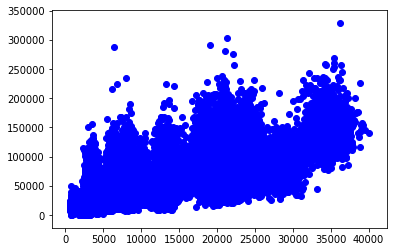

In [9]:
for i in range(789):
    plt.scatter(uthick[i,:], wdeg[i,:],c = 'b')
plt.savefig('thick_sum_to_wdeg')

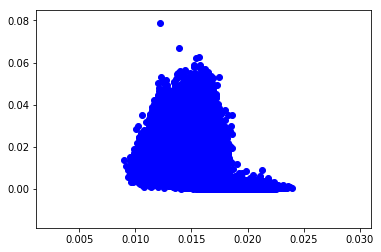

In [11]:
for i in range(789):
    plt.scatter(thick_mean[i,:]/np.sum(thick_mean[i,:]), wdeg[i,:]/np.sum(wdeg[i,:]),c = 'b')
plt.savefig('norm_thick_mean_to_norm_wdeg')

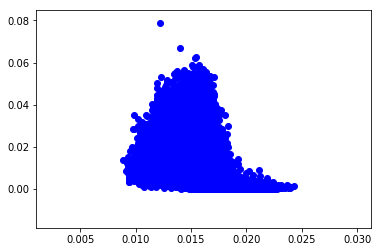

In [12]:
for i in range(789):
    plt.scatter(thick_median[i,:]/np.sum(thick_median[i,:]), wdeg[i,:]/np.sum(wdeg[i,:]),c = 'b')
plt.savefig('norm_thick_median_to_norm_wdeg')

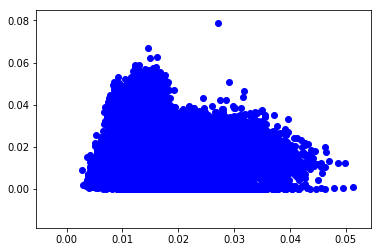

In [13]:
for i in range(789):
    plt.scatter(thick_quant[i,:]/np.sum(thick_quant[i,:]), wdeg[i,:]/np.sum(wdeg[i,:]),c = 'b')
plt.savefig('norm_thick_quantilies_to_norm_wdeg')

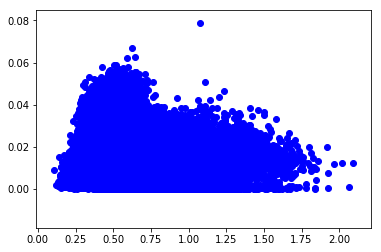

In [14]:
for i in range(789):
    plt.scatter(thick_quant[i,:], wdeg[i,:]/np.sum(wdeg[i,:]),c = 'b')
plt.savefig('thick_quantilies_to_norm_wdeg')

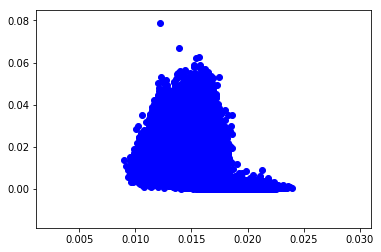

In [15]:
for i in range(789):
    plt.scatter(roi_think[i,:]/np.sum(roi_think[i,:]), wdeg[i,:]/np.sum(wdeg[i,:]),c = 'b')
plt.savefig('norm_roi_thick_to_norm_wdeg')

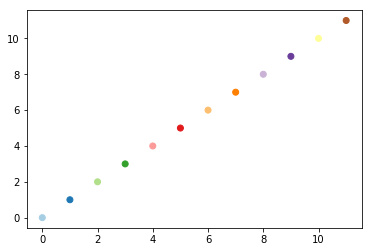

In [21]:
meta['Gender'] = meta['Gender'].astype('category')
meta['Age'] = meta['Age'].astype('category')
meta['Age'] = meta['Age'].cat.codes
meta["Gender"] = meta['Gender'].cat.codes

meta[15:20]

legend_gender = {'F':0, 'M':1}
legend_age = {'22-25':0, '26-30':1,'31-35':2, '36+':3}

color_gender = np.array(meta.Gender)
color_age = np.array(meta.Age)


%matplotlib inline

from matplotlib import cm
cmap = plt.get_cmap('Paired')
plt.scatter(range(12), range(12), c = cmap.colors)

cmap_gender = dict(zip(color_gender, [cmap.colors[1], cmap.colors[5]]))
cmap_gender

cmap_age = {0: cmap.colors[1],
            1: cmap.colors[5],
            2: cmap.colors[3], 
            3: cmap.colors[9]}

c_age = [cmap_age[i] for i in color_age]
c_gender = [cmap_gender[i] for i in color_gender]

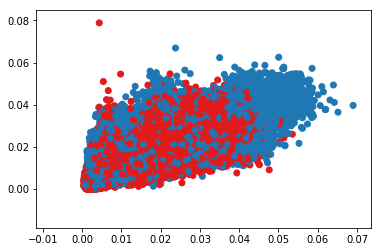

In [18]:
for i in range(789):
    plt.scatter(roi_area[i,:]/np.sum(roi_area[i,:]), wdeg[i,:]/np.sum(wdeg[i,:]),c = c_gender)
plt.savefig('norm_roi_area_to_norm_wdeg_gender')

In [19]:
np.corrcoef(roi_area[i,:]/np.sum(roi_area[i,:]), wdeg[i,:]/np.sum(wdeg[i,:]))

array([[ 1.        ,  0.71631553],
       [ 0.71631553,  1.        ]])

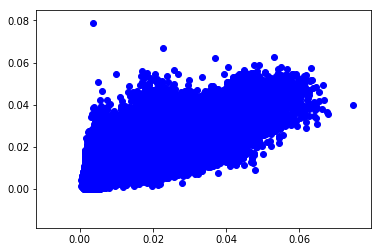

In [20]:
for i in range(789):
    plt.scatter(roi_vol[i,:]/np.sum(roi_vol[i,:]), wdeg[i,:]/np.sum(wdeg[i,:]),c = 'b')
plt.savefig('norm_roi_vol_to_norm_wdeg_gender')

In [7]:
new_thick = np.array([thick_mean[:,i]/np.sum(thick_mean, axis = -1) for i in range(68)]).T

In [11]:
wdeg_norm = np.array([wdeg[:,i]/np.sum(wdeg, axis = -1) for i in range(68)]).T

In [13]:
wdeg.shape, 

((789, 68),)

(0.013, 0.017)

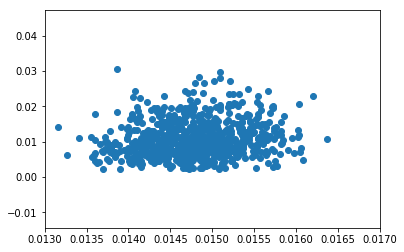

In [59]:
plt.scatter(new_thick[:,0], wdeg_norm[:,0])
plt.xlim((0.013,0.017))


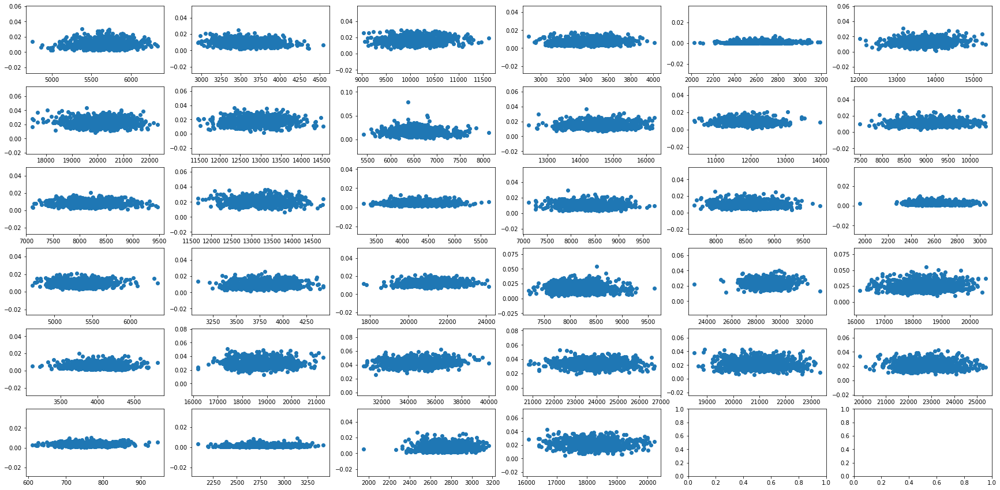

In [15]:
idx = np.arange(36).reshape(6,6)
fig, ax = plt.subplots(6,6, figsize = (30,15))
for i in range(6):
    for j in range(6):
        if i == 5:
            if j == 4:
                break
        ax[i, j].scatter(uthick[:, idx[i,j]], wdeg_norm[:,idx[i,j]])
        

In [16]:
from scipy.stats import spearmanr

In [17]:
corr = np.array([spearmanr(uthick[:,i], wdeg_norm[:,i]) for i in range(68)])

In [18]:
corr

array([[  9.01843824e-02,   1.12655573e-02],
       [ -1.55047887e-01,   1.21577784e-05],
       [  4.81848461e-02,   1.76339916e-01],
       [  1.14758412e-01,   1.24211577e-03],
       [  8.70947331e-02,   1.43975149e-02],
       [  9.55272437e-02,   7.24935331e-03],
       [ -4.51568737e-02,   2.05136233e-01],
       [  4.24005801e-02,   2.34186830e-01],
       [ -7.32159658e-02,   3.97754546e-02],
       [  3.08910013e-02,   3.86197996e-01],
       [ -4.84317025e-02,   1.74132076e-01],
       [  9.96506778e-02,   5.08434719e-03],
       [ -5.67609540e-03,   8.73522991e-01],
       [ -3.94009239e-02,   2.68980756e-01],
       [  5.34294682e-02,   1.33749216e-01],
       [ -2.05931907e-02,   5.63541463e-01],
       [ -3.48147564e-02,   3.28736340e-01],
       [ -2.15718573e-02,   5.45149273e-01],
       [  1.00001246e-02,   7.79127212e-01],
       [  5.76584465e-02,   1.05586080e-01],
       [  6.63446426e-02,   6.25098112e-02],
       [ -5.95794012e-02,   9.44519992e-02],
       [ -

In [66]:
y = corr[:,0]
y.shape

(68,)

In [69]:
bet, clos, eig, clust

(789,)

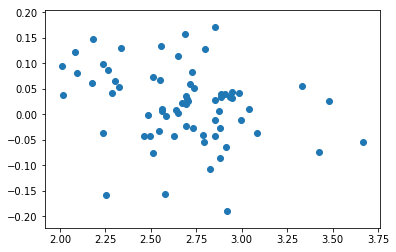

In [70]:
plt.scatter(np.mean(thick_mean, axis = 0), y)

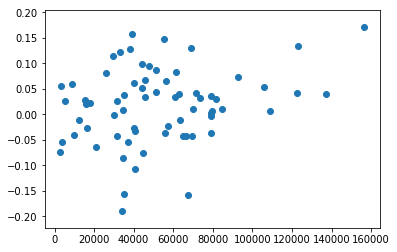

In [71]:
plt.scatter(np.mean(wdeg,axis = 0), y)

In [19]:
path_data = '/nmnt/x01-hdd/HCP/data/'


targets_name = ['clustering', 'rich_club', 'betweenness', 'closeness',  'degree_centrality', 'eigenvector']

targets_data = []
for name in targets_name:
    with open(path_data + name, 'rb') as f:
        targets_data  += [pickle.load(f)]

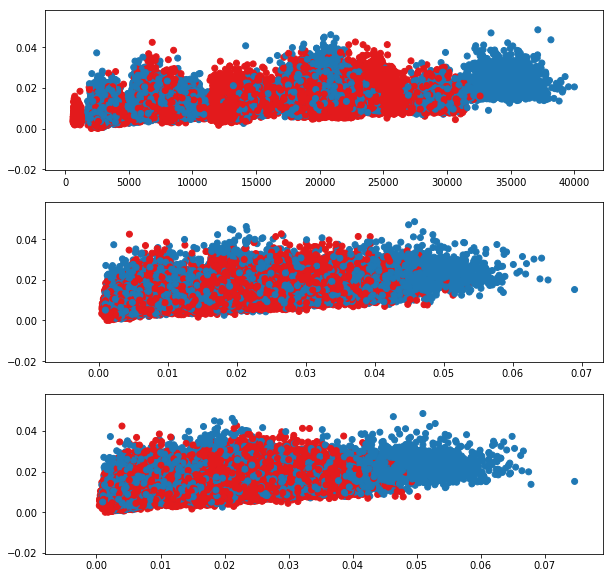

In [22]:
fig, ax = plt.subplots(3,1, figsize = (10,10))
for i in range(789):
    ax[0].scatter(uthick[i,:], targets_data[0][i,:],c = c_gender)

for i in range(789):
    ax[1].scatter(roi_area[i,:]/np.sum(roi_area[i,:]), targets_data[0][i,:],c = c_gender)  
for i in range(789):
    ax[2].scatter(roi_vol[i,:]/np.sum(roi_vol[i,:]), targets_data[0][i,:],c = c_gender)

plt.savefig('norm_roi_thick_area_vol_to_norm_clustering_gender')


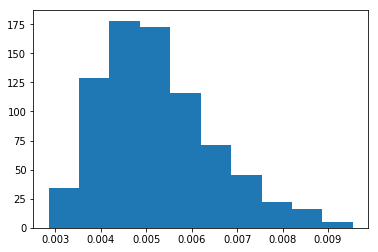

In [108]:
plt.hist(np.std(clust, axis = -1));

In [25]:
a = [spearmanr(uthick.reshape(-1), targets_data[i].reshape(-1)) for i in [0,2,3,5]]
a

[SpearmanrResult(correlation=0.65760375240368463, pvalue=0.0),
 SpearmanrResult(correlation=-0.33877014666604055, pvalue=0.0),
 SpearmanrResult(correlation=-0.17357692148956083, pvalue=0.0),
 SpearmanrResult(correlation=0.65304070045984941, pvalue=0.0)]

In [96]:
new_area = np.array([roi_area[:,i]/np.sum(roi_area, axis = -1) for i in range(68)]).T
b = [spearmanr(new_area.reshape(-1), targets_data[i].reshape(-1)) for i in [0,2,3,5]]
b

[SpearmanrResult(correlation=0.64195896644089911, pvalue=0.0),
 SpearmanrResult(correlation=-0.29992628897985346, pvalue=0.0),
 SpearmanrResult(correlation=-0.14012735482786612, pvalue=2.2902529660825743e-233),
 SpearmanrResult(correlation=0.62315454163139339, pvalue=0.0)]

In [97]:
new_vol = np.array([roi_vol[:,i]/np.sum(roi_vol, axis = -1) for i in range(68)]).T
c = [spearmanr(new_vol.reshape(-1), targets_data[i].reshape(-1)) for i in [0,2,3,5]]
c

[SpearmanrResult(correlation=-0.14757065674210437, pvalue=7.2856858174512742e-259),
 SpearmanrResult(correlation=0.11836306532435387, pvalue=1.2463536837913678e-166),
 SpearmanrResult(correlation=0.081968258383390113, pvalue=1.2149436692331748e-80),
 SpearmanrResult(correlation=-0.20105933228148787, pvalue=0.0)]

In [99]:
corr_wdeg = np.array([spearmanr(roi_think[i,:], wdeg[i,:]) for i in range(789)])
all_corr = np.array([[spearmanr(roi_think[j,:], targets_data[i][j,:]) for j in range(789)] for i in [0,2,3,5]])


In [100]:
corr_wdeg.shape, all_corr.shape

((789, 2), (4, 789, 2))

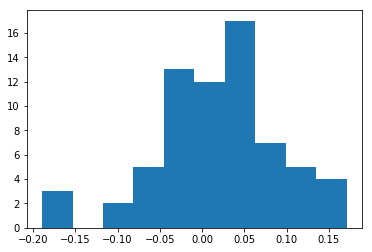

In [102]:
plt.hist(corr[:,0]);

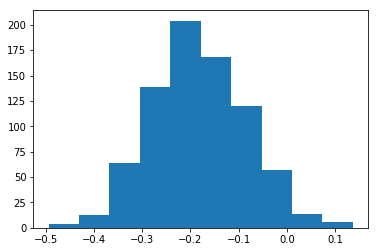

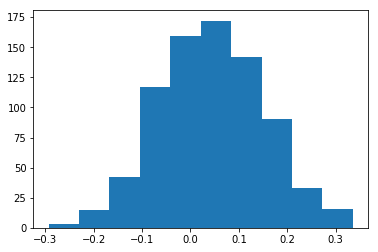

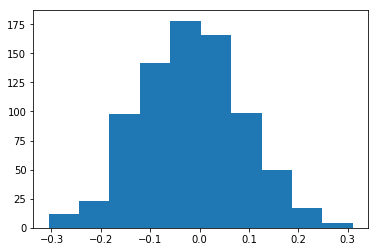

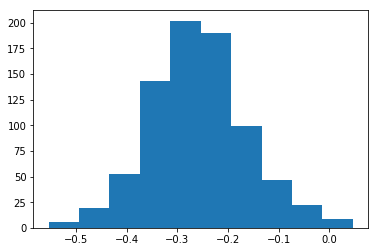

In [104]:
for i in range(4):
    plt.hist(all_corr[i][:,0])
    plt.figure();

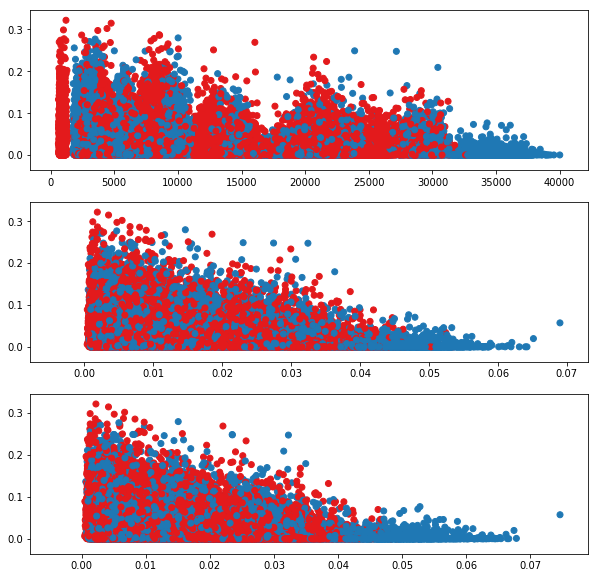

In [24]:
fig, ax = plt.subplots(3,1, figsize = (10,10))
for i in range(789):
    ax[0].scatter(uthick[i,:], targets_data[2][i,:],c = c_gender)
for i in range(789):
    ax[1].scatter(roi_area[i,:]/np.sum(roi_area[i,:]), targets_data[2][i,:],c = c_gender)
for i in range(789):
    ax[2].scatter(roi_vol[i,:]/np.sum(roi_vol[i,:]), targets_data[2][i,:],c = c_gender)
plt.savefig('norm_roi_thick_area_vol_to_norm_betweenness_gender')

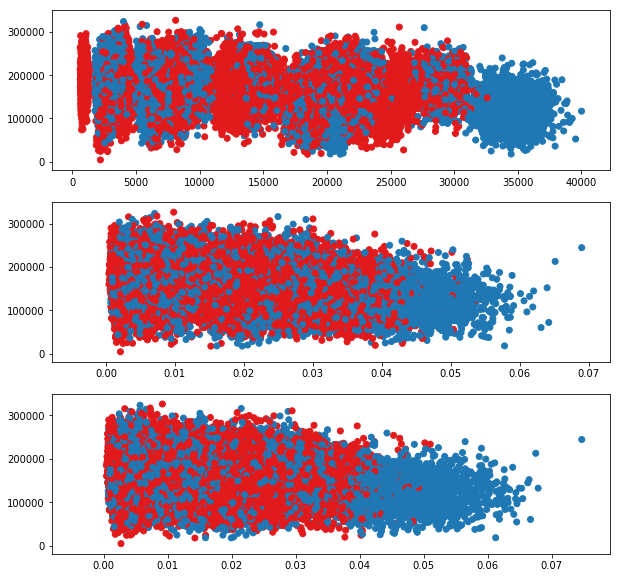

In [26]:
fig, ax = plt.subplots(3,1, figsize = (10,10))
for i in range(789):
    ax[0].scatter(uthick[i,:], targets_data[3][i,:],c = c_gender)
for i in range(789):
    ax[1].scatter(roi_area[i,:]/np.sum(roi_area[i,:]), targets_data[3][i,:],c = c_gender)
for i in range(789):
    ax[2].scatter(roi_vol[i,:]/np.sum(roi_vol[i,:]), targets_data[3][i,:],c = c_gender)
#plt.figure()
plt.savefig('norm_roi_thick_area_vol_to_norm_closeness_gender')

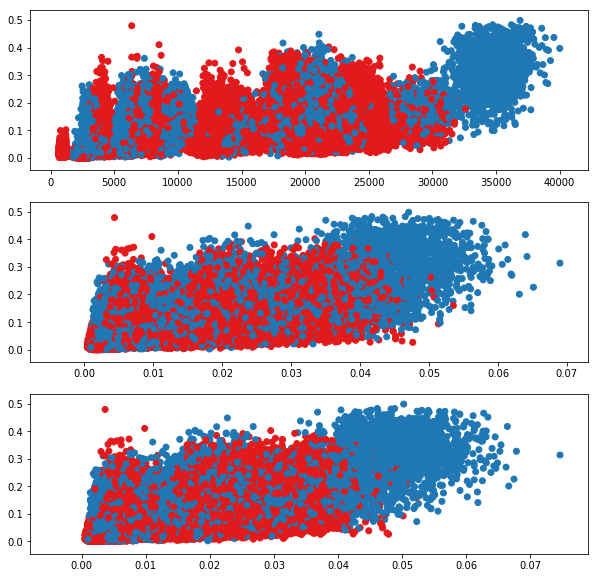

In [27]:
fig, ax = plt.subplots(3,1, figsize = (10,10))
for i in range(789):
    ax[0].scatter(uthick[i,:], targets_data[5][i,:],c = c_gender)
for i in range(789):
    ax[1].scatter(roi_area[i,:]/np.sum(roi_area[i,:]), targets_data[5][i,:],c = c_gender)
for i in range(789):
    ax[2].scatter(roi_vol[i,:]/np.sum(roi_vol[i,:]), targets_data[5][i,:],c = c_gender)
#plt.figure()
plt.savefig('norm_roi_thick_area_vol_to_norm_eigenval_gender')

In [33]:
def load_centers(path):
    centers = pd.DataFrame(columns = ['name', 'coordinate'])
    for name in os.listdir(path):
        
        vec = pd.read_csv(path+name)
        #print(vec.shape)
        vec.drop(vec.index[[3,38]], inplace = True)
        vec.__delitem__('Unnamed: 7')
        vec.__delitem__('region')
        vec.__delitem__('voxel_cordX')
        vec.__delitem__('voxel_cordY')
        vec.__delitem__('voxel_cordZ')
        mat = np.array(vec.as_matrix()).T
        #filename = filename[:12]
        
        single_subject = pd.DataFrame(data = [[name, mat]], 
                                      columns = ['name','coordinate'])

        centers = centers.append(single_subject)
    return centers

In [34]:
centers = load_centers(path_centers)

In [47]:
f_center = centers.coordinate.iloc[0]

In [49]:
f_center.shape

(3, 68)

In [51]:
from scipy.spatial.distance import squareform, pdist

In [52]:
dist = pdist(f_center.T)
dist.shape

(2278,)

In [81]:
mean_wconnec = squareform(Y.sum(axis = 0))
mean_bconnec = Y.copy()
mean_bconnec[Y > 0] = 1
mean_bconnec = squareform(mean_bconnec.sum(axis = 0)/len(Y))
idx_b = np.where(mean_bconnec != 0)[0]
idx_w = np.where(mean_wconnec != 0)[0]
mean_wconnec.shape, mean_bconnec.shape, idx_b.shape, idx_w.shape

((2278,), (2278,), (2051,), (2051,))

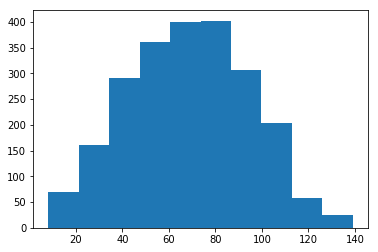

In [75]:
plt.hist(dist);

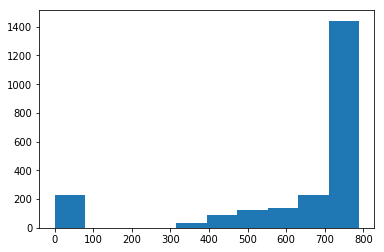

In [76]:
plt.hist(mean_bconnec);

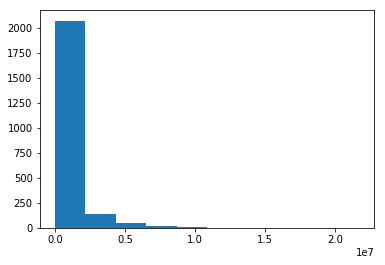

In [77]:
plt.hist(mean_wconnec);

In [86]:
min(mean_wconnec[idx_w]), max(mean_wconnec[idx_w])

(1474.0, 21713754.0)

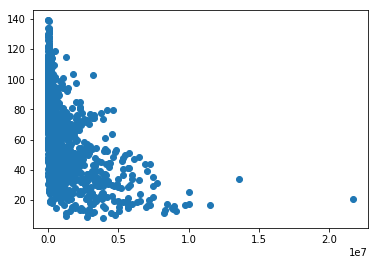

In [82]:
plt.scatter(mean_wconnec[idx_w], dist[idx_w]);

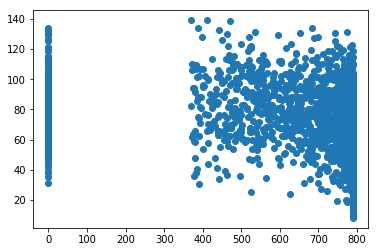

In [87]:
plt.scatter(mean_bconnec, dist);

In [89]:
a = set(subj_idx)
b = set(meta.Subject.astype(str))
c = a.difference(b)
np.where(subj_idx == c.pop())[0]

subj_idx_un = np.array(np.arange(151).tolist() + np.arange(152, 789).tolist())
subj_idx_un.shape

(788,)

In [90]:
sc = StandardScaler()

st_think = sc.fit_transform(roi_think)
mean_think = np.round(sc.mean_,2)
std_think = np.round(sc.var_,2)

st_area = sc.fit_transform(roi_area)
mean_area = np.round(sc.mean_,2)
std_area = np.round(sc.var_,2)

st_vol = sc.fit_transform(roi_vol)
mean_vol = np.round(sc.mean_,2)
std_vol = np.round(sc.var_,2)

In [91]:
wdeg = Y.sum(axis = -1)
norm_wdeg = norm_Y.sum(axis = -1)

In [92]:
max_wdeg = max(wdeg.reshape(-1))
min_wdeg = min(wdeg.reshape(-1))

max_norm_wdeg = max(norm_wdeg.reshape(-1))
min_norm_wdeg = min(norm_wdeg.reshape(-1))

max_st_think = max(st_think.reshape(-1))
min_st_think = min(st_think.reshape(-1))


max_st_area = max(st_area.reshape(-1))
min_st_area = min(st_area.reshape(-1))


max_st_vol = max(st_vol.reshape(-1))
min_st_vol = min(st_vol.reshape(-1))

# THINKNESS

In [14]:
meta[15:20]

,Subject,Gender,Age
27,104416,F,31-35
28,104820,F,36+
29,105014,F,26-30
30,105115,M,31-35
31,105216,M,26-30


In [15]:
meta['Gender'] = meta['Gender'].astype('category')
meta['Age'] = meta['Age'].astype('category')
meta['Age'] = meta['Age'].cat.codes
meta["Gender"] = meta['Gender'].cat.codes

meta[15:20]

legend_gender = {'F':0, 'M':1}
legend_age = {'22-25':0, '26-30':1,'31-35':2, '36+':3}

color_gender = np.array(meta.Gender)
color_age = np.array(meta.Age)


%matplotlib inline

from matplotlib import cm
cmap = plt.get_cmap('Paired')
plt.scatter(range(12), range(12), c = cmap.colors)

cmap_gender = dict(zip(color_gender, [cmap.colors[1], cmap.colors[5]]))
cmap_gender

cmap_age = {0: cmap.colors[1],
            1: cmap.colors[5],
            2: cmap.colors[3], 
            3: cmap.colors[9]}

c_age = [cmap_age[i] for i in color_age]
c_gender = [cmap_gender[i] for i in color_gender]

In [103]:
idx = np.array([i for i in range(36)]).reshape(6,6)

In [104]:
roi_think.shape

(789, 68)

In [139]:
man_idx = np.where(np.array(meta.Gender) == 1)[0]
man = roi_think[np.ix_(man_idx)]
st_man_think = sc.fit_transform(man)
man_mean_think = np.round(sc.mean_,2)
man_var_think = np.round(sc.var_,2)

woman_idx = np.where(np.array(meta.Gender) == 0)[0]
woman = roi_think[np.ix_(woman_idx)]
st_woman_think = sc.fit_transform(woman)
woman_mean_think = np.round(sc.mean_,2)
woman_var_think = np.round(sc.var_,2)

In [140]:
age0_idx = np.where(np.array(meta.Age) == 0)[0]
age0 = roi_think[np.ix_(age0_idx)]
st_age0_think = sc.fit_transform(age0)
age0_mean_think = np.round(sc.mean_,2)
age0_var_think = np.round(sc.var_,2)

age1_idx = np.where(np.array(meta.Age) == 1)[0]
age1 = roi_think[np.ix_(age1_idx)]
st_age1_think = sc.fit_transform(age1)
age1_mean_think = np.round(sc.mean_,2)
age1_var_think = np.round(sc.var_,2)

age2_idx = np.where(np.array(meta.Age) == 2)[0]
age2 = roi_think[np.ix_(age2_idx)]
st_age2_think = sc.fit_transform(age2)
age2_mean_think = np.round(sc.mean_,2)
age2_var_think = np.round(sc.var_,2)

age3_idx = np.where(np.array(meta.Age) == 3)[0]
age3 = roi_think[np.ix_(age3_idx)]
st_age3_think = sc.fit_transform(age3)
age3_mean_think = np.round(sc.mean_,2)
age3_var_think = np.round(sc.var_,2)

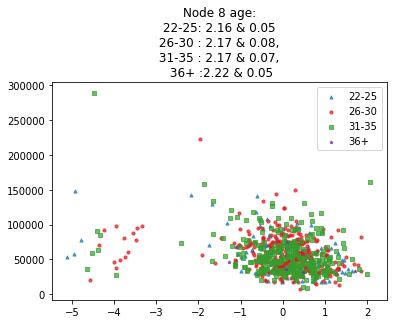

In [153]:
i = 1
j = 2
plt.scatter(st_age0_think[:, idx[i,j]], wdeg[age0_idx, idx[i,j]],
                         marker = '^', c = cmap_age[legend_age['22-25']], 
                        s = 10, alpha = 0.7, label = '22-25')

plt.scatter(st_age1_think[:, idx[i,j]], wdeg[age1_idx, idx[i,j]],
                marker = 'o', c = cmap_age[legend_age['26-30']],
                s = 10, alpha = 0.7, label = '26-30')

plt.scatter(st_age2_think[:, idx[i,j]], wdeg[age2_idx, idx[i,j]],
                marker = 's', c = cmap_age[legend_age['31-35']],
                s = 10, alpha = 0.7, label = '31-35')

plt.scatter(st_age3_think[:, idx[i,j]], wdeg[age3_idx, idx[i,j]],
                marker = '*', c = cmap_age[legend_age['36+']],
                s = 10, alpha = 0.7, label = '36+')
plt.legend()
plt.title("Node {0:.0f} age:\n 22-25: {1:.2f} & {2:.2f} \n 26-30 \
: {3:.2f} & {4:.2f}, \n 31-35 : {5:.2f} & {6:.2f}, \n 36+ :{7:.2f} & {8:.2f}".format(idx[i,j], 
                                age0_mean_think[idx[i,j]], age0_var_think[idx[i,j]],
                                age1_mean_think[idx[i,j]], age1_var_think[idx[i,j]],
                                age2_mean_think[idx[i,j]], age2_var_think[idx[i,j]],
                                age3_mean_think[idx[i,j]], age3_var_think[idx[i,j]]))
plt.savefig('ages_roi_to_thick_8')

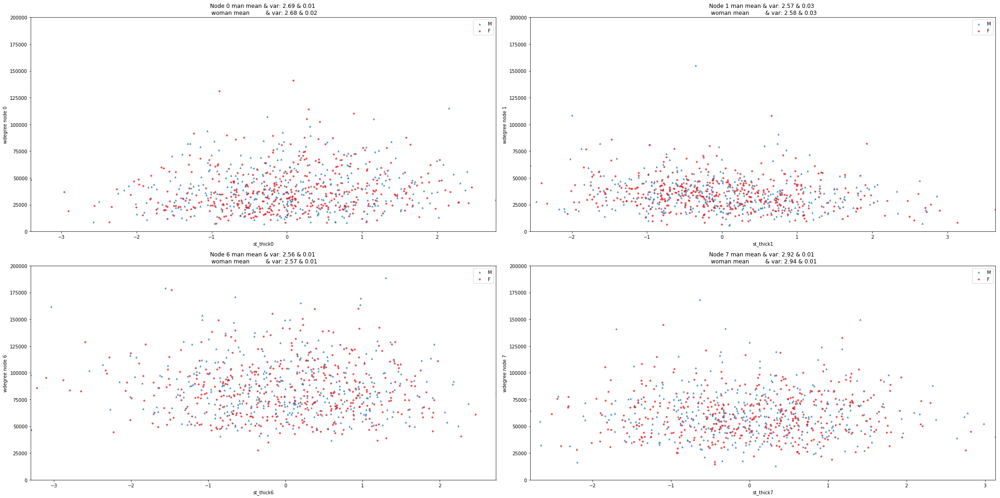

In [141]:
fig, ax = plt.subplots(2,2, figsize = (30,15))
for i in range(0,2):
    for j in range(0,2):
        if i == 5:
            if j == 4:
                break
        ax[i, j].scatter(st_man_think[:, idx[i,j]], wdeg[man_idx, idx[i,j]],
                         marker = '^', c = cmap_gender[legend_gender['M']], 
                        s = 10, alpha = 0.7, label = 'M')
        
        ax[i, j].scatter(st_woman_think[:, idx[i,j]], wdeg[woman_idx, idx[i,j]],
                        marker = 'o', c = cmap_gender[legend_gender['F']],
                        s = 10, alpha = 0.7, label = 'F')
        ax[i, j].legend()
        ax[i, j].set_title("Node {0:.0f} man mean & var: {1:.2f} & {2:.2f} \n woman mean \
        & var: {3:.2f} & {4:.2f}".format(idx[i,j], man_mean_think[idx[i,j]],
                                         man_var_think[idx[i,j]],
                                         woman_mean_think[idx[i,j]], woman_var_think[idx[i,j]]))
        
        ax[i, j].set_xlabel('st_thick' + str(idx[i,j]))
        ax[i, j].set_ylabel('wdegree node ' + str(idx[i,j]))
        ax[i, j].set_xlim([min(min(st_man_think[:,idx[i,j]]), min(st_woman_think[:,idx[i,j]])),
                           max(max(st_man_think[:,idx[i,j]]), max(st_woman_think[:,idx[i,j]]))])
        ax[i, j].set_ylim([min_wdeg, 200000])
plt.tight_layout()
plt.savefig( 'woman_man_thinkness_to_wdeg', dpi = 200)

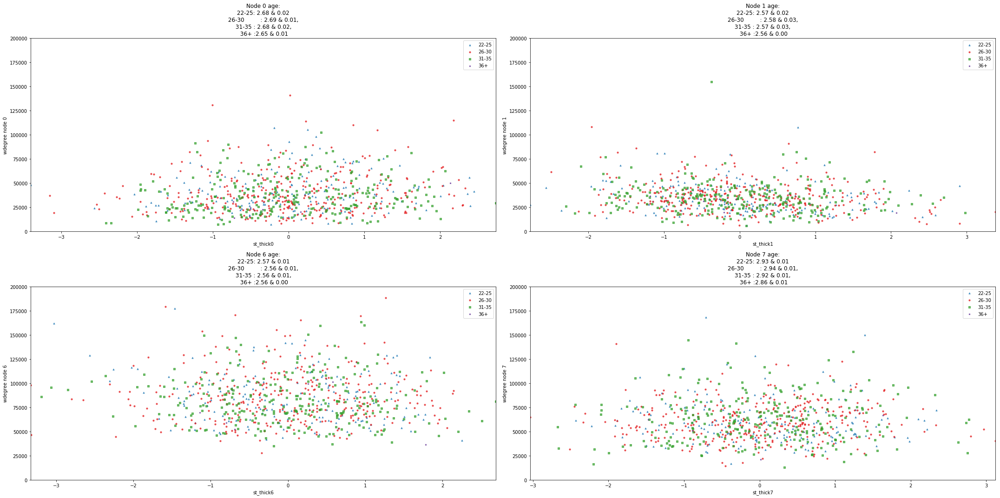

In [211]:
fig, ax = plt.subplots(2,2, figsize = (30,15))
for i in range(0,2):
    for j in range(0,2):
        if i == 5:
            if j == 4:
                break
        ax[i, j].scatter(st_age0_think[:, idx[i,j]], wdeg[age0_idx, idx[i,j]],
                         marker = '^', c = cmap_age[legend_age['22-25']], 
                        s = 10, alpha = 0.7, label = '22-25')
        
        ax[i, j].scatter(st_age1_think[:, idx[i,j]], wdeg[age1_idx, idx[i,j]],
                        marker = 'o', c = cmap_age[legend_age['26-30']],
                        s = 10, alpha = 0.7, label = '26-30')
        
        ax[i, j].scatter(st_age2_think[:, idx[i,j]], wdeg[age2_idx, idx[i,j]],
                        marker = 's', c = cmap_age[legend_age['31-35']],
                        s = 10, alpha = 0.7, label = '31-35')
        
        ax[i, j].scatter(st_age3_think[:, idx[i,j]], wdeg[age3_idx, idx[i,j]],
                        marker = '*', c = cmap_age[legend_age['36+']],
                        s = 10, alpha = 0.7, label = '36+')
        ax[i, j].legend()
        
        ax[i, j].set_title("Node {0:.0f} age:\n 22-25: {1:.2f} & {2:.2f} \n 26-30 \
        : {3:.2f} & {4:.2f}, \n 31-35 : {5:.2f} & {6:.2f}, \n 36+ :{7:.2f} & {8:.2f}".format(idx[i,j], 
                                        age0_mean_think[idx[i,j]], age0_var_think[idx[i,j]],
                                        age1_mean_think[idx[i,j]], age1_var_think[idx[i,j]],
                                        age2_mean_think[idx[i,j]], age2_var_think[idx[i,j]],
                                        age3_mean_think[idx[i,j]], age3_var_think[idx[i,j]]))
        
        ax[i, j].set_xlabel('st_thick' + str(idx[i,j]))
        ax[i, j].set_ylabel('wdegree node ' + str(idx[i,j]))
        min_age = min(np.concatenate([st_age0_think[:,idx[i,j]], st_age1_think[:,idx[i,j]],
                                     st_age2_think[:,idx[i,j]], st_age3_think[:,idx[i,j]]]).reshape(-1))
        max_age = max(np.concatenate([st_age0_think[:,idx[i,j]], st_age1_think[:,idx[i,j]],
                                     st_age2_think[:,idx[i,j]], st_age3_think[:,idx[i,j]]]).reshape(-1))
        ax[i, j].set_xlim([min_age,max_age])
        ax[i, j].set_ylim([min_wdeg, 200000])
plt.tight_layout()
plt.savefig( 'ages_thinkness_to_wdeg', dpi = 200)

In [211]:
a = set(man_idx)
b = set(age0_idx)
c0 = a.intersection(b)
c0 = np.array(list(c0))

age0_man = roi_think[c0]
st_age0_man = sc.fit_transform(age0_man)
age0_man_mean = sc.mean_
age0_man_var = sc.var_

b = set(age2_idx)
c2 = np.array(list(a.intersection(b)))
age2_man = roi_think[c2]
st_age2_man = sc.fit_transform(age2_man)
age2_man_mean = sc.mean_
age2_man_var = sc.var_



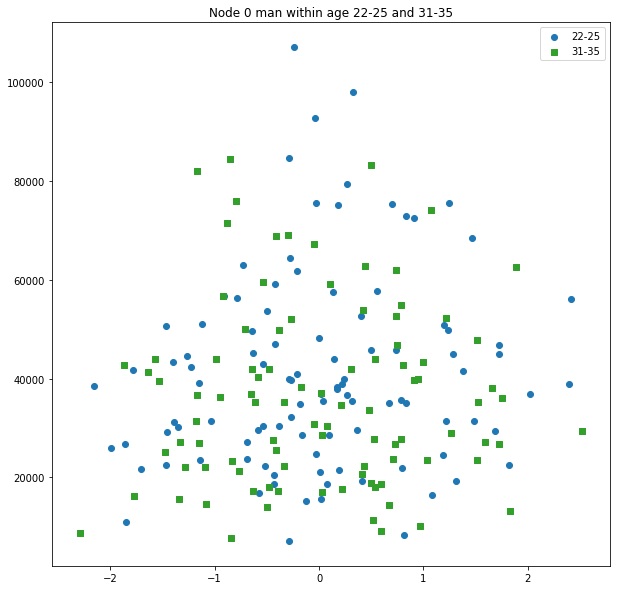

In [213]:
i = 0
j = 0
plt.figure(figsize = (10,10))
plt.scatter(st_age0_man[:, idx[i,j]], wdeg[c0, idx[i,j]],
                         marker = 'o', c = cmap_age[legend_age['22-25']], 
                        label = '22-25')

# plt.scatter(st_age1_think[:, idx[i,j]], wdeg[age1_idx, idx[i,j]],
#                 marker = 'o', c = cmap_age[legend_age['26-30']],
#                 s = 10, alpha = 0.7, label = '26-30')

plt.scatter(st_age2_man[:, idx[i,j]], wdeg[c2, idx[i,j]],
                marker = 's', c = cmap_age[legend_age['31-35']],
                 label = '31-35')

# plt.scatter(st_age3_think[:, idx[i,j]], wdeg[age3_idx, idx[i,j]],
#                 marker = 's', c = cmap_age[legend_age['36+']],
#                 s = 50, alpha = 0.7, label = '36+')
plt.title('Node '+ str(idx[i,j])  + ' man within age 22-25 and 31-35')
plt.legend()
plt.savefig('man_to_ages_thick')

In [214]:
a = set(woman_idx)
b = set(age0_idx)
c0 = a.intersection(b)
c0 = np.array(list(c0))

age0_woman = roi_think[c0]
st_age0_woman = sc.fit_transform(age0_woman)
age0_woman_mean = sc.mean_
age0_woman_var = sc.var_

b = set(age2_idx)
c2 = np.array(list(a.intersection(b)))
age2_woman = roi_think[c2]
st_age2_woman = sc.fit_transform(age2_woman)
age2_woman_mean = sc.mean_
age2_woman_var = sc.var_



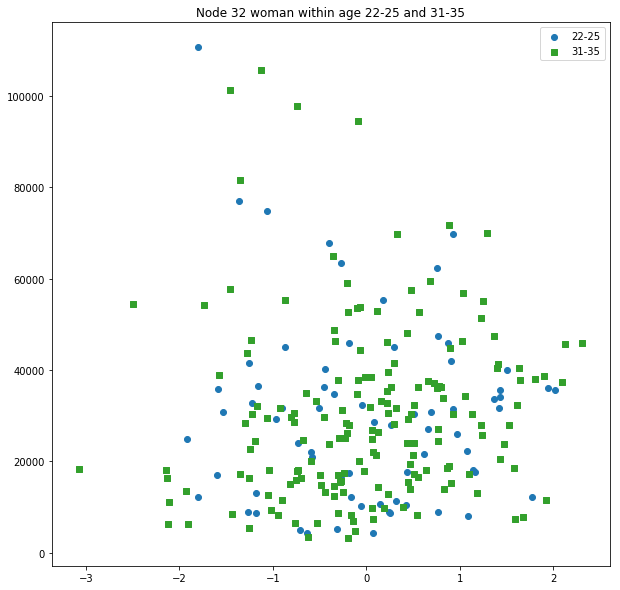

In [215]:
i = 5
j = 2
plt.figure(figsize = (10,10))
plt.scatter(st_age0_woman[:, idx[i,j]], wdeg[c0, idx[i,j]],
                         marker = 'o', c = cmap_age[legend_age['22-25']], 
                         label = '22-25')

# plt.scatter(st_age1_think[:, idx[i,j]], wdeg[age1_idx, idx[i,j]],
#                 marker = 'o', c = cmap_age[legend_age['26-30']],
#                 s = 10, alpha = 0.7, label = '26-30')

plt.scatter(st_age2_woman[:, idx[i,j]], wdeg[c2, idx[i,j]],
                marker = 's', c = cmap_age[legend_age['31-35']],
                 label = '31-35')

# plt.scatter(st_age3_think[:, idx[i,j]], wdeg[age3_idx, idx[i,j]],
#                 marker = 's', c = cmap_age[legend_age['36+']],
#                 s = 50, alpha = 0.7, label = '36+')
plt.title('Node '+ str(idx[i,j])  + ' woman within age 22-25 and 31-35')
plt.legend()
plt.savefig('woman_to_age_thick', )

In [176]:
def topk_degrees(dataset, k=10, subj_num=None):
    '''    
     input
     
     dataset - array n x 68 x 68
     k - number of heaviest nodes to consider (from each matrix)
     subj_num - number of subjects to choose final indices
     
     output
     
     node ids with nodes which have highest degree among all subjects (0..68)
     frequencies of these nodes (0..n)
    '''
     
    if subj_num is None:
        subj_num = int(dataset.shape[0]/2)
    
    degrees = dataset.sum(axis=1) # array n x 68
    topk_dgr_ind = []
    
    for row in degrees:
        order = np.argsort(row) 
        topk_dgr_ind.append(order[:k]) # take top k heaviest nodes
        
    topk_dgr_ind = np.hstack(topk_dgr_ind)
    nodes_id, freq = np.unique(topk_dgr_ind, return_counts=True) # compute number of times i'th node
    # is heavy among all subjects, if this number is bigger than subj_num we will choose it later
    
    return nodes_id[freq > subj_num], freq[freq > subj_num]

def botk_degrees(dataset, k=10, subj_num=None):
    '''    
     input
     
     dataset - array n x 68 x 68
     k - number of heaviest nodes to consider (from each matrix)
     subj_num - number of subjects to choose final indices
     
     output
     
     node ids with nodes which have highest degree among all subjects (0..68)
     frequencies of these nodes (0..n)
    '''
     
    if subj_num is None:
        subj_num = int(dataset.shape[0]/2)
    
    degrees = dataset.sum(axis=1) # array n x 68
    topk_dgr_ind = []
    
    for row in degrees:
        order = np.argsort(row) 
        topk_dgr_ind.append(order[-k:]) # take top k heaviest nodes
        
    topk_dgr_ind = np.hstack(topk_dgr_ind)
    nodes_id, freq = np.unique(topk_dgr_ind, return_counts=True) # compute number of times i'th node
    # is heavy among all subjects, if this number is bigger than subj_num we will choose it later
    
    return nodes_id[freq > subj_num], freq[freq > subj_num]

In [177]:
def topk_thick(degrees, k=10, subj_num=None):
    '''    
     input
     
     dataset - array n x 68 x 68
     k - number of heaviest nodes to consider (from each matrix)
     subj_num - number of subjects to choose final indices
     
     output
     
     node ids with nodes which have highest degree among all subjects (0..68)
     frequencies of these nodes (0..n)
    '''
     
    if subj_num is None:
        subj_num = int(degrees.shape[0]/2)
    
     # array n x 68
    topk_dgr_ind = []
    
    for row in degrees:
        order = np.argsort(row) 
        topk_dgr_ind.append(order[:k]) # take top k heaviest nodes
        
    topk_dgr_ind = np.hstack(topk_dgr_ind)
    nodes_id, freq = np.unique(topk_dgr_ind, return_counts=True) # compute number of times i'th node
    # is heavy among all subjects, if this number is bigger than subj_num we will choose it later
    
    return nodes_id[freq > subj_num], freq[freq > subj_num]

def botk_thick(degrees, k=10, subj_num=None):
    '''    
     input
     
     dataset - array n x 68 x 68
     k - number of heaviest nodes to consider (from each matrix)
     subj_num - number of subjects to choose final indices
     
     output
     
     node ids with nodes which have highest degree among all subjects (0..68)
     frequencies of these nodes (0..n)
    '''
     
    if subj_num is None:
        subj_num = int(degrees.shape[0]/2)
    
    #degrees = dataset.sum(axis=1) # array n x 68
    topk_dgr_ind = []
    
    for row in degrees:
        order = np.argsort(row) 
        topk_dgr_ind.append(order[-k:]) # take top k heaviest nodes
        
    topk_dgr_ind = np.hstack(topk_dgr_ind)
    nodes_id, freq = np.unique(topk_dgr_ind, return_counts=True) # compute number of times i'th node
    # is heavy among all subjects, if this number is bigger than subj_num we will choose it later
    
    return nodes_id[freq > subj_num], freq[freq > subj_num]

In [181]:
top_nodes, top_freq_nodes = topk_degrees(Y, k = 10)
bot_nodes, bot_freq_nodes = botk_degrees(Y, k = 10)
top_nodes, bot_nodes

(array([ 4, 14, 17, 30, 31, 38, 51, 65, 66]),
 array([23, 25, 26, 27, 57, 60, 61]))

In [180]:
top_nodes, top_freq_nodes = topk_degrees(Y, k = 2)
bot_nodes, bot_freq_nodes = botk_degrees(Y, k = 2)
top_nodes, bot_nodes

(array([ 4, 38]), array([26, 60]))

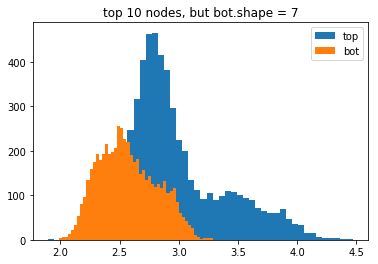

In [184]:
top_thick = roi_think[:, top_nodes[:4].tolist() + top_nodes[6:].tolist()]
bot_thick = roi_think[:, bot_nodes]
plt.hist(top_thick.reshape(-1), bins = 50, label = 'top')
plt.hist(bot_thick.reshape(-1), bins = 50, label = 'bot');
plt.legend();
# plt.title('38 - top mean & std: {0:.3f} & {1:.3f} \n 60 - bot mean & std: {2:.3f} & {3:.3f}'.format(top_thick.mean(),
#                                                                                           top_thick.std(),
#                                                                                           bot_thick.mean() , 
#                                                                                           bot_thick.std()))
plt.title('top 10 nodes, but bot.shape = 7')
plt.savefig('7_top_bot_hist', dpi = 200)

In [222]:
top_thick.mean(), top_thick.std(), bot_thick.mean() , bot_thick.std()

(3.4267182, 0.22505398, 2.8886688, 0.12647474)

In [223]:
from scipy.stats import ttest_ind
t, p = ttest_ind(top_thick, bot_thick)
print(p)

0.0


In [178]:
top_vol, freq_top_vol = topk_thick(roi_vol, k = 10)
bot_vol, freq_bot_vol = botk_thick(roi_vol, k = 10)
top_vol, bot_vol

(array([ 8, 20, 21, 33, 42, 54, 66, 67]),
 array([ 7, 13, 25, 30, 31, 41, 47, 51, 59, 64, 65]))

In [227]:
top_vol, freq_top_vol = topk_thick(roi_vol, k = 2)
bot_vol, freq_bot_vol = botk_thick(roi_vol, k = 2)
top_vol, bot_vol

(array([ 8, 42]), array([51]))

In [228]:
freq_top_vol, freq_bot_vol

(array([582, 483]), array([469]))

In [229]:
deg_top_vol = Y.sum(axis = -1)[:, [42]]
deg_bot_vol = Y.sum(axis = -1)[:, [51]]

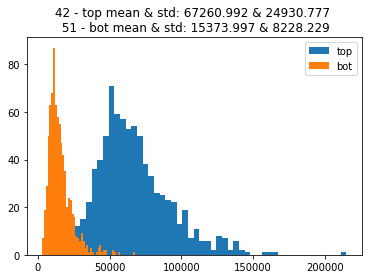

In [231]:
plt.hist(deg_top_vol.reshape(-1), bins=50, label = 'top')
plt.hist(deg_bot_vol.reshape(-1), bins = 50, label = 'bot')
plt.title('42 - top mean & std: {0:.3f} & {1:.3f} \n 51 - bot mean & std: {2:.3f} & {3:.3f}'.format(deg_top_vol.mean(),
                                                                                          deg_top_vol.std(),
                                                                                          deg_bot_vol.mean() , 
                                                                                          deg_bot_vol.std()))
plt.legend();
plt.savefig('1_vol_top_bot_hist')

In [232]:
ttest_ind(deg_top_vol, deg_bot_vol)

Ttest_indResult(statistic=array([ 55.47969055], dtype=float32), pvalue=array([ 0.]))

In [164]:
top_thickness, top_thick_freq = topk_thick(roi_think, k = 2)
bot_thickness, bot_thick_freq = botk_thick(roi_think, k = 2)
top_thickness, bot_thickness

(array([19, 53]), array([31, 65]))

In [165]:
top_thickness, top_thick_freq = topk_thick(roi_vol, k = 2)
bot_thickness, bot_thick_freq = botk_thick(roi_vol, k = 2)

In [166]:
top_thickness, bot_thickness, 

(array([ 8, 42]), array([51]))

In [163]:
new_Y = Y[subj_idx_un,:,:]

In [123]:
new_Y.shape
new_roi = roi_think[subj_idx_un, :]

In [134]:
top_nodes, top_freq = topk_degrees(new_Y, k = 10)
bot_nodes, bot_freq = botk_degrees(new_Y, k = 10)

In [135]:
top_nodes, bot_nodes

(array([ 4, 14, 17, 30, 31, 38, 51, 65, 66]),
 array([23, 25, 26, 27, 57, 60, 61]))

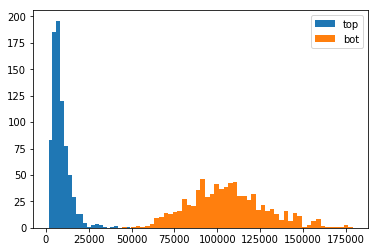

In [173]:
# объемы ! топ и бот 
top_thick = Y.sum(axis = -1)[:, top_nodes[-1]]
bot_thick = Y.sum(axis = -1)[:, bot_nodes[-1]]
plt.hist(top_thick.reshape(-1), bins = 50, label = 'top')
plt.hist(bot_thick.reshape(-1), bins = 50, label = 'bot');
plt.legend();

In [167]:
top_thick = new_roi[:, top_nodes[-1]]
bot_thick = new_roi[:, bot_nodes[-1]]

In [168]:
top_deg = new_Y.sum(axis = -1)[:, top_thickness[:3]]
bot_deg = new_Y.sum(axis = -1)[:, bot_thickness[:3]]

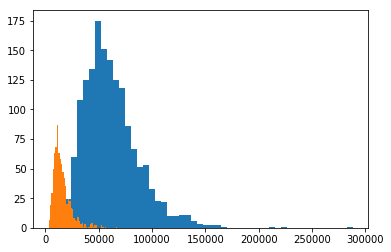

In [169]:
plt.hist(top_deg.reshape(-1), bins = 50)
plt.hist(bot_deg.reshape(-1), bins = 50);

In [137]:
top_thick.mean(), top_thick.std(), bot_thick.mean(), bot_thick.std()

(2.9128771, 0.3191154, 2.5540137, 0.22972384)

In [ ]:
import scipy.stats import 

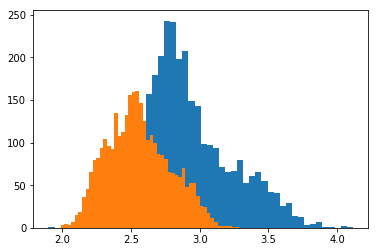

In [139]:
plt.hist(top_thick.reshape(-1), bins = 50)
plt.hist(bot_thick.reshape(-1), bins = 50);

ValueError: Invalid RGBA argument: 2

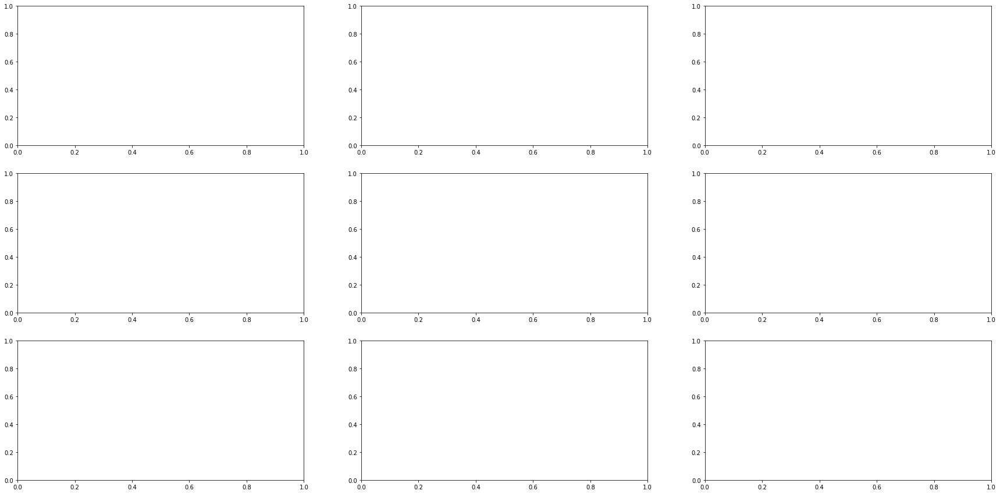

In [188]:
fig, ax = plt.subplots(3,3, figsize = (30,15))
for i in range(2,5):
    for j in range(2,5):
        if i == 5:
            if j == 4:
                break
        ax[i, j].scatter(st_think[np.ix_(subj_idx_un), idx[i,j]], wdeg[np.ix_(subj_idx_un),idx[i,j]], c= c )
        ax[i, j].set_title('Node ' + str(idx[i,j]) + ', with mean = ' + str(mean_think[idx[i,j]]) + 'and std = ' + str(std_think[idx[i,j]]))
        ax[i, j].set_xlabel('st thick for ' + str(idx[i,j]) + 'node')
        ax[i, j].set_ylabel('wdegree node ' + str(idx[i,j]))
        ax[i, j].set_xlim([min_st_think, max_st_think])
        ax[i, j].set_ylim([min_wdeg, max_wdeg])
plt.tight_layout()
plt.savefig( 'thinkness_to_wdeg', dpi = 200)

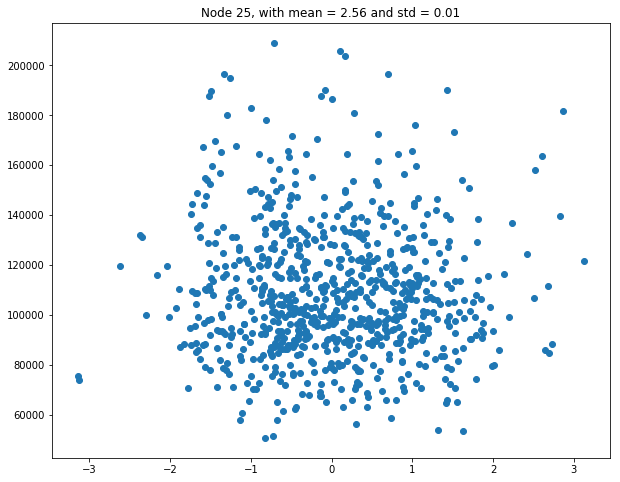

In [193]:
ax = plt.figure(figsize=(10,8))
idx = np.arange(36).reshape(6,6)
i = 4
j = 1
plt.scatter(st_think[:, idx[i,j]], wdeg[:,idx[i,j]]);
plt.title('Node ' + str(idx[i,j]) + ', with mean = ' + str(mean_think[idx[i,j]]) + ' and std = ' + str(std_think[idx[i,j]]))
plt.savefig('roi_thick_to_wdeg_8')

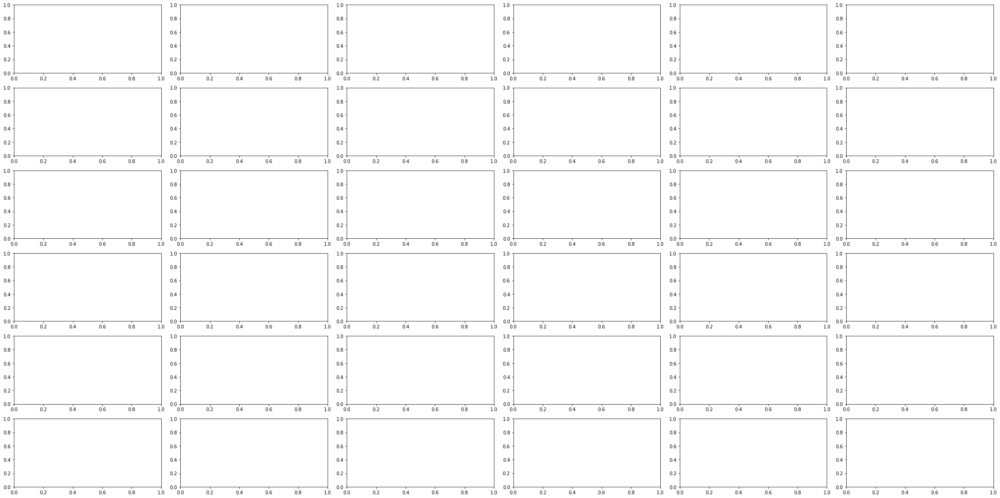

In [114]:
new_idx = np.where(c == 1)[0]
fig, ax = plt.subplots(6,6, figsize = (30,15))
for i in range(6,6):
    for j in range(6,6):
        if i == 5:
            if j == 4:
                break
        ax[i-2, j-2].scatter(st_think[:, idx[i,j]], wdeg[:,idx[i,j]])
        ax[i-2, j-2].set_title('Node ' + str(idx[i,j]) + ', with mean = ' + str(mean_think[idx[i,j]]) + 'and std = ' + str(std_think[idx[i,j]]))
        ax[i-2, j-2].set_xlabel('st thick for ' + str(idx[i,j]) + 'node')
        ax[i-2, j-2].set_ylabel('wdegree node ' + str(idx[i,j]))
        ax[i-2, j-2].set_xlim([min_st_think, max_st_think])
        ax[i-2, j-2].set_ylim([min_wdeg, 200000])
plt.tight_layout()
plt.savefig( 'thinkness_to_wdeg', dpi = 200)

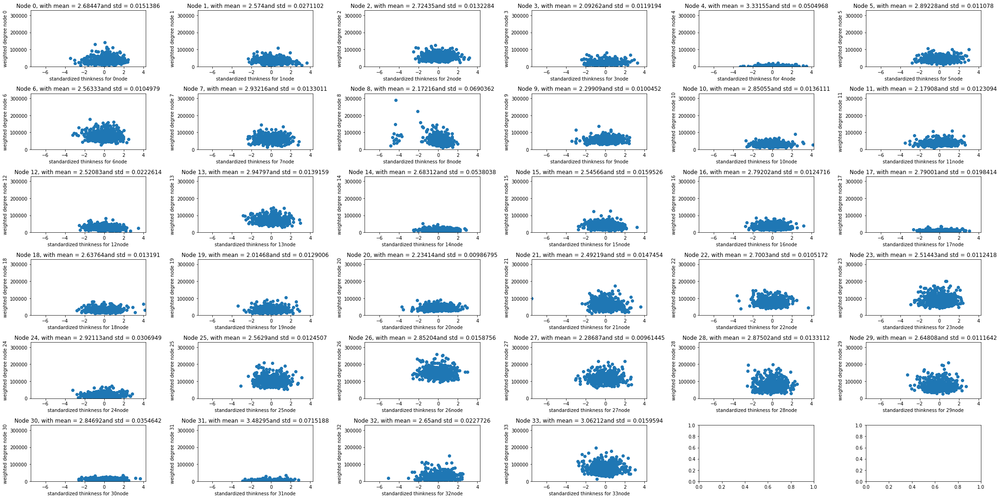

In [56]:
new_idx = np.where(c == 0)[0]
fig, ax = plt.subplots(6,6, figsize = (30,15))
for i in range(6):
    for j in range(6):
        if i == 5:
            if j == 4:
                break
        ax[i, j].scatter(st_think[np.ix_(new_idx), idx[i,j]], wdeg[np.ix_(new_idx),idx[i,j]])
        ax[i, j].set_title('Node ' + str(idx[i,j]) + ', with mean = ' + str(mean_think[idx[i,j]]) + 'and std = ' + str(std_think[idx[i,j]]))
        ax[i, j].set_xlabel('standardized thinkness for ' + str(idx[i,j]) + 'node')
        ax[i, j].set_ylabel('weighted degree node ' + str(idx[i,j]))
        ax[i, j].set_xlim([min_st_think, max_st_think])
        ax[i, j].set_ylim([min_wdeg, max_wdeg])
plt.tight_layout()
plt.savefig( 'woman_thinkness_to_wdeg', dpi = 500)

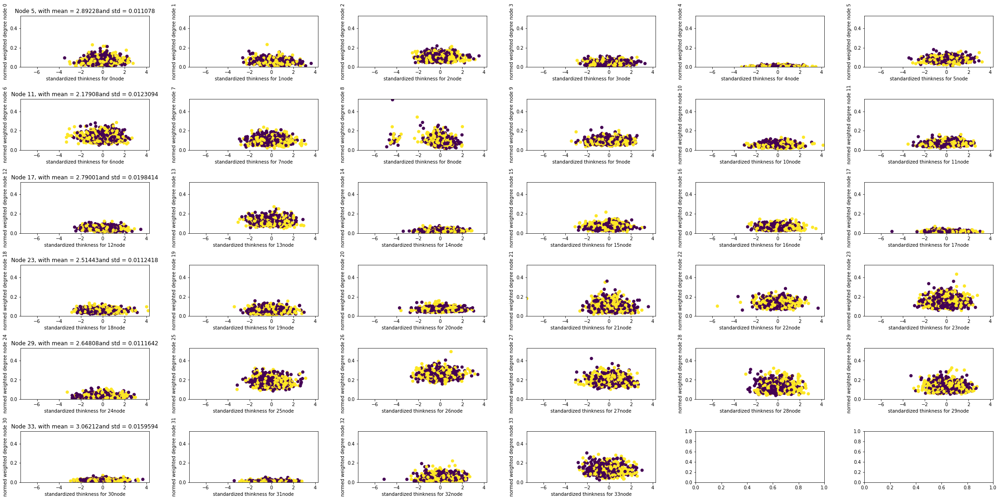

In [46]:
fig, ax = plt.subplots(6,6, figsize = (30,15))
for i in range(6):
    for j in range(6):
        if i == 5:
            if j == 4:
                break
        ax[i, j].scatter(st_think[np.ix_(subj_idx_un), idx[i,j]], norm_wdeg[np.ix_(subj_idx_un),idx[i,j]], c= c)
    #     ax[i, 1].scatter(st_think[:, 34 + i], norm_wdeg[:, 34+i])
        ax[i, 0].set_title('Node ' + str(idx[i,j]) + ', with mean = ' + str(mean_think[idx[i,j]]) + 'and std = ' + str(std_think[idx[i,j]]))

        ax[i, j].set_xlabel('standardized thinkness for ' + str(idx[i,j]) + 'node')
        ax[i, j].set_ylabel('normed weighted degree node ' + str(idx[i,j]))
        ax[i, j].set_xlim([min_st_think, max_st_think])
        ax[i, j].set_ylim([min_norm_wdeg, max_norm_wdeg])
plt.tight_layout()
plt.savefig('thinkness_to_norm_wdeg', dpi = 500)

# AREA

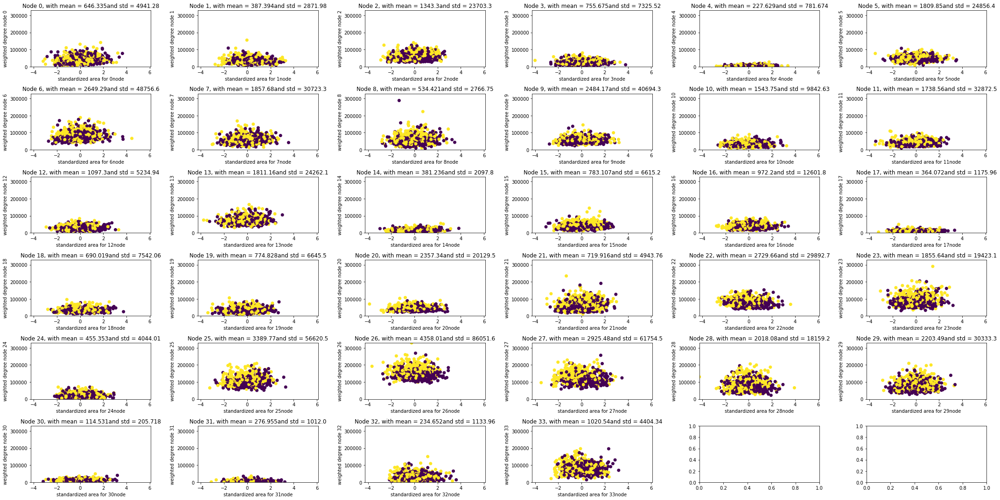

In [49]:
fig, ax = plt.subplots(6,6, figsize = (30,15))
for i in range(6):
    for j in range(6):
        if i == 5:
            if j == 4:
                break   
        ax[i, j].scatter(st_area[np.ix_(subj_idx_un), idx[i,j]], wdeg[np.ix_(subj_idx_un),idx[i,j]], c= c)
    #    ax[i, 1].scatter(st_area[:, 34 + i], wdeg[:, 34+i])
        ax[i, j].set_title('Node ' + str(idx[i,j]) + ', with mean = ' + str(mean_area[idx[i,j]]) + 'and std = ' + str(std_area[idx[i,j]]))

    #    ax[i, 1].set_title('Node ' + str(34 + i) + ', with mean = ' + str(mean_area[34 +i]) +'and std = ' + str(std_area[34 + i]))
        ax[i, j].set_xlabel('standardized area for ' + str(idx[i,j]) + 'node')
        ax[i, j].set_ylabel('weighted degree node ' + str(idx[i,j]))
    #    ax[i, 1].set_xlabel('standardized area for ' + str(34 + i) + 'node')
    #    ax[i, 1].set_ylabel('weighted degree node' + str(34 + i))
        ax[i, j].set_xlim([min_st_area, max_st_area])
        ax[i, j].set_ylim([min_wdeg, max_wdeg])
    #    ax[i, 1].set_xlim([min_st_area, max_st_area])
    #    ax[i, 1].set_ylim([min_wdeg, max_wdeg])
plt.tight_layout()
plt.savefig('area_to_wdeg', dpi = 500)

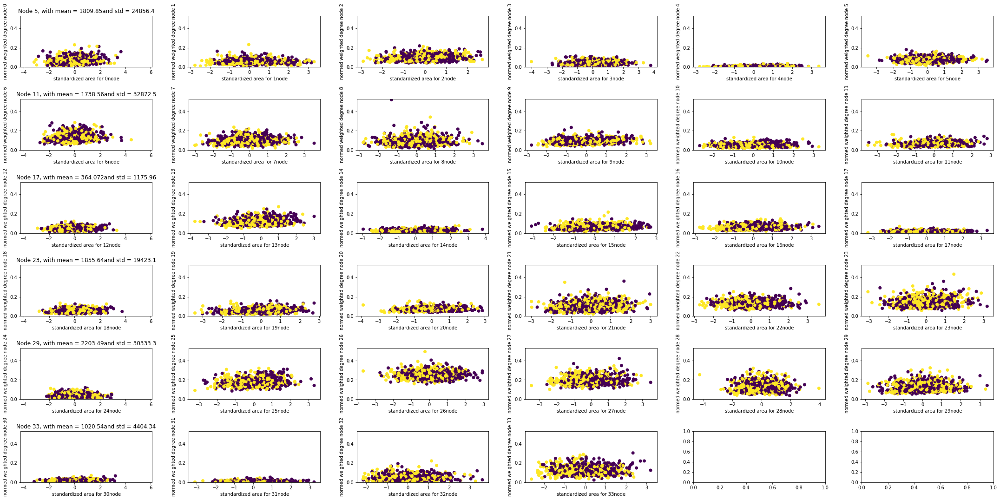

In [50]:
fig, ax = plt.subplots(6,6, figsize = (30,15))
for i in range(6):
    for j in range(6):
        if i == 5:
            if j == 4:
                break   
    
        ax[i, j].scatter(st_area[np.ix_(subj_idx_un), idx[i,j]], norm_wdeg[np.ix_(subj_idx_un),idx[i,j]], c= c)
        #ax[i, 1].scatter(st_area[:, 34 + i], norm_wdeg[:, 34+i])
        ax[i, 0].set_title('Node ' + str(idx[i,j]) + ', with mean = ' + str(mean_area[idx[i,j]]) + 'and std = ' + str(std_area[idx[i,j]]))

       #ax[i, 1].set_title('Node ' + str(34 + i) + ', with mean = ' + str(mean_area[34 +i]) +'and std = ' + str(std_area[34 + i]))
        ax[i, j].set_xlabel('standardized area for ' + str(idx[i,j]) + 'node')
        ax[i, j].set_ylabel('normed weighted degree node ' + str(idx[i,j]))
        #ax[i,j1].set_xlabel('standardized area for ' + str(34 + i) + 'node')
        #ax[i, 1].set_ylabel('normed weighted degree node' + str(34 + i))
        ax[i, 0].set_xlim([min_st_area, max_st_area])
        ax[i, j].set_ylim([min_norm_wdeg, max_norm_wdeg])
        #ax[i,j1].set_xlim([min_st_area, max_st_area])
        #ax[i, 1].set_ylim([min_norm_wdeg, max_norm_wdeg])
plt.tight_layout()
plt.savefig('area_to_norm_wdeg', dpi = 500)

# VOLUME

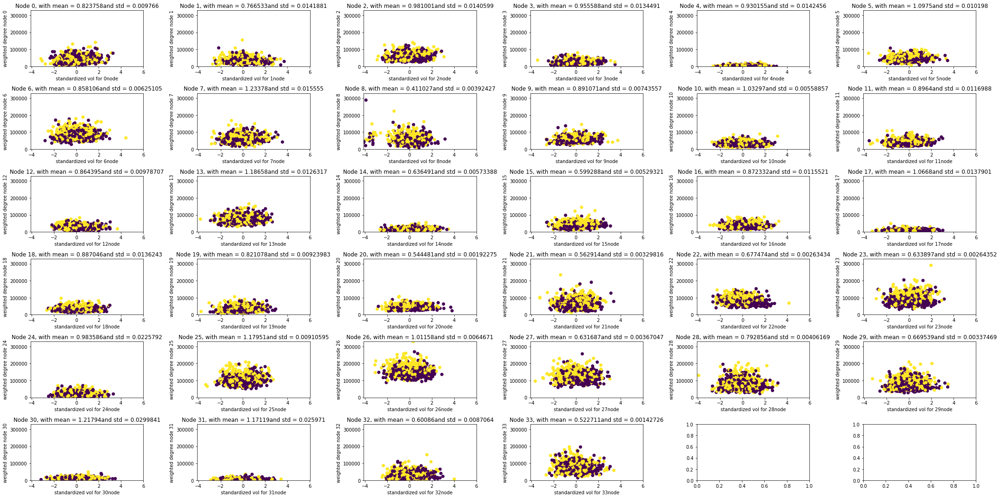

In [51]:
fig, ax = plt.subplots(6,6, figsize = (30,15))
for i in range(6):
    for j in range(6):
        if i == 5:
            if j == 4:
                break   

        ax[i, j].scatter(st_vol[np.ix_(subj_idx_un), idx[i,j]], wdeg[np.ix_(subj_idx_un),idx[i,j]], c= c)
        #ax[i, 1].scatter(st_vol[:, 34 + i], wdeg[:, 34+i])
        ax[i, j].set_title('Node ' + str(idx[i,j]) + ', with mean = ' + str(mean_vol[idx[i,j]]) + 'and std = ' + str(std_vol[idx[i,j]]))

        #ax[i, 1].set_title('Node ' + str(34 + i) + ', with mean = ' + str(mean_vol[34 +i]) +'and std = ' + str(std_vol[34 + i]))
        ax[i, j].set_xlabel('standardized vol for ' + str(idx[i,j]) + 'node')
        ax[i, j].set_ylabel('weighted degree node ' + str(idx[i,j]))
        #ax[i, 1].set_xlabel('standardized vol for ' + str(34 + i) + 'node')
        #ax[i, 1].set_ylabel('weighted degree node' + str(34 + i))
        ax[i, j].set_xlim([min_st_vol, max_st_vol])
        ax[i, j].set_ylim([min_wdeg, max_wdeg])
        #ax[i, 1].set_xlim([min_st_vol, max_st_vol])
        #ax[i, 1].set_ylim([min_wdeg, max_wdeg])
plt.tight_layout()
plt.savefig('vol_to_wdeg', dpi = 500)

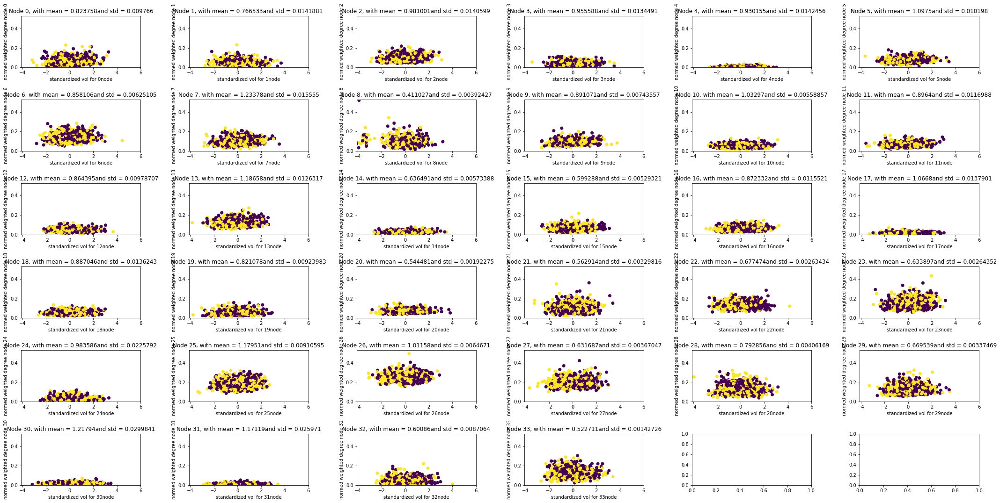

In [52]:
fig, ax = plt.subplots(6,6, figsize = (30,15))
for i in range(6):
    for j in range(6):
        if i == 5:
            if j == 4:
                break   

        ax[i, j].scatter(st_vol[np.ix_(subj_idx_un), idx[i,j]], norm_wdeg[np.ix_(subj_idx_un),idx[i,j]], c= c)
        #ax[i, 1].scatter(st_vol[:, 34 + i], norm_wdeg[:, 34+i])
        ax[i, j].set_title('Node ' + str(idx[i,j]) + ', with mean = ' + str(mean_vol[idx[i,j]]) + 'and std = ' + str(std_vol[idx[i,j]]))

        #ax[i, 1].set_title('Node ' + str(34 + i) + ', with mean = ' + str(mean_vol[34 +i]) +'and std = ' + str(std_vol[34 + i]))
        ax[i, j].set_xlabel('standardized vol for ' + str(idx[i,j]) + 'node')
        ax[i, j].set_ylabel('normed weighted degree node ' + str(idx[i,j]))
        #ax[i, 1].set_xlabel('standardized vol for ' + str(34 + i) + 'node')
        #ax[i, 1].set_ylabel('normed weighted degree node' + str(34 + i))
        ax[i, j].set_xlim([min_st_vol, max_st_vol])
        ax[i, j].set_ylim([min_norm_wdeg, max_norm_wdeg])
        #ax[i, 1].set_xlim([min_st_vol, max_st_vol])
        #ax[i, 1].set_ylim([min_norm_wdeg, max_norm_wdeg])
plt.tight_layout()
plt.savefig('vol_to_norm_wdeg', dpi = 500)

# all meshes to global

In [1]:
import numpy as np
import pandas as pd
import pickle

import os

from flexible_linear import FlexibleLinearRegression

from tv_utils import CustomTVReg, integration_mesh_to_tria, get_meshes_coord_tria, get_nodes_attribute
from data_load import load_meshes_coor_tria

from joblib import Parallel, delayed

from tv_utils import get_all_attr

from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV


path_data = "/nmnt/x01-hdd/HCP/data/"

with open(path_data + "mean_mesh_labels", 'rb') as f:
    mean_labels = pickle.load(f)

with open(path_data + "subjects_log_jac", 'rb') as f:
    log_jac = pickle.load(f)

with open(path_data + "subjects_thinkness", 'rb') as f:
    thinkness = pickle.load(f)

with open(path_data + "subjects_mesh_area", 'rb') as f:
    mesh_area = pickle.load(f)

with open(path_data + 'modularity', 'rb') as f:
    modularity = pickle.load(f)

    
thinkness = thinkness.reshape(789,-1)
log_jac = log_jac.reshape(789,-1)
mesh_area = mesh_area.reshape(789,-1)


path_res = '/home/ayagoz/connec/results/'
                   

coord, tria = load_meshes_coor_tria(path_data)

X = integration_mesh_to_tria(tria, thinkness)
X.shape

custom_tvl2 = CustomTVReg(data = tria, mode_reg= 'l2')
flexl2 = FlexibleLinearRegression(C=1e-8, reg_cost_func=custom_tvl2.tv_normed_cost_func)

path_res = '/nmnt/media/home/ayagoz/HCP/connec/results/tv/all_meshes_to_global/'


import time

from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
st = time.time()
X_train, X_test, y_train, y_test = train_test_split(X, modularity)
flexl2.fit(X_train, y_train)
print(time.time() - st)
r2_test = r2_score(y_test, flexl2.predict(X_test))
r2_train = r2_score(y_train, flexl2.predict(X_train))
data = pd.DataFrame(data =[r2_train, r2_test], columns=['train', 'test'])
data.to_csv(path_res + 'flexl2')

In [27]:
from sklearn.preprocessing import StandardScaler

In [57]:
i = 0

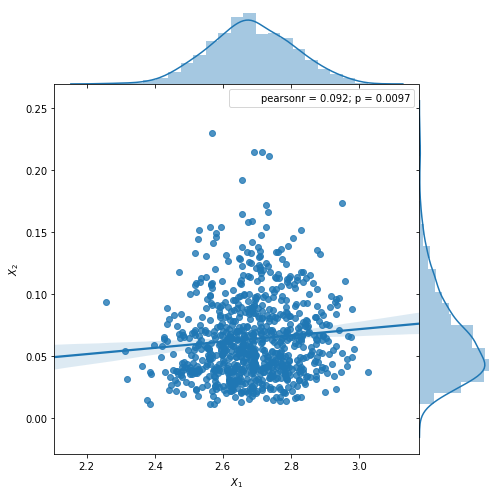

In [58]:

x1 = pd.Series(roi_think[:,i], name="$X_1$")
x2 = pd.Series(Y.sum(axis = -1)[:,i], name="$X_2$")

# Show the joint distribution using kernel density estimation
g = sns.jointplot(x1, x2, kind="reg", size=7, space=0)

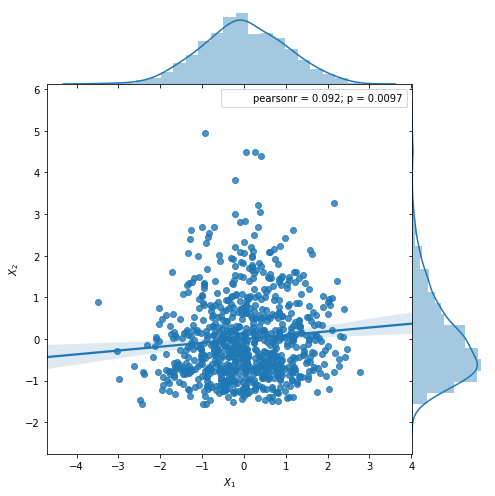

In [59]:
sc = StandardScaler()
st_roi_think = sc.fit_transform(roi_think)
st_wdeg = sc.fit_transform(Y.sum(axis = -1))
x1 = pd.Series(st_roi_think[:,i], name="$X_1$")
x2 = pd.Series(st_wdeg[:,i], name="$X_2$")

# Show the joint distribution using kernel density estimation
g = sns.jointplot(x1, x2, kind="reg", size=7, space=0)

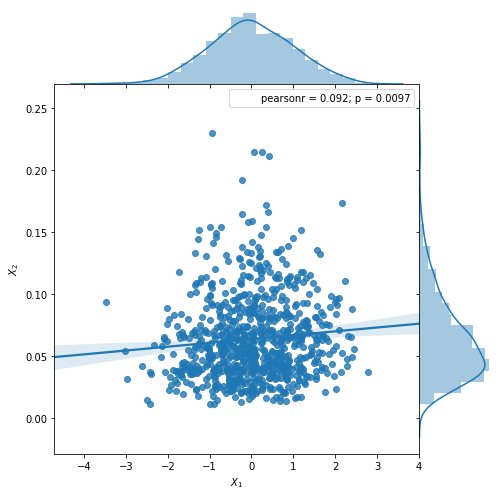

In [60]:
sc = StandardScaler()
st_roi_think = sc.fit_transform(roi_think)
st_wdeg = sc.fit_transform(Y.sum(axis = -1))
x1 = pd.Series(st_roi_think[:,i], name="$X_1$")
x2 = pd.Series(Y.sum(axis = -1)[:,i], name="$X_2$")

# Show the joint distribution using kernel density estimation
g = sns.jointplot(x1, x2, kind="reg", size=7, space=0)

In [72]:
data1 = pd.DataFrame(data = roi_think, columns=['roi_think' + str(i) for i in range(68)])
data2 = pd.DataFrame(data =  Y.sum(axis = -1), columns=['wdeg' + str(i) for i in range(68)])
data = pd.concat([data1,data2], axis = 1)


In [74]:
sns.pairplot(data, kind = 'reg', x_vars=['roi_think' + str(i) for i in range(68)], 
             y_vars=['wdeg' + str(i) for i in range(68)])

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


30


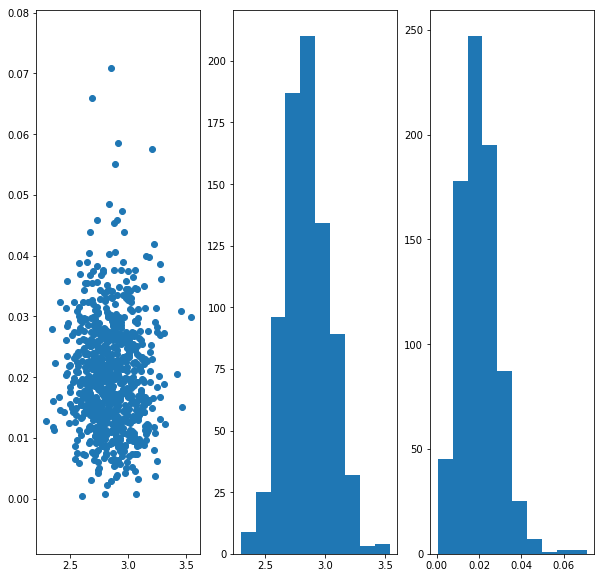

In [52]:
fig, ax = plt.subplots(1,3, figsize = (10,10))
i = np.random.randint(0, 68)
print(i)
ax[0].scatter(roi_think[:,i], Y.sum(axis = -1)[:,i])
ax[1].hist(roi_think[:,i])
ax[2].hist(Y.sum(axis = -1)[:,i]);

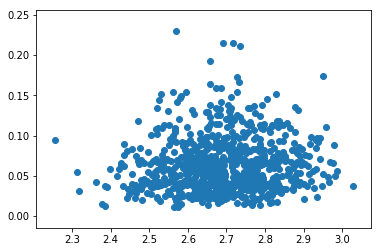

In [7]:
i = 0
plt.scatter(roi_think[:,i], Y.sum(axis = -1)[:,i]);

48


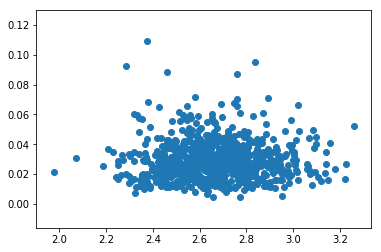

In [8]:
i = np.random.randint(0, 68)
print(i)
plt.scatter(roi_think[:,i], Y.sum(axis = -1)[:,i]);

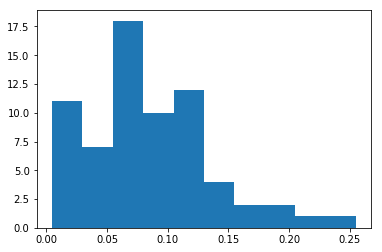

In [12]:
plt.hist(Y.sum(axis = -1).mean(axis = 0));

17


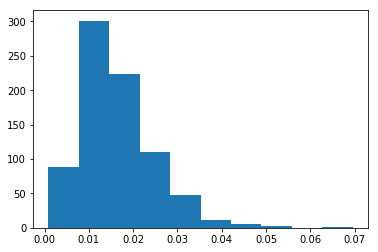

In [15]:
i = np.random.randint(0,68)
print(i)
plt.hist(Y.sum(axis = -1)[:,i]);

In [ ]:
fig, ax = plt.subplots(10,1, figsize = (200,180))
for i in range(10):
    ax[i].scatter(roi_think[:,i], Y.sum(axis = -1)[:,i])

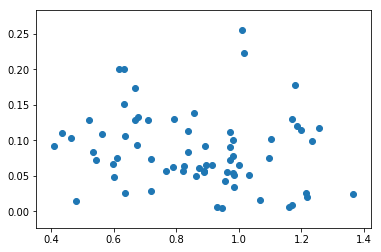

In [7]:
plt.scatter(roi_vol.mean(axis = 0), Y.sum(axis = -1).mean(axis = 0))

In [2]:
path_res = '/nmnt/media/home/ayagoz/HCP/connec/results/'
if not os.path.exists(path_res):
    os.mkdir(path_res)
path_res += 'tv/'
if not os.path.exists(path_res):
    os.mkdir(path_res)

In [3]:
path_res

'/nmnt/media/home/ayagoz/HCP/connec/results/tv/'

In [4]:
if not os.path.exists(path_res + 'node_to_node'):
    os.mkdir(path_res + 'node_to_node')
path_res += 'node_to_node/'

thinkness = thinkness.reshape(789,-1)
log_jac = log_jac.reshape(789,-1)
mesh_area = mesh_area.reshape(789,-1)

idx_nodes = list(range(1,4)) + list(range(5,39)) + list(range(40,71))
idx_nodes = np.array(idx_nodes)
print(idx_nodes.shape)
X = []
triangles = []
for i in range(68):
    node1 = idx_nodes[i]
    print(i)
    node1_tria = get_meshes_coord_tria(tria, mean_labels, node1)
    print(np.array(node1_tria).shape)
    triangles += [node1_tria] 
    T = integration_mesh_to_tria(node1_tria, thinkness)
    L = integration_mesh_to_tria(node1_tria, log_jac)
    M = integration_mesh_to_tria(node1_tria, mesh_area)
    X += [[T,L,M]]
    
print('I am here')

(68,)
0
(4015, 3)
1
(2598, 3)
2
(7167, 3)
3
(3086, 3)
4
(1421, 3)
5
(9167, 3)
6
(15365, 3)
7
(8516, 3)
8
(5598, 3)
9
(12392, 3)
10
(8057, 3)
11
(8116, 3)
12
(6253, 3)
13
(8617, 3)
14
(3029, 3)
15
(6368, 3)
16
(5901, 3)
17
(1763, 3)
18
(3885, 3)
19
(3591, 3)
20
(18418, 3)
21
(6358, 3)
22
(20975, 3)
23
(14240, 3)
24
(2575, 3)
25
(14289, 3)
26
(23890, 3)
27
(20503, 3)
28
(14128, 3)
29
(16869, 3)
30
(468, 3)
31
(1499, 3)
32
(1939, 3)
33
(11399, 3)
34
(4125, 3)
35
(3146, 3)
36
(6794, 3)
37
(3129, 3)
38
(1196, 3)
39
(8967, 3)
40
(18953, 3)
41
(8080, 3)
42
(5270, 3)
43
(11632, 3)
44
(8609, 3)
45
(7565, 3)
46
(5335, 3)
47
(9778, 3)
48
(2699, 3)
49
(7365, 3)
50
(4731, 3)
51
(1755, 3)
52
(4531, 3)
53
(3438, 3)
54
(17671, 3)
55
(5803, 3)
56
(20889, 3)
57
(15575, 3)
58
(1979, 3)
59
(15401, 3)
60
(23388, 3)
61
(19997, 3)
62
(13309, 3)
63
(15948, 3)
64
(674, 3)
65
(1371, 3)
66
(1414, 3)
67
(12168, 3)
I am here


In [29]:
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']
d = sorted([(x, sys.getsizeof(globals().get(x))) for x in dir() if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True)


In [54]:


name = ['think/', 'log_jac/', 'mesh_area/']
params = {'C':[1e-8],
         'cost_func': ['l2',]}


def main_worker(i, data, target, j, trian):
    node1 = idx_nodes[i]
    print(node1)
    custom_tvl1 = CustomTVReg(data = trian, mode_reg= 'l1')
    custom_tvl2 = CustomTVReg(data = trian, mode_reg= 'l2')

    flexl1 = FlexibleLinearRegression(C=1e-8, reg_cost_func=custom_tvl1.tv_normed_cost_func)
    flexl2 = FlexibleLinearRegression(C=1e-8, reg_cost_func=custom_tvl2.tv_normed_cost_func)
    grl1 = GridSearchCV(flexl1, param_grid=params, n_jobs=-1, scoring='r2', cv = 3)
    grl2 = GridSearchCV(flexl2, param_grid=params, n_jobs=-1, scoring='r2', cv = 3)

    for folder in name:
        if not os.path.exists(path_res + folder):
            os.mkdir(path_res + folder)

    print(data[0].shape, target[:,i].shape)



    for k in range(3):

        grl1.fit(data[k], target[:,i])
        grl2.fit(data[k], target[:,i])
        res_l1 = pd.DataFrame.from_dict(grl1.cv_results_)
        res_l1 = res_l1.sort_values(by = 'rank_test_score').iloc[:1]
        res_l1.to_csv(path_res + name[j] + 'tv_l1')

        res_l2 = pd.DataFrame.from_dict(grl2.cv_results_)
        res_l2 = res_l2.sort_values(by = 'rank_test_score').iloc[:1]
        res_l2.to_csv(path_res + name[j] + 'tv_l2')
    

In [ ]:
for j, target in enumerate(targets_data):
    print(targets_name[j])
    print(target.shape)
    Parallel(n_jobs=28)(delayed(main_worker)(i, target, j, triangles[i]) for i in range(68))
    print('Finished work for ' + targets_name[j])
print('I finished all')

In [55]:
%timeit
Parallel(n_jobs=1)(delayed(main_worker)(i, X[i] targets_data[i], i, triangles[i]) for i in range(1))

1
(789, 4015) (789,)


[None]

In [138]:
name = ['think/', 'log_jac/', 'mesh_area/']
params = {'C':[5*1e-5, ], 
         'cost_func': ['l2']}

custom_tvl2 = CustomTVReg(data = triangles[64], mode_reg= 'l2')
flexl2 = FlexibleLinearRegression(C=1e-8, reg_cost_func=custom_tvl2.tv_normed_cost_func)
grl2 = GridSearchCV(flexl2, param_grid=params, n_jobs=1, scoring='r2', cv = 2)

path_res = '/nmnt/media/home/ayagoz/HCP/connec/results/tv/node_to_node/'

for folder in name:
    if not os.path.exists(path_res + folder):
        os.mkdir(path_res + folder)

print(np.array(X[64]).shape, targets_data[0].shape)

import time

st = time.time()
grl2.fit(X[64][0], targets_data[0][:,64])

res_l2 = pd.DataFrame.from_dict(grl2.cv_results_)
    
print(time.time() - st)

In [146]:
res_l2.sort_values(by ='rank_test_score')

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_C,param_cost_func,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,0.872842,0.00062,-9.254394,-9.254077,5e-05,l2,"{'C': 5e-05, 'cost_func': 'l2'}",1,-9.504224,-9.00393,-9.00393,-9.504224,0.034681,0.000021,0.250146,0.250147
